In [1]:
import cv2
import numpy as np
from PIL import Image
import queue
import matplotlib.pyplot as plt

In [2]:
class Vertex:
    def __init__(self,x_coordinate,y_coordinate):
        self.x = x_coordinate
        self.y = y_coordinate
        self.xParent = None
        self.yParent = None
        self.processed = False
        self.queueIndex = None
        self.condition = None

In [3]:
def get_neighbors(mat, r, c):
    shape=mat.shape
    neighbors=[]
    #ensure neighbors are within image boundaries
    if r > 0 and not mat[r-1][c].processed and not mat[r-1][c].condition ==0:
        neighbors.append(mat[r-1][c])
    if r < shape[0] - 1 and not mat[r+1][c].processed and not mat[r+1][c].condition ==0:
        neighbors.append(mat[r+1][c])
    if c > 0 and not mat[r][c-1].processed and not mat[r][c-1].condition ==0:
        neighbors.append(mat[r][c-1])
    if c < shape[1] - 1 and not mat[r][c+1].processed and not mat[r][c+1].condition == 0:
        neighbors.append(mat[r][c+1])
    return neighbors

In [4]:
def path_from(matrix, x, y, xS, yS):
    path = []
    iter_v=matrix[y][x]
    path.append((x,y))
    while(iter_v.y!=yS or iter_v.x!=xS):
        path.append((iter_v.x,iter_v.y))
        iter_v=matrix[iter_v.yParent][iter_v.xParent]
    path.append((xS,yS))
    return path

In [5]:
def find_shortest_path_bfs(matrix, x_start, y_start, x_end, y_end):
    #assuming start and end are withing bounds
    #let 0 be black (can't visit)
    #let 1 be white (can visit)
    lenrows, lencols = matrix.shape
    print('rows', lenrows)
    print('cols', lencols)
    vectorMatrix = np.full((lenrows, lencols), None)
    for r in range(lenrows):
        for c in range(lencols):
            #print(matrix[0][0])
            vectorMatrix[r][c] = Vertex(c, r)
            vectorMatrix[r][c].condition = matrix[r][c]
    #vectorMatrix[y_start][x_start].condition = -1
    vectorMatrix[y_end][x_end].condition = -2
    queue = []
    queue.append((x_start, y_start))
    while len(queue) > 0:
        visiting_node = queue.pop(0)
        print('visiting', visiting_node[0], visiting_node[1])
        neighbors = get_neighbors(vectorMatrix, visiting_node[1], visiting_node[0])
        for neighbor in neighbors:
            neighbor.processed = True
            neighbor.xParent = visiting_node[0]
            neighbor.yParent = visiting_node[1]
            if neighbor.condition == -2:
                print('found')
                path = []
                iter_v=neighbor
                path.append((x_end,y_end))
                #print('itertype1')
                #print(type(iter_v))
                while(iter_v.y != y_start or iter_v.x != x_start):
                    path.append((iter_v.x,iter_v.y))
                    #print(iter_v.xParent)
                    #print(iter_v.yParent)
                    iter_v = vectorMatrix[iter_v.yParent][iter_v.xParent]
                    #print('itertype2')
                    #print(type(iter_v))
                    #print('test2')
                return path
            else:
                queue.append((neighbor.x, neighbor.y))
    return None

In [6]:
mat = np.array([
    [1,1,1,1,0,0,0,0,0,0,0],
    [0,1,0,1,0,0,0,0,0,0,0],
    [0,1,0,0,0,1,1,1,0,0,0],
    [0,1,0,0,0,1,0,1,0,0,0],
    [0,1,1,1,1,1,0,1,0,0,0],
    [0,1,0,0,0,0,0,1,0,0,0],
    [0,1,1,0,1,0,0,1,0,0,0],
    [0,0,1,1,1,0,1,1,0,0,0],
    [0,0,0,0,1,0,1,1,1,0,0],
    [0,0,0,1,1,0,0,0,-2,0,0],
])


In [7]:
path = find_shortest_path_bfs(mat, 0,0,8,9)

rows 10
cols 11
visiting 0 0
visiting 1 0
visiting 1 1
visiting 0 0
visiting 2 0
visiting 1 2
visiting 3 0
visiting 1 3
visiting 3 1
visiting 1 4
visiting 1 5
visiting 2 4
visiting 1 6
visiting 3 4
visiting 2 6
visiting 4 4
visiting 2 7
visiting 5 4
visiting 3 7
visiting 5 3
visiting 4 7
visiting 5 2
visiting 4 6
visiting 4 8
visiting 6 2
visiting 4 9
visiting 7 2
visiting 3 9
visiting 7 3
visiting 7 4
visiting 7 5
visiting 7 6
visiting 7 7
visiting 7 8
visiting 6 7
visiting 6 8
visiting 8 8
found


In [8]:
npArray = np.array( [ [77, 88, 99] , [31,42,63] , [11,22,33]])
npArray[0][0]

77

In [9]:
print(path)

[(8, 9), (8, 9), (8, 8), (7, 8), (7, 7), (7, 6), (7, 5), (7, 4), (7, 3), (7, 2), (6, 2), (5, 2), (5, 3), (5, 4), (4, 4), (3, 4), (2, 4), (1, 4), (1, 3), (1, 2), (1, 1), (1, 0)]


In [114]:
maze = cv2.imread('maze_images/simple_maze.png',0)
maze[10][50]

0

In [122]:
maze2 = cv2.imread('maze_images/simple_maze2.png', 0)
maze2.shape

(257, 389)

In [123]:
yes = find_shortest_path_bfs(maze2, 25, 25, 367, 245)

rows 257
cols 389
visiting 25 25
visiting 25 24
visiting 25 26
visiting 24 25
visiting 26 25
visiting 25 23
visiting 25 25
visiting 24 24
visiting 26 24
visiting 25 27
visiting 24 26
visiting 26 26
visiting 23 25
visiting 27 25
visiting 25 22
visiting 24 23
visiting 26 23
visiting 23 24
visiting 27 24
visiting 25 28
visiting 24 27
visiting 26 27
visiting 23 26
visiting 27 26
visiting 22 25
visiting 28 25
visiting 25 21
visiting 24 22
visiting 26 22
visiting 23 23
visiting 27 23
visiting 22 24
visiting 28 24
visiting 25 29
visiting 24 28
visiting 26 28
visiting 23 27
visiting 27 27
visiting 22 26
visiting 28 26
visiting 21 25
visiting 29 25
visiting 25 20
visiting 24 21
visiting 26 21
visiting 23 22
visiting 27 22
visiting 22 23
visiting 28 23
visiting 21 24
visiting 29 24
visiting 25 30
visiting 24 29
visiting 26 29
visiting 23 28
visiting 27 28
visiting 22 27
visiting 28 27
visiting 21 26
visiting 29 26
visiting 20 25
visiting 30 25
visiting 25 19
visiting 24 20
visiting 26 20
visitin

visiting 40 28
visiting 9 27
visiting 41 27
visiting 8 26
visiting 42 26
visiting 7 25
visiting 43 25
visiting 25 6
visiting 24 7
visiting 26 7
visiting 23 8
visiting 27 8
visiting 22 9
visiting 28 9
visiting 21 10
visiting 29 10
visiting 20 11
visiting 30 11
visiting 19 12
visiting 31 12
visiting 18 13
visiting 32 13
visiting 17 14
visiting 33 14
visiting 16 15
visiting 34 15
visiting 15 16
visiting 35 16
visiting 14 17
visiting 36 17
visiting 13 18
visiting 37 18
visiting 12 19
visiting 38 19
visiting 11 20
visiting 39 20
visiting 10 21
visiting 40 21
visiting 9 22
visiting 41 22
visiting 8 23
visiting 42 23
visiting 7 24
visiting 43 24
visiting 25 44
visiting 24 43
visiting 26 43
visiting 23 42
visiting 27 42
visiting 22 41
visiting 28 41
visiting 21 40
visiting 29 40
visiting 20 39
visiting 30 39
visiting 19 38
visiting 31 38
visiting 18 37
visiting 32 37
visiting 17 36
visiting 33 36
visiting 16 35
visiting 34 35
visiting 15 34
visiting 35 34
visiting 14 33
visiting 36 33
visiting

visiting 33 1
visiting 16 2
visiting 34 2
visiting 15 3
visiting 35 3
visiting 14 4
visiting 13 5
visiting 12 6
visiting 11 7
visiting 10 8
visiting 40 8
visiting 9 9
visiting 41 9
visiting 8 10
visiting 42 10
visiting 7 11
visiting 43 11
visiting 6 12
visiting 44 12
visiting 5 13
visiting 45 13
visiting 46 14
visiting 47 15
visiting 48 16
visiting 49 17
visiting 50 18
visiting 51 19
visiting 52 20
visiting 53 21
visiting 54 22
visiting 55 23
visiting 56 24
visiting 25 57
visiting 24 56
visiting 26 56
visiting 23 55
visiting 27 55
visiting 22 54
visiting 28 54
visiting 21 53
visiting 29 53
visiting 20 52
visiting 30 52
visiting 19 51
visiting 31 51
visiting 18 50
visiting 32 50
visiting 17 49
visiting 33 49
visiting 16 48
visiting 34 48
visiting 15 47
visiting 35 47
visiting 14 46
visiting 36 46
visiting 13 45
visiting 37 45
visiting 12 44
visiting 38 44
visiting 11 43
visiting 39 43
visiting 10 42
visiting 40 42
visiting 9 41
visiting 41 41
visiting 8 40
visiting 42 40
visiting 7 39
v

visiting 63 17
visiting 64 18
visiting 65 19
visiting 66 20
visiting 67 21
visiting 68 22
visiting 69 23
visiting 70 24
visiting 25 71
visiting 24 70
visiting 26 70
visiting 23 69
visiting 27 69
visiting 22 68
visiting 28 68
visiting 21 67
visiting 29 67
visiting 20 66
visiting 30 66
visiting 19 65
visiting 31 65
visiting 18 64
visiting 32 64
visiting 17 63
visiting 33 63
visiting 16 62
visiting 34 62
visiting 15 61
visiting 35 61
visiting 14 60
visiting 36 60
visiting 13 59
visiting 12 58
visiting 11 57
visiting 10 56
visiting 9 55
visiting 8 54
visiting 7 53
visiting 6 52
visiting 5 51
visiting 46 50
visiting 47 49
visiting 48 48
visiting 49 47
visiting 50 46
visiting 51 45
visiting 52 44
visiting 53 43
visiting 54 42
visiting 55 41
visiting 56 40
visiting 57 39
visiting 58 38
visiting 59 37
visiting 60 36
visiting 61 35
visiting 62 34
visiting 63 33
visiting 64 32
visiting 65 31
visiting 66 30
visiting 67 29
visiting 68 28
visiting 69 27
visiting 70 26
visiting 71 25
visiting 3 0
vi

visiting 10 71
visiting 9 70
visiting 8 69
visiting 7 68
visiting 6 67
visiting 5 66
visiting 61 50
visiting 62 49
visiting 63 48
visiting 64 47
visiting 65 46
visiting 66 45
visiting 67 44
visiting 68 43
visiting 69 42
visiting 70 41
visiting 71 40
visiting 72 39
visiting 73 38
visiting 74 37
visiting 75 36
visiting 76 35
visiting 77 34
visiting 78 33
visiting 79 32
visiting 80 31
visiting 81 30
visiting 82 29
visiting 83 28
visiting 84 27
visiting 85 26
visiting 86 25
visiting 70 8
visiting 71 9
visiting 72 10
visiting 73 11
visiting 74 12
visiting 75 13
visiting 76 14
visiting 77 15
visiting 78 16
visiting 79 17
visiting 80 18
visiting 81 19
visiting 82 20
visiting 83 21
visiting 84 22
visiting 85 23
visiting 86 24
visiting 25 87
visiting 24 86
visiting 26 86
visiting 23 85
visiting 27 85
visiting 22 84
visiting 28 84
visiting 21 83
visiting 29 83
visiting 20 82
visiting 30 82
visiting 19 81
visiting 31 81
visiting 18 80
visiting 32 80
visiting 17 79
visiting 33 79
visiting 16 78
vi

visiting 18 96
visiting 32 96
visiting 17 95
visiting 33 95
visiting 16 94
visiting 34 94
visiting 15 93
visiting 35 93
visiting 14 92
visiting 36 92
visiting 13 91
visiting 12 90
visiting 11 89
visiting 10 88
visiting 9 87
visiting 8 86
visiting 7 85
visiting 6 84
visiting 5 83
visiting 78 50
visiting 79 49
visiting 80 48
visiting 81 47
visiting 82 46
visiting 83 45
visiting 84 44
visiting 85 43
visiting 86 42
visiting 87 41
visiting 88 40
visiting 89 39
visiting 90 38
visiting 91 37
visiting 92 36
visiting 93 35
visiting 94 34
visiting 95 33
visiting 96 32
visiting 97 31
visiting 98 30
visiting 99 29
visiting 100 28
visiting 101 27
visiting 102 26
visiting 103 25
visiting 87 8
visiting 88 9
visiting 89 10
visiting 90 11
visiting 91 12
visiting 92 13
visiting 93 14
visiting 94 15
visiting 95 16
visiting 96 17
visiting 97 18
visiting 98 19
visiting 99 20
visiting 100 21
visiting 101 22
visiting 102 23
visiting 103 24
visiting 25 104
visiting 24 103
visiting 26 103
visiting 23 102
visit

visiting 109 17
visiting 110 18
visiting 111 19
visiting 112 20
visiting 113 21
visiting 114 22
visiting 25 117
visiting 24 116
visiting 26 116
visiting 23 115
visiting 27 115
visiting 22 114
visiting 28 114
visiting 21 113
visiting 29 113
visiting 20 112
visiting 30 112
visiting 19 111
visiting 31 111
visiting 18 110
visiting 32 110
visiting 17 109
visiting 33 109
visiting 16 108
visiting 34 108
visiting 15 107
visiting 35 107
visiting 14 106
visiting 36 106
visiting 13 105
visiting 12 104
visiting 11 103
visiting 10 102
visiting 9 101
visiting 8 100
visiting 7 99
visiting 6 98
visiting 5 97
visiting 80 62
visiting 79 61
visiting 81 61
visiting 82 60
visiting 83 59
visiting 84 58
visiting 85 57
visiting 86 56
visiting 87 55
visiting 88 54
visiting 89 53
visiting 90 52
visiting 91 51
visiting 92 50
visiting 93 49
visiting 94 48
visiting 95 47
visiting 96 46
visiting 97 45
visiting 98 44
visiting 99 43
visiting 100 42
visiting 101 41
visiting 102 40
visiting 103 39
visiting 104 38
visit

visiting 41 112
visiting 8 111
visiting 42 111
visiting 7 110
visiting 6 109
visiting 5 108
visiting 80 73
visiting 79 72
visiting 81 72
visiting 78 71
visiting 82 71
visiting 77 70
visiting 83 70
visiting 76 69
visiting 84 69
visiting 75 68
visiting 85 68
visiting 74 67
visiting 86 67
visiting 73 66
visiting 87 66
visiting 72 65
visiting 88 65
visiting 71 64
visiting 89 64
visiting 70 63
visiting 90 63
visiting 69 62
visiting 91 62
visiting 68 61
visiting 92 61
visiting 93 60
visiting 94 59
visiting 95 58
visiting 96 57
visiting 97 56
visiting 98 55
visiting 99 54
visiting 100 53
visiting 101 52
visiting 102 51
visiting 103 50
visiting 104 49
visiting 105 48
visiting 106 47
visiting 107 46
visiting 108 45
visiting 109 44
visiting 110 43
visiting 111 42
visiting 112 41
visiting 113 40
visiting 114 39
visiting 112 8
visiting 113 9
visiting 114 10
visiting 25 129
visiting 24 128
visiting 26 128
visiting 23 127
visiting 27 127
visiting 22 126
visiting 28 126
visiting 21 125
visiting 29 12

visiting 40 124
visiting 9 123
visiting 41 123
visiting 8 122
visiting 42 122
visiting 7 121
visiting 43 121
visiting 6 120
visiting 44 120
visiting 5 119
visiting 45 119
visiting 46 118
visiting 47 117
visiting 48 116
visiting 49 115
visiting 50 114
visiting 51 113
visiting 52 112
visiting 53 111
visiting 80 84
visiting 79 83
visiting 81 83
visiting 78 82
visiting 82 82
visiting 77 81
visiting 83 81
visiting 76 80
visiting 84 80
visiting 75 79
visiting 85 79
visiting 74 78
visiting 86 78
visiting 73 77
visiting 87 77
visiting 72 76
visiting 88 76
visiting 71 75
visiting 89 75
visiting 70 74
visiting 90 74
visiting 69 73
visiting 91 73
visiting 68 72
visiting 92 72
visiting 67 71
visiting 93 71
visiting 66 70
visiting 94 70
visiting 65 69
visiting 95 69
visiting 64 68
visiting 96 68
visiting 63 67
visiting 97 67
visiting 62 66
visiting 98 66
visiting 61 65
visiting 99 65
visiting 60 64
visiting 100 64
visiting 59 63
visiting 101 63
visiting 58 62
visiting 102 62
visiting 57 61
visiting

visiting 111 63
visiting 48 62
visiting 112 62
visiting 47 61
visiting 113 61
visiting 114 60
visiting 25 150
visiting 24 149
visiting 26 149
visiting 23 148
visiting 27 148
visiting 22 147
visiting 28 147
visiting 21 146
visiting 29 146
visiting 20 145
visiting 30 145
visiting 19 144
visiting 31 144
visiting 18 143
visiting 32 143
visiting 17 142
visiting 33 142
visiting 16 141
visiting 34 141
visiting 15 140
visiting 35 140
visiting 14 139
visiting 36 139
visiting 13 138
visiting 37 138
visiting 12 137
visiting 38 137
visiting 11 136
visiting 39 136
visiting 10 135
visiting 40 135
visiting 9 134
visiting 41 134
visiting 8 133
visiting 42 133
visiting 7 132
visiting 43 132
visiting 6 131
visiting 44 131
visiting 5 130
visiting 45 130
visiting 46 129
visiting 47 128
visiting 48 127
visiting 49 126
visiting 50 125
visiting 51 124
visiting 52 123
visiting 53 122
visiting 54 121
visiting 55 120
visiting 56 119
visiting 57 118
visiting 58 117
visiting 59 116
visiting 60 115
visiting 61 114

visiting 106 78
visiting 53 77
visiting 107 77
visiting 52 76
visiting 108 76
visiting 51 75
visiting 109 75
visiting 50 74
visiting 110 74
visiting 49 73
visiting 111 73
visiting 48 72
visiting 112 72
visiting 47 71
visiting 113 71
visiting 46 70
visiting 114 70
visiting 16 151
visiting 34 151
visiting 15 150
visiting 35 150
visiting 14 149
visiting 36 149
visiting 13 148
visiting 37 148
visiting 12 147
visiting 38 147
visiting 11 146
visiting 39 146
visiting 10 145
visiting 40 145
visiting 9 144
visiting 41 144
visiting 8 143
visiting 42 143
visiting 7 142
visiting 43 142
visiting 6 141
visiting 44 141
visiting 5 140
visiting 45 140
visiting 46 139
visiting 47 138
visiting 48 137
visiting 49 136
visiting 50 135
visiting 51 134
visiting 52 133
visiting 53 132
visiting 54 131
visiting 55 130
visiting 56 129
visiting 57 128
visiting 58 127
visiting 59 126
visiting 60 125
visiting 61 124
visiting 62 123
visiting 63 122
visiting 64 121
visiting 65 120
visiting 66 119
visiting 67 118
visit

visiting 70 128
visiting 71 127
visiting 72 126
visiting 62 100
visiting 98 100
visiting 61 99
visiting 99 99
visiting 60 98
visiting 100 98
visiting 59 97
visiting 101 97
visiting 58 96
visiting 102 96
visiting 57 95
visiting 103 95
visiting 56 94
visiting 104 94
visiting 55 93
visiting 105 93
visiting 54 92
visiting 106 92
visiting 53 91
visiting 107 91
visiting 52 90
visiting 108 90
visiting 51 89
visiting 109 89
visiting 50 88
visiting 110 88
visiting 49 87
visiting 111 87
visiting 48 86
visiting 112 86
visiting 47 85
visiting 113 85
visiting 46 84
visiting 114 84
visiting 41 158
visiting 42 157
visiting 43 156
visiting 44 155
visiting 45 154
visiting 46 153
visiting 47 152
visiting 48 151
visiting 49 150
visiting 50 149
visiting 51 148
visiting 52 147
visiting 53 146
visiting 54 145
visiting 55 144
visiting 56 143
visiting 57 142
visiting 58 141
visiting 59 140
visiting 60 139
visiting 61 138
visiting 62 137
visiting 63 136
visiting 64 135
visiting 65 134
visiting 66 133
visiting 

visiting 38 175
visiting 44 175
visiting 37 174
visiting 45 174
visiting 36 173
visiting 46 173
visiting 35 172
visiting 47 172
visiting 34 171
visiting 48 171
visiting 33 170
visiting 49 170
visiting 32 169
visiting 50 169
visiting 31 168
visiting 51 168
visiting 30 167
visiting 52 167
visiting 29 166
visiting 53 166
visiting 28 165
visiting 54 165
visiting 27 164
visiting 55 164
visiting 26 163
visiting 56 163
visiting 57 162
visiting 58 161
visiting 59 160
visiting 60 159
visiting 61 158
visiting 62 157
visiting 63 156
visiting 64 155
visiting 65 154
visiting 66 153
visiting 67 152
visiting 68 151
visiting 69 150
visiting 70 149
visiting 71 148
visiting 72 147
visiting 41 179
visiting 40 178
visiting 42 178
visiting 39 177
visiting 43 177
visiting 38 176
visiting 44 176
visiting 37 175
visiting 45 175
visiting 36 174
visiting 46 174
visiting 35 173
visiting 47 173
visiting 34 172
visiting 48 172
visiting 33 171
visiting 49 171
visiting 32 170
visiting 50 170
visiting 31 169
visiting

visiting 29 180
visiting 53 180
visiting 28 179
visiting 54 179
visiting 27 178
visiting 55 178
visiting 26 177
visiting 56 177
visiting 25 176
visiting 57 176
visiting 24 175
visiting 58 175
visiting 23 174
visiting 59 174
visiting 22 173
visiting 60 173
visiting 21 172
visiting 61 172
visiting 20 171
visiting 62 171
visiting 19 170
visiting 63 170
visiting 18 169
visiting 64 169
visiting 17 168
visiting 65 168
visiting 16 167
visiting 66 167
visiting 15 166
visiting 67 166
visiting 14 165
visiting 68 165
visiting 13 164
visiting 69 164
visiting 12 163
visiting 70 163
visiting 71 162
visiting 72 161
visiting 73 160
visiting 74 159
visiting 75 158
visiting 76 157
visiting 41 193
visiting 40 192
visiting 42 192
visiting 39 191
visiting 43 191
visiting 38 190
visiting 44 190
visiting 37 189
visiting 45 189
visiting 36 188
visiting 46 188
visiting 35 187
visiting 47 187
visiting 34 186
visiting 48 186
visiting 33 185
visiting 49 185
visiting 32 184
visiting 50 184
visiting 31 183
visiting

visiting 91 157
visiting 41 208
visiting 40 207
visiting 42 207
visiting 39 206
visiting 43 206
visiting 38 205
visiting 37 204
visiting 36 203
visiting 35 202
visiting 34 201
visiting 33 200
visiting 32 199
visiting 31 198
visiting 30 197
visiting 29 196
visiting 28 195
visiting 27 194
visiting 55 194
visiting 26 193
visiting 56 193
visiting 25 192
visiting 57 192
visiting 24 191
visiting 58 191
visiting 23 190
visiting 59 190
visiting 22 189
visiting 60 189
visiting 21 188
visiting 61 188
visiting 20 187
visiting 62 187
visiting 19 186
visiting 63 186
visiting 18 185
visiting 64 185
visiting 17 184
visiting 65 184
visiting 16 183
visiting 66 183
visiting 15 182
visiting 67 182
visiting 14 181
visiting 68 181
visiting 13 180
visiting 69 180
visiting 12 179
visiting 70 179
visiting 11 178
visiting 71 178
visiting 10 177
visiting 72 177
visiting 9 176
visiting 73 176
visiting 8 175
visiting 74 175
visiting 7 174
visiting 75 174
visiting 6 173
visiting 76 173
visiting 5 172
visiting 77 1

visiting 103 158
visiting 81 134
visiting 82 135
visiting 83 136
visiting 84 137
visiting 85 138
visiting 86 139
visiting 87 140
visiting 88 141
visiting 89 142
visiting 90 143
visiting 91 144
visiting 92 145
visiting 93 146
visiting 94 147
visiting 95 148
visiting 96 149
visiting 97 150
visiting 98 151
visiting 99 152
visiting 100 153
visiting 101 154
visiting 102 155
visiting 103 156
visiting 104 157
visiting 41 221
visiting 40 220
visiting 42 220
visiting 39 219
visiting 43 219
visiting 38 218
visiting 44 218
visiting 37 217
visiting 45 217
visiting 36 216
visiting 46 216
visiting 35 215
visiting 47 215
visiting 34 214
visiting 48 214
visiting 33 213
visiting 49 213
visiting 32 212
visiting 50 212
visiting 31 211
visiting 51 211
visiting 30 210
visiting 52 210
visiting 29 209
visiting 53 209
visiting 28 208
visiting 54 208
visiting 27 207
visiting 55 207
visiting 26 206
visiting 56 206
visiting 25 205
visiting 24 204
visiting 23 203
visiting 22 202
visiting 21 201
visiting 20 200
vi

visiting 94 177
visiting 95 176
visiting 96 175
visiting 97 174
visiting 98 173
visiting 99 172
visiting 100 171
visiting 101 170
visiting 102 169
visiting 103 168
visiting 104 167
visiting 105 166
visiting 106 165
visiting 107 164
visiting 108 163
visiting 109 162
visiting 110 161
visiting 111 160
visiting 112 159
visiting 113 158
visiting 81 124
visiting 82 125
visiting 83 126
visiting 84 127
visiting 85 128
visiting 86 129
visiting 87 130
visiting 88 131
visiting 89 132
visiting 90 133
visiting 91 134
visiting 92 135
visiting 93 136
visiting 94 137
visiting 95 138
visiting 96 139
visiting 97 140
visiting 98 141
visiting 99 142
visiting 100 143
visiting 101 144
visiting 102 145
visiting 103 146
visiting 104 147
visiting 105 148
visiting 106 149
visiting 107 150
visiting 108 151
visiting 109 152
visiting 110 153
visiting 111 154
visiting 112 155
visiting 113 156
visiting 41 231
visiting 40 230
visiting 42 230
visiting 39 229
visiting 43 229
visiting 38 228
visiting 44 228
visiting 37 

visiting 63 216
visiting 18 215
visiting 64 215
visiting 17 214
visiting 65 214
visiting 16 213
visiting 66 213
visiting 15 212
visiting 67 212
visiting 14 211
visiting 68 211
visiting 13 210
visiting 69 210
visiting 12 209
visiting 70 209
visiting 11 208
visiting 71 208
visiting 10 207
visiting 72 207
visiting 9 206
visiting 73 206
visiting 8 205
visiting 7 204
visiting 6 203
visiting 5 202
visiting 85 194
visiting 86 193
visiting 87 192
visiting 88 191
visiting 89 190
visiting 90 189
visiting 91 188
visiting 92 187
visiting 93 186
visiting 94 185
visiting 95 184
visiting 96 183
visiting 97 182
visiting 98 181
visiting 99 180
visiting 100 179
visiting 101 178
visiting 102 177
visiting 103 176
visiting 104 175
visiting 105 174
visiting 106 173
visiting 107 172
visiting 108 171
visiting 109 170
visiting 110 169
visiting 111 168
visiting 112 167
visiting 113 166
visiting 81 116
visiting 82 117
visiting 83 118
visiting 84 119
visiting 85 120
visiting 86 121
visiting 87 122
visiting 88 123

visiting 115 141
visiting 116 142
visiting 117 143
visiting 118 144
visiting 119 145
visiting 120 146
visiting 121 147
visiting 41 248
visiting 40 247
visiting 42 247
visiting 39 246
visiting 43 246
visiting 38 245
visiting 44 245
visiting 37 244
visiting 45 244
visiting 36 243
visiting 46 243
visiting 35 242
visiting 47 242
visiting 34 241
visiting 48 241
visiting 33 240
visiting 49 240
visiting 32 239
visiting 50 239
visiting 31 238
visiting 51 238
visiting 30 237
visiting 52 237
visiting 29 236
visiting 53 236
visiting 28 235
visiting 54 235
visiting 27 234
visiting 55 234
visiting 26 233
visiting 56 233
visiting 25 232
visiting 57 232
visiting 24 231
visiting 58 231
visiting 23 230
visiting 59 230
visiting 22 229
visiting 60 229
visiting 21 228
visiting 61 228
visiting 20 227
visiting 62 227
visiting 19 226
visiting 63 226
visiting 18 225
visiting 64 225
visiting 17 224
visiting 65 224
visiting 16 223
visiting 66 223
visiting 15 222
visiting 67 222
visiting 14 221
visiting 68 221
v

visiting 28 245
visiting 54 245
visiting 27 244
visiting 55 244
visiting 26 243
visiting 56 243
visiting 25 242
visiting 57 242
visiting 24 241
visiting 58 241
visiting 23 240
visiting 59 240
visiting 22 239
visiting 60 239
visiting 21 238
visiting 61 238
visiting 20 237
visiting 62 237
visiting 19 236
visiting 63 236
visiting 18 235
visiting 64 235
visiting 17 234
visiting 65 234
visiting 16 233
visiting 66 233
visiting 15 232
visiting 67 232
visiting 14 231
visiting 68 231
visiting 13 230
visiting 69 230
visiting 12 229
visiting 70 229
visiting 11 228
visiting 71 228
visiting 10 227
visiting 72 227
visiting 9 226
visiting 73 226
visiting 8 225
visiting 74 225
visiting 7 224
visiting 75 224
visiting 6 223
visiting 76 223
visiting 5 222
visiting 77 222
visiting 78 221
visiting 79 220
visiting 80 219
visiting 81 218
visiting 82 217
visiting 83 216
visiting 84 215
visiting 85 214
visiting 86 213
visiting 87 212
visiting 88 211
visiting 89 210
visiting 90 209
visiting 91 208
visiting 92 2

visiting 129 135
visiting 130 136
visiting 131 137
visiting 132 138
visiting 133 139
visiting 134 140
visiting 135 141
visiting 136 142
visiting 137 143
visiting 138 144
visiting 139 145
visiting 140 146
visiting 141 147
visiting 21 248
visiting 61 248
visiting 20 247
visiting 62 247
visiting 19 246
visiting 63 246
visiting 18 245
visiting 64 245
visiting 17 244
visiting 65 244
visiting 16 243
visiting 66 243
visiting 15 242
visiting 67 242
visiting 14 241
visiting 68 241
visiting 13 240
visiting 69 240
visiting 12 239
visiting 70 239
visiting 11 238
visiting 71 238
visiting 10 237
visiting 72 237
visiting 9 236
visiting 73 236
visiting 8 235
visiting 74 235
visiting 7 234
visiting 75 234
visiting 6 233
visiting 76 233
visiting 5 232
visiting 77 232
visiting 78 231
visiting 79 230
visiting 80 229
visiting 81 228
visiting 82 227
visiting 83 226
visiting 84 225
visiting 85 224
visiting 86 223
visiting 87 222
visiting 88 221
visiting 89 220
visiting 90 219
visiting 91 218
visiting 92 217


visiting 110 213
visiting 111 212
visiting 112 211
visiting 113 210
visiting 114 209
visiting 115 208
visiting 116 207
visiting 117 206
visiting 120 111
visiting 121 112
visiting 122 113
visiting 123 114
visiting 124 115
visiting 125 116
visiting 126 117
visiting 127 118
visiting 128 119
visiting 129 120
visiting 130 121
visiting 131 122
visiting 132 123
visiting 133 124
visiting 134 125
visiting 135 126
visiting 136 127
visiting 137 128
visiting 138 129
visiting 139 130
visiting 140 131
visiting 141 132
visiting 142 133
visiting 143 134
visiting 144 135
visiting 145 136
visiting 146 137
visiting 147 138
visiting 148 139
visiting 149 140
visiting 150 141
visiting 151 142
visiting 6 248
visiting 76 248
visiting 5 247
visiting 77 247
visiting 78 246
visiting 79 245
visiting 80 244
visiting 81 243
visiting 82 242
visiting 83 241
visiting 84 240
visiting 85 239
visiting 86 238
visiting 87 237
visiting 88 236
visiting 89 235
visiting 90 234
visiting 91 233
visiting 92 232
visiting 93 231
vi

visiting 137 114
visiting 138 115
visiting 139 116
visiting 140 117
visiting 141 118
visiting 142 119
visiting 143 120
visiting 144 121
visiting 145 122
visiting 146 123
visiting 147 124
visiting 148 125
visiting 149 126
visiting 150 127
visiting 151 128
visiting 90 248
visiting 91 247
visiting 92 246
visiting 93 245
visiting 94 244
visiting 95 243
visiting 96 242
visiting 97 241
visiting 98 240
visiting 99 239
visiting 100 238
visiting 101 237
visiting 102 236
visiting 103 235
visiting 104 234
visiting 105 233
visiting 106 232
visiting 107 231
visiting 108 230
visiting 109 229
visiting 110 228
visiting 111 227
visiting 112 226
visiting 113 225
visiting 114 224
visiting 115 223
visiting 116 222
visiting 117 221
visiting 118 220
visiting 119 219
visiting 120 218
visiting 121 217
visiting 122 216
visiting 123 215
visiting 124 214
visiting 125 213
visiting 126 212
visiting 127 211
visiting 128 210
visiting 129 209
visiting 130 208
visiting 131 207
visiting 122 196
visiting 121 197
visitin

visiting 121 233
visiting 122 232
visiting 123 231
visiting 124 230
visiting 125 229
visiting 126 228
visiting 127 227
visiting 128 226
visiting 129 225
visiting 130 224
visiting 131 223
visiting 132 222
visiting 133 221
visiting 134 220
visiting 135 219
visiting 136 218
visiting 137 217
visiting 138 216
visiting 139 215
visiting 140 214
visiting 141 213
visiting 142 212
visiting 143 211
visiting 144 210
visiting 145 209
visiting 146 208
visiting 147 207
visiting 122 180
visiting 121 181
visiting 123 181
visiting 124 182
visiting 125 183
visiting 126 184
visiting 127 185
visiting 128 186
visiting 129 187
visiting 130 188
visiting 131 189
visiting 132 190
visiting 133 191
visiting 134 192
visiting 135 193
visiting 136 194
visiting 137 195
visiting 138 196
visiting 139 197
visiting 140 198
visiting 141 199
visiting 142 200
visiting 143 201
visiting 144 202
visiting 145 203
visiting 146 204
visiting 147 205
visiting 148 206
visiting 151 111
visiting 107 248
visiting 108 247
visiting 109 2

visiting 155 197
visiting 156 198
visiting 157 199
visiting 158 200
visiting 123 248
visiting 124 247
visiting 125 246
visiting 126 245
visiting 127 244
visiting 128 243
visiting 129 242
visiting 130 241
visiting 131 240
visiting 132 239
visiting 133 238
visiting 134 237
visiting 135 236
visiting 136 235
visiting 137 234
visiting 138 233
visiting 139 232
visiting 140 231
visiting 141 230
visiting 142 229
visiting 143 228
visiting 144 227
visiting 145 226
visiting 146 225
visiting 147 224
visiting 148 223
visiting 149 222
visiting 150 221
visiting 151 220
visiting 122 163
visiting 121 164
visiting 123 164
visiting 124 165
visiting 125 166
visiting 126 167
visiting 127 168
visiting 128 169
visiting 129 170
visiting 130 171
visiting 131 172
visiting 132 173
visiting 133 174
visiting 134 175
visiting 135 176
visiting 136 177
visiting 137 178
visiting 138 179
visiting 139 180
visiting 140 181
visiting 141 182
visiting 142 183
visiting 143 184
visiting 144 185
visiting 145 186
visiting 146 1

visiting 169 204
visiting 170 203
visiting 171 202
visiting 172 201
visiting 173 200
visiting 138 248
visiting 139 247
visiting 140 246
visiting 141 245
visiting 142 244
visiting 143 243
visiting 144 242
visiting 145 241
visiting 146 240
visiting 147 239
visiting 148 238
visiting 149 237
visiting 150 236
visiting 151 235
visiting 133 159
visiting 134 160
visiting 135 161
visiting 136 162
visiting 137 163
visiting 138 164
visiting 139 165
visiting 140 166
visiting 141 167
visiting 142 168
visiting 143 169
visiting 144 170
visiting 145 171
visiting 146 172
visiting 147 173
visiting 148 174
visiting 149 175
visiting 150 176
visiting 151 177
visiting 152 178
visiting 153 179
visiting 154 180
visiting 155 181
visiting 156 182
visiting 157 183
visiting 158 184
visiting 159 185
visiting 160 186
visiting 161 187
visiting 162 188
visiting 163 189
visiting 164 190
visiting 165 191
visiting 166 192
visiting 167 193
visiting 168 194
visiting 169 195
visiting 170 196
visiting 171 197
visiting 172 1

visiting 153 168
visiting 154 169
visiting 155 170
visiting 156 171
visiting 157 172
visiting 158 173
visiting 159 174
visiting 160 175
visiting 161 176
visiting 162 177
visiting 163 178
visiting 164 179
visiting 165 180
visiting 166 181
visiting 167 182
visiting 168 183
visiting 169 184
visiting 170 185
visiting 171 186
visiting 172 187
visiting 173 188
visiting 174 189
visiting 175 190
visiting 176 191
visiting 177 192
visiting 178 193
visiting 179 194
visiting 180 195
visiting 181 196
visiting 182 197
visiting 183 198
visiting 184 199
visiting 160 225
visiting 161 224
visiting 162 223
visiting 163 222
visiting 164 221
visiting 165 220
visiting 166 219
visiting 167 218
visiting 168 217
visiting 169 216
visiting 170 215
visiting 171 214
visiting 172 213
visiting 173 212
visiting 174 211
visiting 175 210
visiting 176 209
visiting 177 208
visiting 178 207
visiting 179 206
visiting 180 205
visiting 181 204
visiting 182 203
visiting 183 202
visiting 184 201
visiting 185 200
visiting 150 2

visiting 175 171
visiting 176 172
visiting 177 173
visiting 178 174
visiting 179 175
visiting 180 176
visiting 181 177
visiting 182 178
visiting 183 179
visiting 184 180
visiting 185 181
visiting 186 182
visiting 187 183
visiting 188 184
visiting 189 185
visiting 190 186
visiting 191 187
visiting 160 244
visiting 161 243
visiting 162 242
visiting 163 241
visiting 164 240
visiting 165 239
visiting 166 238
visiting 167 237
visiting 168 236
visiting 169 235
visiting 170 234
visiting 171 233
visiting 172 232
visiting 173 231
visiting 174 230
visiting 175 229
visiting 176 228
visiting 177 227
visiting 178 226
visiting 179 225
visiting 180 224
visiting 181 223
visiting 182 222
visiting 183 221
visiting 184 220
visiting 185 219
visiting 186 218
visiting 187 217
visiting 188 216
visiting 189 215
visiting 190 214
visiting 191 213
visiting 192 212
visiting 193 211
visiting 194 210
visiting 195 209
visiting 196 208
visiting 197 207
visiting 198 206
visiting 160 155
visiting 161 156
visiting 162 1

visiting 205 214
visiting 206 213
visiting 207 212
visiting 208 211
visiting 209 210
visiting 210 209
visiting 211 208
visiting 212 207
visiting 213 206
visiting 160 140
visiting 161 141
visiting 162 142
visiting 163 143
visiting 164 144
visiting 165 145
visiting 166 146
visiting 167 147
visiting 168 148
visiting 169 149
visiting 170 150
visiting 171 151
visiting 172 152
visiting 173 153
visiting 174 154
visiting 175 155
visiting 176 156
visiting 177 157
visiting 178 158
visiting 179 159
visiting 180 160
visiting 181 161
visiting 182 162
visiting 183 163
visiting 184 164
visiting 185 165
visiting 186 166
visiting 187 167
visiting 188 168
visiting 189 169
visiting 190 170
visiting 191 171
visiting 172 248
visiting 173 247
visiting 174 246
visiting 175 245
visiting 176 244
visiting 177 243
visiting 178 242
visiting 179 241
visiting 180 240
visiting 181 239
visiting 182 238
visiting 183 237
visiting 184 236
visiting 185 235
visiting 186 234
visiting 187 233
visiting 188 232
visiting 189 2

visiting 185 148
visiting 186 149
visiting 187 150
visiting 188 151
visiting 189 152
visiting 190 153
visiting 191 154
visiting 192 155
visiting 193 156
visiting 194 157
visiting 189 248
visiting 190 247
visiting 191 246
visiting 192 245
visiting 193 244
visiting 194 243
visiting 195 242
visiting 196 241
visiting 197 240
visiting 198 239
visiting 199 238
visiting 200 237
visiting 201 236
visiting 202 235
visiting 203 234
visiting 204 233
visiting 205 232
visiting 206 231
visiting 207 230
visiting 208 229
visiting 209 228
visiting 210 227
visiting 211 226
visiting 212 225
visiting 213 224
visiting 214 223
visiting 215 222
visiting 216 221
visiting 217 220
visiting 218 219
visiting 219 218
visiting 220 217
visiting 221 216
visiting 222 215
visiting 223 214
visiting 224 213
visiting 225 212
visiting 226 211
visiting 227 210
visiting 228 209
visiting 229 208
visiting 230 207
visiting 160 122
visiting 161 123
visiting 162 124
visiting 163 125
visiting 164 126
visiting 165 127
visiting 166 1

visiting 190 140
visiting 191 141
visiting 192 142
visiting 193 143
visiting 194 144
visiting 195 145
visiting 196 146
visiting 197 147
visiting 198 148
visiting 199 149
visiting 200 150
visiting 201 151
visiting 202 152
visiting 203 153
visiting 204 154
visiting 205 155
visiting 206 156
visiting 201 163
visiting 202 162
visiting 203 161
visiting 204 160
visiting 205 159
visiting 206 158
visiting 207 157
visiting 202 248
visiting 203 247
visiting 204 246
visiting 205 245
visiting 206 244
visiting 207 243
visiting 208 242
visiting 209 241
visiting 210 240
visiting 211 239
visiting 212 238
visiting 213 237
visiting 214 236
visiting 215 235
visiting 216 234
visiting 217 233
visiting 218 232
visiting 219 231
visiting 220 230
visiting 221 229
visiting 222 228
visiting 223 227
visiting 224 226
visiting 225 225
visiting 226 224
visiting 227 223
visiting 228 222
visiting 229 221
visiting 230 220
visiting 160 109
visiting 161 110
visiting 162 111
visiting 163 112
visiting 164 113
visiting 165 1

visiting 194 131
visiting 195 132
visiting 196 133
visiting 197 134
visiting 198 135
visiting 199 136
visiting 200 137
visiting 201 138
visiting 202 139
visiting 203 140
visiting 204 141
visiting 205 142
visiting 206 143
visiting 207 144
visiting 208 145
visiting 209 146
visiting 210 147
visiting 211 148
visiting 212 149
visiting 213 150
visiting 214 151
visiting 215 152
visiting 216 153
visiting 217 154
visiting 218 155
visiting 219 156
visiting 201 176
visiting 202 175
visiting 203 174
visiting 204 173
visiting 205 172
visiting 206 171
visiting 207 170
visiting 208 169
visiting 209 168
visiting 210 167
visiting 211 166
visiting 212 165
visiting 213 164
visiting 214 163
visiting 215 162
visiting 216 161
visiting 217 160
visiting 218 159
visiting 219 158
visiting 220 157
visiting 215 248
visiting 216 247
visiting 217 246
visiting 218 245
visiting 219 244
visiting 220 243
visiting 221 242
visiting 222 241
visiting 223 240
visiting 224 239
visiting 225 238
visiting 226 237
visiting 227 2

visiting 160 88
visiting 159 89
visiting 161 89
visiting 158 90
visiting 162 90
visiting 157 91
visiting 163 91
visiting 156 92
visiting 164 92
visiting 155 93
visiting 165 93
visiting 154 94
visiting 166 94
visiting 153 95
visiting 167 95
visiting 152 96
visiting 168 96
visiting 151 97
visiting 169 97
visiting 150 98
visiting 170 98
visiting 149 99
visiting 171 99
visiting 148 100
visiting 172 100
visiting 173 101
visiting 174 102
visiting 175 103
visiting 176 104
visiting 177 105
visiting 178 106
visiting 179 107
visiting 180 108
visiting 181 109
visiting 182 110
visiting 183 111
visiting 184 112
visiting 185 113
visiting 186 114
visiting 187 115
visiting 188 116
visiting 189 117
visiting 190 118
visiting 191 119
visiting 192 120
visiting 193 121
visiting 194 122
visiting 195 123
visiting 196 124
visiting 197 125
visiting 198 126
visiting 199 127
visiting 200 128
visiting 201 129
visiting 202 130
visiting 203 131
visiting 204 132
visiting 205 133
visiting 206 134
visiting 207 135
vis

visiting 228 166
visiting 229 165
visiting 230 164
visiting 231 163
visiting 160 79
visiting 159 80
visiting 161 80
visiting 158 81
visiting 162 81
visiting 157 82
visiting 163 82
visiting 156 83
visiting 164 83
visiting 155 84
visiting 165 84
visiting 154 85
visiting 166 85
visiting 153 86
visiting 167 86
visiting 152 87
visiting 168 87
visiting 151 88
visiting 169 88
visiting 150 89
visiting 170 89
visiting 149 90
visiting 171 90
visiting 148 91
visiting 172 91
visiting 147 92
visiting 173 92
visiting 146 93
visiting 174 93
visiting 145 94
visiting 175 94
visiting 144 95
visiting 176 95
visiting 143 96
visiting 177 96
visiting 142 97
visiting 178 97
visiting 141 98
visiting 179 98
visiting 140 99
visiting 180 99
visiting 139 100
visiting 181 100
visiting 182 101
visiting 183 102
visiting 184 103
visiting 185 104
visiting 186 105
visiting 187 106
visiting 188 107
visiting 189 108
visiting 190 109
visiting 191 110
visiting 192 111
visiting 193 112
visiting 194 113
visiting 195 114
visi

visiting 185 96
visiting 134 97
visiting 186 97
visiting 133 98
visiting 187 98
visiting 132 99
visiting 188 99
visiting 131 100
visiting 189 100
visiting 190 101
visiting 191 102
visiting 200 111
visiting 201 112
visiting 202 113
visiting 203 114
visiting 204 115
visiting 205 116
visiting 206 117
visiting 207 118
visiting 208 119
visiting 209 120
visiting 210 121
visiting 211 122
visiting 212 123
visiting 213 124
visiting 214 125
visiting 215 126
visiting 216 127
visiting 217 128
visiting 218 129
visiting 219 130
visiting 220 131
visiting 221 132
visiting 222 133
visiting 223 134
visiting 224 135
visiting 225 136
visiting 226 137
visiting 227 138
visiting 228 139
visiting 229 140
visiting 230 141
visiting 209 194
visiting 210 193
visiting 211 192
visiting 212 191
visiting 213 190
visiting 214 189
visiting 215 188
visiting 216 187
visiting 217 186
visiting 218 185
visiting 219 184
visiting 220 183
visiting 221 182
visiting 222 181
visiting 223 180
visiting 224 179
visiting 225 178
visi

visiting 162 63
visiting 157 64
visiting 163 64
visiting 156 65
visiting 164 65
visiting 155 66
visiting 165 66
visiting 154 67
visiting 166 67
visiting 153 68
visiting 167 68
visiting 152 69
visiting 168 69
visiting 151 70
visiting 169 70
visiting 150 71
visiting 170 71
visiting 149 72
visiting 171 72
visiting 148 73
visiting 172 73
visiting 147 74
visiting 173 74
visiting 146 75
visiting 174 75
visiting 145 76
visiting 175 76
visiting 144 77
visiting 176 77
visiting 143 78
visiting 177 78
visiting 142 79
visiting 178 79
visiting 141 80
visiting 179 80
visiting 140 81
visiting 180 81
visiting 139 82
visiting 181 82
visiting 138 83
visiting 182 83
visiting 137 84
visiting 183 84
visiting 136 85
visiting 184 85
visiting 135 86
visiting 185 86
visiting 134 87
visiting 186 87
visiting 133 88
visiting 187 88
visiting 132 89
visiting 188 89
visiting 131 90
visiting 189 90
visiting 130 91
visiting 190 91
visiting 129 92
visiting 191 92
visiting 128 93
visiting 127 94
visiting 126 95
visiting

visiting 126 84
visiting 125 85
visiting 124 86
visiting 123 87
visiting 122 88
visiting 221 111
visiting 222 112
visiting 223 113
visiting 224 114
visiting 225 115
visiting 226 116
visiting 227 117
visiting 228 118
visiting 229 119
visiting 230 120
visiting 230 194
visiting 231 193
visiting 232 192
visiting 233 191
visiting 234 190
visiting 235 189
visiting 236 188
visiting 237 187
visiting 238 186
visiting 239 185
visiting 240 184
visiting 241 183
visiting 242 182
visiting 243 181
visiting 244 180
visiting 245 179
visiting 246 178
visiting 247 177
visiting 248 176
visiting 249 175
visiting 250 174
visiting 251 173
visiting 252 172
visiting 253 171
visiting 254 170
visiting 255 169
visiting 256 168
visiting 257 167
visiting 258 166
visiting 259 165
visiting 260 164
visiting 261 163
visiting 155 54
visiting 154 55
visiting 153 56
visiting 152 57
visiting 151 58
visiting 150 59
visiting 149 60
visiting 148 61
visiting 172 61
visiting 147 62
visiting 173 62
visiting 146 63
visiting 174 6

visiting 150 46
visiting 160 46
visiting 149 47
visiting 161 47
visiting 148 48
visiting 162 48
visiting 147 49
visiting 163 49
visiting 146 50
visiting 164 50
visiting 145 51
visiting 144 52
visiting 143 53
visiting 142 54
visiting 141 55
visiting 140 56
visiting 139 57
visiting 138 58
visiting 137 59
visiting 136 60
visiting 135 61
visiting 185 61
visiting 134 62
visiting 186 62
visiting 133 63
visiting 187 63
visiting 132 64
visiting 188 64
visiting 131 65
visiting 189 65
visiting 130 66
visiting 190 66
visiting 129 67
visiting 191 67
visiting 128 68
visiting 127 69
visiting 126 70
visiting 125 71
visiting 124 72
visiting 123 73
visiting 122 74
visiting 244 194
visiting 245 193
visiting 246 192
visiting 247 191
visiting 248 190
visiting 249 189
visiting 250 188
visiting 251 187
visiting 252 186
visiting 253 185
visiting 254 184
visiting 255 183
visiting 256 182
visiting 257 181
visiting 258 180
visiting 259 179
visiting 260 178
visiting 261 177
visiting 262 176
visiting 263 175
visi

visiting 163 37
visiting 146 38
visiting 164 38
visiting 145 39
visiting 165 39
visiting 144 40
visiting 166 40
visiting 143 41
visiting 167 41
visiting 142 42
visiting 168 42
visiting 141 43
visiting 169 43
visiting 140 44
visiting 170 44
visiting 139 45
visiting 171 45
visiting 138 46
visiting 172 46
visiting 137 47
visiting 173 47
visiting 136 48
visiting 174 48
visiting 135 49
visiting 175 49
visiting 134 50
visiting 176 50
visiting 133 51
visiting 132 52
visiting 131 53
visiting 130 54
visiting 129 55
visiting 128 56
visiting 127 57
visiting 126 58
visiting 125 59
visiting 124 60
visiting 123 61
visiting 122 62
visiting 256 194
visiting 257 193
visiting 258 192
visiting 259 191
visiting 260 190
visiting 261 189
visiting 262 188
visiting 263 187
visiting 264 186
visiting 265 185
visiting 266 184
visiting 267 183
visiting 268 182
visiting 269 181
visiting 270 180
visiting 155 28
visiting 154 29
visiting 156 29
visiting 153 30
visiting 157 30
visiting 152 31
visiting 158 31
visiting 

visiting 165 23
visiting 144 24
visiting 166 24
visiting 143 25
visiting 167 25
visiting 142 26
visiting 168 26
visiting 141 27
visiting 169 27
visiting 140 28
visiting 170 28
visiting 139 29
visiting 171 29
visiting 138 30
visiting 172 30
visiting 137 31
visiting 173 31
visiting 136 32
visiting 174 32
visiting 135 33
visiting 175 33
visiting 134 34
visiting 176 34
visiting 133 35
visiting 177 35
visiting 132 36
visiting 178 36
visiting 131 37
visiting 179 37
visiting 130 38
visiting 180 38
visiting 129 39
visiting 181 39
visiting 128 40
visiting 182 40
visiting 127 41
visiting 183 41
visiting 126 42
visiting 184 42
visiting 125 43
visiting 185 43
visiting 124 44
visiting 186 44
visiting 123 45
visiting 187 45
visiting 122 46
visiting 188 46
visiting 189 47
visiting 190 48
visiting 191 49
visiting 192 50
visiting 155 12
visiting 154 13
visiting 156 13
visiting 153 14
visiting 157 14
visiting 152 15
visiting 158 15
visiting 151 16
visiting 159 16
visiting 150 17
visiting 160 17
visiting

visiting 174 15
visiting 135 16
visiting 175 16
visiting 134 17
visiting 176 17
visiting 133 18
visiting 177 18
visiting 132 19
visiting 178 19
visiting 131 20
visiting 179 20
visiting 130 21
visiting 180 21
visiting 129 22
visiting 181 22
visiting 128 23
visiting 182 23
visiting 127 24
visiting 183 24
visiting 126 25
visiting 184 25
visiting 125 26
visiting 185 26
visiting 124 27
visiting 186 27
visiting 123 28
visiting 187 28
visiting 122 29
visiting 188 29
visiting 189 30
visiting 190 31
visiting 191 32
visiting 192 33
visiting 193 34
visiting 194 35
visiting 195 36
visiting 196 37
visiting 197 38
visiting 198 39
visiting 199 40
visiting 200 41
visiting 201 42
visiting 202 43
visiting 203 44
visiting 204 45
visiting 205 46
visiting 206 47
visiting 207 48
visiting 208 49
visiting 201 58
visiting 202 57
visiting 203 56
visiting 204 55
visiting 205 54
visiting 206 53
visiting 207 52
visiting 208 51
visiting 209 50
visiting 142 8
visiting 168 8
visiting 141 9
visiting 169 9
visiting 140

visiting 194 23
visiting 195 24
visiting 196 25
visiting 197 26
visiting 198 27
visiting 199 28
visiting 200 29
visiting 201 30
visiting 202 31
visiting 203 32
visiting 204 33
visiting 205 34
visiting 206 35
visiting 207 36
visiting 208 37
visiting 209 38
visiting 210 39
visiting 211 40
visiting 212 41
visiting 213 42
visiting 214 43
visiting 215 44
visiting 216 45
visiting 217 46
visiting 218 47
visiting 219 48
visiting 220 49
visiting 201 70
visiting 202 69
visiting 203 68
visiting 204 67
visiting 205 66
visiting 206 65
visiting 207 64
visiting 208 63
visiting 209 62
visiting 210 61
visiting 211 60
visiting 212 59
visiting 213 58
visiting 214 57
visiting 215 56
visiting 216 55
visiting 217 54
visiting 218 53
visiting 219 52
visiting 220 51
visiting 221 50
visiting 130 8
visiting 180 8
visiting 129 9
visiting 181 9
visiting 128 10
visiting 182 10
visiting 127 11
visiting 183 11
visiting 126 12
visiting 184 12
visiting 125 13
visiting 185 13
visiting 124 14
visiting 186 14
visiting 123

visiting 206 82
visiting 207 81
visiting 208 80
visiting 209 79
visiting 210 78
visiting 211 77
visiting 212 76
visiting 213 75
visiting 214 74
visiting 215 73
visiting 216 72
visiting 217 71
visiting 218 70
visiting 219 69
visiting 220 68
visiting 221 67
visiting 222 66
visiting 223 65
visiting 224 64
visiting 225 63
visiting 226 62
visiting 227 61
visiting 228 60
visiting 229 59
visiting 230 58
visiting 231 57
visiting 232 56
visiting 233 55
visiting 197 8
visiting 198 9
visiting 199 10
visiting 200 11
visiting 201 12
visiting 202 13
visiting 203 14
visiting 204 15
visiting 205 16
visiting 206 17
visiting 207 18
visiting 208 19
visiting 209 20
visiting 210 21
visiting 211 22
visiting 212 23
visiting 213 24
visiting 214 25
visiting 215 26
visiting 216 27
visiting 217 28
visiting 218 29
visiting 219 30
visiting 220 31
visiting 221 32
visiting 222 33
visiting 223 34
visiting 224 35
visiting 225 36
visiting 226 37
visiting 227 38
visiting 228 39
visiting 229 40
visiting 230 41
visiting 2

visiting 227 77
visiting 228 76
visiting 229 75
visiting 230 74
visiting 231 73
visiting 232 72
visiting 233 71
visiting 234 70
visiting 235 69
visiting 236 68
visiting 237 67
visiting 238 66
visiting 239 65
visiting 240 64
visiting 241 63
visiting 242 62
visiting 243 61
visiting 244 60
visiting 245 59
visiting 246 58
visiting 247 57
visiting 248 56
visiting 238 44
visiting 239 45
visiting 240 46
visiting 241 47
visiting 242 48
visiting 243 49
visiting 244 50
visiting 245 51
visiting 246 52
visiting 247 53
visiting 248 54
visiting 249 55
visiting 213 8
visiting 214 9
visiting 215 10
visiting 216 11
visiting 217 12
visiting 218 13
visiting 219 14
visiting 220 15
visiting 221 16
visiting 222 17
visiting 223 18
visiting 224 19
visiting 225 20
visiting 226 21
visiting 227 22
visiting 228 23
visiting 229 24
visiting 230 25
visiting 205 100
visiting 206 99
visiting 207 98
visiting 208 97
visiting 209 96
visiting 210 95
visiting 211 94
visiting 212 93
visiting 213 92
visiting 214 91
visiting 

visiting 241 78
visiting 242 77
visiting 243 76
visiting 244 75
visiting 245 74
visiting 246 73
visiting 247 72
visiting 248 71
visiting 249 70
visiting 250 69
visiting 251 68
visiting 252 67
visiting 253 66
visiting 254 65
visiting 255 64
visiting 256 63
visiting 257 62
visiting 258 61
visiting 259 60
visiting 260 59
visiting 261 58
visiting 262 57
visiting 263 56
visiting 238 29
visiting 239 30
visiting 240 31
visiting 241 32
visiting 242 33
visiting 243 34
visiting 244 35
visiting 245 36
visiting 246 37
visiting 247 38
visiting 248 39
visiting 249 40
visiting 250 41
visiting 251 42
visiting 252 43
visiting 253 44
visiting 254 45
visiting 255 46
visiting 256 47
visiting 257 48
visiting 258 49
visiting 259 50
visiting 260 51
visiting 261 52
visiting 262 53
visiting 263 54
visiting 264 55
visiting 228 8
visiting 229 9
visiting 230 10
visiting 220 100
visiting 221 99
visiting 222 98
visiting 223 97
visiting 224 96
visiting 225 95
visiting 226 94
visiting 227 93
visiting 228 92
visiting 

visiting 238 95
visiting 239 94
visiting 240 93
visiting 241 92
visiting 242 91
visiting 243 90
visiting 244 89
visiting 245 88
visiting 246 87
visiting 247 86
visiting 248 85
visiting 249 84
visiting 250 83
visiting 251 82
visiting 252 81
visiting 253 80
visiting 254 79
visiting 255 78
visiting 256 77
visiting 257 76
visiting 258 75
visiting 259 74
visiting 260 73
visiting 261 72
visiting 262 71
visiting 263 70
visiting 264 69
visiting 265 68
visiting 266 67
visiting 267 66
visiting 268 65
visiting 269 64
visiting 238 15
visiting 239 16
visiting 240 17
visiting 241 18
visiting 242 19
visiting 243 20
visiting 244 21
visiting 245 22
visiting 246 23
visiting 247 24
visiting 248 25
visiting 249 26
visiting 250 27
visiting 251 28
visiting 252 29
visiting 253 30
visiting 254 31
visiting 255 32
visiting 256 33
visiting 257 34
visiting 258 35
visiting 259 36
visiting 260 37
visiting 261 38
visiting 262 39
visiting 263 40
visiting 264 41
visiting 265 42
visiting 266 43
visiting 267 44
visiting

visiting 265 27
visiting 266 28
visiting 267 29
visiting 268 30
visiting 269 31
visiting 270 32
visiting 271 33
visiting 272 34
visiting 273 35
visiting 274 36
visiting 275 37
visiting 276 38
visiting 277 39
visiting 278 40
visiting 279 41
visiting 280 42
visiting 281 43
visiting 282 44
visiting 283 45
visiting 284 46
visiting 285 47
visiting 286 48
visiting 287 49
visiting 288 50
visiting 239 110
visiting 238 109
visiting 240 109
visiting 241 108
visiting 242 107
visiting 243 106
visiting 244 105
visiting 245 104
visiting 246 103
visiting 247 102
visiting 248 101
visiting 249 100
visiting 250 99
visiting 251 98
visiting 252 97
visiting 253 96
visiting 254 95
visiting 255 94
visiting 256 93
visiting 257 92
visiting 258 91
visiting 259 90
visiting 260 89
visiting 261 88
visiting 262 87
visiting 263 86
visiting 264 85
visiting 265 84
visiting 266 83
visiting 267 82
visiting 268 81
visiting 269 80
visiting 247 8
visiting 248 9
visiting 249 10
visiting 250 11
visiting 251 12
visiting 252 1

visiting 279 24
visiting 280 25
visiting 281 26
visiting 282 27
visiting 283 28
visiting 284 29
visiting 285 30
visiting 286 31
visiting 287 32
visiting 288 33
visiting 289 34
visiting 290 35
visiting 291 36
visiting 292 37
visiting 293 38
visiting 294 39
visiting 295 40
visiting 296 41
visiting 297 42
visiting 298 43
visiting 299 44
visiting 300 45
visiting 301 46
visiting 302 47
visiting 303 48
visiting 304 49
visiting 305 50
visiting 239 127
visiting 238 126
visiting 240 126
visiting 241 125
visiting 242 124
visiting 243 123
visiting 244 122
visiting 245 121
visiting 246 120
visiting 247 119
visiting 248 118
visiting 249 117
visiting 250 116
visiting 251 115
visiting 252 114
visiting 253 113
visiting 254 112
visiting 255 111
visiting 256 110
visiting 257 109
visiting 258 108
visiting 259 107
visiting 260 106
visiting 261 105
visiting 262 104
visiting 263 103
visiting 264 102
visiting 265 101
visiting 266 100
visiting 267 99
visiting 268 98
visiting 269 97
visiting 264 8
visiting 265

visiting 275 8
visiting 276 9
visiting 277 10
visiting 278 11
visiting 279 12
visiting 280 13
visiting 281 14
visiting 282 15
visiting 283 16
visiting 284 17
visiting 285 18
visiting 286 19
visiting 287 20
visiting 288 21
visiting 289 22
visiting 290 23
visiting 291 24
visiting 292 25
visiting 293 26
visiting 294 27
visiting 295 28
visiting 296 29
visiting 297 30
visiting 298 31
visiting 299 32
visiting 300 33
visiting 301 34
visiting 302 35
visiting 303 36
visiting 304 37
visiting 305 38
visiting 306 39
visiting 307 40
visiting 308 41
visiting 309 42
visiting 310 43
visiting 311 44
visiting 312 45
visiting 313 46
visiting 314 47
visiting 315 48
visiting 316 49
visiting 239 139
visiting 238 138
visiting 240 138
visiting 241 137
visiting 242 136
visiting 243 135
visiting 244 134
visiting 245 133
visiting 246 132
visiting 247 131
visiting 248 130
visiting 249 129
visiting 250 128
visiting 251 127
visiting 252 126
visiting 253 125
visiting 254 124
visiting 255 123
visiting 256 122
visitin

visiting 253 138
visiting 254 137
visiting 255 136
visiting 256 135
visiting 257 134
visiting 258 133
visiting 259 132
visiting 260 131
visiting 261 130
visiting 262 129
visiting 263 128
visiting 264 127
visiting 265 126
visiting 266 125
visiting 267 124
visiting 268 123
visiting 269 122
visiting 270 121
visiting 271 120
visiting 272 119
visiting 273 118
visiting 274 117
visiting 275 116
visiting 276 115
visiting 277 114
visiting 278 113
visiting 279 112
visiting 280 111
visiting 281 110
visiting 282 109
visiting 283 108
visiting 284 107
visiting 285 106
visiting 277 96
visiting 278 97
visiting 279 98
visiting 280 99
visiting 281 100
visiting 282 101
visiting 283 102
visiting 284 103
visiting 285 104
visiting 286 105
visiting 289 8
visiting 290 9
visiting 291 10
visiting 292 11
visiting 293 12
visiting 294 13
visiting 295 14
visiting 296 15
visiting 297 16
visiting 298 17
visiting 299 18
visiting 300 19
visiting 301 20
visiting 302 21
visiting 303 22
visiting 304 23
visiting 305 24
vis

visiting 260 140
visiting 261 139
visiting 262 138
visiting 263 137
visiting 264 136
visiting 265 135
visiting 266 134
visiting 267 133
visiting 268 132
visiting 269 131
visiting 270 130
visiting 271 129
visiting 272 128
visiting 273 127
visiting 274 126
visiting 275 125
visiting 276 124
visiting 277 123
visiting 278 122
visiting 279 121
visiting 280 120
visiting 281 119
visiting 282 118
visiting 283 117
visiting 284 116
visiting 285 115
visiting 286 114
visiting 287 113
visiting 288 112
visiting 289 111
visiting 290 110
visiting 291 109
visiting 292 108
visiting 293 107
visiting 294 106
visiting 278 88
visiting 279 89
visiting 280 90
visiting 281 91
visiting 282 92
visiting 283 93
visiting 284 94
visiting 285 95
visiting 286 96
visiting 287 97
visiting 288 98
visiting 289 99
visiting 290 100
visiting 291 101
visiting 292 102
visiting 293 103
visiting 294 104
visiting 295 105
visiting 298 8
visiting 299 9
visiting 300 10
visiting 301 11
visiting 302 12
visiting 303 13
visiting 304 14
v

visiting 267 142
visiting 268 141
visiting 269 140
visiting 270 139
visiting 271 138
visiting 272 137
visiting 273 136
visiting 274 135
visiting 275 134
visiting 276 133
visiting 277 132
visiting 278 131
visiting 279 130
visiting 280 129
visiting 281 128
visiting 282 127
visiting 283 126
visiting 284 125
visiting 285 124
visiting 286 123
visiting 287 122
visiting 288 121
visiting 289 120
visiting 290 119
visiting 291 118
visiting 292 117
visiting 293 116
visiting 294 115
visiting 295 114
visiting 296 113
visiting 297 112
visiting 298 111
visiting 299 110
visiting 300 109
visiting 301 108
visiting 302 107
visiting 303 106
visiting 278 79
visiting 279 80
visiting 280 81
visiting 281 82
visiting 282 83
visiting 283 84
visiting 284 85
visiting 285 86
visiting 286 87
visiting 287 88
visiting 288 89
visiting 289 90
visiting 290 91
visiting 291 92
visiting 292 93
visiting 293 94
visiting 294 95
visiting 295 96
visiting 296 97
visiting 297 98
visiting 298 99
visiting 299 100
visiting 300 101
v

visiting 276 143
visiting 277 142
visiting 278 141
visiting 279 140
visiting 280 139
visiting 281 138
visiting 282 137
visiting 283 136
visiting 284 135
visiting 285 134
visiting 286 133
visiting 287 132
visiting 288 131
visiting 289 130
visiting 290 129
visiting 291 128
visiting 292 127
visiting 293 126
visiting 294 125
visiting 295 124
visiting 296 123
visiting 297 122
visiting 298 121
visiting 299 120
visiting 300 119
visiting 301 118
visiting 302 117
visiting 303 116
visiting 304 115
visiting 305 114
visiting 306 113
visiting 307 112
visiting 278 69
visiting 279 70
visiting 280 71
visiting 281 72
visiting 282 73
visiting 283 74
visiting 284 75
visiting 285 76
visiting 286 77
visiting 287 78
visiting 288 79
visiting 289 80
visiting 290 81
visiting 291 82
visiting 292 83
visiting 293 84
visiting 294 85
visiting 295 86
visiting 296 87
visiting 297 88
visiting 298 89
visiting 299 90
visiting 300 91
visiting 301 92
visiting 302 93
visiting 303 94
visiting 304 95
visiting 305 96
visiting

visiting 358 57
visiting 359 56
visiting 360 55
visiting 361 54
visiting 362 53
visiting 363 52
visiting 364 51
visiting 365 50
visiting 366 49
visiting 277 151
visiting 278 150
visiting 279 149
visiting 280 148
visiting 281 147
visiting 282 146
visiting 283 145
visiting 284 144
visiting 285 143
visiting 286 142
visiting 287 141
visiting 288 140
visiting 289 139
visiting 290 138
visiting 291 137
visiting 292 136
visiting 293 135
visiting 294 134
visiting 295 133
visiting 296 132
visiting 297 131
visiting 298 130
visiting 299 129
visiting 300 128
visiting 301 127
visiting 302 126
visiting 303 125
visiting 304 124
visiting 305 123
visiting 306 122
visiting 307 121
visiting 279 61
visiting 280 62
visiting 281 63
visiting 282 64
visiting 283 65
visiting 284 66
visiting 285 67
visiting 286 68
visiting 287 69
visiting 288 70
visiting 289 71
visiting 290 72
visiting 291 73
visiting 292 74
visiting 293 75
visiting 294 76
visiting 295 77
visiting 296 78
visiting 297 79
visiting 298 80
visiting 

visiting 369 55
visiting 370 54
visiting 371 53
visiting 372 52
visiting 373 51
visiting 374 50
visiting 375 49
visiting 286 151
visiting 287 150
visiting 288 149
visiting 289 148
visiting 290 147
visiting 291 146
visiting 292 145
visiting 293 144
visiting 294 143
visiting 295 142
visiting 296 141
visiting 297 140
visiting 298 139
visiting 299 138
visiting 300 137
visiting 301 136
visiting 302 135
visiting 303 134
visiting 304 133
visiting 305 132
visiting 306 131
visiting 307 130
visiting 288 61
visiting 289 62
visiting 290 63
visiting 291 64
visiting 292 65
visiting 293 66
visiting 294 67
visiting 295 68
visiting 296 69
visiting 297 70
visiting 298 71
visiting 299 72
visiting 300 73
visiting 301 74
visiting 302 75
visiting 303 76
visiting 304 77
visiting 305 78
visiting 306 79
visiting 307 80
visiting 335 8
visiting 336 9
visiting 337 10
visiting 338 11
visiting 339 12
visiting 340 13
visiting 341 14
visiting 342 15
visiting 343 16
visiting 344 17
visiting 345 18
visiting 346 19
visi

visiting 302 66
visiting 303 67
visiting 304 68
visiting 305 69
visiting 306 70
visiting 307 71
visiting 344 8
visiting 345 9
visiting 346 10
visiting 347 11
visiting 348 12
visiting 349 13
visiting 350 14
visiting 351 15
visiting 352 16
visiting 353 17
visiting 354 18
visiting 355 19
visiting 356 20
visiting 357 21
visiting 358 22
visiting 359 23
visiting 360 24
visiting 361 25
visiting 362 26
visiting 363 27
visiting 364 28
visiting 365 29
visiting 366 30
visiting 367 31
visiting 368 32
visiting 369 33
visiting 370 34
visiting 371 35
visiting 372 36
visiting 373 37
visiting 374 38
visiting 375 39
visiting 376 40
visiting 377 41
visiting 378 42
visiting 379 43
visiting 380 44
visiting 381 45
visiting 382 46
visiting 383 47
visiting 384 48
visiting 356 78
visiting 355 77
visiting 357 77
visiting 354 76
visiting 358 76
visiting 353 75
visiting 359 75
visiting 352 74
visiting 360 74
visiting 351 73
visiting 361 73
visiting 350 72
visiting 362 72
visiting 349 71
visiting 363 71
visiting 3

visiting 357 12
visiting 358 13
visiting 359 14
visiting 360 15
visiting 361 16
visiting 362 17
visiting 363 18
visiting 364 19
visiting 365 20
visiting 366 21
visiting 367 22
visiting 368 23
visiting 369 24
visiting 370 25
visiting 371 26
visiting 372 27
visiting 373 28
visiting 374 29
visiting 375 30
visiting 376 31
visiting 377 32
visiting 378 33
visiting 379 34
visiting 380 35
visiting 381 36
visiting 382 37
visiting 383 38
visiting 384 39
visiting 385 40
visiting 386 41
visiting 356 87
visiting 355 86
visiting 357 86
visiting 354 85
visiting 358 85
visiting 353 84
visiting 359 84
visiting 352 83
visiting 360 83
visiting 351 82
visiting 361 82
visiting 350 81
visiting 362 81
visiting 349 80
visiting 363 80
visiting 348 79
visiting 364 79
visiting 347 78
visiting 365 78
visiting 346 77
visiting 366 77
visiting 345 76
visiting 367 76
visiting 344 75
visiting 368 75
visiting 343 74
visiting 369 74
visiting 342 73
visiting 370 73
visiting 341 72
visiting 371 72
visiting 340 71
visiting

visiting 329 70
visiting 383 70
visiting 328 69
visiting 384 69
visiting 327 68
visiting 385 68
visiting 326 67
visiting 386 67
visiting 325 66
visiting 324 65
visiting 323 64
visiting 322 63
visiting 321 62
visiting 320 61
visiting 364 8
visiting 365 9
visiting 366 10
visiting 367 11
visiting 368 12
visiting 369 13
visiting 370 14
visiting 371 15
visiting 372 16
visiting 373 17
visiting 374 18
visiting 375 19
visiting 376 20
visiting 377 21
visiting 378 22
visiting 379 23
visiting 380 24
visiting 381 25
visiting 382 26
visiting 383 27
visiting 384 28
visiting 385 29
visiting 386 30
visiting 356 98
visiting 355 97
visiting 357 97
visiting 354 96
visiting 358 96
visiting 353 95
visiting 359 95
visiting 352 94
visiting 360 94
visiting 351 93
visiting 361 93
visiting 350 92
visiting 362 92
visiting 349 91
visiting 363 91
visiting 348 90
visiting 364 90
visiting 347 89
visiting 365 89
visiting 346 88
visiting 366 88
visiting 345 87
visiting 367 87
visiting 344 86
visiting 368 86
visiting 3

visiting 383 81
visiting 328 80
visiting 384 80
visiting 327 79
visiting 385 79
visiting 326 78
visiting 386 78
visiting 325 77
visiting 324 76
visiting 323 75
visiting 322 74
visiting 321 73
visiting 320 72
visiting 319 71
visiting 318 70
visiting 317 69
visiting 316 68
visiting 375 8
visiting 376 9
visiting 377 10
visiting 378 11
visiting 379 12
visiting 380 13
visiting 381 14
visiting 382 15
visiting 383 16
visiting 384 17
visiting 385 18
visiting 386 19
visiting 347 100
visiting 365 100
visiting 346 99
visiting 366 99
visiting 345 98
visiting 367 98
visiting 344 97
visiting 368 97
visiting 343 96
visiting 369 96
visiting 342 95
visiting 370 95
visiting 341 94
visiting 371 94
visiting 340 93
visiting 372 93
visiting 339 92
visiting 373 92
visiting 338 91
visiting 374 91
visiting 337 90
visiting 375 90
visiting 336 89
visiting 376 89
visiting 335 88
visiting 377 88
visiting 334 87
visiting 378 87
visiting 333 86
visiting 379 86
visiting 332 85
visiting 380 85
visiting 331 84
visiting

visiting 345 118
visiting 344 117
visiting 343 116
visiting 342 115
visiting 341 114
visiting 340 113
visiting 339 112
visiting 338 111
visiting 337 110
visiting 336 109
visiting 335 108
visiting 334 107
visiting 333 106
visiting 332 105
visiting 331 104
visiting 330 103
visiting 329 102
visiting 328 101
visiting 327 100
visiting 385 100
visiting 326 99
visiting 386 99
visiting 325 98
visiting 324 97
visiting 323 96
visiting 322 95
visiting 321 94
visiting 320 93
visiting 319 92
visiting 318 91
visiting 317 90
visiting 316 89
visiting 347 121
visiting 346 120
visiting 345 119
visiting 344 118
visiting 343 117
visiting 342 116
visiting 341 115
visiting 340 114
visiting 339 113
visiting 338 112
visiting 337 111
visiting 336 110
visiting 335 109
visiting 334 108
visiting 333 107
visiting 332 106
visiting 331 105
visiting 330 104
visiting 329 103
visiting 328 102
visiting 327 101
visiting 326 100
visiting 386 100
visiting 325 99
visiting 324 98
visiting 323 97
visiting 322 96
visiting 321 

visiting 322 126
visiting 321 125
visiting 320 124
visiting 319 123
visiting 318 122
visiting 317 121
visiting 316 120
visiting 347 152
visiting 346 151
visiting 345 150
visiting 344 149
visiting 343 148
visiting 342 147
visiting 341 146
visiting 340 145
visiting 339 144
visiting 338 143
visiting 337 142
visiting 336 141
visiting 335 140
visiting 334 139
visiting 333 138
visiting 332 137
visiting 331 136
visiting 330 135
visiting 329 134
visiting 328 133
visiting 327 132
visiting 326 131
visiting 325 130
visiting 324 129
visiting 323 128
visiting 322 127
visiting 321 126
visiting 320 125
visiting 319 124
visiting 318 123
visiting 317 122
visiting 316 121
visiting 347 153
visiting 346 152
visiting 345 151
visiting 344 150
visiting 343 149
visiting 342 148
visiting 341 147
visiting 340 146
visiting 339 145
visiting 338 144
visiting 337 143
visiting 336 142
visiting 335 141
visiting 334 140
visiting 333 139
visiting 332 138
visiting 331 137
visiting 330 136
visiting 329 135
visiting 328 1

visiting 338 167
visiting 356 167
visiting 337 166
visiting 357 166
visiting 336 165
visiting 358 165
visiting 335 164
visiting 359 164
visiting 334 163
visiting 360 163
visiting 333 162
visiting 361 162
visiting 332 161
visiting 362 161
visiting 331 160
visiting 363 160
visiting 330 159
visiting 364 159
visiting 329 158
visiting 365 158
visiting 328 157
visiting 356 147
visiting 357 148
visiting 358 149
visiting 359 150
visiting 360 151
visiting 361 152
visiting 362 153
visiting 363 154
visiting 364 155
visiting 365 156
visiting 366 157
visiting 327 156
visiting 326 155
visiting 325 154
visiting 324 153
visiting 323 152
visiting 322 151
visiting 321 150
visiting 320 149
visiting 319 148
visiting 318 147
visiting 317 146
visiting 316 145
visiting 347 177
visiting 346 176
visiting 348 176
visiting 345 175
visiting 349 175
visiting 344 174
visiting 350 174
visiting 343 173
visiting 351 173
visiting 342 172
visiting 352 172
visiting 341 171
visiting 353 171
visiting 340 170
visiting 354 1

visiting 367 145
visiting 368 146
visiting 369 147
visiting 370 148
visiting 371 149
visiting 372 150
visiting 373 151
visiting 374 152
visiting 375 153
visiting 376 154
visiting 377 155
visiting 378 156
visiting 379 157
visiting 347 190
visiting 346 189
visiting 348 189
visiting 345 188
visiting 349 188
visiting 344 187
visiting 350 187
visiting 343 186
visiting 351 186
visiting 342 185
visiting 352 185
visiting 341 184
visiting 353 184
visiting 340 183
visiting 354 183
visiting 339 182
visiting 355 182
visiting 338 181
visiting 356 181
visiting 337 180
visiting 357 180
visiting 336 179
visiting 358 179
visiting 335 178
visiting 359 178
visiting 334 177
visiting 360 177
visiting 333 176
visiting 361 176
visiting 332 175
visiting 362 175
visiting 331 174
visiting 363 174
visiting 330 173
visiting 364 173
visiting 329 172
visiting 365 172
visiting 328 171
visiting 366 171
visiting 327 170
visiting 367 170
visiting 326 169
visiting 368 169
visiting 325 168
visiting 369 168
visiting 324 1

visiting 377 145
visiting 378 146
visiting 379 147
visiting 380 148
visiting 381 149
visiting 382 150
visiting 383 151
visiting 384 152
visiting 385 153
visiting 386 154
visiting 347 200
visiting 346 199
visiting 348 199
visiting 345 198
visiting 349 198
visiting 344 197
visiting 350 197
visiting 343 196
visiting 351 196
visiting 342 195
visiting 352 195
visiting 341 194
visiting 353 194
visiting 340 193
visiting 354 193
visiting 339 192
visiting 355 192
visiting 338 191
visiting 356 191
visiting 337 190
visiting 357 190
visiting 336 189
visiting 358 189
visiting 335 188
visiting 359 188
visiting 334 187
visiting 360 187
visiting 333 186
visiting 361 186
visiting 332 185
visiting 362 185
visiting 331 184
visiting 363 184
visiting 330 183
visiting 364 183
visiting 329 182
visiting 365 182
visiting 328 181
visiting 366 181
visiting 327 180
visiting 367 180
visiting 326 179
visiting 368 179
visiting 325 178
visiting 369 178
visiting 324 177
visiting 370 177
visiting 323 176
visiting 371 1

visiting 363 121
visiting 364 122
visiting 365 123
visiting 366 124
visiting 367 125
visiting 368 126
visiting 369 127
visiting 370 128
visiting 371 129
visiting 372 130
visiting 373 131
visiting 374 132
visiting 375 133
visiting 376 134
visiting 377 135
visiting 378 136
visiting 379 137
visiting 380 138
visiting 381 139
visiting 382 140
visiting 383 141
visiting 384 142
visiting 385 143
visiting 386 144
visiting 337 200
visiting 357 200
visiting 336 199
visiting 358 199
visiting 335 198
visiting 359 198
visiting 334 197
visiting 360 197
visiting 333 196
visiting 361 196
visiting 332 195
visiting 362 195
visiting 331 194
visiting 363 194
visiting 330 193
visiting 364 193
visiting 329 192
visiting 365 192
visiting 328 191
visiting 366 191
visiting 327 190
visiting 367 190
visiting 326 189
visiting 368 189
visiting 325 188
visiting 369 188
visiting 324 187
visiting 370 187
visiting 323 186
visiting 371 186
visiting 322 185
visiting 372 185
visiting 321 184
visiting 373 184
visiting 320 1

visiting 378 189
visiting 315 188
visiting 379 188
visiting 314 187
visiting 380 187
visiting 313 186
visiting 381 186
visiting 312 185
visiting 382 185
visiting 311 184
visiting 383 184
visiting 310 183
visiting 384 183
visiting 309 182
visiting 385 182
visiting 308 181
visiting 386 181
visiting 307 180
visiting 306 179
visiting 305 178
visiting 304 177
visiting 303 176
visiting 302 175
visiting 301 174
visiting 300 173
visiting 299 172
visiting 298 171
visiting 297 170
visiting 296 169
visiting 295 168
visiting 294 167
visiting 293 166
visiting 292 165
visiting 291 164
visiting 290 163
visiting 364 111
visiting 365 112
visiting 366 113
visiting 367 114
visiting 368 115
visiting 369 116
visiting 370 117
visiting 371 118
visiting 372 119
visiting 373 120
visiting 374 121
visiting 375 122
visiting 376 123
visiting 377 124
visiting 378 125
visiting 379 126
visiting 380 127
visiting 381 128
visiting 382 129
visiting 383 130
visiting 384 131
visiting 385 132
visiting 386 133
visiting 326 2

visiting 289 185
visiting 288 184
visiting 287 183
visiting 286 182
visiting 285 181
visiting 284 180
visiting 283 179
visiting 282 178
visiting 281 177
visiting 280 176
visiting 279 175
visiting 278 174
visiting 312 209
visiting 311 208
visiting 310 207
visiting 309 206
visiting 308 205
visiting 307 204
visiting 306 203
visiting 305 202
visiting 304 201
visiting 303 200
visiting 302 199
visiting 301 198
visiting 300 197
visiting 299 196
visiting 298 195
visiting 297 194
visiting 296 193
visiting 295 192
visiting 294 191
visiting 293 190
visiting 292 189
visiting 291 188
visiting 290 187
visiting 289 186
visiting 288 185
visiting 287 184
visiting 286 183
visiting 285 182
visiting 284 181
visiting 283 180
visiting 282 179
visiting 281 178
visiting 280 177
visiting 279 176
visiting 278 175
visiting 312 210
visiting 311 209
visiting 310 208
visiting 309 207
visiting 308 206
visiting 307 205
visiting 306 204
visiting 305 203
visiting 304 202
visiting 303 201
visiting 302 200
visiting 301 1

visiting 302 227
visiting 322 227
visiting 301 226
visiting 323 226
visiting 300 225
visiting 324 225
visiting 299 224
visiting 325 224
visiting 298 223
visiting 326 223
visiting 297 222
visiting 327 222
visiting 296 221
visiting 328 221
visiting 295 220
visiting 329 220
visiting 294 219
visiting 330 219
visiting 293 218
visiting 331 218
visiting 292 217
visiting 332 217
visiting 291 216
visiting 333 216
visiting 290 215
visiting 334 215
visiting 289 214
visiting 335 214
visiting 288 213
visiting 336 213
visiting 287 212
visiting 336 211
visiting 337 212
visiting 286 211
visiting 285 210
visiting 284 209
visiting 283 208
visiting 282 207
visiting 281 206
visiting 280 205
visiting 279 204
visiting 278 203
visiting 312 238
visiting 311 237
visiting 313 237
visiting 310 236
visiting 314 236
visiting 309 235
visiting 315 235
visiting 308 234
visiting 316 234
visiting 307 233
visiting 317 233
visiting 306 232
visiting 318 232
visiting 305 231
visiting 319 231
visiting 304 230
visiting 320 2

visiting 280 220
visiting 344 220
visiting 279 219
visiting 345 219
visiting 278 218
visiting 346 218
visiting 277 217
visiting 347 217
visiting 276 216
visiting 348 216
visiting 275 215
visiting 349 215
visiting 274 214
visiting 350 214
visiting 273 213
visiting 351 213
visiting 272 212
visiting 351 211
visiting 352 212
visiting 271 211
visiting 270 210
visiting 269 209
visiting 268 208
visiting 267 207
visiting 266 206
visiting 307 248
visiting 317 248
visiting 306 247
visiting 318 247
visiting 305 246
visiting 319 246
visiting 304 245
visiting 320 245
visiting 303 244
visiting 321 244
visiting 302 243
visiting 322 243
visiting 301 242
visiting 323 242
visiting 300 241
visiting 324 241
visiting 299 240
visiting 325 240
visiting 298 239
visiting 326 239
visiting 297 238
visiting 327 238
visiting 296 237
visiting 328 237
visiting 295 236
visiting 329 236
visiting 294 235
visiting 330 235
visiting 293 234
visiting 331 234
visiting 292 233
visiting 332 233
visiting 291 232
visiting 333 2

visiting 274 227
visiting 350 227
visiting 273 226
visiting 351 226
visiting 272 225
visiting 352 225
visiting 271 224
visiting 353 224
visiting 270 223
visiting 354 223
visiting 269 222
visiting 355 222
visiting 268 221
visiting 356 221
visiting 267 220
visiting 357 220
visiting 266 219
visiting 358 219
visiting 265 218
visiting 359 218
visiting 264 217
visiting 360 217
visiting 263 216
visiting 361 216
visiting 262 215
visiting 362 215
visiting 261 214
visiting 363 214
visiting 260 213
visiting 364 213
visiting 259 212
visiting 364 211
visiting 365 212
visiting 258 211
visiting 257 210
visiting 256 209
visiting 255 208
visiting 254 207
visiting 253 206
visiting 294 248
visiting 330 248
visiting 293 247
visiting 331 247
visiting 292 246
visiting 332 246
visiting 291 245
visiting 333 245
visiting 290 244
visiting 334 244
visiting 289 243
visiting 335 243
visiting 288 242
visiting 336 242
visiting 287 241
visiting 337 241
visiting 286 240
visiting 338 240
visiting 285 239
visiting 339 2

visiting 271 241
visiting 353 241
visiting 270 240
visiting 354 240
visiting 269 239
visiting 355 239
visiting 268 238
visiting 356 238
visiting 267 237
visiting 357 237
visiting 266 236
visiting 358 236
visiting 265 235
visiting 359 235
visiting 264 234
visiting 360 234
visiting 263 233
visiting 361 233
visiting 262 232
visiting 362 232
visiting 261 231
visiting 363 231
visiting 260 230
visiting 364 230
visiting 259 229
visiting 365 229
visiting 258 228
visiting 366 228
visiting 257 227
visiting 367 227
visiting 256 226
visiting 368 226
visiting 255 225
visiting 369 225
visiting 254 224
visiting 370 224
visiting 253 223
visiting 371 223
visiting 252 222
visiting 372 222
visiting 251 221
visiting 373 221
visiting 250 220
visiting 374 220
visiting 249 219
visiting 375 219
visiting 248 218
visiting 376 218
visiting 247 217
visiting 377 217
visiting 246 216
visiting 378 216
visiting 245 215
visiting 379 215
visiting 244 214
visiting 380 214
visiting 243 213
visiting 381 213
visiting 242 2

visiting 248 232
visiting 376 232
visiting 247 231
visiting 377 231
visiting 246 230
visiting 378 230
visiting 245 229
visiting 379 229
visiting 244 228
visiting 380 228
visiting 243 227
visiting 381 227
visiting 242 226
visiting 382 226
visiting 241 225
visiting 383 225
visiting 240 224
visiting 384 224
visiting 239 223
visiting 385 223
visiting 386 222
visiting 263 248
visiting 356 253
visiting 357 252
visiting 358 251
visiting 359 250
visiting 360 249
visiting 361 248
visiting 262 247
visiting 362 247
visiting 261 246
visiting 363 246
visiting 260 245
visiting 364 245
visiting 259 244
visiting 365 244
visiting 258 243
visiting 366 243
visiting 257 242
visiting 367 242
visiting 256 241
visiting 368 241
visiting 255 240
visiting 369 240
visiting 254 239
visiting 370 239
visiting 253 238
visiting 371 238
visiting 252 237
visiting 372 237
visiting 251 236
visiting 373 236
visiting 250 235
visiting 374 235
visiting 249 234
visiting 375 234
visiting 248 233
visiting 376 233
visiting 247 2

In [125]:
drawPath(maze2, yes)

(367, 245)
(366, 245)
(365, 245)
(364, 245)
(363, 245)
(362, 245)
(361, 245)
(360, 245)
(359, 245)
(358, 245)
(357, 245)
(356, 245)
(355, 245)
(354, 245)
(353, 245)
(352, 245)
(351, 245)
(350, 245)
(349, 245)
(348, 245)
(347, 245)
(346, 245)
(345, 245)
(344, 245)
(343, 245)
(342, 245)
(341, 245)
(340, 245)
(339, 245)
(338, 245)
(337, 245)
(336, 245)
(335, 245)
(334, 245)
(333, 245)
(332, 245)
(331, 245)
(330, 245)
(329, 245)
(328, 245)
(327, 245)
(326, 245)
(325, 245)
(324, 245)
(323, 245)
(322, 245)
(321, 245)
(320, 245)
(319, 245)
(318, 245)
(317, 245)
(316, 245)
(315, 245)
(314, 245)
(313, 245)
(312, 245)
(312, 244)
(312, 243)
(312, 242)
(312, 241)
(312, 240)
(312, 239)
(312, 238)
(312, 237)
(312, 236)
(312, 235)
(312, 234)
(312, 233)
(312, 232)
(312, 231)
(312, 230)
(312, 229)
(312, 228)
(312, 227)
(312, 226)
(312, 225)
(312, 224)
(312, 223)
(312, 222)
(312, 221)
(312, 220)
(312, 219)
(312, 218)
(312, 217)
(312, 216)
(312, 215)
(312, 214)
(312, 213)
(312, 212)
(312, 211)
(312, 210)

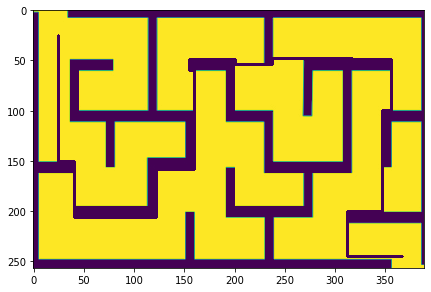

In [126]:
plt.figure(figsize = (7,7))
plt.imshow(maze2)
plt.show()

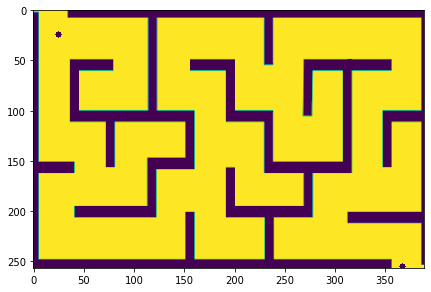

In [117]:
cv2.circle(maze2,(367,255), 3, (0,0,255), -1) # add a circle at (5, 220)
cv2.circle(maze2, (25,25), 3, (0,0,255), -1) # add a circle at (5,5)
plt.figure(figsize = (7,7))
plt.imshow(maze2)
plt.show()

In [101]:
maze_path = find_shortest_path_bfs(maze, 25, 25, 367, 257)

rows 300
cols 400
visiting 25 25
visiting 25 24
visiting 25 26
visiting 24 25
visiting 26 25
visiting 25 23
visiting 25 25
visiting 24 24
visiting 26 24
visiting 25 27
visiting 24 26
visiting 26 26
visiting 23 25
visiting 27 25
visiting 25 22
visiting 24 23
visiting 26 23
visiting 23 24
visiting 27 24
visiting 25 28
visiting 24 27
visiting 26 27
visiting 23 26
visiting 27 26
visiting 22 25
visiting 28 25
visiting 25 21
visiting 24 22
visiting 26 22
visiting 23 23
visiting 27 23
visiting 22 24
visiting 28 24
visiting 25 29
visiting 24 28
visiting 26 28
visiting 23 27
visiting 27 27
visiting 22 26
visiting 28 26
visiting 21 25
visiting 29 25
visiting 25 20
visiting 24 21
visiting 26 21
visiting 23 22
visiting 27 22
visiting 22 23
visiting 28 23
visiting 21 24
visiting 29 24
visiting 25 30
visiting 24 29
visiting 26 29
visiting 23 28
visiting 27 28
visiting 22 27
visiting 28 27
visiting 21 26
visiting 29 26
visiting 20 25
visiting 30 25
visiting 25 19
visiting 24 20
visiting 26 20
visitin

visiting 37 39
visiting 12 38
visiting 38 38
visiting 11 37
visiting 39 37
visiting 10 36
visiting 40 36
visiting 9 35
visiting 41 35
visiting 42 34
visiting 43 33
visiting 44 32
visiting 45 31
visiting 46 30
visiting 47 29
visiting 48 28
visiting 49 27
visiting 50 26
visiting 51 25
visiting 23 0
visiting 27 0
visiting 22 1
visiting 28 1
visiting 21 2
visiting 29 2
visiting 20 3
visiting 30 3
visiting 19 4
visiting 31 4
visiting 18 5
visiting 32 5
visiting 17 6
visiting 33 6
visiting 16 7
visiting 34 7
visiting 15 8
visiting 35 8
visiting 14 9
visiting 36 9
visiting 13 10
visiting 37 10
visiting 12 11
visiting 38 11
visiting 11 12
visiting 39 12
visiting 10 13
visiting 9 14
visiting 41 14
visiting 42 15
visiting 43 16
visiting 44 17
visiting 45 18
visiting 46 19
visiting 47 20
visiting 48 21
visiting 49 22
visiting 50 23
visiting 51 24
visiting 25 52
visiting 24 51
visiting 26 51
visiting 23 50
visiting 27 50
visiting 22 49
visiting 28 49
visiting 21 48
visiting 29 48
visiting 20 47
vi

visiting 13 52
visiting 37 52
visiting 12 51
visiting 38 51
visiting 11 50
visiting 39 50
visiting 10 49
visiting 40 49
visiting 9 48
visiting 41 48
visiting 42 47
visiting 43 46
visiting 44 45
visiting 45 44
visiting 46 43
visiting 47 42
visiting 48 41
visiting 49 40
visiting 50 39
visiting 51 38
visiting 52 37
visiting 53 36
visiting 54 35
visiting 55 34
visiting 56 33
visiting 57 32
visiting 58 31
visiting 59 30
visiting 60 29
visiting 61 28
visiting 62 27
visiting 63 26
visiting 64 25
visiting 10 0
visiting 40 0
visiting 9 1
visiting 41 1
visiting 8 2
visiting 42 2
visiting 7 3
visiting 43 3
visiting 6 4
visiting 5 5
visiting 4 6
visiting 3 7
visiting 2 8
visiting 1 9
visiting 54 14
visiting 55 15
visiting 56 16
visiting 57 17
visiting 58 18
visiting 59 19
visiting 60 20
visiting 61 21
visiting 62 22
visiting 63 23
visiting 64 24
visiting 25 65
visiting 24 64
visiting 26 64
visiting 23 63
visiting 27 63
visiting 22 62
visiting 28 62
visiting 21 61
visiting 29 61
visiting 20 60
visi

visiting 67 15
visiting 68 16
visiting 69 17
visiting 70 18
visiting 71 19
visiting 72 20
visiting 73 21
visiting 74 22
visiting 75 23
visiting 76 24
visiting 25 77
visiting 24 76
visiting 26 76
visiting 23 75
visiting 27 75
visiting 22 74
visiting 28 74
visiting 21 73
visiting 29 73
visiting 20 72
visiting 30 72
visiting 19 71
visiting 31 71
visiting 18 70
visiting 32 70
visiting 17 69
visiting 33 69
visiting 16 68
visiting 34 68
visiting 15 67
visiting 35 67
visiting 14 66
visiting 36 66
visiting 13 65
visiting 37 65
visiting 12 64
visiting 38 64
visiting 11 63
visiting 39 63
visiting 10 62
visiting 40 62
visiting 9 61
visiting 46 56
visiting 47 55
visiting 48 54
visiting 49 53
visiting 50 52
visiting 51 51
visiting 52 50
visiting 53 49
visiting 54 48
visiting 55 47
visiting 56 46
visiting 57 45
visiting 58 44
visiting 59 43
visiting 60 42
visiting 61 41
visiting 62 40
visiting 63 39
visiting 64 38
visiting 65 37
visiting 66 36
visiting 67 35
visiting 68 34
visiting 69 33
visiting 70

visiting 21 85
visiting 29 85
visiting 20 84
visiting 30 84
visiting 19 83
visiting 31 83
visiting 18 82
visiting 32 82
visiting 17 81
visiting 33 81
visiting 16 80
visiting 34 80
visiting 15 79
visiting 35 79
visiting 14 78
visiting 36 78
visiting 13 77
visiting 37 77
visiting 12 76
visiting 38 76
visiting 11 75
visiting 39 75
visiting 10 74
visiting 40 74
visiting 9 73
visiting 58 56
visiting 59 55
visiting 60 54
visiting 61 53
visiting 62 52
visiting 63 51
visiting 64 50
visiting 65 49
visiting 66 48
visiting 67 47
visiting 68 46
visiting 69 45
visiting 70 44
visiting 71 43
visiting 72 42
visiting 73 41
visiting 74 40
visiting 75 39
visiting 76 38
visiting 77 37
visiting 78 36
visiting 79 35
visiting 80 34
visiting 81 33
visiting 82 32
visiting 83 31
visiting 84 30
visiting 85 29
visiting 86 28
visiting 87 27
visiting 88 26
visiting 89 25
visiting 65 0
visiting 66 1
visiting 67 2
visiting 68 3
visiting 0 33
visiting 79 14
visiting 80 15
visiting 81 16
visiting 82 17
visiting 83 18
v

visiting 77 0
visiting 78 1
visiting 79 2
visiting 80 3
visiting 0 45
visiting 91 14
visiting 92 15
visiting 93 16
visiting 94 17
visiting 95 18
visiting 96 19
visiting 97 20
visiting 98 21
visiting 99 22
visiting 100 23
visiting 101 24
visiting 25 102
visiting 24 101
visiting 26 101
visiting 23 100
visiting 27 100
visiting 22 99
visiting 28 99
visiting 21 98
visiting 29 98
visiting 20 97
visiting 30 97
visiting 19 96
visiting 31 96
visiting 18 95
visiting 32 95
visiting 17 94
visiting 33 94
visiting 16 93
visiting 34 93
visiting 15 92
visiting 35 92
visiting 14 91
visiting 36 91
visiting 13 90
visiting 37 90
visiting 12 89
visiting 38 89
visiting 11 88
visiting 39 88
visiting 10 87
visiting 40 87
visiting 9 86
visiting 71 56
visiting 72 55
visiting 73 54
visiting 74 53
visiting 75 52
visiting 76 51
visiting 77 50
visiting 78 49
visiting 79 48
visiting 80 47
visiting 81 46
visiting 82 45
visiting 83 44
visiting 84 43
visiting 85 42
visiting 86 41
visiting 87 40
visiting 88 39
visiting 

visiting 108 18
visiting 109 19
visiting 110 20
visiting 111 21
visiting 112 22
visiting 113 23
visiting 114 24
visiting 25 115
visiting 24 114
visiting 26 114
visiting 23 113
visiting 27 113
visiting 22 112
visiting 28 112
visiting 21 111
visiting 29 111
visiting 20 110
visiting 30 110
visiting 19 109
visiting 31 109
visiting 18 108
visiting 32 108
visiting 17 107
visiting 33 107
visiting 16 106
visiting 34 106
visiting 15 105
visiting 35 105
visiting 14 104
visiting 36 104
visiting 13 103
visiting 37 103
visiting 12 102
visiting 38 102
visiting 11 101
visiting 39 101
visiting 10 100
visiting 40 100
visiting 9 99
visiting 84 56
visiting 85 55
visiting 86 54
visiting 87 53
visiting 88 52
visiting 89 51
visiting 90 50
visiting 91 49
visiting 92 48
visiting 93 47
visiting 94 46
visiting 95 45
visiting 96 44
visiting 97 43
visiting 98 42
visiting 99 41
visiting 100 40
visiting 101 39
visiting 102 38
visiting 103 37
visiting 104 36
visiting 105 35
visiting 106 34
visiting 107 33
visiting 1

visiting 113 39
visiting 114 38
visiting 115 37
visiting 116 36
visiting 117 35
visiting 118 34
visiting 103 0
visiting 104 1
visiting 105 2
visiting 106 3
visiting 0 71
visiting 117 14
visiting 118 15
visiting 25 128
visiting 24 127
visiting 26 127
visiting 23 126
visiting 27 126
visiting 22 125
visiting 28 125
visiting 21 124
visiting 29 124
visiting 20 123
visiting 30 123
visiting 19 122
visiting 31 122
visiting 18 121
visiting 32 121
visiting 17 120
visiting 33 120
visiting 16 119
visiting 34 119
visiting 15 118
visiting 35 118
visiting 14 117
visiting 36 117
visiting 13 116
visiting 37 116
visiting 12 115
visiting 38 115
visiting 11 114
visiting 39 114
visiting 10 113
visiting 40 113
visiting 9 112
visiting 84 69
visiting 83 68
visiting 85 68
visiting 82 67
visiting 86 67
visiting 87 66
visiting 88 65
visiting 89 64
visiting 90 63
visiting 91 62
visiting 92 61
visiting 93 60
visiting 94 59
visiting 95 58
visiting 96 57
visiting 97 56
visiting 98 55
visiting 99 54
visiting 100 53
v

visiting 104 60
visiting 105 59
visiting 106 58
visiting 107 57
visiting 108 56
visiting 109 55
visiting 110 54
visiting 111 53
visiting 112 52
visiting 113 51
visiting 114 50
visiting 115 49
visiting 116 48
visiting 117 47
visiting 118 46
visiting 115 0
visiting 116 1
visiting 117 2
visiting 118 3
visiting 0 83
visiting 25 140
visiting 24 139
visiting 26 139
visiting 23 138
visiting 27 138
visiting 22 137
visiting 28 137
visiting 21 136
visiting 29 136
visiting 20 135
visiting 30 135
visiting 19 134
visiting 31 134
visiting 18 133
visiting 32 133
visiting 17 132
visiting 33 132
visiting 16 131
visiting 34 131
visiting 15 130
visiting 35 130
visiting 14 129
visiting 36 129
visiting 13 128
visiting 37 128
visiting 12 127
visiting 38 127
visiting 11 126
visiting 39 126
visiting 10 125
visiting 40 125
visiting 9 124
visiting 41 124
visiting 42 123
visiting 43 122
visiting 44 121
visiting 45 120
visiting 46 119
visiting 47 118
visiting 48 117
visiting 84 81
visiting 83 80
visiting 85 80
vi

visiting 15 140
visiting 35 140
visiting 14 139
visiting 36 139
visiting 13 138
visiting 37 138
visiting 12 137
visiting 38 137
visiting 11 136
visiting 39 136
visiting 10 135
visiting 40 135
visiting 9 134
visiting 41 134
visiting 42 133
visiting 43 132
visiting 44 131
visiting 45 130
visiting 46 129
visiting 47 128
visiting 48 127
visiting 49 126
visiting 50 125
visiting 51 124
visiting 52 123
visiting 53 122
visiting 54 121
visiting 55 120
visiting 56 119
visiting 57 118
visiting 58 117
visiting 84 91
visiting 83 90
visiting 85 90
visiting 82 89
visiting 86 89
visiting 81 88
visiting 87 88
visiting 80 87
visiting 88 87
visiting 79 86
visiting 89 86
visiting 78 85
visiting 90 85
visiting 77 84
visiting 91 84
visiting 76 83
visiting 92 83
visiting 75 82
visiting 93 82
visiting 74 81
visiting 94 81
visiting 73 80
visiting 95 80
visiting 72 79
visiting 96 79
visiting 71 78
visiting 97 78
visiting 70 77
visiting 98 77
visiting 69 76
visiting 99 76
visiting 68 75
visiting 100 75
visiting 

visiting 60 75
visiting 108 75
visiting 59 74
visiting 109 74
visiting 58 73
visiting 110 73
visiting 57 72
visiting 111 72
visiting 56 71
visiting 112 71
visiting 55 70
visiting 113 70
visiting 54 69
visiting 114 69
visiting 53 68
visiting 115 68
visiting 52 67
visiting 116 67
visiting 117 66
visiting 118 65
visiting 134 0
visiting 135 1
visiting 136 2
visiting 137 3
visiting 0 102
visiting 23 157
visiting 27 157
visiting 22 156
visiting 28 156
visiting 21 155
visiting 29 155
visiting 20 154
visiting 30 154
visiting 19 153
visiting 31 153
visiting 18 152
visiting 32 152
visiting 17 151
visiting 33 151
visiting 16 150
visiting 34 150
visiting 15 149
visiting 35 149
visiting 14 148
visiting 36 148
visiting 13 147
visiting 37 147
visiting 12 146
visiting 38 146
visiting 11 145
visiting 39 145
visiting 10 144
visiting 40 144
visiting 9 143
visiting 41 143
visiting 42 142
visiting 43 141
visiting 44 140
visiting 45 139
visiting 46 138
visiting 47 137
visiting 48 136
visiting 49 135
visitin

visiting 88 105
visiting 79 104
visiting 89 104
visiting 78 103
visiting 90 103
visiting 77 102
visiting 91 102
visiting 76 101
visiting 92 101
visiting 75 100
visiting 93 100
visiting 74 99
visiting 94 99
visiting 73 98
visiting 95 98
visiting 72 97
visiting 96 97
visiting 71 96
visiting 97 96
visiting 70 95
visiting 98 95
visiting 69 94
visiting 99 94
visiting 68 93
visiting 100 93
visiting 67 92
visiting 101 92
visiting 66 91
visiting 102 91
visiting 65 90
visiting 103 90
visiting 64 89
visiting 104 89
visiting 63 88
visiting 105 88
visiting 62 87
visiting 106 87
visiting 61 86
visiting 107 86
visiting 60 85
visiting 108 85
visiting 59 84
visiting 109 84
visiting 58 83
visiting 110 83
visiting 57 82
visiting 111 82
visiting 56 81
visiting 112 81
visiting 55 80
visiting 113 80
visiting 54 79
visiting 114 79
visiting 53 78
visiting 115 78
visiting 52 77
visiting 116 77
visiting 51 76
visiting 117 76
visiting 50 75
visiting 118 75
visiting 144 0
visiting 145 1
visiting 146 2
visiting 1

visiting 59 148
visiting 60 147
visiting 61 146
visiting 62 145
visiting 63 144
visiting 64 143
visiting 65 142
visiting 66 141
visiting 67 140
visiting 68 139
visiting 69 138
visiting 70 137
visiting 71 136
visiting 72 135
visiting 73 134
visiting 74 133
visiting 75 132
visiting 76 131
visiting 67 106
visiting 101 106
visiting 66 105
visiting 102 105
visiting 65 104
visiting 103 104
visiting 64 103
visiting 104 103
visiting 63 102
visiting 105 102
visiting 62 101
visiting 106 101
visiting 61 100
visiting 107 100
visiting 60 99
visiting 108 99
visiting 59 98
visiting 109 98
visiting 58 97
visiting 110 97
visiting 57 96
visiting 111 96
visiting 56 95
visiting 112 95
visiting 55 94
visiting 113 94
visiting 54 93
visiting 114 93
visiting 53 92
visiting 115 92
visiting 52 91
visiting 116 91
visiting 51 90
visiting 117 90
visiting 50 89
visiting 118 89
visiting 158 0
visiting 159 1
visiting 160 2
visiting 161 3
visiting 0 126
visiting 45 163
visiting 46 162
visiting 47 161
visiting 48 160
v

visiting 56 169
visiting 57 168
visiting 58 167
visiting 59 166
visiting 60 165
visiting 61 164
visiting 62 163
visiting 63 162
visiting 64 161
visiting 65 160
visiting 66 159
visiting 67 158
visiting 68 157
visiting 69 156
visiting 70 155
visiting 71 154
visiting 72 153
visiting 73 152
visiting 74 151
visiting 75 150
visiting 76 149
visiting 176 0
visiting 177 1
visiting 178 2
visiting 179 3
visiting 0 144
visiting 45 181
visiting 44 180
visiting 46 180
visiting 43 179
visiting 47 179
visiting 42 178
visiting 48 178
visiting 41 177
visiting 49 177
visiting 40 176
visiting 50 176
visiting 39 175
visiting 51 175
visiting 38 174
visiting 52 174
visiting 37 173
visiting 53 173
visiting 36 172
visiting 54 172
visiting 35 171
visiting 55 171
visiting 34 170
visiting 56 170
visiting 33 169
visiting 57 169
visiting 58 168
visiting 59 167
visiting 60 166
visiting 61 165
visiting 62 164
visiting 63 163
visiting 64 162
visiting 65 161
visiting 66 160
visiting 67 159
visiting 68 158
visiting 69 1

visiting 57 188
visiting 32 187
visiting 58 187
visiting 31 186
visiting 59 186
visiting 30 185
visiting 60 185
visiting 29 184
visiting 61 184
visiting 28 183
visiting 62 183
visiting 27 182
visiting 63 182
visiting 26 181
visiting 64 181
visiting 25 180
visiting 65 180
visiting 24 179
visiting 66 179
visiting 23 178
visiting 67 178
visiting 22 177
visiting 68 177
visiting 21 176
visiting 69 176
visiting 20 175
visiting 70 175
visiting 19 174
visiting 71 174
visiting 18 173
visiting 72 173
visiting 17 172
visiting 73 172
visiting 16 171
visiting 74 171
visiting 15 170
visiting 75 170
visiting 14 169
visiting 76 169
visiting 77 168
visiting 78 167
visiting 79 166
visiting 80 165
visiting 81 164
visiting 82 163
visiting 196 0
visiting 197 1
visiting 198 2
visiting 199 3
visiting 0 164
visiting 45 201
visiting 44 200
visiting 46 200
visiting 43 199
visiting 47 199
visiting 42 198
visiting 48 198
visiting 41 197
visiting 49 197
visiting 40 196
visiting 50 196
visiting 39 195
visiting 51 1

visiting 49 212
visiting 40 211
visiting 39 210
visiting 38 209
visiting 37 208
visiting 36 207
visiting 35 206
visiting 34 205
visiting 33 204
visiting 32 203
visiting 31 202
visiting 30 201
visiting 29 200
visiting 61 200
visiting 28 199
visiting 62 199
visiting 27 198
visiting 63 198
visiting 26 197
visiting 64 197
visiting 25 196
visiting 65 196
visiting 24 195
visiting 66 195
visiting 23 194
visiting 67 194
visiting 22 193
visiting 68 193
visiting 21 192
visiting 69 192
visiting 20 191
visiting 70 191
visiting 19 190
visiting 71 190
visiting 18 189
visiting 72 189
visiting 17 188
visiting 73 188
visiting 16 187
visiting 74 187
visiting 15 186
visiting 75 186
visiting 14 185
visiting 76 185
visiting 13 184
visiting 77 184
visiting 12 183
visiting 78 183
visiting 11 182
visiting 79 182
visiting 10 181
visiting 80 181
visiting 9 180
visiting 81 180
visiting 82 179
visiting 83 178
visiting 84 177
visiting 85 176
visiting 86 175
visiting 87 174
visiting 88 173
visiting 89 172
visiting 

visiting 225 3
visiting 0 190
visiting 45 227
visiting 44 226
visiting 46 226
visiting 43 225
visiting 47 225
visiting 42 224
visiting 48 224
visiting 41 223
visiting 49 223
visiting 40 222
visiting 50 222
visiting 39 221
visiting 51 221
visiting 38 220
visiting 52 220
visiting 37 219
visiting 53 219
visiting 36 218
visiting 54 218
visiting 35 217
visiting 55 217
visiting 34 216
visiting 56 216
visiting 33 215
visiting 57 215
visiting 32 214
visiting 58 214
visiting 31 213
visiting 59 213
visiting 30 212
visiting 60 212
visiting 29 211
visiting 28 210
visiting 27 209
visiting 26 208
visiting 25 207
visiting 24 206
visiting 23 205
visiting 22 204
visiting 21 203
visiting 20 202
visiting 19 201
visiting 18 200
visiting 72 200
visiting 17 199
visiting 73 199
visiting 16 198
visiting 74 198
visiting 15 197
visiting 75 197
visiting 14 196
visiting 76 196
visiting 13 195
visiting 77 195
visiting 12 194
visiting 78 194
visiting 11 193
visiting 79 193
visiting 10 192
visiting 80 192
visiting 9

visiting 97 182
visiting 98 181
visiting 99 180
visiting 100 179
visiting 101 178
visiting 102 177
visiting 103 176
visiting 104 175
visiting 105 174
visiting 106 173
visiting 107 172
visiting 108 171
visiting 109 170
visiting 110 169
visiting 111 168
visiting 112 167
visiting 113 166
visiting 114 165
visiting 115 164
visiting 85 132
visiting 86 133
visiting 87 134
visiting 88 135
visiting 89 136
visiting 90 137
visiting 91 138
visiting 92 139
visiting 93 140
visiting 94 141
visiting 95 142
visiting 96 143
visiting 97 144
visiting 98 145
visiting 99 146
visiting 100 147
visiting 101 148
visiting 102 149
visiting 103 150
visiting 104 151
visiting 105 152
visiting 106 153
visiting 107 154
visiting 108 155
visiting 109 156
visiting 110 157
visiting 111 158
visiting 112 159
visiting 113 160
visiting 114 161
visiting 115 162
visiting 116 163
visiting 230 0
visiting 231 1
visiting 232 2
visiting 233 3
visiting 0 198
visiting 45 235
visiting 44 234
visiting 46 234
visiting 43 233
visiting 47 

visiting 62 223
visiting 27 222
visiting 63 222
visiting 26 221
visiting 64 221
visiting 25 220
visiting 65 220
visiting 24 219
visiting 66 219
visiting 23 218
visiting 67 218
visiting 22 217
visiting 68 217
visiting 21 216
visiting 69 216
visiting 20 215
visiting 70 215
visiting 19 214
visiting 71 214
visiting 18 213
visiting 72 213
visiting 17 212
visiting 73 212
visiting 16 211
visiting 15 210
visiting 14 209
visiting 13 208
visiting 12 207
visiting 11 206
visiting 10 205
visiting 9 204
visiting 85 200
visiting 86 199
visiting 87 198
visiting 88 197
visiting 89 196
visiting 90 195
visiting 91 194
visiting 92 193
visiting 93 192
visiting 94 191
visiting 95 190
visiting 96 189
visiting 97 188
visiting 98 187
visiting 99 186
visiting 100 185
visiting 101 184
visiting 102 183
visiting 103 182
visiting 104 181
visiting 105 180
visiting 106 179
visiting 107 178
visiting 108 177
visiting 109 176
visiting 110 175
visiting 111 174
visiting 112 173
visiting 113 172
visiting 114 171
visiting 1

visiting 26 231
visiting 64 231
visiting 25 230
visiting 65 230
visiting 24 229
visiting 66 229
visiting 23 228
visiting 67 228
visiting 22 227
visiting 68 227
visiting 21 226
visiting 69 226
visiting 20 225
visiting 70 225
visiting 19 224
visiting 71 224
visiting 18 223
visiting 72 223
visiting 17 222
visiting 73 222
visiting 16 221
visiting 74 221
visiting 15 220
visiting 75 220
visiting 14 219
visiting 76 219
visiting 13 218
visiting 77 218
visiting 12 217
visiting 78 217
visiting 11 216
visiting 79 216
visiting 10 215
visiting 80 215
visiting 9 214
visiting 81 214
visiting 82 213
visiting 83 212
visiting 95 200
visiting 96 199
visiting 97 198
visiting 98 197
visiting 99 196
visiting 100 195
visiting 101 194
visiting 102 193
visiting 103 192
visiting 104 191
visiting 105 190
visiting 106 189
visiting 107 188
visiting 108 187
visiting 109 186
visiting 110 185
visiting 111 184
visiting 112 183
visiting 113 182
visiting 114 181
visiting 115 180
visiting 116 179
visiting 117 178
visitin

visiting 254 1
visiting 255 2
visiting 256 3
visiting 0 221
visiting 41 254
visiting 49 254
visiting 40 253
visiting 50 253
visiting 39 252
visiting 51 252
visiting 38 251
visiting 52 251
visiting 37 250
visiting 53 250
visiting 36 249
visiting 54 249
visiting 35 248
visiting 55 248
visiting 34 247
visiting 56 247
visiting 33 246
visiting 57 246
visiting 32 245
visiting 58 245
visiting 31 244
visiting 59 244
visiting 30 243
visiting 60 243
visiting 29 242
visiting 61 242
visiting 28 241
visiting 62 241
visiting 27 240
visiting 63 240
visiting 26 239
visiting 64 239
visiting 25 238
visiting 65 238
visiting 24 237
visiting 66 237
visiting 23 236
visiting 67 236
visiting 22 235
visiting 68 235
visiting 21 234
visiting 69 234
visiting 20 233
visiting 70 233
visiting 19 232
visiting 71 232
visiting 18 231
visiting 72 231
visiting 17 230
visiting 73 230
visiting 16 229
visiting 74 229
visiting 15 228
visiting 75 228
visiting 14 227
visiting 76 227
visiting 13 226
visiting 77 226
visiting 12 

visiting 76 236
visiting 13 235
visiting 77 235
visiting 12 234
visiting 78 234
visiting 11 233
visiting 79 233
visiting 10 232
visiting 80 232
visiting 9 231
visiting 81 231
visiting 82 230
visiting 83 229
visiting 84 228
visiting 85 227
visiting 86 226
visiting 87 225
visiting 88 224
visiting 89 223
visiting 90 222
visiting 91 221
visiting 92 220
visiting 93 219
visiting 94 218
visiting 95 217
visiting 96 216
visiting 97 215
visiting 98 214
visiting 99 213
visiting 100 212
visiting 112 200
visiting 113 199
visiting 114 198
visiting 115 197
visiting 116 196
visiting 117 195
visiting 103 117
visiting 104 118
visiting 105 119
visiting 106 120
visiting 107 121
visiting 108 122
visiting 109 123
visiting 110 124
visiting 111 125
visiting 112 126
visiting 113 127
visiting 114 128
visiting 115 129
visiting 116 130
visiting 117 131
visiting 118 132
visiting 119 133
visiting 120 134
visiting 121 135
visiting 122 136
visiting 123 137
visiting 124 138
visiting 125 139
visiting 126 140
visiting 1

visiting 95 228
visiting 96 227
visiting 97 226
visiting 98 225
visiting 99 224
visiting 100 223
visiting 101 222
visiting 102 221
visiting 103 220
visiting 104 219
visiting 105 218
visiting 106 217
visiting 107 216
visiting 108 215
visiting 109 214
visiting 110 213
visiting 111 212
visiting 114 117
visiting 115 118
visiting 116 119
visiting 117 120
visiting 118 121
visiting 119 122
visiting 120 123
visiting 121 124
visiting 122 125
visiting 123 126
visiting 124 127
visiting 125 128
visiting 126 129
visiting 127 130
visiting 128 131
visiting 129 132
visiting 130 133
visiting 131 134
visiting 132 135
visiting 133 136
visiting 134 137
visiting 135 138
visiting 136 139
visiting 137 140
visiting 138 141
visiting 139 142
visiting 140 143
visiting 141 144
visiting 142 145
visiting 143 146
visiting 144 147
visiting 145 148
visiting 146 149
visiting 147 150
visiting 148 151
visiting 149 152
visiting 150 153
visiting 274 0
visiting 275 1
visiting 276 2
visiting 277 3
visiting 0 242
visiting 20 

visiting 137 125
visiting 138 126
visiting 139 127
visiting 140 128
visiting 141 129
visiting 142 130
visiting 143 131
visiting 144 132
visiting 145 133
visiting 146 134
visiting 147 135
visiting 148 136
visiting 149 137
visiting 150 138
visiting 151 139
visiting 152 140
visiting 153 141
visiting 154 142
visiting 155 143
visiting 289 0
visiting 290 1
visiting 291 2
visiting 292 3
visiting 0 257
visiting 85 254
visiting 86 253
visiting 87 252
visiting 88 251
visiting 89 250
visiting 90 249
visiting 91 248
visiting 92 247
visiting 93 246
visiting 94 245
visiting 95 244
visiting 96 243
visiting 97 242
visiting 98 241
visiting 99 240
visiting 100 239
visiting 101 238
visiting 102 237
visiting 103 236
visiting 104 235
visiting 105 234
visiting 106 233
visiting 107 232
visiting 108 231
visiting 109 230
visiting 110 229
visiting 111 228
visiting 112 227
visiting 113 226
visiting 114 225
visiting 115 224
visiting 116 223
visiting 117 222
visiting 118 221
visiting 119 220
visiting 120 219
visit

visiting 4 267
visiting 5 266
visiting 6 265
visiting 99 254
visiting 100 253
visiting 101 252
visiting 102 251
visiting 103 250
visiting 104 249
visiting 105 248
visiting 106 247
visiting 107 246
visiting 108 245
visiting 109 244
visiting 110 243
visiting 111 242
visiting 112 241
visiting 113 240
visiting 114 239
visiting 115 238
visiting 116 237
visiting 117 236
visiting 118 235
visiting 119 234
visiting 120 233
visiting 121 232
visiting 122 231
visiting 123 230
visiting 124 229
visiting 125 228
visiting 126 227
visiting 127 226
visiting 128 225
visiting 129 224
visiting 130 223
visiting 131 222
visiting 132 221
visiting 133 220
visiting 134 219
visiting 135 218
visiting 136 217
visiting 137 216
visiting 138 215
visiting 139 214
visiting 140 213
visiting 126 197
visiting 125 198
visiting 127 198
visiting 128 199
visiting 129 200
visiting 130 201
visiting 131 202
visiting 132 203
visiting 133 204
visiting 134 205
visiting 135 206
visiting 136 207
visiting 137 208
visiting 138 209
visi

visiting 152 210
visiting 153 211
visiting 154 212
visiting 317 0
visiting 318 1
visiting 319 2
visiting 320 3
visiting 0 285
visiting 1 284
visiting 2 283
visiting 3 282
visiting 4 281
visiting 5 280
visiting 6 279
visiting 7 278
visiting 8 277
visiting 9 276
visiting 10 275
visiting 11 274
visiting 12 273
visiting 13 272
visiting 14 271
visiting 15 270
visiting 16 269
visiting 17 268
visiting 18 267
visiting 19 266
visiting 20 265
visiting 113 254
visiting 114 253
visiting 115 252
visiting 116 251
visiting 117 250
visiting 118 249
visiting 119 248
visiting 120 247
visiting 121 246
visiting 122 245
visiting 123 244
visiting 124 243
visiting 125 242
visiting 126 241
visiting 127 240
visiting 128 239
visiting 129 238
visiting 130 237
visiting 131 236
visiting 132 235
visiting 133 234
visiting 134 233
visiting 135 232
visiting 136 231
visiting 137 230
visiting 138 229
visiting 139 228
visiting 140 227
visiting 141 226
visiting 142 225
visiting 143 224
visiting 144 223
visiting 145 222
vi

visiting 3 294
visiting 4 293
visiting 5 292
visiting 6 291
visiting 7 290
visiting 8 289
visiting 9 288
visiting 10 287
visiting 11 286
visiting 12 285
visiting 13 284
visiting 14 283
visiting 15 282
visiting 16 281
visiting 17 280
visiting 18 279
visiting 19 278
visiting 20 277
visiting 21 276
visiting 22 275
visiting 23 274
visiting 24 273
visiting 25 272
visiting 26 271
visiting 27 270
visiting 28 269
visiting 29 268
visiting 30 267
visiting 31 266
visiting 32 265
visiting 125 254
visiting 126 253
visiting 127 252
visiting 128 251
visiting 129 250
visiting 130 249
visiting 131 248
visiting 132 247
visiting 133 246
visiting 134 245
visiting 135 244
visiting 136 243
visiting 137 242
visiting 138 241
visiting 139 240
visiting 140 239
visiting 141 238
visiting 142 237
visiting 143 236
visiting 144 235
visiting 145 234
visiting 146 233
visiting 147 232
visiting 148 231
visiting 149 230
visiting 150 229
visiting 151 228
visiting 152 227
visiting 153 226
visiting 154 225
visiting 155 224


visiting 169 209
visiting 170 208
visiting 171 207
visiting 172 206
visiting 341 0
visiting 342 1
visiting 343 2
visiting 344 3
visiting 10 299
visiting 11 298
visiting 12 297
visiting 13 296
visiting 14 295
visiting 15 294
visiting 16 293
visiting 17 292
visiting 18 291
visiting 19 290
visiting 20 289
visiting 21 288
visiting 22 287
visiting 23 286
visiting 24 285
visiting 25 284
visiting 26 283
visiting 27 282
visiting 28 281
visiting 29 280
visiting 30 279
visiting 31 278
visiting 32 277
visiting 33 276
visiting 34 275
visiting 35 274
visiting 36 273
visiting 37 272
visiting 38 271
visiting 39 270
visiting 40 269
visiting 41 268
visiting 42 267
visiting 43 266
visiting 44 265
visiting 137 254
visiting 138 253
visiting 139 252
visiting 140 251
visiting 141 250
visiting 142 249
visiting 143 248
visiting 144 247
visiting 145 246
visiting 146 245
visiting 147 244
visiting 148 243
visiting 149 242
visiting 150 241
visiting 151 240
visiting 152 239
visiting 153 238
visiting 154 237
visiti

visiting 25 293
visiting 26 292
visiting 27 291
visiting 28 290
visiting 29 289
visiting 30 288
visiting 31 287
visiting 32 286
visiting 33 285
visiting 34 284
visiting 35 283
visiting 36 282
visiting 37 281
visiting 38 280
visiting 39 279
visiting 40 278
visiting 41 277
visiting 42 276
visiting 43 275
visiting 44 274
visiting 45 273
visiting 46 272
visiting 47 271
visiting 48 270
visiting 49 269
visiting 50 268
visiting 51 267
visiting 52 266
visiting 53 265
visiting 146 254
visiting 147 253
visiting 148 252
visiting 149 251
visiting 150 250
visiting 151 249
visiting 152 248
visiting 153 247
visiting 154 246
visiting 155 245
visiting 141 165
visiting 142 166
visiting 143 167
visiting 144 168
visiting 145 169
visiting 146 170
visiting 147 171
visiting 148 172
visiting 149 173
visiting 150 174
visiting 151 175
visiting 152 176
visiting 153 177
visiting 154 178
visiting 155 179
visiting 156 180
visiting 157 181
visiting 158 182
visiting 159 183
visiting 160 184
visiting 161 185
visiting 

visiting 189 208
visiting 190 207
visiting 191 206
visiting 360 0
visiting 361 1
visiting 362 2
visiting 363 3
visiting 29 299
visiting 30 298
visiting 31 297
visiting 32 296
visiting 33 295
visiting 34 294
visiting 35 293
visiting 36 292
visiting 37 291
visiting 38 290
visiting 39 289
visiting 40 288
visiting 41 287
visiting 42 286
visiting 43 285
visiting 44 284
visiting 45 283
visiting 46 282
visiting 47 281
visiting 48 280
visiting 49 279
visiting 50 278
visiting 51 277
visiting 52 276
visiting 53 275
visiting 54 274
visiting 55 273
visiting 56 272
visiting 57 271
visiting 58 270
visiting 59 269
visiting 60 268
visiting 61 267
visiting 62 266
visiting 63 265
visiting 151 165
visiting 152 166
visiting 153 167
visiting 154 168
visiting 155 169
visiting 156 170
visiting 157 171
visiting 158 172
visiting 159 173
visiting 160 174
visiting 161 175
visiting 162 176
visiting 163 177
visiting 164 178
visiting 165 179
visiting 166 180
visiting 167 181
visiting 168 182
visiting 169 183
visiti

visiting 183 223
visiting 184 222
visiting 185 221
visiting 186 220
visiting 187 219
visiting 188 218
visiting 189 217
visiting 190 216
visiting 191 215
visiting 192 214
visiting 193 213
visiting 194 212
visiting 195 211
visiting 369 0
visiting 370 1
visiting 371 2
visiting 372 3
visiting 38 299
visiting 39 298
visiting 40 297
visiting 41 296
visiting 42 295
visiting 43 294
visiting 44 293
visiting 45 292
visiting 46 291
visiting 47 290
visiting 48 289
visiting 49 288
visiting 50 287
visiting 51 286
visiting 52 285
visiting 53 284
visiting 54 283
visiting 55 282
visiting 56 281
visiting 57 280
visiting 58 279
visiting 59 278
visiting 60 277
visiting 61 276
visiting 62 275
visiting 63 274
visiting 64 273
visiting 65 272
visiting 66 271
visiting 67 270
visiting 68 269
visiting 69 268
visiting 70 267
visiting 71 266
visiting 72 265
visiting 160 165
visiting 161 166
visiting 162 167
visiting 163 168
visiting 164 169
visiting 165 170
visiting 166 171
visiting 167 172
visiting 168 173
visiti

visiting 80 267
visiting 81 266
visiting 82 265
visiting 164 159
visiting 165 160
visiting 166 161
visiting 167 162
visiting 168 163
visiting 169 164
visiting 170 165
visiting 171 166
visiting 172 167
visiting 173 168
visiting 174 169
visiting 175 170
visiting 176 171
visiting 177 172
visiting 178 173
visiting 179 174
visiting 180 175
visiting 181 176
visiting 182 177
visiting 183 178
visiting 184 179
visiting 185 180
visiting 186 181
visiting 187 182
visiting 188 183
visiting 189 184
visiting 190 185
visiting 191 186
visiting 192 187
visiting 193 188
visiting 194 189
visiting 195 190
visiting 164 253
visiting 165 252
visiting 166 251
visiting 167 250
visiting 168 249
visiting 169 248
visiting 170 247
visiting 171 246
visiting 172 245
visiting 173 244
visiting 174 243
visiting 175 242
visiting 176 241
visiting 177 240
visiting 178 239
visiting 179 238
visiting 180 237
visiting 181 236
visiting 182 235
visiting 183 234
visiting 184 233
visiting 185 232
visiting 186 231
visiting 187 230


visiting 189 173
visiting 190 174
visiting 191 175
visiting 192 176
visiting 193 177
visiting 194 178
visiting 195 179
visiting 174 254
visiting 175 253
visiting 176 252
visiting 177 251
visiting 178 250
visiting 179 249
visiting 180 248
visiting 181 247
visiting 182 246
visiting 183 245
visiting 184 244
visiting 185 243
visiting 186 242
visiting 187 241
visiting 188 240
visiting 189 239
visiting 190 238
visiting 191 237
visiting 192 236
visiting 193 235
visiting 194 234
visiting 195 233
visiting 196 232
visiting 197 231
visiting 198 230
visiting 199 229
visiting 200 228
visiting 201 227
visiting 202 226
visiting 203 225
visiting 204 224
visiting 205 223
visiting 206 222
visiting 207 221
visiting 208 220
visiting 209 219
visiting 210 218
visiting 211 217
visiting 212 216
visiting 213 215
visiting 214 214
visiting 215 213
visiting 216 212
visiting 391 0
visiting 392 1
visiting 393 2
visiting 394 3
visiting 60 299
visiting 61 298
visiting 62 297
visiting 63 296
visiting 64 295
visiting 6

visiting 192 245
visiting 193 244
visiting 194 243
visiting 195 242
visiting 196 241
visiting 197 240
visiting 198 239
visiting 199 238
visiting 200 237
visiting 201 236
visiting 202 235
visiting 203 234
visiting 204 233
visiting 205 232
visiting 206 231
visiting 207 230
visiting 208 229
visiting 209 228
visiting 210 227
visiting 211 226
visiting 212 225
visiting 213 224
visiting 214 223
visiting 215 222
visiting 216 221
visiting 217 220
visiting 218 219
visiting 219 218
visiting 220 217
visiting 221 216
visiting 222 215
visiting 223 214
visiting 224 213
visiting 225 212
visiting 399 7
visiting 69 299
visiting 70 298
visiting 71 297
visiting 72 296
visiting 73 295
visiting 74 294
visiting 75 293
visiting 76 292
visiting 77 291
visiting 78 290
visiting 79 289
visiting 80 288
visiting 81 287
visiting 82 286
visiting 83 285
visiting 84 284
visiting 85 283
visiting 86 282
visiting 87 281
visiting 88 280
visiting 89 279
visiting 90 278
visiting 91 277
visiting 92 276
visiting 93 275
visitin

visiting 87 291
visiting 88 290
visiting 89 289
visiting 90 288
visiting 91 287
visiting 92 286
visiting 93 285
visiting 94 284
visiting 95 283
visiting 96 282
visiting 97 281
visiting 98 280
visiting 99 279
visiting 100 278
visiting 101 277
visiting 102 276
visiting 103 275
visiting 104 274
visiting 105 273
visiting 106 272
visiting 107 271
visiting 108 270
visiting 109 269
visiting 110 268
visiting 111 267
visiting 112 266
visiting 113 265
visiting 164 128
visiting 165 129
visiting 166 130
visiting 167 131
visiting 168 132
visiting 169 133
visiting 170 134
visiting 171 135
visiting 172 136
visiting 173 137
visiting 174 138
visiting 175 139
visiting 176 140
visiting 177 141
visiting 178 142
visiting 179 143
visiting 180 144
visiting 181 145
visiting 182 146
visiting 183 147
visiting 184 148
visiting 185 149
visiting 186 150
visiting 187 151
visiting 188 152
visiting 189 153
visiting 190 154
visiting 191 155
visiting 192 156
visiting 193 157
visiting 194 158
visiting 195 159
visiting 1

visiting 231 225
visiting 232 224
visiting 233 223
visiting 234 222
visiting 399 26
visiting 88 299
visiting 89 298
visiting 90 297
visiting 91 296
visiting 92 295
visiting 93 294
visiting 94 293
visiting 95 292
visiting 96 291
visiting 97 290
visiting 98 289
visiting 99 288
visiting 100 287
visiting 101 286
visiting 102 285
visiting 103 284
visiting 104 283
visiting 105 282
visiting 106 281
visiting 107 280
visiting 108 279
visiting 109 278
visiting 110 277
visiting 111 276
visiting 112 275
visiting 113 274
visiting 114 273
visiting 115 272
visiting 116 271
visiting 117 270
visiting 118 269
visiting 119 268
visiting 120 267
visiting 121 266
visiting 122 265
visiting 164 119
visiting 165 120
visiting 166 121
visiting 167 122
visiting 168 123
visiting 169 124
visiting 170 125
visiting 171 126
visiting 172 127
visiting 173 128
visiting 174 129
visiting 175 130
visiting 176 131
visiting 177 132
visiting 178 133
visiting 179 134
visiting 180 135
visiting 181 136
visiting 182 137
visiting 1

visiting 109 287
visiting 110 286
visiting 111 285
visiting 112 284
visiting 113 283
visiting 114 282
visiting 115 281
visiting 116 280
visiting 117 279
visiting 118 278
visiting 119 277
visiting 120 276
visiting 121 275
visiting 122 274
visiting 123 273
visiting 124 272
visiting 125 271
visiting 126 270
visiting 127 269
visiting 128 268
visiting 129 267
visiting 130 266
visiting 131 265
visiting 164 110
visiting 165 111
visiting 166 112
visiting 167 113
visiting 168 114
visiting 169 115
visiting 170 116
visiting 171 117
visiting 172 118
visiting 173 119
visiting 174 120
visiting 175 121
visiting 176 122
visiting 177 123
visiting 178 124
visiting 179 125
visiting 180 126
visiting 181 127
visiting 182 128
visiting 183 129
visiting 184 130
visiting 185 131
visiting 186 132
visiting 187 133
visiting 188 134
visiting 189 135
visiting 190 136
visiting 191 137
visiting 192 138
visiting 193 139
visiting 194 140
visiting 195 141
visiting 196 142
visiting 197 143
visiting 198 144
visiting 199 1

visiting 217 171
visiting 218 170
visiting 219 169
visiting 220 168
visiting 221 167
visiting 222 166
visiting 223 165
visiting 224 164
visiting 225 163
visiting 220 254
visiting 221 253
visiting 222 252
visiting 223 251
visiting 224 250
visiting 225 249
visiting 226 248
visiting 227 247
visiting 228 246
visiting 229 245
visiting 230 244
visiting 231 243
visiting 232 242
visiting 233 241
visiting 234 240
visiting 399 44
visiting 106 299
visiting 107 298
visiting 108 297
visiting 109 296
visiting 110 295
visiting 111 294
visiting 112 293
visiting 113 292
visiting 114 291
visiting 115 290
visiting 116 289
visiting 117 288
visiting 118 287
visiting 119 286
visiting 120 285
visiting 121 284
visiting 122 283
visiting 123 282
visiting 124 281
visiting 125 280
visiting 126 279
visiting 127 278
visiting 128 277
visiting 129 276
visiting 130 275
visiting 131 274
visiting 132 273
visiting 133 272
visiting 134 271
visiting 135 270
visiting 136 269
visiting 137 268
visiting 138 267
visiting 139 26

visiting 180 109
visiting 181 110
visiting 182 111
visiting 183 112
visiting 184 113
visiting 185 114
visiting 186 115
visiting 187 116
visiting 188 117
visiting 189 118
visiting 190 119
visiting 191 120
visiting 192 121
visiting 193 122
visiting 194 123
visiting 195 124
visiting 196 125
visiting 197 126
visiting 198 127
visiting 199 128
visiting 200 129
visiting 201 130
visiting 202 131
visiting 203 132
visiting 204 133
visiting 205 134
visiting 206 135
visiting 207 136
visiting 208 137
visiting 209 138
visiting 210 139
visiting 211 140
visiting 212 141
visiting 213 142
visiting 214 143
visiting 215 144
visiting 216 145
visiting 217 146
visiting 218 147
visiting 219 148
visiting 220 149
visiting 221 150
visiting 222 151
visiting 223 152
visiting 224 153
visiting 225 154
visiting 226 155
visiting 227 156
visiting 228 157
visiting 229 158
visiting 230 159
visiting 231 160
visiting 232 161
visiting 233 162
visiting 205 192
visiting 206 191
visiting 207 190
visiting 208 189
visiting 209 1

visiting 220 143
visiting 221 144
visiting 222 145
visiting 223 146
visiting 224 147
visiting 225 148
visiting 226 149
visiting 227 150
visiting 228 151
visiting 229 152
visiting 230 153
visiting 231 154
visiting 232 155
visiting 233 156
visiting 234 157
visiting 205 198
visiting 206 197
visiting 207 196
visiting 208 195
visiting 209 194
visiting 210 193
visiting 211 192
visiting 212 191
visiting 213 190
visiting 214 189
visiting 215 188
visiting 216 187
visiting 217 186
visiting 218 185
visiting 219 184
visiting 220 183
visiting 221 182
visiting 222 181
visiting 223 180
visiting 224 179
visiting 225 178
visiting 226 177
visiting 227 176
visiting 228 175
visiting 229 174
visiting 230 173
visiting 231 172
visiting 232 171
visiting 233 170
visiting 234 169
visiting 399 59
visiting 121 299
visiting 122 298
visiting 123 297
visiting 124 296
visiting 125 295
visiting 126 294
visiting 127 293
visiting 128 292
visiting 129 291
visiting 130 290
visiting 131 289
visiting 132 288
visiting 133 28

visiting 211 199
visiting 212 198
visiting 213 197
visiting 214 196
visiting 215 195
visiting 216 194
visiting 217 193
visiting 218 192
visiting 219 191
visiting 220 190
visiting 221 189
visiting 222 188
visiting 223 187
visiting 224 186
visiting 225 185
visiting 226 184
visiting 227 183
visiting 228 182
visiting 229 181
visiting 230 180
visiting 231 179
visiting 232 178
visiting 233 177
visiting 234 176
visiting 235 175
visiting 236 174
visiting 237 173
visiting 238 172
visiting 239 171
visiting 240 170
visiting 241 169
visiting 399 66
visiting 128 299
visiting 129 298
visiting 130 297
visiting 131 296
visiting 132 295
visiting 133 294
visiting 134 293
visiting 135 292
visiting 136 291
visiting 137 290
visiting 138 289
visiting 139 288
visiting 140 287
visiting 141 286
visiting 142 285
visiting 143 284
visiting 144 283
visiting 145 282
visiting 146 281
visiting 147 280
visiting 148 279
visiting 149 278
visiting 150 277
visiting 151 276
visiting 152 275
visiting 153 274
visiting 154 27

visiting 225 134
visiting 226 135
visiting 227 136
visiting 228 137
visiting 229 138
visiting 230 139
visiting 231 140
visiting 232 141
visiting 233 142
visiting 234 143
visiting 217 200
visiting 218 199
visiting 219 198
visiting 220 197
visiting 221 196
visiting 222 195
visiting 223 194
visiting 224 193
visiting 225 192
visiting 226 191
visiting 227 190
visiting 228 189
visiting 229 188
visiting 230 187
visiting 231 186
visiting 232 185
visiting 233 184
visiting 234 183
visiting 235 182
visiting 236 181
visiting 237 180
visiting 238 179
visiting 239 178
visiting 240 177
visiting 241 176
visiting 242 175
visiting 243 174
visiting 244 173
visiting 245 172
visiting 246 171
visiting 247 170
visiting 248 169
visiting 399 73
visiting 135 299
visiting 136 298
visiting 137 297
visiting 138 296
visiting 139 295
visiting 140 294
visiting 141 293
visiting 142 292
visiting 143 291
visiting 144 290
visiting 145 289
visiting 146 288
visiting 147 287
visiting 148 286
visiting 149 285
visiting 150 28

visiting 215 117
visiting 216 118
visiting 217 119
visiting 218 120
visiting 219 121
visiting 220 122
visiting 221 123
visiting 222 124
visiting 223 125
visiting 224 126
visiting 225 127
visiting 226 128
visiting 227 129
visiting 228 130
visiting 229 131
visiting 230 132
visiting 231 133
visiting 232 134
visiting 233 135
visiting 234 136
visiting 224 200
visiting 225 199
visiting 226 198
visiting 227 197
visiting 228 196
visiting 229 195
visiting 230 194
visiting 231 193
visiting 232 192
visiting 233 191
visiting 234 190
visiting 235 189
visiting 236 188
visiting 237 187
visiting 238 186
visiting 239 185
visiting 240 184
visiting 241 183
visiting 242 182
visiting 243 181
visiting 244 180
visiting 245 179
visiting 246 178
visiting 247 177
visiting 248 176
visiting 249 175
visiting 250 174
visiting 251 173
visiting 252 172
visiting 253 171
visiting 254 170
visiting 255 169
visiting 399 80
visiting 142 299
visiting 143 298
visiting 144 297
visiting 145 296
visiting 146 295
visiting 147 29

visiting 260 171
visiting 261 170
visiting 262 169
visiting 399 87
visiting 149 299
visiting 150 298
visiting 151 297
visiting 152 296
visiting 153 295
visiting 154 294
visiting 155 293
visiting 156 292
visiting 157 291
visiting 158 290
visiting 159 289
visiting 160 288
visiting 161 287
visiting 162 286
visiting 163 285
visiting 164 284
visiting 165 283
visiting 166 282
visiting 167 281
visiting 168 280
visiting 169 279
visiting 170 278
visiting 171 277
visiting 172 276
visiting 173 275
visiting 174 274
visiting 175 273
visiting 176 272
visiting 177 271
visiting 178 270
visiting 179 269
visiting 180 268
visiting 181 267
visiting 182 266
visiting 183 265
visiting 159 63
visiting 158 64
visiting 157 65
visiting 156 66
visiting 155 67
visiting 173 67
visiting 154 68
visiting 174 68
visiting 153 69
visiting 175 69
visiting 152 70
visiting 176 70
visiting 151 71
visiting 177 71
visiting 150 72
visiting 178 72
visiting 149 73
visiting 179 73
visiting 148 74
visiting 180 74
visiting 147 75
vi

visiting 259 182
visiting 260 181
visiting 261 180
visiting 262 179
visiting 263 178
visiting 264 177
visiting 265 176
visiting 266 175
visiting 267 174
visiting 268 173
visiting 269 172
visiting 270 171
visiting 271 170
visiting 272 169
visiting 399 97
visiting 159 299
visiting 160 298
visiting 161 297
visiting 162 296
visiting 163 295
visiting 164 294
visiting 165 293
visiting 166 292
visiting 167 291
visiting 168 290
visiting 169 289
visiting 170 288
visiting 171 287
visiting 172 286
visiting 173 285
visiting 174 284
visiting 175 283
visiting 176 282
visiting 177 281
visiting 178 280
visiting 179 279
visiting 180 278
visiting 181 277
visiting 182 276
visiting 183 275
visiting 184 274
visiting 185 273
visiting 186 272
visiting 187 271
visiting 188 270
visiting 189 269
visiting 190 268
visiting 191 267
visiting 192 266
visiting 193 265
visiting 159 53
visiting 158 54
visiting 160 54
visiting 157 55
visiting 161 55
visiting 156 56
visiting 162 56
visiting 155 57
visiting 154 58
visitin

visiting 141 62
visiting 140 63
visiting 139 64
visiting 138 65
visiting 137 66
visiting 136 67
visiting 192 67
visiting 135 68
visiting 193 68
visiting 134 69
visiting 194 69
visiting 133 70
visiting 195 70
visiting 132 71
visiting 131 72
visiting 130 73
visiting 129 74
visiting 128 75
visiting 127 76
visiting 126 77
visiting 251 200
visiting 252 199
visiting 253 198
visiting 254 197
visiting 255 196
visiting 256 195
visiting 257 194
visiting 258 193
visiting 259 192
visiting 260 191
visiting 261 190
visiting 262 189
visiting 263 188
visiting 264 187
visiting 265 186
visiting 266 185
visiting 267 184
visiting 268 183
visiting 269 182
visiting 270 181
visiting 271 180
visiting 272 179
visiting 273 178
visiting 274 177
visiting 399 107
visiting 169 299
visiting 170 298
visiting 171 297
visiting 172 296
visiting 173 295
visiting 174 294
visiting 175 293
visiting 176 292
visiting 177 291
visiting 178 290
visiting 179 289
visiting 180 288
visiting 181 287
visiting 182 286
visiting 183 285


visiting 154 39
visiting 164 39
visiting 153 40
visiting 165 40
visiting 152 41
visiting 166 41
visiting 151 42
visiting 167 42
visiting 150 43
visiting 168 43
visiting 149 44
visiting 169 44
visiting 148 45
visiting 170 45
visiting 147 46
visiting 171 46
visiting 146 47
visiting 172 47
visiting 145 48
visiting 173 48
visiting 144 49
visiting 174 49
visiting 143 50
visiting 175 50
visiting 142 51
visiting 176 51
visiting 141 52
visiting 177 52
visiting 140 53
visiting 178 53
visiting 139 54
visiting 179 54
visiting 138 55
visiting 180 55
visiting 137 56
visiting 181 56
visiting 136 57
visiting 135 58
visiting 134 59
visiting 133 60
visiting 132 61
visiting 131 62
visiting 130 63
visiting 129 64
visiting 128 65
visiting 127 66
visiting 126 67
visiting 261 200
visiting 262 199
visiting 263 198
visiting 264 197
visiting 265 196
visiting 266 195
visiting 267 194
visiting 268 193
visiting 269 192
visiting 270 191
visiting 271 190
visiting 272 189
visiting 273 188
visiting 274 187
visiting 3

visiting 180 45
visiting 137 46
visiting 181 46
visiting 136 47
visiting 182 47
visiting 135 48
visiting 183 48
visiting 134 49
visiting 184 49
visiting 133 50
visiting 185 50
visiting 132 51
visiting 186 51
visiting 131 52
visiting 187 52
visiting 130 53
visiting 188 53
visiting 129 54
visiting 189 54
visiting 128 55
visiting 190 55
visiting 127 56
visiting 191 56
visiting 126 57
visiting 271 200
visiting 272 199
visiting 273 198
visiting 274 197
visiting 399 127
visiting 189 299
visiting 190 298
visiting 191 297
visiting 192 296
visiting 193 295
visiting 194 294
visiting 195 293
visiting 196 292
visiting 197 291
visiting 198 290
visiting 199 289
visiting 200 288
visiting 201 287
visiting 202 286
visiting 203 285
visiting 204 284
visiting 205 283
visiting 206 282
visiting 207 281
visiting 208 280
visiting 209 279
visiting 210 278
visiting 211 277
visiting 212 276
visiting 213 275
visiting 214 274
visiting 215 273
visiting 216 272
visiting 217 271
visiting 218 270
visiting 219 269
visi

visiting 146 26
visiting 172 26
visiting 145 27
visiting 173 27
visiting 144 28
visiting 174 28
visiting 143 29
visiting 175 29
visiting 142 30
visiting 176 30
visiting 141 31
visiting 177 31
visiting 140 32
visiting 178 32
visiting 139 33
visiting 179 33
visiting 138 34
visiting 180 34
visiting 137 35
visiting 181 35
visiting 136 36
visiting 182 36
visiting 135 37
visiting 183 37
visiting 134 38
visiting 184 38
visiting 133 39
visiting 185 39
visiting 132 40
visiting 186 40
visiting 131 41
visiting 187 41
visiting 130 42
visiting 188 42
visiting 129 43
visiting 189 43
visiting 128 44
visiting 190 44
visiting 127 45
visiting 191 45
visiting 126 46
visiting 192 46
visiting 193 47
visiting 194 48
visiting 195 49
visiting 196 50
visiting 197 51
visiting 198 52
visiting 199 53
visiting 200 54
visiting 201 55
visiting 202 56
visiting 399 138
visiting 200 299
visiting 201 298
visiting 202 297
visiting 203 296
visiting 204 295
visiting 205 294
visiting 206 293
visiting 207 292
visiting 208 29

visiting 143 18
visiting 175 18
visiting 142 19
visiting 176 19
visiting 141 20
visiting 177 20
visiting 140 21
visiting 178 21
visiting 139 22
visiting 179 22
visiting 138 23
visiting 180 23
visiting 137 24
visiting 181 24
visiting 136 25
visiting 182 25
visiting 135 26
visiting 183 26
visiting 134 27
visiting 184 27
visiting 133 28
visiting 185 28
visiting 132 29
visiting 186 29
visiting 131 30
visiting 187 30
visiting 130 31
visiting 188 31
visiting 129 32
visiting 189 32
visiting 128 33
visiting 190 33
visiting 127 34
visiting 191 34
visiting 126 35
visiting 192 35
visiting 193 36
visiting 194 37
visiting 195 38
visiting 196 39
visiting 197 40
visiting 198 41
visiting 199 42
visiting 200 43
visiting 201 44
visiting 202 45
visiting 203 46
visiting 204 47
visiting 205 48
visiting 206 49
visiting 207 50
visiting 208 51
visiting 209 52
visiting 210 53
visiting 211 54
visiting 212 55
visiting 205 64
visiting 206 63
visiting 207 62
visiting 208 61
visiting 209 60
visiting 210 59
visiting

visiting 233 285
visiting 234 284
visiting 235 283
visiting 236 282
visiting 237 281
visiting 238 280
visiting 239 279
visiting 240 278
visiting 241 277
visiting 242 276
visiting 243 275
visiting 244 274
visiting 245 273
visiting 246 272
visiting 247 271
visiting 248 270
visiting 249 269
visiting 250 268
visiting 251 267
visiting 252 266
visiting 253 265
visiting 138 14
visiting 180 14
visiting 137 15
visiting 181 15
visiting 136 16
visiting 182 16
visiting 135 17
visiting 183 17
visiting 134 18
visiting 184 18
visiting 133 19
visiting 185 19
visiting 132 20
visiting 186 20
visiting 131 21
visiting 187 21
visiting 130 22
visiting 188 22
visiting 129 23
visiting 189 23
visiting 128 24
visiting 190 24
visiting 127 25
visiting 191 25
visiting 126 26
visiting 192 26
visiting 193 27
visiting 194 28
visiting 195 29
visiting 196 30
visiting 197 31
visiting 198 32
visiting 199 33
visiting 200 34
visiting 201 35
visiting 202 36
visiting 203 37
visiting 204 38
visiting 205 39
visiting 206 40
vis

visiting 226 48
visiting 227 49
visiting 228 50
visiting 229 51
visiting 230 52
visiting 231 53
visiting 232 54
visiting 233 55
visiting 205 85
visiting 206 84
visiting 207 83
visiting 208 82
visiting 209 81
visiting 210 80
visiting 211 79
visiting 212 78
visiting 213 77
visiting 214 76
visiting 215 75
visiting 216 74
visiting 217 73
visiting 218 72
visiting 219 71
visiting 220 70
visiting 221 69
visiting 222 68
visiting 223 67
visiting 224 66
visiting 225 65
visiting 226 64
visiting 227 63
visiting 228 62
visiting 229 61
visiting 230 60
visiting 231 59
visiting 232 58
visiting 233 57
visiting 234 56
visiting 399 170
visiting 232 299
visiting 233 298
visiting 234 297
visiting 235 296
visiting 236 295
visiting 237 294
visiting 238 293
visiting 239 292
visiting 240 291
visiting 241 290
visiting 242 289
visiting 243 288
visiting 244 287
visiting 245 286
visiting 246 285
visiting 247 284
visiting 248 283
visiting 249 282
visiting 250 281
visiting 251 280
visiting 252 279
visiting 253 278
v

visiting 275 266
visiting 276 265
visiting 203 14
visiting 204 15
visiting 205 16
visiting 206 17
visiting 207 18
visiting 208 19
visiting 209 20
visiting 210 21
visiting 211 22
visiting 212 23
visiting 213 24
visiting 214 25
visiting 215 26
visiting 216 27
visiting 217 28
visiting 218 29
visiting 219 30
visiting 220 31
visiting 221 32
visiting 222 33
visiting 223 34
visiting 224 35
visiting 225 36
visiting 226 37
visiting 227 38
visiting 228 39
visiting 229 40
visiting 230 41
visiting 231 42
visiting 232 43
visiting 233 44
visiting 234 45
visiting 205 96
visiting 206 95
visiting 207 94
visiting 208 93
visiting 209 92
visiting 210 91
visiting 211 90
visiting 212 89
visiting 213 88
visiting 214 87
visiting 215 86
visiting 216 85
visiting 217 84
visiting 218 83
visiting 219 82
visiting 220 81
visiting 221 80
visiting 222 79
visiting 223 78
visiting 224 77
visiting 225 76
visiting 226 75
visiting 227 74
visiting 228 73
visiting 229 72
visiting 230 71
visiting 231 70
visiting 232 69
visiti

visiting 272 281
visiting 273 280
visiting 274 279
visiting 275 278
visiting 276 277
visiting 277 276
visiting 278 275
visiting 279 274
visiting 280 273
visiting 281 272
visiting 282 271
visiting 283 270
visiting 284 269
visiting 285 268
visiting 286 267
visiting 287 266
visiting 288 265
visiting 215 14
visiting 216 15
visiting 217 16
visiting 218 17
visiting 219 18
visiting 220 19
visiting 221 20
visiting 222 21
visiting 223 22
visiting 224 23
visiting 225 24
visiting 226 25
visiting 227 26
visiting 228 27
visiting 229 28
visiting 230 29
visiting 231 30
visiting 232 31
visiting 233 32
visiting 234 33
visiting 207 106
visiting 208 105
visiting 209 104
visiting 210 103
visiting 211 102
visiting 212 101
visiting 213 100
visiting 214 99
visiting 215 98
visiting 216 97
visiting 217 96
visiting 218 95
visiting 219 94
visiting 220 93
visiting 221 92
visiting 222 91
visiting 223 90
visiting 224 89
visiting 225 88
visiting 226 87
visiting 227 86
visiting 228 85
visiting 229 84
visiting 230 83


visiting 273 292
visiting 274 291
visiting 275 290
visiting 276 289
visiting 277 288
visiting 278 287
visiting 279 286
visiting 280 285
visiting 281 284
visiting 282 283
visiting 283 282
visiting 284 281
visiting 285 280
visiting 286 279
visiting 287 278
visiting 288 277
visiting 289 276
visiting 290 275
visiting 291 274
visiting 292 273
visiting 293 272
visiting 294 271
visiting 295 270
visiting 296 269
visiting 297 268
visiting 298 267
visiting 299 266
visiting 300 265
visiting 227 14
visiting 228 15
visiting 229 16
visiting 230 17
visiting 231 18
visiting 232 19
visiting 233 20
visiting 234 21
visiting 219 106
visiting 220 105
visiting 221 104
visiting 222 103
visiting 223 102
visiting 224 101
visiting 225 100
visiting 226 99
visiting 227 98
visiting 228 97
visiting 229 96
visiting 230 95
visiting 231 94
visiting 232 93
visiting 233 92
visiting 234 91
visiting 235 90
visiting 236 89
visiting 237 88
visiting 238 87
visiting 239 86
visiting 240 85
visiting 241 84
visiting 242 83
visit

visiting 269 59
visiting 270 60
visiting 271 61
visiting 399 212
visiting 274 299
visiting 275 298
visiting 276 297
visiting 277 296
visiting 278 295
visiting 279 294
visiting 280 293
visiting 281 292
visiting 282 291
visiting 283 290
visiting 284 289
visiting 285 288
visiting 286 287
visiting 287 286
visiting 288 285
visiting 289 284
visiting 290 283
visiting 291 282
visiting 292 281
visiting 293 280
visiting 294 279
visiting 295 278
visiting 296 277
visiting 297 276
visiting 298 275
visiting 299 274
visiting 300 273
visiting 301 272
visiting 302 271
visiting 303 270
visiting 304 269
visiting 305 268
visiting 306 267
visiting 307 266
visiting 308 265
visiting 227 106
visiting 228 105
visiting 229 104
visiting 230 103
visiting 231 102
visiting 232 101
visiting 233 100
visiting 234 99
visiting 235 98
visiting 236 97
visiting 237 96
visiting 238 95
visiting 239 94
visiting 240 93
visiting 241 92
visiting 242 91
visiting 243 90
visiting 244 89
visiting 245 88
visiting 246 87
visiting 247 

visiting 292 292
visiting 293 291
visiting 294 290
visiting 295 289
visiting 296 288
visiting 297 287
visiting 298 286
visiting 299 285
visiting 300 284
visiting 301 283
visiting 302 282
visiting 303 281
visiting 304 280
visiting 305 279
visiting 306 278
visiting 307 277
visiting 308 276
visiting 309 275
visiting 310 274
visiting 311 273
visiting 312 272
visiting 313 271
visiting 314 270
visiting 315 269
visiting 316 268
visiting 317 267
visiting 318 266
visiting 319 265
visiting 238 106
visiting 239 105
visiting 240 104
visiting 241 103
visiting 242 102
visiting 243 101
visiting 244 100
visiting 245 99
visiting 246 98
visiting 247 97
visiting 248 96
visiting 249 95
visiting 250 94
visiting 251 93
visiting 252 92
visiting 253 91
visiting 254 90
visiting 255 89
visiting 256 88
visiting 257 87
visiting 258 86
visiting 259 85
visiting 260 84
visiting 261 83
visiting 262 82
visiting 263 81
visiting 264 80
visiting 265 79
visiting 266 78
visiting 267 77
visiting 268 76
visiting 269 75
visit

visiting 247 16
visiting 248 17
visiting 249 18
visiting 250 19
visiting 251 20
visiting 252 21
visiting 253 22
visiting 254 23
visiting 255 24
visiting 256 25
visiting 257 26
visiting 258 27
visiting 259 28
visiting 260 29
visiting 261 30
visiting 262 31
visiting 263 32
visiting 264 33
visiting 265 34
visiting 266 35
visiting 267 36
visiting 268 37
visiting 269 38
visiting 270 39
visiting 271 40
visiting 272 41
visiting 273 42
visiting 274 43
visiting 275 44
visiting 276 45
visiting 277 46
visiting 278 47
visiting 279 48
visiting 280 49
visiting 281 50
visiting 282 51
visiting 283 52
visiting 284 53
visiting 285 54
visiting 286 55
visiting 287 56
visiting 399 233
visiting 295 299
visiting 296 298
visiting 297 297
visiting 298 296
visiting 299 295
visiting 300 294
visiting 301 293
visiting 302 292
visiting 303 291
visiting 304 290
visiting 305 289
visiting 306 288
visiting 307 287
visiting 308 286
visiting 309 285
visiting 310 284
visiting 311 283
visiting 312 282
visiting 313 281
visi

visiting 320 284
visiting 321 283
visiting 322 282
visiting 323 281
visiting 324 280
visiting 325 279
visiting 326 278
visiting 327 277
visiting 328 276
visiting 329 275
visiting 330 274
visiting 331 273
visiting 332 272
visiting 333 271
visiting 334 270
visiting 335 269
visiting 336 268
visiting 337 267
visiting 338 266
visiting 339 265
visiting 243 121
visiting 242 120
visiting 244 120
visiting 245 119
visiting 246 118
visiting 247 117
visiting 248 116
visiting 249 115
visiting 250 114
visiting 251 113
visiting 252 112
visiting 253 111
visiting 254 110
visiting 255 109
visiting 256 108
visiting 257 107
visiting 258 106
visiting 259 105
visiting 260 104
visiting 261 103
visiting 262 102
visiting 263 101
visiting 264 100
visiting 265 99
visiting 266 98
visiting 267 97
visiting 268 96
visiting 269 95
visiting 270 94
visiting 271 93
visiting 272 92
visiting 273 91
visiting 256 14
visiting 257 15
visiting 258 16
visiting 259 17
visiting 260 18
visiting 261 19
visiting 262 20
visiting 263 

visiting 333 283
visiting 334 282
visiting 335 281
visiting 336 280
visiting 337 279
visiting 338 278
visiting 339 277
visiting 340 276
visiting 341 275
visiting 342 274
visiting 343 273
visiting 344 272
visiting 345 271
visiting 346 270
visiting 347 269
visiting 348 268
visiting 349 267
visiting 350 266
visiting 351 265
visiting 243 133
visiting 242 132
visiting 244 132
visiting 245 131
visiting 246 130
visiting 247 129
visiting 248 128
visiting 249 127
visiting 250 126
visiting 251 125
visiting 252 124
visiting 253 123
visiting 254 122
visiting 255 121
visiting 256 120
visiting 257 119
visiting 258 118
visiting 259 117
visiting 260 116
visiting 261 115
visiting 262 114
visiting 263 113
visiting 264 112
visiting 265 111
visiting 266 110
visiting 267 109
visiting 268 108
visiting 269 107
visiting 270 106
visiting 271 105
visiting 272 104
visiting 273 103
visiting 268 14
visiting 269 15
visiting 270 16
visiting 271 17
visiting 272 18
visiting 273 19
visiting 274 20
visiting 275 21
visit

visiting 306 42
visiting 307 43
visiting 308 44
visiting 309 45
visiting 310 46
visiting 311 47
visiting 312 48
visiting 313 49
visiting 314 50
visiting 315 51
visiting 316 52
visiting 317 53
visiting 318 54
visiting 319 55
visiting 399 266
visiting 398 265
visiting 397 264
visiting 396 263
visiting 395 262
visiting 394 261
visiting 393 260
visiting 392 259
visiting 328 299
visiting 329 298
visiting 330 297
visiting 331 296
visiting 332 295
visiting 333 294
visiting 334 293
visiting 335 292
visiting 336 291
visiting 337 290
visiting 338 289
visiting 339 288
visiting 340 287
visiting 341 286
visiting 342 285
visiting 343 284
visiting 344 283
visiting 345 282
visiting 346 281
visiting 347 280
visiting 348 279
visiting 349 278
visiting 350 277
visiting 351 276
visiting 352 275
visiting 353 274
visiting 354 273
visiting 355 272
visiting 356 271
visiting 357 270
visiting 358 269
visiting 359 268
visiting 360 267
visiting 361 266
visiting 360 263
visiting 361 264
visiting 362 265
visiting 24

visiting 347 289
visiting 348 288
visiting 349 287
visiting 350 286
visiting 351 285
visiting 352 284
visiting 353 283
visiting 354 282
visiting 355 281
visiting 356 280
visiting 357 279
visiting 358 278
visiting 359 277
visiting 360 276
visiting 361 275
visiting 362 274
visiting 363 273
visiting 364 272
visiting 365 271
visiting 366 270
visiting 367 269
visiting 368 268
visiting 369 267
visiting 370 266
visiting 360 254
visiting 361 255
visiting 362 256
visiting 363 257
visiting 364 258
visiting 365 259
visiting 366 260
visiting 367 261
visiting 368 262
visiting 369 263
visiting 370 264
visiting 371 265
visiting 243 153
visiting 242 152
visiting 244 152
visiting 245 151
visiting 246 150
visiting 247 149
visiting 248 148
visiting 249 147
visiting 250 146
visiting 251 145
visiting 252 144
visiting 253 143
visiting 254 142
visiting 255 141
visiting 256 140
visiting 257 139
visiting 258 138
visiting 259 137
visiting 260 136
visiting 261 135
visiting 262 134
visiting 263 133
visiting 264 1

In [102]:
print(maze_path)

[(367, 257), (367, 257), (366, 257), (365, 257), (364, 257), (363, 257), (362, 257), (361, 257), (360, 257), (360, 258), (360, 259), (360, 260), (360, 261), (360, 262), (360, 263), (360, 264), (360, 265), (359, 265), (358, 265), (357, 265), (356, 265), (355, 265), (354, 265), (353, 265), (352, 265), (351, 265), (350, 265), (349, 265), (348, 265), (347, 265), (346, 265), (345, 265), (344, 265), (343, 265), (342, 265), (341, 265), (340, 265), (339, 265), (338, 265), (337, 265), (336, 265), (335, 265), (334, 265), (333, 265), (332, 265), (331, 265), (330, 265), (329, 265), (328, 265), (327, 265), (326, 265), (325, 265), (324, 265), (323, 265), (322, 265), (321, 265), (320, 265), (319, 265), (318, 265), (317, 265), (316, 265), (315, 265), (314, 265), (313, 265), (312, 265), (311, 265), (310, 265), (309, 265), (308, 265), (307, 265), (306, 265), (305, 265), (304, 265), (303, 265), (302, 265), (301, 265), (300, 265), (299, 265), (298, 265), (297, 265), (296, 265), (295, 265), (294, 265), (29

In [111]:
drawPath(maze, maze_path)

(367, 257)
(366, 257)
(365, 257)
(364, 257)
(363, 257)
(362, 257)
(361, 257)
(360, 257)
(360, 258)
(360, 259)
(360, 260)
(360, 261)
(360, 262)
(360, 263)
(360, 264)
(360, 265)
(359, 265)
(358, 265)
(357, 265)
(356, 265)
(355, 265)
(354, 265)
(353, 265)
(352, 265)
(351, 265)
(350, 265)
(349, 265)
(348, 265)
(347, 265)
(346, 265)
(345, 265)
(344, 265)
(343, 265)
(342, 265)
(341, 265)
(340, 265)
(339, 265)
(338, 265)
(337, 265)
(336, 265)
(335, 265)
(334, 265)
(333, 265)
(332, 265)
(331, 265)
(330, 265)
(329, 265)
(328, 265)
(327, 265)
(326, 265)
(325, 265)
(324, 265)
(323, 265)
(322, 265)
(321, 265)
(320, 265)
(319, 265)
(318, 265)
(317, 265)
(316, 265)
(315, 265)
(314, 265)
(313, 265)
(312, 265)
(311, 265)
(310, 265)
(309, 265)
(308, 265)
(307, 265)
(306, 265)
(305, 265)
(304, 265)
(303, 265)
(302, 265)
(301, 265)
(300, 265)
(299, 265)
(298, 265)
(297, 265)
(296, 265)
(295, 265)
(294, 265)
(293, 265)
(292, 265)
(291, 265)
(290, 265)
(289, 265)
(288, 265)
(287, 265)
(286, 265)
(285, 265)

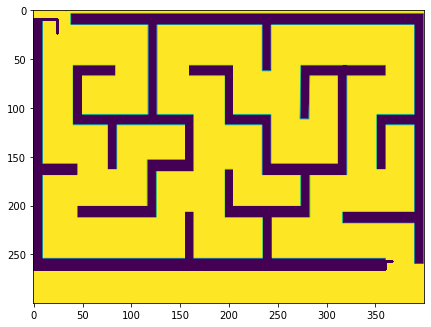

In [109]:
plt.figure(figsize = (7,7))
plt.imshow(maze)
plt.show()

In [68]:
mat

array([[ 1,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  1,  0,  1,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  1,  0,  0,  0,  1,  1,  1,  0,  0,  0],
       [ 0,  1,  0,  0,  0,  1,  0,  1,  0,  0,  0],
       [ 0,  1,  1,  1,  1,  1,  0,  1,  0,  0,  0],
       [ 0,  1,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 0,  1,  1,  0,  1,  0,  0,  1,  0,  0,  0],
       [ 0,  0,  1,  1,  1,  0,  1,  1,  0,  0,  0],
       [ 0,  0,  0,  0,  1,  0,  1,  1,  1,  0,  0],
       [ 0,  0,  0,  1,  1,  0,  0,  0, -2,  0,  0]])

In [72]:
maze2 = mat *255
maze2

array([[ 255,  255,  255,  255,    0,    0,    0,    0,    0,    0,    0],
       [   0,  255,    0,  255,    0,    0,    0,    0,    0,    0,    0],
       [   0,  255,    0,    0,    0,  255,  255,  255,    0,    0,    0],
       [   0,  255,    0,    0,    0,  255,    0,  255,    0,    0,    0],
       [   0,  255,  255,  255,  255,  255,    0,  255,    0,    0,    0],
       [   0,  255,    0,    0,    0,    0,    0,  255,    0,    0,    0],
       [   0,  255,  255,    0,  255,    0,    0,  255,    0,    0,    0],
       [   0,    0,  255,  255,  255,    0,  255,  255,    0,    0,    0],
       [   0,    0,    0,    0,  255,    0,  255,  255,  255,    0,    0],
       [   0,    0,    0,  255,  255,    0,    0,    0, -510,    0,    0]])

In [91]:
maze2[9][8] = 255

In [92]:
maze2

array([[255, 255, 255, 255,   0,   0,   0,   0,   0,   0,   0],
       [  0, 255,   0, 255,   0,   0,   0,   0,   0,   0,   0],
       [  0, 255,   0,   0,   0, 255, 255, 255,   0,   0,   0],
       [  0, 255,   0,   0,   0, 255,   0, 255,   0,   0,   0],
       [  0, 255, 255, 255, 255, 255,   0, 255,   0,   0,   0],
       [  0, 255,   0,   0,   0,   0,   0, 255,   0,   0,   0],
       [  0, 255, 255,   0, 255,   0,   0, 255,   0,   0,   0],
       [  0,   0, 255, 255, 255,   0, 255, 255,   0,   0,   0],
       [  0,   0,   0,   0, 255,   0, 255, 255, 255,   0,   0],
       [  0,   0,   0, 255, 255,   0,   0,   0, 255,   0,   0]])

In [93]:
path2 = find_shortest_path_bfs(maze2, 0,0,8,9)

rows 10
cols 11
visiting 0 0
visiting 1 0
visiting 1 1
visiting 0 0
visiting 2 0
visiting 1 2
visiting 3 0
visiting 1 3
visiting 3 1
visiting 1 4
visiting 1 5
visiting 2 4
visiting 1 6
visiting 3 4
visiting 2 6
visiting 4 4
visiting 2 7
visiting 5 4
visiting 3 7
visiting 5 3
visiting 4 7
visiting 5 2
visiting 4 6
visiting 4 8
visiting 6 2
visiting 4 9
visiting 7 2
visiting 3 9
visiting 7 3
visiting 7 4
visiting 7 5
visiting 7 6
visiting 7 7
visiting 7 8
visiting 6 7
visiting 6 8
visiting 8 8
found


In [94]:
print(path2)

[(8, 9), (8, 9), (8, 8), (7, 8), (7, 7), (7, 6), (7, 5), (7, 4), (7, 3), (7, 2), (6, 2), (5, 2), (5, 3), (5, 4), (4, 4), (3, 4), (2, 4), (1, 4), (1, 3), (1, 2), (1, 1), (1, 0)]


In [99]:
drawPath(maze2, path2)
plt.figure(figsize = (7,7))
plt.imshow(maze2)
plt.show()

TypeError: Expected Ptr<cv::UMat> for argument 'img'

In [9]:
def drawPath(img,path, thickness=2):
    '''path is a list of (x,y) tuples'''
    x0,y0=path[0]
    for vertex in path[1:]:
        print(vertex)
        x1,y1=vertex
        cv2.line(img,(x0,y0),(x1,y1),(0,0,255),thickness)
        x0,y0=vertex

In [46]:
hard_maze = cv2.imread('maze_images/circle_maze.png', 0)

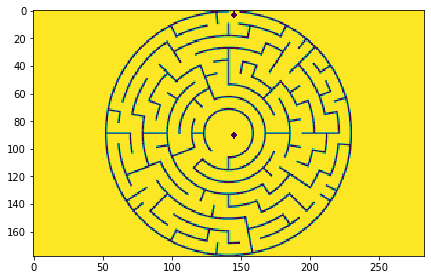

In [47]:
cv2.circle(hard_maze,(145,90), 2, (0,0,255), -1) # add a circle at (5, 220)
cv2.circle(hard_maze, (145,3), 2, (0,0,255), -1) # add a circle at (5,5)
plt.figure(figsize = (7,7))
plt.imshow(hard_maze)
plt.show()

In [26]:
hard_path = find_shortest_path_bfs(hard_maze, 300,340,800,815)

rows 860
cols 820
visiting 300 340
visiting 300 339
visiting 300 341
visiting 299 340
visiting 301 340
visiting 300 338
visiting 300 340
visiting 299 339
visiting 301 339
visiting 300 342
visiting 299 341
visiting 301 341
visiting 298 340
visiting 302 340
visiting 300 337
visiting 299 338
visiting 301 338
visiting 298 339
visiting 302 339
visiting 300 343
visiting 299 342
visiting 301 342
visiting 298 341
visiting 302 341
visiting 297 340
visiting 303 340
visiting 300 336
visiting 299 337
visiting 301 337
visiting 298 338
visiting 302 338
visiting 297 339
visiting 303 339
visiting 300 344
visiting 299 343
visiting 301 343
visiting 298 342
visiting 302 342
visiting 297 341
visiting 303 341
visiting 296 340
visiting 304 340
visiting 300 335
visiting 299 336
visiting 301 336
visiting 298 337
visiting 302 337
visiting 297 338
visiting 303 338
visiting 296 339
visiting 304 339
visiting 300 345
visiting 299 344
visiting 301 344
visiting 298 343
visiting 302 343
visiting 297 342
visiting 303 

visiting 279 342
visiting 321 342
visiting 278 341
visiting 322 341
visiting 277 340
visiting 323 340
visiting 287 329
visiting 313 329
visiting 286 330
visiting 314 330
visiting 285 331
visiting 315 331
visiting 284 332
visiting 316 332
visiting 283 333
visiting 317 333
visiting 282 334
visiting 318 334
visiting 281 335
visiting 319 335
visiting 280 336
visiting 320 336
visiting 279 337
visiting 321 337
visiting 278 338
visiting 322 338
visiting 277 339
visiting 323 339
visiting 300 364
visiting 299 363
visiting 301 363
visiting 298 362
visiting 302 362
visiting 303 361
visiting 304 360
visiting 305 359
visiting 306 358
visiting 307 357
visiting 308 356
visiting 291 355
visiting 309 355
visiting 290 354
visiting 310 354
visiting 289 353
visiting 311 353
visiting 288 352
visiting 312 352
visiting 287 351
visiting 313 351
visiting 286 350
visiting 314 350
visiting 285 349
visiting 315 349
visiting 284 348
visiting 316 348
visiting 283 347
visiting 317 347
visiting 282 346
visiting 318 3

visiting 309 367
visiting 310 366
visiting 311 365
visiting 312 364
visiting 313 363
visiting 314 362
visiting 315 361
visiting 316 360
visiting 317 359
visiting 318 358
visiting 319 357
visiting 320 356
visiting 285 361
visiting 284 360
visiting 283 359
visiting 282 358
visiting 281 357
visiting 280 356
visiting 279 355
visiting 321 355
visiting 278 354
visiting 322 354
visiting 277 353
visiting 323 353
visiting 276 352
visiting 324 352
visiting 275 351
visiting 325 351
visiting 274 350
visiting 326 350
visiting 273 349
visiting 327 349
visiting 272 348
visiting 328 348
visiting 271 347
visiting 329 347
visiting 270 346
visiting 330 346
visiting 269 345
visiting 331 345
visiting 268 344
visiting 332 344
visiting 267 343
visiting 333 343
visiting 266 342
visiting 334 342
visiting 265 341
visiting 335 341
visiting 264 340
visiting 336 340
visiting 274 329
visiting 326 329
visiting 273 330
visiting 327 330
visiting 272 331
visiting 328 331
visiting 271 332
visiting 329 332
visiting 270 3

visiting 312 375
visiting 313 374
visiting 314 373
visiting 315 372
visiting 316 371
visiting 317 370
visiting 318 369
visiting 319 368
visiting 320 367
visiting 321 366
visiting 322 365
visiting 323 364
visiting 324 363
visiting 325 362
visiting 326 361
visiting 327 360
visiting 328 359
visiting 329 358
visiting 330 357
visiting 331 356
visiting 285 372
visiting 284 371
visiting 283 370
visiting 282 369
visiting 281 368
visiting 280 367
visiting 279 366
visiting 278 365
visiting 277 364
visiting 276 363
visiting 275 362
visiting 274 361
visiting 273 360
visiting 272 359
visiting 271 358
visiting 270 357
visiting 269 356
visiting 268 355
visiting 332 355
visiting 267 354
visiting 333 354
visiting 266 353
visiting 334 353
visiting 265 352
visiting 335 352
visiting 264 351
visiting 336 351
visiting 263 350
visiting 337 350
visiting 262 349
visiting 338 349
visiting 261 348
visiting 339 348
visiting 260 347
visiting 340 347
visiting 259 346
visiting 341 346
visiting 342 345
visiting 343 3

visiting 331 367
visiting 332 366
visiting 333 365
visiting 334 364
visiting 335 363
visiting 336 362
visiting 337 361
visiting 338 360
visiting 339 359
visiting 340 358
visiting 341 357
visiting 342 356
visiting 285 383
visiting 284 382
visiting 283 381
visiting 282 380
visiting 281 379
visiting 280 378
visiting 279 377
visiting 278 376
visiting 277 375
visiting 276 374
visiting 275 373
visiting 274 372
visiting 273 371
visiting 272 370
visiting 271 369
visiting 270 368
visiting 269 367
visiting 268 366
visiting 267 365
visiting 266 364
visiting 265 363
visiting 264 362
visiting 263 361
visiting 262 360
visiting 261 359
visiting 260 358
visiting 259 357
visiting 343 355
visiting 344 354
visiting 345 353
visiting 346 352
visiting 347 351
visiting 348 350
visiting 349 349
visiting 350 348
visiting 351 347
visiting 352 346
visiting 353 345
visiting 354 344
visiting 355 343
visiting 356 342
visiting 357 341
visiting 358 340
visiting 348 329
visiting 349 330
visiting 350 331
visiting 351 3

visiting 358 349
visiting 359 348
visiting 360 347
visiting 361 346
visiting 362 345
visiting 363 344
visiting 364 343
visiting 365 342
visiting 366 341
visiting 367 340
visiting 357 329
visiting 358 330
visiting 359 331
visiting 360 332
visiting 361 333
visiting 362 334
visiting 363 335
visiting 364 336
visiting 365 337
visiting 366 338
visiting 367 339
visiting 300 408
visiting 299 407
visiting 301 407
visiting 298 406
visiting 302 406
visiting 303 405
visiting 304 404
visiting 305 403
visiting 306 402
visiting 307 401
visiting 308 400
visiting 309 399
visiting 310 398
visiting 311 397
visiting 312 396
visiting 313 395
visiting 314 394
visiting 315 393
visiting 316 392
visiting 317 391
visiting 318 390
visiting 319 389
visiting 320 388
visiting 321 387
visiting 322 386
visiting 323 385
visiting 324 384
visiting 325 383
visiting 326 382
visiting 327 381
visiting 328 380
visiting 329 379
visiting 330 378
visiting 331 377
visiting 332 376
visiting 333 375
visiting 334 374
visiting 335 3

visiting 267 383
visiting 266 382
visiting 265 381
visiting 264 380
visiting 263 379
visiting 262 378
visiting 261 377
visiting 260 376
visiting 259 375
visiting 258 374
visiting 257 373
visiting 256 372
visiting 255 371
visiting 254 370
visiting 253 369
visiting 252 368
visiting 251 367
visiting 361 355
visiting 362 354
visiting 363 353
visiting 364 352
visiting 365 351
visiting 366 350
visiting 367 349
visiting 368 348
visiting 369 347
visiting 370 346
visiting 371 345
visiting 372 344
visiting 373 343
visiting 374 342
visiting 375 341
visiting 376 340
visiting 366 329
visiting 367 330
visiting 368 331
visiting 369 332
visiting 370 333
visiting 371 334
visiting 372 335
visiting 373 336
visiting 374 337
visiting 375 338
visiting 376 339
visiting 300 417
visiting 299 416
visiting 301 416
visiting 298 415
visiting 302 415
visiting 303 414
visiting 304 413
visiting 305 412
visiting 306 411
visiting 307 410
visiting 308 409
visiting 309 408
visiting 310 407
visiting 311 406
visiting 312 4

visiting 308 416
visiting 309 415
visiting 310 414
visiting 311 413
visiting 312 412
visiting 313 411
visiting 314 410
visiting 315 409
visiting 316 408
visiting 317 407
visiting 318 406
visiting 319 405
visiting 320 404
visiting 321 403
visiting 322 402
visiting 323 401
visiting 324 400
visiting 325 399
visiting 326 398
visiting 327 397
visiting 328 396
visiting 329 395
visiting 330 394
visiting 331 393
visiting 332 392
visiting 333 391
visiting 334 390
visiting 335 389
visiting 336 388
visiting 337 387
visiting 338 386
visiting 339 385
visiting 340 384
visiting 341 383
visiting 342 382
visiting 343 381
visiting 344 380
visiting 345 379
visiting 346 378
visiting 347 377
visiting 348 376
visiting 349 375
visiting 350 374
visiting 351 373
visiting 352 372
visiting 353 371
visiting 354 370
visiting 355 369
visiting 356 368
visiting 357 367
visiting 358 366
visiting 359 365
visiting 360 364
visiting 361 363
visiting 362 362
visiting 363 361
visiting 364 360
visiting 365 359
visiting 366 3

visiting 249 379
visiting 248 378
visiting 247 377
visiting 246 376
visiting 245 375
visiting 244 374
visiting 243 373
visiting 242 372
visiting 241 371
visiting 240 370
visiting 239 369
visiting 238 368
visiting 246 358
visiting 245 359
visiting 244 360
visiting 243 361
visiting 242 362
visiting 241 363
visiting 240 364
visiting 239 365
visiting 238 366
visiting 237 367
visiting 375 355
visiting 376 354
visiting 377 353
visiting 378 352
visiting 379 351
visiting 380 350
visiting 381 349
visiting 382 348
visiting 383 347
visiting 384 346
visiting 385 345
visiting 386 344
visiting 387 343
visiting 388 342
visiting 389 341
visiting 390 340
visiting 380 329
visiting 381 330
visiting 382 331
visiting 383 332
visiting 384 333
visiting 385 334
visiting 386 335
visiting 387 336
visiting 388 337
visiting 389 338
visiting 390 339
visiting 300 431
visiting 299 430
visiting 301 430
visiting 298 429
visiting 302 429
visiting 303 428
visiting 304 427
visiting 305 426
visiting 306 425
visiting 307 4

visiting 252 388
visiting 251 387
visiting 250 386
visiting 249 385
visiting 248 384
visiting 247 383
visiting 246 382
visiting 245 381
visiting 244 380
visiting 243 379
visiting 242 378
visiting 241 377
visiting 240 376
visiting 239 375
visiting 238 374
visiting 237 373
visiting 236 372
visiting 235 371
visiting 234 370
visiting 233 369
visiting 232 368
visiting 246 352
visiting 245 353
visiting 244 354
visiting 243 355
visiting 242 356
visiting 241 357
visiting 240 358
visiting 239 359
visiting 238 360
visiting 237 361
visiting 236 362
visiting 235 363
visiting 234 364
visiting 233 365
visiting 232 366
visiting 231 367
visiting 381 355
visiting 382 354
visiting 383 353
visiting 384 352
visiting 385 351
visiting 386 350
visiting 387 349
visiting 388 348
visiting 389 347
visiting 390 346
visiting 391 345
visiting 392 344
visiting 393 343
visiting 394 342
visiting 395 341
visiting 396 340
visiting 386 329
visiting 387 330
visiting 388 331
visiting 389 332
visiting 390 333
visiting 391 3

visiting 232 373
visiting 231 372
visiting 230 371
visiting 229 370
visiting 228 369
visiting 227 368
visiting 246 347
visiting 245 348
visiting 244 349
visiting 243 350
visiting 242 351
visiting 241 352
visiting 240 353
visiting 239 354
visiting 238 355
visiting 237 356
visiting 236 357
visiting 235 358
visiting 234 359
visiting 233 360
visiting 232 361
visiting 231 362
visiting 230 363
visiting 229 364
visiting 228 365
visiting 227 366
visiting 226 367
visiting 386 355
visiting 387 354
visiting 388 353
visiting 389 352
visiting 390 351
visiting 391 350
visiting 392 349
visiting 393 348
visiting 394 347
visiting 395 346
visiting 396 345
visiting 397 344
visiting 398 343
visiting 399 342
visiting 400 341
visiting 401 340
visiting 391 329
visiting 392 330
visiting 393 331
visiting 394 332
visiting 395 333
visiting 396 334
visiting 397 335
visiting 398 336
visiting 399 337
visiting 400 338
visiting 401 339
visiting 300 442
visiting 299 441
visiting 301 441
visiting 298 440
visiting 302 4

visiting 261 407
visiting 260 406
visiting 259 405
visiting 258 404
visiting 248 394
visiting 247 393
visiting 246 392
visiting 245 391
visiting 244 390
visiting 243 389
visiting 242 388
visiting 241 387
visiting 240 386
visiting 239 385
visiting 238 384
visiting 237 383
visiting 236 382
visiting 235 381
visiting 234 380
visiting 233 379
visiting 232 378
visiting 231 377
visiting 230 376
visiting 229 375
visiting 228 374
visiting 227 373
visiting 226 372
visiting 225 371
visiting 224 370
visiting 223 369
visiting 222 368
visiting 246 342
visiting 245 343
visiting 244 344
visiting 243 345
visiting 242 346
visiting 241 347
visiting 240 348
visiting 239 349
visiting 238 350
visiting 237 351
visiting 236 352
visiting 235 353
visiting 234 354
visiting 233 355
visiting 232 356
visiting 231 357
visiting 230 358
visiting 229 359
visiting 228 360
visiting 227 361
visiting 226 362
visiting 225 363
visiting 224 364
visiting 223 365
visiting 222 366
visiting 221 367
visiting 391 355
visiting 392 3

visiting 331 420
visiting 332 419
visiting 333 418
visiting 334 417
visiting 335 416
visiting 336 415
visiting 337 414
visiting 338 413
visiting 339 412
visiting 340 411
visiting 341 410
visiting 342 409
visiting 343 408
visiting 344 407
visiting 345 406
visiting 346 405
visiting 347 404
visiting 348 403
visiting 349 402
visiting 350 401
visiting 351 400
visiting 352 399
visiting 353 398
visiting 354 397
visiting 355 396
visiting 356 395
visiting 357 394
visiting 358 393
visiting 359 392
visiting 360 391
visiting 361 390
visiting 362 389
visiting 363 388
visiting 364 387
visiting 365 386
visiting 366 385
visiting 367 384
visiting 368 383
visiting 369 382
visiting 370 381
visiting 371 380
visiting 372 379
visiting 373 378
visiting 374 377
visiting 375 376
visiting 376 375
visiting 377 374
visiting 378 373
visiting 379 372
visiting 380 371
visiting 381 370
visiting 382 369
visiting 383 368
visiting 384 367
visiting 385 366
visiting 386 365
visiting 387 364
visiting 388 363
visiting 389 3

visiting 223 378
visiting 222 377
visiting 221 376
visiting 220 375
visiting 219 374
visiting 246 333
visiting 245 334
visiting 244 335
visiting 243 336
visiting 242 337
visiting 241 338
visiting 240 339
visiting 239 340
visiting 238 341
visiting 237 342
visiting 236 343
visiting 235 344
visiting 234 345
visiting 233 346
visiting 232 347
visiting 231 348
visiting 230 349
visiting 229 350
visiting 228 351
visiting 227 352
visiting 226 353
visiting 225 354
visiting 224 355
visiting 223 356
visiting 222 357
visiting 221 358
visiting 220 359
visiting 219 360
visiting 400 355
visiting 401 354
visiting 402 353
visiting 403 352
visiting 404 351
visiting 405 350
visiting 406 349
visiting 407 348
visiting 408 347
visiting 409 346
visiting 410 345
visiting 411 344
visiting 412 343
visiting 413 342
visiting 414 341
visiting 415 340
visiting 405 329
visiting 406 330
visiting 407 331
visiting 408 332
visiting 409 333
visiting 410 334
visiting 411 335
visiting 412 336
visiting 413 337
visiting 414 3

visiting 391 369
visiting 392 368
visiting 393 367
visiting 394 366
visiting 395 365
visiting 396 364
visiting 397 363
visiting 398 362
visiting 399 361
visiting 400 360
visiting 401 359
visiting 402 358
visiting 403 357
visiting 404 356
visiting 285 445
visiting 284 444
visiting 283 443
visiting 282 442
visiting 281 441
visiting 280 440
visiting 279 439
visiting 278 438
visiting 277 437
visiting 276 436
visiting 275 435
visiting 274 434
visiting 273 433
visiting 272 432
visiting 271 431
visiting 270 430
visiting 269 429
visiting 268 428
visiting 267 427
visiting 266 426
visiting 265 425
visiting 264 424
visiting 263 423
visiting 262 422
visiting 261 421
visiting 260 420
visiting 259 419
visiting 258 418
visiting 234 394
visiting 233 393
visiting 232 392
visiting 231 391
visiting 230 390
visiting 229 389
visiting 228 388
visiting 227 387
visiting 226 386
visiting 225 385
visiting 224 384
visiting 223 383
visiting 222 382
visiting 221 381
visiting 220 380
visiting 219 379
visiting 245 3

visiting 325 440
visiting 326 439
visiting 327 438
visiting 328 437
visiting 329 436
visiting 330 435
visiting 331 434
visiting 332 433
visiting 333 432
visiting 334 431
visiting 335 430
visiting 336 429
visiting 337 428
visiting 338 427
visiting 339 426
visiting 340 425
visiting 341 424
visiting 342 423
visiting 343 422
visiting 344 421
visiting 345 420
visiting 346 419
visiting 347 418
visiting 348 417
visiting 349 416
visiting 350 415
visiting 351 414
visiting 352 413
visiting 353 412
visiting 354 411
visiting 355 410
visiting 356 409
visiting 357 408
visiting 358 407
visiting 359 406
visiting 360 405
visiting 361 404
visiting 362 403
visiting 363 402
visiting 364 401
visiting 365 400
visiting 366 399
visiting 367 398
visiting 368 397
visiting 369 396
visiting 370 395
visiting 371 394
visiting 372 393
visiting 373 392
visiting 374 391
visiting 375 390
visiting 376 389
visiting 377 388
visiting 378 387
visiting 379 386
visiting 380 385
visiting 381 384
visiting 382 383
visiting 383 3

visiting 390 380
visiting 391 379
visiting 392 378
visiting 393 377
visiting 394 376
visiting 395 375
visiting 396 374
visiting 397 373
visiting 398 372
visiting 399 371
visiting 400 370
visiting 401 369
visiting 402 368
visiting 403 367
visiting 404 366
visiting 405 365
visiting 406 364
visiting 407 363
visiting 408 362
visiting 409 361
visiting 410 360
visiting 411 359
visiting 412 358
visiting 413 357
visiting 414 356
visiting 285 455
visiting 284 454
visiting 283 453
visiting 282 452
visiting 281 451
visiting 280 450
visiting 279 449
visiting 278 448
visiting 277 447
visiting 276 446
visiting 275 445
visiting 274 444
visiting 273 443
visiting 272 442
visiting 271 441
visiting 270 440
visiting 269 439
visiting 268 438
visiting 267 437
visiting 266 436
visiting 265 435
visiting 264 434
visiting 263 433
visiting 262 432
visiting 261 431
visiting 260 430
visiting 259 429
visiting 258 428
visiting 224 394
visiting 223 393
visiting 222 392
visiting 221 391
visiting 220 390
visiting 219 3

visiting 379 397
visiting 380 396
visiting 381 395
visiting 382 394
visiting 383 393
visiting 384 392
visiting 385 391
visiting 386 390
visiting 387 389
visiting 388 388
visiting 389 387
visiting 390 386
visiting 391 385
visiting 392 384
visiting 393 383
visiting 394 382
visiting 395 381
visiting 396 380
visiting 397 379
visiting 398 378
visiting 399 377
visiting 400 376
visiting 401 375
visiting 402 374
visiting 403 373
visiting 404 372
visiting 405 371
visiting 406 370
visiting 407 369
visiting 408 368
visiting 409 367
visiting 410 366
visiting 411 365
visiting 412 364
visiting 413 363
visiting 414 362
visiting 415 361
visiting 416 360
visiting 417 359
visiting 418 358
visiting 419 357
visiting 420 356
visiting 285 461
visiting 284 460
visiting 283 459
visiting 282 458
visiting 281 457
visiting 280 456
visiting 279 455
visiting 278 454
visiting 277 453
visiting 276 452
visiting 275 451
visiting 274 450
visiting 273 449
visiting 272 448
visiting 271 447
visiting 270 446
visiting 269 4

visiting 395 387
visiting 396 386
visiting 397 385
visiting 398 384
visiting 399 383
visiting 400 382
visiting 401 381
visiting 402 380
visiting 403 379
visiting 404 378
visiting 405 377
visiting 406 376
visiting 407 375
visiting 408 374
visiting 409 373
visiting 410 372
visiting 411 371
visiting 412 370
visiting 413 369
visiting 414 368
visiting 415 367
visiting 416 366
visiting 417 365
visiting 418 364
visiting 419 363
visiting 420 362
visiting 421 361
visiting 422 360
visiting 423 359
visiting 424 358
visiting 425 357
visiting 426 356
visiting 285 467
visiting 284 466
visiting 283 465
visiting 282 464
visiting 281 463
visiting 280 462
visiting 279 461
visiting 278 460
visiting 277 459
visiting 276 458
visiting 275 457
visiting 274 456
visiting 273 455
visiting 272 454
visiting 271 453
visiting 270 452
visiting 269 451
visiting 268 450
visiting 267 449
visiting 266 448
visiting 265 447
visiting 264 446
visiting 263 445
visiting 262 444
visiting 261 443
visiting 260 442
visiting 259 4

visiting 436 351
visiting 437 350
visiting 438 349
visiting 439 348
visiting 440 347
visiting 441 346
visiting 442 345
visiting 443 344
visiting 444 343
visiting 445 342
visiting 446 341
visiting 447 340
visiting 437 329
visiting 438 330
visiting 439 331
visiting 440 332
visiting 441 333
visiting 442 334
visiting 443 335
visiting 444 336
visiting 445 337
visiting 446 338
visiting 447 339
visiting 300 488
visiting 299 487
visiting 301 487
visiting 298 486
visiting 302 486
visiting 303 485
visiting 304 484
visiting 305 483
visiting 306 482
visiting 307 481
visiting 308 480
visiting 309 479
visiting 310 478
visiting 311 477
visiting 312 476
visiting 313 475
visiting 314 474
visiting 315 473
visiting 316 472
visiting 317 471
visiting 318 470
visiting 319 469
visiting 320 468
visiting 321 467
visiting 322 466
visiting 323 465
visiting 324 464
visiting 325 463
visiting 326 462
visiting 327 461
visiting 328 460
visiting 329 459
visiting 330 458
visiting 331 457
visiting 332 456
visiting 333 4

visiting 346 447
visiting 347 446
visiting 348 445
visiting 349 444
visiting 350 443
visiting 351 442
visiting 352 441
visiting 353 440
visiting 354 439
visiting 355 438
visiting 356 437
visiting 357 436
visiting 358 435
visiting 359 434
visiting 360 433
visiting 361 432
visiting 362 431
visiting 363 430
visiting 364 429
visiting 365 428
visiting 366 427
visiting 367 426
visiting 368 425
visiting 369 424
visiting 370 423
visiting 371 422
visiting 372 421
visiting 373 420
visiting 374 419
visiting 375 418
visiting 376 417
visiting 377 416
visiting 378 415
visiting 379 414
visiting 380 413
visiting 381 412
visiting 382 411
visiting 383 410
visiting 384 409
visiting 385 408
visiting 386 407
visiting 387 406
visiting 388 405
visiting 389 404
visiting 390 403
visiting 391 402
visiting 392 401
visiting 393 400
visiting 394 399
visiting 395 398
visiting 396 397
visiting 397 396
visiting 398 395
visiting 399 394
visiting 400 393
visiting 401 392
visiting 402 391
visiting 403 390
visiting 404 3

visiting 402 395
visiting 403 394
visiting 404 393
visiting 405 392
visiting 406 391
visiting 407 390
visiting 408 389
visiting 409 388
visiting 410 387
visiting 411 386
visiting 412 385
visiting 413 384
visiting 414 383
visiting 415 382
visiting 416 381
visiting 417 380
visiting 418 379
visiting 419 378
visiting 420 377
visiting 421 376
visiting 422 375
visiting 423 374
visiting 424 373
visiting 425 372
visiting 426 371
visiting 427 370
visiting 428 369
visiting 429 368
visiting 430 367
visiting 431 366
visiting 432 365
visiting 433 364
visiting 434 363
visiting 435 362
visiting 436 361
visiting 437 360
visiting 438 359
visiting 439 358
visiting 440 357
visiting 441 356
visiting 275 472
visiting 274 471
visiting 273 470
visiting 272 469
visiting 271 468
visiting 270 467
visiting 269 466
visiting 268 465
visiting 267 464
visiting 266 463
visiting 265 462
visiting 264 461
visiting 263 460
visiting 262 459
visiting 261 458
visiting 260 457
visiting 259 456
visiting 258 455
visiting 257 4

visiting 245 445
visiting 244 446
visiting 207 325
visiting 206 326
visiting 205 327
visiting 204 328
visiting 203 329
visiting 202 330
visiting 201 331
visiting 200 332
visiting 199 333
visiting 198 334
visiting 197 335
visiting 196 336
visiting 195 337
visiting 194 338
visiting 193 339
visiting 192 340
visiting 191 341
visiting 190 342
visiting 189 343
visiting 188 344
visiting 187 345
visiting 186 346
visiting 185 347
visiting 184 348
visiting 183 349
visiting 182 350
visiting 181 351
visiting 447 355
visiting 448 354
visiting 449 353
visiting 450 352
visiting 451 351
visiting 452 350
visiting 453 349
visiting 454 348
visiting 455 347
visiting 456 346
visiting 457 345
visiting 458 344
visiting 459 343
visiting 460 342
visiting 461 341
visiting 462 340
visiting 452 329
visiting 453 330
visiting 454 331
visiting 455 332
visiting 456 333
visiting 457 334
visiting 458 335
visiting 459 336
visiting 460 337
visiting 461 338
visiting 462 339
visiting 300 503
visiting 299 502
visiting 301 5

visiting 400 408
visiting 401 407
visiting 402 406
visiting 403 405
visiting 404 404
visiting 405 403
visiting 406 402
visiting 407 401
visiting 408 400
visiting 409 399
visiting 410 398
visiting 411 397
visiting 412 396
visiting 413 395
visiting 414 394
visiting 415 393
visiting 416 392
visiting 417 391
visiting 418 390
visiting 419 389
visiting 420 388
visiting 421 387
visiting 422 386
visiting 423 385
visiting 424 384
visiting 425 383
visiting 426 382
visiting 427 381
visiting 428 380
visiting 429 379
visiting 430 378
visiting 431 377
visiting 432 376
visiting 433 375
visiting 434 374
visiting 435 373
visiting 436 372
visiting 437 371
visiting 438 370
visiting 439 369
visiting 440 368
visiting 441 367
visiting 442 366
visiting 443 365
visiting 444 364
visiting 445 363
visiting 446 362
visiting 447 361
visiting 448 360
visiting 449 359
visiting 450 358
visiting 451 357
visiting 452 356
visiting 264 472
visiting 263 471
visiting 262 470
visiting 261 469
visiting 260 468
visiting 259 4

visiting 469 344
visiting 470 343
visiting 471 342
visiting 472 341
visiting 473 340
visiting 463 329
visiting 464 330
visiting 465 331
visiting 466 332
visiting 467 333
visiting 468 334
visiting 469 335
visiting 470 336
visiting 471 337
visiting 472 338
visiting 473 339
visiting 300 514
visiting 299 513
visiting 301 513
visiting 298 512
visiting 302 512
visiting 303 511
visiting 304 510
visiting 305 509
visiting 306 508
visiting 307 507
visiting 308 506
visiting 309 505
visiting 310 504
visiting 311 503
visiting 312 502
visiting 313 501
visiting 314 500
visiting 315 499
visiting 316 498
visiting 317 497
visiting 318 496
visiting 319 495
visiting 320 494
visiting 321 493
visiting 322 492
visiting 323 491
visiting 324 490
visiting 325 489
visiting 326 488
visiting 327 487
visiting 328 486
visiting 329 485
visiting 330 484
visiting 331 483
visiting 332 482
visiting 333 481
visiting 334 480
visiting 335 479
visiting 336 478
visiting 337 477
visiting 338 476
visiting 339 475
visiting 340 4

visiting 467 329
visiting 468 330
visiting 469 331
visiting 470 332
visiting 471 333
visiting 472 334
visiting 473 335
visiting 474 336
visiting 475 337
visiting 476 338
visiting 477 339
visiting 300 518
visiting 299 517
visiting 301 517
visiting 298 516
visiting 302 516
visiting 303 515
visiting 304 514
visiting 305 513
visiting 306 512
visiting 307 511
visiting 308 510
visiting 309 509
visiting 310 508
visiting 311 507
visiting 312 506
visiting 313 505
visiting 314 504
visiting 315 503
visiting 316 502
visiting 317 501
visiting 318 500
visiting 319 499
visiting 320 498
visiting 321 497
visiting 322 496
visiting 323 495
visiting 324 494
visiting 325 493
visiting 326 492
visiting 327 491
visiting 328 490
visiting 329 489
visiting 330 488
visiting 331 487
visiting 332 486
visiting 333 485
visiting 334 484
visiting 335 483
visiting 336 482
visiting 337 481
visiting 338 480
visiting 339 479
visiting 340 478
visiting 341 477
visiting 342 476
visiting 343 475
visiting 344 474
visiting 345 4

visiting 202 310
visiting 212 310
visiting 201 311
visiting 213 311
visiting 200 312
visiting 214 312
visiting 199 313
visiting 215 313
visiting 198 314
visiting 216 314
visiting 197 315
visiting 217 315
visiting 196 316
visiting 218 316
visiting 195 317
visiting 194 318
visiting 193 319
visiting 192 320
visiting 191 321
visiting 190 322
visiting 189 323
visiting 188 324
visiting 187 325
visiting 186 326
visiting 185 327
visiting 184 328
visiting 183 329
visiting 182 330
visiting 181 331
visiting 180 332
visiting 467 355
visiting 468 354
visiting 469 353
visiting 470 352
visiting 471 351
visiting 472 350
visiting 473 349
visiting 474 348
visiting 475 347
visiting 476 346
visiting 477 345
visiting 478 344
visiting 479 343
visiting 480 342
visiting 481 341
visiting 482 340
visiting 472 329
visiting 473 330
visiting 474 331
visiting 475 332
visiting 476 333
visiting 477 334
visiting 478 335
visiting 479 336
visiting 480 337
visiting 481 338
visiting 482 339
visiting 300 523
visiting 299 5

visiting 420 407
visiting 421 406
visiting 422 405
visiting 423 404
visiting 424 403
visiting 425 402
visiting 426 401
visiting 427 400
visiting 428 399
visiting 429 398
visiting 430 397
visiting 431 396
visiting 432 395
visiting 433 394
visiting 434 393
visiting 435 392
visiting 436 391
visiting 437 390
visiting 438 389
visiting 439 388
visiting 440 387
visiting 441 386
visiting 442 385
visiting 443 384
visiting 444 383
visiting 445 382
visiting 446 381
visiting 447 380
visiting 448 379
visiting 449 378
visiting 450 377
visiting 451 376
visiting 452 375
visiting 453 374
visiting 454 373
visiting 455 372
visiting 456 371
visiting 457 370
visiting 458 369
visiting 459 368
visiting 460 367
visiting 461 366
visiting 462 365
visiting 463 364
visiting 464 363
visiting 465 362
visiting 466 361
visiting 467 360
visiting 468 359
visiting 469 358
visiting 470 357
visiting 471 356
visiting 245 472
visiting 244 471
visiting 243 470
visiting 242 469
visiting 241 468
visiting 240 467
visiting 239 4

visiting 368 464
visiting 369 463
visiting 370 462
visiting 371 461
visiting 372 460
visiting 373 459
visiting 374 458
visiting 375 457
visiting 376 456
visiting 377 455
visiting 378 454
visiting 379 453
visiting 380 452
visiting 381 451
visiting 382 450
visiting 383 449
visiting 384 448
visiting 385 447
visiting 386 446
visiting 387 445
visiting 388 444
visiting 389 443
visiting 390 442
visiting 391 441
visiting 392 440
visiting 393 439
visiting 394 438
visiting 395 437
visiting 396 436
visiting 397 435
visiting 398 434
visiting 399 433
visiting 400 432
visiting 401 431
visiting 402 430
visiting 403 429
visiting 404 428
visiting 405 427
visiting 406 426
visiting 407 425
visiting 408 424
visiting 409 423
visiting 410 422
visiting 411 421
visiting 412 420
visiting 413 419
visiting 414 418
visiting 415 417
visiting 416 416
visiting 417 415
visiting 418 414
visiting 419 413
visiting 420 412
visiting 421 411
visiting 422 410
visiting 423 409
visiting 424 408
visiting 425 407
visiting 426 4

visiting 391 445
visiting 392 444
visiting 393 443
visiting 394 442
visiting 395 441
visiting 396 440
visiting 397 439
visiting 398 438
visiting 399 437
visiting 400 436
visiting 401 435
visiting 402 434
visiting 403 433
visiting 404 432
visiting 405 431
visiting 406 430
visiting 407 429
visiting 408 428
visiting 409 427
visiting 410 426
visiting 411 425
visiting 412 424
visiting 413 423
visiting 414 422
visiting 415 421
visiting 416 420
visiting 417 419
visiting 418 418
visiting 419 417
visiting 420 416
visiting 421 415
visiting 422 414
visiting 423 413
visiting 424 412
visiting 425 411
visiting 426 410
visiting 427 409
visiting 428 408
visiting 429 407
visiting 430 406
visiting 431 405
visiting 432 404
visiting 433 403
visiting 434 402
visiting 435 401
visiting 436 400
visiting 437 399
visiting 438 398
visiting 439 397
visiting 440 396
visiting 441 395
visiting 442 394
visiting 443 393
visiting 444 392
visiting 445 391
visiting 446 390
visiting 447 389
visiting 448 388
visiting 449 3

visiting 187 307
visiting 227 307
visiting 186 308
visiting 228 308
visiting 185 309
visiting 229 309
visiting 184 310
visiting 230 310
visiting 183 311
visiting 231 311
visiting 182 312
visiting 232 312
visiting 181 313
visiting 233 313
visiting 180 314
visiting 234 314
visiting 235 315
visiting 236 316
visiting 485 355
visiting 486 354
visiting 487 353
visiting 488 352
visiting 489 351
visiting 490 350
visiting 491 349
visiting 492 348
visiting 493 347
visiting 494 346
visiting 495 345
visiting 496 344
visiting 497 343
visiting 498 342
visiting 499 341
visiting 500 340
visiting 490 329
visiting 491 330
visiting 492 331
visiting 493 332
visiting 494 333
visiting 495 334
visiting 496 335
visiting 497 336
visiting 498 337
visiting 499 338
visiting 500 339
visiting 300 541
visiting 299 540
visiting 301 540
visiting 298 539
visiting 302 539
visiting 303 538
visiting 304 537
visiting 305 536
visiting 306 535
visiting 307 534
visiting 308 533
visiting 309 532
visiting 310 531
visiting 311 5

visiting 392 453
visiting 393 452
visiting 394 451
visiting 395 450
visiting 396 449
visiting 397 448
visiting 398 447
visiting 399 446
visiting 400 445
visiting 401 444
visiting 402 443
visiting 403 442
visiting 404 441
visiting 405 440
visiting 406 439
visiting 407 438
visiting 408 437
visiting 409 436
visiting 410 435
visiting 411 434
visiting 412 433
visiting 413 432
visiting 414 431
visiting 415 430
visiting 416 429
visiting 417 428
visiting 418 427
visiting 419 426
visiting 420 425
visiting 421 424
visiting 422 423
visiting 423 422
visiting 424 421
visiting 425 420
visiting 426 419
visiting 427 418
visiting 428 417
visiting 429 416
visiting 430 415
visiting 431 414
visiting 432 413
visiting 433 412
visiting 434 411
visiting 435 410
visiting 436 409
visiting 437 408
visiting 438 407
visiting 439 406
visiting 440 405
visiting 441 404
visiting 442 403
visiting 443 402
visiting 444 401
visiting 445 400
visiting 446 399
visiting 447 398
visiting 448 397
visiting 449 396
visiting 450 3

visiting 343 506
visiting 344 505
visiting 345 504
visiting 346 503
visiting 347 502
visiting 348 501
visiting 349 500
visiting 350 499
visiting 351 498
visiting 352 497
visiting 353 496
visiting 354 495
visiting 355 494
visiting 356 493
visiting 357 492
visiting 358 491
visiting 359 490
visiting 360 489
visiting 361 488
visiting 362 487
visiting 363 486
visiting 364 485
visiting 365 484
visiting 366 483
visiting 367 482
visiting 368 481
visiting 369 480
visiting 370 479
visiting 371 478
visiting 372 477
visiting 373 476
visiting 374 475
visiting 375 474
visiting 376 473
visiting 377 472
visiting 378 471
visiting 379 470
visiting 380 469
visiting 381 468
visiting 382 467
visiting 383 466
visiting 384 465
visiting 385 464
visiting 386 463
visiting 387 462
visiting 388 461
visiting 389 460
visiting 390 459
visiting 391 458
visiting 392 457
visiting 393 456
visiting 394 455
visiting 395 454
visiting 396 453
visiting 397 452
visiting 398 451
visiting 399 450
visiting 400 449
visiting 401 4

visiting 505 347
visiting 506 346
visiting 507 345
visiting 508 344
visiting 509 343
visiting 510 342
visiting 511 341
visiting 512 340
visiting 502 329
visiting 503 330
visiting 504 331
visiting 505 332
visiting 506 333
visiting 507 334
visiting 508 335
visiting 509 336
visiting 510 337
visiting 511 338
visiting 512 339
visiting 302 551
visiting 303 550
visiting 304 549
visiting 305 548
visiting 306 547
visiting 307 546
visiting 308 545
visiting 309 544
visiting 310 543
visiting 311 542
visiting 312 541
visiting 313 540
visiting 314 539
visiting 315 538
visiting 316 537
visiting 317 536
visiting 318 535
visiting 319 534
visiting 320 533
visiting 321 532
visiting 322 531
visiting 323 530
visiting 324 529
visiting 325 528
visiting 326 527
visiting 327 526
visiting 328 525
visiting 329 524
visiting 330 523
visiting 331 522
visiting 332 521
visiting 333 520
visiting 334 519
visiting 335 518
visiting 336 517
visiting 337 516
visiting 338 515
visiting 339 514
visiting 340 513
visiting 341 5

visiting 236 300
visiting 237 301
visiting 238 302
visiting 239 303
visiting 240 304
visiting 241 305
visiting 242 306
visiting 243 307
visiting 244 308
visiting 245 309
visiting 246 310
visiting 247 311
visiting 248 312
visiting 249 313
visiting 250 314
visiting 251 315
visiting 252 316
visiting 501 355
visiting 502 354
visiting 503 353
visiting 504 352
visiting 505 351
visiting 506 350
visiting 507 349
visiting 508 348
visiting 509 347
visiting 510 346
visiting 511 345
visiting 512 344
visiting 513 343
visiting 514 342
visiting 515 341
visiting 516 340
visiting 506 329
visiting 507 330
visiting 508 331
visiting 509 332
visiting 510 333
visiting 511 334
visiting 512 335
visiting 513 336
visiting 514 337
visiting 515 338
visiting 516 339
visiting 306 551
visiting 307 550
visiting 308 549
visiting 309 548
visiting 310 547
visiting 311 546
visiting 312 545
visiting 313 544
visiting 314 543
visiting 315 542
visiting 316 541
visiting 317 540
visiting 318 539
visiting 319 538
visiting 320 5

visiting 463 397
visiting 464 396
visiting 465 395
visiting 466 394
visiting 467 393
visiting 468 392
visiting 469 391
visiting 470 390
visiting 471 389
visiting 472 388
visiting 473 387
visiting 474 386
visiting 475 385
visiting 476 384
visiting 477 383
visiting 478 382
visiting 479 381
visiting 480 380
visiting 481 379
visiting 482 378
visiting 483 377
visiting 484 376
visiting 485 375
visiting 486 374
visiting 487 373
visiting 488 372
visiting 489 371
visiting 490 370
visiting 491 369
visiting 492 368
visiting 493 367
visiting 494 366
visiting 495 365
visiting 496 364
visiting 497 363
visiting 498 362
visiting 499 361
visiting 500 360
visiting 501 359
visiting 502 358
visiting 503 357
visiting 504 356
visiting 212 472
visiting 211 471
visiting 210 470
visiting 209 469
visiting 208 468
visiting 207 467
visiting 206 466
visiting 205 465
visiting 204 464
visiting 203 463
visiting 202 462
visiting 201 461
visiting 200 460
visiting 199 459
visiting 198 458
visiting 197 457
visiting 196 4

visiting 212 426
visiting 201 427
visiting 213 427
visiting 200 428
visiting 214 428
visiting 199 429
visiting 215 429
visiting 198 430
visiting 216 430
visiting 197 431
visiting 217 431
visiting 196 432
visiting 218 432
visiting 195 433
visiting 219 433
visiting 194 434
visiting 220 434
visiting 193 435
visiting 192 436
visiting 191 437
visiting 190 438
visiting 189 439
visiting 188 440
visiting 187 441
visiting 186 442
visiting 185 443
visiting 184 444
visiting 183 445
visiting 182 446
visiting 181 289
visiting 233 289
visiting 234 290
visiting 235 291
visiting 236 292
visiting 237 293
visiting 238 294
visiting 239 295
visiting 240 296
visiting 241 297
visiting 242 298
visiting 243 299
visiting 244 300
visiting 245 301
visiting 246 302
visiting 247 303
visiting 248 304
visiting 249 305
visiting 250 306
visiting 251 307
visiting 252 308
visiting 253 309
visiting 254 310
visiting 255 311
visiting 256 312
visiting 257 313
visiting 258 314
visiting 259 315
visiting 260 316
visiting 509 3

visiting 187 455
visiting 186 454
visiting 185 453
visiting 184 452
visiting 183 451
visiting 182 450
visiting 181 449
visiting 180 448
visiting 207 417
visiting 206 418
visiting 208 418
visiting 205 419
visiting 209 419
visiting 204 420
visiting 210 420
visiting 203 421
visiting 211 421
visiting 202 422
visiting 212 422
visiting 201 423
visiting 213 423
visiting 200 424
visiting 214 424
visiting 199 425
visiting 215 425
visiting 198 426
visiting 216 426
visiting 197 427
visiting 217 427
visiting 196 428
visiting 218 428
visiting 195 429
visiting 219 429
visiting 194 430
visiting 220 430
visiting 193 431
visiting 221 431
visiting 192 432
visiting 222 432
visiting 191 433
visiting 223 433
visiting 190 434
visiting 224 434
visiting 189 435
visiting 188 436
visiting 187 437
visiting 186 438
visiting 185 439
visiting 184 440
visiting 183 441
visiting 182 442
visiting 181 443
visiting 180 444
visiting 237 289
visiting 238 290
visiting 239 291
visiting 240 292
visiting 241 293
visiting 242 2

visiting 431 441
visiting 432 440
visiting 433 439
visiting 434 438
visiting 435 437
visiting 436 436
visiting 437 435
visiting 438 434
visiting 439 433
visiting 440 432
visiting 441 431
visiting 442 430
visiting 443 429
visiting 444 428
visiting 445 427
visiting 446 426
visiting 447 425
visiting 448 424
visiting 449 423
visiting 450 422
visiting 451 421
visiting 452 420
visiting 453 419
visiting 454 418
visiting 455 417
visiting 456 416
visiting 457 415
visiting 458 414
visiting 459 413
visiting 460 412
visiting 461 411
visiting 462 410
visiting 463 409
visiting 464 408
visiting 465 407
visiting 466 406
visiting 467 405
visiting 468 404
visiting 469 403
visiting 470 402
visiting 471 401
visiting 472 400
visiting 473 399
visiting 474 398
visiting 475 397
visiting 476 396
visiting 477 395
visiting 478 394
visiting 479 393
visiting 480 392
visiting 481 391
visiting 482 390
visiting 483 389
visiting 484 388
visiting 485 387
visiting 486 386
visiting 487 385
visiting 488 384
visiting 489 3

visiting 187 429
visiting 227 429
visiting 186 430
visiting 228 430
visiting 185 431
visiting 229 431
visiting 184 432
visiting 230 432
visiting 183 433
visiting 231 433
visiting 182 434
visiting 232 434
visiting 181 435
visiting 180 436
visiting 245 289
visiting 246 290
visiting 247 291
visiting 248 292
visiting 249 293
visiting 250 294
visiting 251 295
visiting 252 296
visiting 253 297
visiting 254 298
visiting 255 299
visiting 256 300
visiting 257 301
visiting 258 302
visiting 259 303
visiting 260 304
visiting 261 305
visiting 262 306
visiting 263 307
visiting 264 308
visiting 265 309
visiting 266 310
visiting 267 311
visiting 268 312
visiting 269 313
visiting 270 314
visiting 271 315
visiting 272 316
visiting 521 355
visiting 326 551
visiting 327 550
visiting 328 549
visiting 329 548
visiting 330 547
visiting 331 546
visiting 332 545
visiting 333 544
visiting 334 543
visiting 335 542
visiting 336 541
visiting 337 540
visiting 338 539
visiting 339 538
visiting 340 537
visiting 341 5

visiting 436 445
visiting 437 444
visiting 438 443
visiting 439 442
visiting 440 441
visiting 441 440
visiting 442 439
visiting 443 438
visiting 444 437
visiting 445 436
visiting 446 435
visiting 447 434
visiting 448 433
visiting 449 432
visiting 450 431
visiting 451 430
visiting 452 429
visiting 453 428
visiting 454 427
visiting 455 426
visiting 456 425
visiting 457 424
visiting 458 423
visiting 459 422
visiting 460 421
visiting 461 420
visiting 462 419
visiting 463 418
visiting 464 417
visiting 465 416
visiting 466 415
visiting 467 414
visiting 468 413
visiting 469 412
visiting 470 411
visiting 471 410
visiting 472 409
visiting 473 408
visiting 474 407
visiting 475 406
visiting 476 405
visiting 477 404
visiting 478 403
visiting 479 402
visiting 480 401
visiting 481 400
visiting 482 399
visiting 483 398
visiting 484 397
visiting 485 396
visiting 486 395
visiting 487 394
visiting 488 393
visiting 489 392
visiting 490 391
visiting 491 390
visiting 492 389
visiting 493 388
visiting 494 3

visiting 461 424
visiting 462 423
visiting 463 422
visiting 464 421
visiting 465 420
visiting 466 419
visiting 467 418
visiting 468 417
visiting 469 416
visiting 470 415
visiting 471 414
visiting 472 413
visiting 473 412
visiting 474 411
visiting 475 410
visiting 476 409
visiting 477 408
visiting 478 407
visiting 479 406
visiting 480 405
visiting 481 404
visiting 482 403
visiting 483 402
visiting 484 401
visiting 485 400
visiting 486 399
visiting 487 398
visiting 488 397
visiting 489 396
visiting 490 395
visiting 491 394
visiting 492 393
visiting 493 392
visiting 494 391
visiting 495 390
visiting 496 389
visiting 497 388
visiting 498 387
visiting 499 386
visiting 500 385
visiting 501 384
visiting 502 383
visiting 503 382
visiting 504 381
visiting 505 380
visiting 506 379
visiting 507 378
visiting 508 377
visiting 509 376
visiting 510 375
visiting 511 374
visiting 512 373
visiting 513 372
visiting 514 371
visiting 515 370
visiting 516 369
visiting 517 368
visiting 518 367
visiting 519 3

visiting 503 386
visiting 504 385
visiting 505 384
visiting 506 383
visiting 507 382
visiting 508 381
visiting 509 380
visiting 510 379
visiting 511 378
visiting 512 377
visiting 513 376
visiting 514 375
visiting 515 374
visiting 516 373
visiting 517 372
visiting 518 371
visiting 519 370
visiting 520 369
visiting 521 368
visiting 183 472
visiting 182 471
visiting 181 470
visiting 180 469
visiting 207 396
visiting 206 397
visiting 205 398
visiting 204 399
visiting 203 400
visiting 202 401
visiting 201 402
visiting 200 403
visiting 199 404
visiting 198 405
visiting 197 406
visiting 196 407
visiting 218 407
visiting 195 408
visiting 219 408
visiting 194 409
visiting 220 409
visiting 193 410
visiting 221 410
visiting 192 411
visiting 222 411
visiting 191 412
visiting 223 412
visiting 190 413
visiting 224 413
visiting 189 414
visiting 225 414
visiting 188 415
visiting 226 415
visiting 187 416
visiting 227 416
visiting 186 417
visiting 228 417
visiting 185 418
visiting 229 418
visiting 184 4

visiting 168 437
visiting 167 436
visiting 166 435
visiting 165 434
visiting 259 286
visiting 260 287
visiting 261 288
visiting 262 289
visiting 263 290
visiting 264 291
visiting 265 292
visiting 266 293
visiting 267 294
visiting 268 295
visiting 269 296
visiting 270 297
visiting 271 298
visiting 272 299
visiting 273 300
visiting 274 301
visiting 275 302
visiting 276 303
visiting 277 304
visiting 278 305
visiting 279 306
visiting 280 307
visiting 281 308
visiting 282 309
visiting 283 310
visiting 284 311
visiting 285 312
visiting 286 313
visiting 287 314
visiting 288 315
visiting 289 316
visiting 343 551
visiting 344 550
visiting 345 549
visiting 346 548
visiting 347 547
visiting 348 546
visiting 349 545
visiting 350 544
visiting 351 543
visiting 352 542
visiting 353 541
visiting 354 540
visiting 355 539
visiting 356 538
visiting 357 537
visiting 358 536
visiting 359 535
visiting 360 534
visiting 361 533
visiting 362 532
visiting 363 531
visiting 364 530
visiting 365 529
visiting 366 5

visiting 453 445
visiting 454 444
visiting 455 443
visiting 456 442
visiting 457 441
visiting 458 440
visiting 459 439
visiting 460 438
visiting 461 437
visiting 462 436
visiting 463 435
visiting 464 434
visiting 465 433
visiting 466 432
visiting 467 431
visiting 468 430
visiting 469 429
visiting 470 428
visiting 471 427
visiting 472 426
visiting 473 425
visiting 474 424
visiting 475 423
visiting 476 422
visiting 477 421
visiting 478 420
visiting 479 419
visiting 480 418
visiting 481 417
visiting 482 416
visiting 483 415
visiting 484 414
visiting 485 413
visiting 486 412
visiting 487 411
visiting 488 410
visiting 489 409
visiting 490 408
visiting 491 407
visiting 492 406
visiting 493 405
visiting 494 404
visiting 495 403
visiting 496 402
visiting 497 401
visiting 498 400
visiting 499 399
visiting 500 398
visiting 501 397
visiting 502 396
visiting 503 395
visiting 504 394
visiting 505 393
visiting 506 392
visiting 507 391
visiting 508 390
visiting 509 389
visiting 510 388
visiting 511 3

visiting 470 432
visiting 471 431
visiting 472 430
visiting 473 429
visiting 474 428
visiting 475 427
visiting 476 426
visiting 477 425
visiting 478 424
visiting 479 423
visiting 480 422
visiting 481 421
visiting 482 420
visiting 483 419
visiting 484 418
visiting 485 417
visiting 486 416
visiting 487 415
visiting 488 414
visiting 489 413
visiting 490 412
visiting 491 411
visiting 492 410
visiting 493 409
visiting 494 408
visiting 495 407
visiting 496 406
visiting 497 405
visiting 498 404
visiting 499 403
visiting 500 402
visiting 501 401
visiting 502 400
visiting 503 399
visiting 504 398
visiting 505 397
visiting 506 396
visiting 507 395
visiting 508 394
visiting 509 393
visiting 510 392
visiting 511 391
visiting 512 390
visiting 513 389
visiting 514 388
visiting 515 387
visiting 516 386
visiting 517 385
visiting 518 384
visiting 519 383
visiting 520 382
visiting 521 381
visiting 207 383
visiting 206 384
visiting 205 385
visiting 204 386
visiting 203 387
visiting 202 388
visiting 201 3

visiting 282 296
visiting 283 297
visiting 284 298
visiting 285 299
visiting 286 300
visiting 287 301
visiting 288 302
visiting 289 303
visiting 290 304
visiting 291 305
visiting 292 306
visiting 293 307
visiting 294 308
visiting 295 309
visiting 296 310
visiting 297 311
visiting 298 312
visiting 299 313
visiting 300 314
visiting 301 315
visiting 302 316
visiting 356 551
visiting 357 550
visiting 358 549
visiting 359 548
visiting 360 547
visiting 361 546
visiting 362 545
visiting 363 544
visiting 364 543
visiting 365 542
visiting 366 541
visiting 367 540
visiting 368 539
visiting 369 538
visiting 370 537
visiting 371 536
visiting 372 535
visiting 373 534
visiting 374 533
visiting 375 532
visiting 376 531
visiting 377 530
visiting 378 529
visiting 379 528
visiting 380 527
visiting 381 526
visiting 382 525
visiting 383 524
visiting 384 523
visiting 385 522
visiting 386 521
visiting 387 520
visiting 388 519
visiting 389 518
visiting 390 517
visiting 391 516
visiting 392 515
visiting 393 5

visiting 158 424
visiting 157 425
visiting 156 426
visiting 155 427
visiting 154 428
visiting 153 429
visiting 152 430
visiting 151 431
visiting 150 432
visiting 149 433
visiting 168 454
visiting 167 453
visiting 166 452
visiting 165 451
visiting 164 450
visiting 163 449
visiting 162 448
visiting 161 447
visiting 160 446
visiting 159 445
visiting 158 444
visiting 157 443
visiting 156 442
visiting 155 441
visiting 154 440
visiting 153 439
visiting 152 438
visiting 151 437
visiting 150 436
visiting 149 435
visiting 148 434
visiting 259 269
visiting 260 270
visiting 261 271
visiting 262 272
visiting 263 273
visiting 264 274
visiting 265 275
visiting 266 276
visiting 267 277
visiting 268 278
visiting 269 279
visiting 270 280
visiting 271 281
visiting 272 282
visiting 273 283
visiting 274 284
visiting 275 285
visiting 276 286
visiting 277 287
visiting 278 288
visiting 279 289
visiting 280 290
visiting 281 291
visiting 282 292
visiting 283 293
visiting 284 294
visiting 285 295
visiting 286 2

visiting 444 470
visiting 445 469
visiting 446 468
visiting 447 467
visiting 448 466
visiting 449 465
visiting 450 464
visiting 451 463
visiting 452 462
visiting 453 461
visiting 454 460
visiting 455 459
visiting 456 458
visiting 457 457
visiting 458 456
visiting 459 455
visiting 460 454
visiting 461 453
visiting 462 452
visiting 463 451
visiting 464 450
visiting 465 449
visiting 466 448
visiting 467 447
visiting 468 446
visiting 469 445
visiting 470 444
visiting 471 443
visiting 472 442
visiting 473 441
visiting 474 440
visiting 475 439
visiting 476 438
visiting 477 437
visiting 478 436
visiting 479 435
visiting 480 434
visiting 481 433
visiting 482 432
visiting 483 431
visiting 484 430
visiting 485 429
visiting 486 428
visiting 487 427
visiting 488 426
visiting 489 425
visiting 490 424
visiting 491 423
visiting 492 422
visiting 493 421
visiting 494 420
visiting 495 419
visiting 496 418
visiting 497 417
visiting 498 416
visiting 499 415
visiting 500 414
visiting 501 413
visiting 502 4

visiting 434 484
visiting 435 483
visiting 436 482
visiting 437 481
visiting 438 480
visiting 439 479
visiting 440 478
visiting 441 477
visiting 442 476
visiting 443 475
visiting 444 474
visiting 445 473
visiting 446 472
visiting 447 471
visiting 448 470
visiting 449 469
visiting 450 468
visiting 451 467
visiting 452 466
visiting 453 465
visiting 454 464
visiting 455 463
visiting 456 462
visiting 457 461
visiting 458 460
visiting 459 459
visiting 460 458
visiting 461 457
visiting 462 456
visiting 463 455
visiting 464 454
visiting 465 453
visiting 466 452
visiting 467 451
visiting 468 450
visiting 469 449
visiting 470 448
visiting 471 447
visiting 472 446
visiting 473 445
visiting 474 444
visiting 475 443
visiting 476 442
visiting 477 441
visiting 478 440
visiting 479 439
visiting 480 438
visiting 481 437
visiting 482 436
visiting 483 435
visiting 484 434
visiting 485 433
visiting 486 432
visiting 487 431
visiting 488 430
visiting 489 429
visiting 490 428
visiting 491 427
visiting 492 4

visiting 149 447
visiting 148 446
visiting 147 445
visiting 146 444
visiting 145 443
visiting 144 442
visiting 143 441
visiting 142 440
visiting 141 439
visiting 259 257
visiting 260 258
visiting 261 259
visiting 262 260
visiting 263 261
visiting 264 262
visiting 265 263
visiting 266 264
visiting 267 265
visiting 268 266
visiting 269 267
visiting 270 268
visiting 271 269
visiting 272 270
visiting 273 271
visiting 274 272
visiting 275 273
visiting 276 274
visiting 277 275
visiting 278 276
visiting 279 277
visiting 280 278
visiting 281 279
visiting 282 280
visiting 283 281
visiting 284 282
visiting 285 283
visiting 286 284
visiting 290 288
visiting 291 289
visiting 292 290
visiting 293 291
visiting 294 292
visiting 295 293
visiting 296 294
visiting 297 295
visiting 298 296
visiting 299 297
visiting 300 298
visiting 301 299
visiting 302 300
visiting 303 301
visiting 304 302
visiting 305 303
visiting 306 304
visiting 307 305
visiting 308 306
visiting 309 307
visiting 310 308
visiting 311 3

visiting 515 411
visiting 516 410
visiting 517 409
visiting 518 408
visiting 519 407
visiting 520 406
visiting 521 405
visiting 198 368
visiting 197 369
visiting 196 370
visiting 195 371
visiting 194 372
visiting 193 373
visiting 192 374
visiting 191 375
visiting 190 376
visiting 189 377
visiting 188 378
visiting 187 379
visiting 186 380
visiting 185 381
visiting 184 382
visiting 183 383
visiting 182 384
visiting 181 385
visiting 180 386
visiting 160 406
visiting 159 407
visiting 158 408
visiting 157 409
visiting 156 410
visiting 155 411
visiting 154 412
visiting 153 413
visiting 152 414
visiting 151 415
visiting 150 416
visiting 149 417
visiting 148 418
visiting 147 419
visiting 146 420
visiting 145 421
visiting 144 422
visiting 143 423
visiting 142 424
visiting 141 425
visiting 168 470
visiting 167 469
visiting 166 468
visiting 165 467
visiting 164 466
visiting 163 465
visiting 162 464
visiting 161 463
visiting 160 462
visiting 159 461
visiting 158 460
visiting 157 459
visiting 156 4

visiting 493 437
visiting 494 436
visiting 495 435
visiting 496 434
visiting 497 433
visiting 498 432
visiting 499 431
visiting 500 430
visiting 501 429
visiting 502 428
visiting 503 427
visiting 504 426
visiting 505 425
visiting 506 424
visiting 507 423
visiting 508 422
visiting 509 421
visiting 510 420
visiting 511 419
visiting 512 418
visiting 513 417
visiting 514 416
visiting 515 415
visiting 516 414
visiting 517 413
visiting 518 412
visiting 519 411
visiting 520 410
visiting 521 409
visiting 194 368
visiting 193 369
visiting 192 370
visiting 191 371
visiting 190 372
visiting 189 373
visiting 188 374
visiting 187 375
visiting 186 376
visiting 185 377
visiting 184 378
visiting 183 379
visiting 182 380
visiting 181 381
visiting 180 382
visiting 156 406
visiting 155 407
visiting 154 408
visiting 153 409
visiting 152 410
visiting 151 411
visiting 150 412
visiting 149 413
visiting 148 414
visiting 147 415
visiting 146 416
visiting 145 417
visiting 144 418
visiting 143 419
visiting 142 4

visiting 443 492
visiting 444 491
visiting 445 490
visiting 446 489
visiting 447 488
visiting 448 487
visiting 449 486
visiting 450 485
visiting 451 484
visiting 452 483
visiting 453 482
visiting 454 481
visiting 455 480
visiting 456 479
visiting 457 478
visiting 458 477
visiting 459 476
visiting 460 475
visiting 461 474
visiting 462 473
visiting 463 472
visiting 464 471
visiting 465 470
visiting 466 469
visiting 467 468
visiting 468 467
visiting 469 466
visiting 470 465
visiting 471 464
visiting 472 463
visiting 473 462
visiting 474 461
visiting 475 460
visiting 476 459
visiting 477 458
visiting 478 457
visiting 479 456
visiting 480 455
visiting 481 454
visiting 482 453
visiting 483 452
visiting 484 451
visiting 485 450
visiting 486 449
visiting 487 448
visiting 488 447
visiting 489 446
visiting 490 445
visiting 491 444
visiting 492 443
visiting 493 442
visiting 494 441
visiting 495 440
visiting 496 439
visiting 497 438
visiting 498 437
visiting 499 436
visiting 500 435
visiting 501 4

visiting 501 439
visiting 502 438
visiting 503 437
visiting 504 436
visiting 505 435
visiting 506 434
visiting 507 433
visiting 508 432
visiting 509 431
visiting 510 430
visiting 511 429
visiting 512 428
visiting 513 427
visiting 514 426
visiting 515 425
visiting 516 424
visiting 517 423
visiting 518 422
visiting 519 421
visiting 520 420
visiting 521 419
visiting 184 368
visiting 183 369
visiting 182 370
visiting 181 371
visiting 180 372
visiting 146 406
visiting 145 407
visiting 144 408
visiting 143 409
visiting 142 410
visiting 141 411
visiting 168 484
visiting 167 483
visiting 166 482
visiting 165 481
visiting 164 480
visiting 163 479
visiting 162 478
visiting 161 477
visiting 160 476
visiting 159 475
visiting 158 474
visiting 157 473
visiting 156 472
visiting 155 471
visiting 154 470
visiting 153 469
visiting 152 468
visiting 151 467
visiting 150 466
visiting 149 465
visiting 148 464
visiting 147 463
visiting 146 462
visiting 145 461
visiting 144 460
visiting 143 459
visiting 142 4

visiting 281 256
visiting 282 257
visiting 283 258
visiting 284 259
visiting 285 260
visiting 286 261
visiting 287 262
visiting 288 263
visiting 289 264
visiting 290 265
visiting 291 266
visiting 292 267
visiting 293 268
visiting 294 269
visiting 295 270
visiting 296 271
visiting 297 272
visiting 298 273
visiting 299 274
visiting 300 275
visiting 301 276
visiting 313 288
visiting 314 289
visiting 315 290
visiting 316 291
visiting 317 292
visiting 318 293
visiting 319 294
visiting 320 295
visiting 321 296
visiting 322 297
visiting 323 298
visiting 324 299
visiting 325 300
visiting 326 301
visiting 327 302
visiting 328 303
visiting 329 304
visiting 330 305
visiting 331 306
visiting 332 307
visiting 333 308
visiting 334 309
visiting 335 310
visiting 336 311
visiting 337 312
visiting 338 313
visiting 339 314
visiting 340 315
visiting 341 316
visiting 395 551
visiting 396 550
visiting 397 549
visiting 398 548
visiting 399 547
visiting 400 546
visiting 401 545
visiting 402 544
visiting 403 5

visiting 485 465
visiting 486 464
visiting 487 463
visiting 488 462
visiting 489 461
visiting 490 460
visiting 491 459
visiting 492 458
visiting 493 457
visiting 494 456
visiting 495 455
visiting 496 454
visiting 497 453
visiting 498 452
visiting 499 451
visiting 500 450
visiting 501 449
visiting 502 448
visiting 503 447
visiting 504 446
visiting 505 445
visiting 506 444
visiting 507 443
visiting 508 442
visiting 509 441
visiting 510 440
visiting 511 439
visiting 512 438
visiting 513 437
visiting 514 436
visiting 515 435
visiting 516 434
visiting 517 433
visiting 518 432
visiting 519 431
visiting 520 430
visiting 521 429
visiting 168 494
visiting 167 493
visiting 169 493
visiting 166 492
visiting 170 492
visiting 165 491
visiting 171 491
visiting 164 490
visiting 172 490
visiting 163 489
visiting 173 489
visiting 162 488
visiting 174 488
visiting 161 487
visiting 175 487
visiting 160 486
visiting 175 485
visiting 176 486
visiting 159 485
visiting 158 484
visiting 157 483
visiting 156 4

visiting 297 262
visiting 298 263
visiting 299 264
visiting 300 265
visiting 301 266
visiting 302 267
visiting 303 268
visiting 304 269
visiting 305 270
visiting 306 271
visiting 307 272
visiting 308 273
visiting 309 274
visiting 310 275
visiting 311 276
visiting 323 288
visiting 324 289
visiting 325 290
visiting 326 291
visiting 327 292
visiting 328 293
visiting 329 294
visiting 330 295
visiting 331 296
visiting 332 297
visiting 333 298
visiting 334 299
visiting 335 300
visiting 336 301
visiting 337 302
visiting 338 303
visiting 339 304
visiting 340 305
visiting 341 306
visiting 342 307
visiting 343 308
visiting 344 309
visiting 345 310
visiting 346 311
visiting 347 312
visiting 348 313
visiting 349 314
visiting 350 315
visiting 351 316
visiting 405 551
visiting 406 550
visiting 407 549
visiting 408 548
visiting 409 547
visiting 410 546
visiting 411 545
visiting 412 544
visiting 413 543
visiting 414 542
visiting 415 541
visiting 416 540
visiting 417 539
visiting 418 538
visiting 419 5

visiting 453 508
visiting 454 507
visiting 455 506
visiting 456 505
visiting 457 504
visiting 458 503
visiting 459 502
visiting 460 501
visiting 461 500
visiting 462 499
visiting 463 498
visiting 464 497
visiting 465 496
visiting 466 495
visiting 467 494
visiting 468 493
visiting 469 492
visiting 470 491
visiting 471 490
visiting 472 489
visiting 473 488
visiting 474 487
visiting 475 486
visiting 476 485
visiting 477 484
visiting 478 483
visiting 479 482
visiting 480 481
visiting 481 480
visiting 482 479
visiting 483 478
visiting 484 477
visiting 485 476
visiting 486 475
visiting 487 474
visiting 488 473
visiting 489 472
visiting 490 471
visiting 491 470
visiting 492 469
visiting 493 468
visiting 494 467
visiting 495 466
visiting 496 465
visiting 497 464
visiting 498 463
visiting 499 462
visiting 500 461
visiting 501 460
visiting 502 459
visiting 503 458
visiting 504 457
visiting 505 456
visiting 506 455
visiting 507 454
visiting 508 453
visiting 509 452
visiting 510 451
visiting 511 4

visiting 179 499
visiting 156 498
visiting 180 498
visiting 155 497
visiting 181 497
visiting 154 496
visiting 182 496
visiting 153 495
visiting 183 495
visiting 152 494
visiting 184 494
visiting 151 493
visiting 185 493
visiting 150 492
visiting 186 492
visiting 149 491
visiting 187 491
visiting 148 490
visiting 188 490
visiting 147 489
visiting 189 489
visiting 146 488
visiting 190 488
visiting 145 487
visiting 191 487
visiting 144 486
visiting 191 485
visiting 192 486
visiting 143 485
visiting 142 484
visiting 141 483
visiting 296 250
visiting 297 251
visiting 298 252
visiting 299 253
visiting 300 254
visiting 301 255
visiting 302 256
visiting 303 257
visiting 304 258
visiting 305 259
visiting 306 260
visiting 307 261
visiting 308 262
visiting 309 263
visiting 310 264
visiting 311 265
visiting 312 266
visiting 313 267
visiting 314 268
visiting 315 269
visiting 316 270
visiting 317 271
visiting 318 272
visiting 319 273
visiting 320 274
visiting 321 275
visiting 322 276
visiting 334 2

visiting 358 307
visiting 359 308
visiting 360 309
visiting 361 310
visiting 362 311
visiting 363 312
visiting 364 313
visiting 365 314
visiting 366 315
visiting 367 316
visiting 421 551
visiting 422 550
visiting 423 549
visiting 424 548
visiting 425 547
visiting 426 546
visiting 427 545
visiting 428 544
visiting 429 543
visiting 430 542
visiting 431 541
visiting 432 540
visiting 433 539
visiting 434 538
visiting 435 537
visiting 436 536
visiting 437 535
visiting 438 534
visiting 439 533
visiting 440 532
visiting 441 531
visiting 442 530
visiting 443 529
visiting 444 528
visiting 445 527
visiting 446 526
visiting 447 525
visiting 448 524
visiting 449 523
visiting 450 522
visiting 451 521
visiting 452 520
visiting 453 519
visiting 454 518
visiting 455 517
visiting 456 516
visiting 457 515
visiting 458 514
visiting 459 513
visiting 460 512
visiting 461 511
visiting 462 510
visiting 463 509
visiting 464 508
visiting 465 507
visiting 466 506
visiting 467 505
visiting 468 504
visiting 469 5

visiting 195 494
visiting 140 493
visiting 196 493
visiting 139 492
visiting 197 492
visiting 138 491
visiting 198 491
visiting 137 490
visiting 199 490
visiting 136 489
visiting 200 489
visiting 135 488
visiting 201 488
visiting 134 487
visiting 202 487
visiting 133 486
visiting 202 485
visiting 203 486
visiting 132 485
visiting 307 250
visiting 308 251
visiting 309 252
visiting 310 253
visiting 311 254
visiting 312 255
visiting 313 256
visiting 314 257
visiting 315 258
visiting 316 259
visiting 317 260
visiting 318 261
visiting 319 262
visiting 320 263
visiting 321 264
visiting 322 265
visiting 323 266
visiting 324 267
visiting 325 268
visiting 326 269
visiting 327 270
visiting 328 271
visiting 329 272
visiting 330 273
visiting 331 274
visiting 332 275
visiting 333 276
visiting 345 288
visiting 346 289
visiting 347 290
visiting 348 291
visiting 349 292
visiting 350 293
visiting 351 294
visiting 352 295
visiting 353 296
visiting 354 297
visiting 355 298
visiting 356 299
visiting 357 3

visiting 509 474
visiting 510 473
visiting 511 472
visiting 512 471
visiting 513 470
visiting 514 469
visiting 515 468
visiting 516 467
visiting 517 466
visiting 518 465
visiting 519 464
visiting 520 463
visiting 521 462
visiting 152 511
visiting 184 511
visiting 151 510
visiting 185 510
visiting 150 509
visiting 186 509
visiting 149 508
visiting 187 508
visiting 148 507
visiting 188 507
visiting 147 506
visiting 189 506
visiting 146 505
visiting 190 505
visiting 145 504
visiting 191 504
visiting 144 503
visiting 192 503
visiting 143 502
visiting 193 502
visiting 142 501
visiting 194 501
visiting 141 500
visiting 195 500
visiting 140 499
visiting 196 499
visiting 139 498
visiting 197 498
visiting 138 497
visiting 198 497
visiting 137 496
visiting 199 496
visiting 136 495
visiting 200 495
visiting 135 494
visiting 201 494
visiting 134 493
visiting 202 493
visiting 133 492
visiting 203 492
visiting 132 491
visiting 204 491
visiting 131 490
visiting 205 490
visiting 130 489
visiting 206 4

visiting 496 493
visiting 497 492
visiting 498 491
visiting 499 490
visiting 500 489
visiting 501 488
visiting 502 487
visiting 503 486
visiting 504 485
visiting 505 484
visiting 506 483
visiting 507 482
visiting 508 481
visiting 509 480
visiting 510 479
visiting 511 478
visiting 512 477
visiting 513 476
visiting 514 475
visiting 515 474
visiting 516 473
visiting 517 472
visiting 518 471
visiting 519 470
visiting 520 469
visiting 521 468
visiting 146 511
visiting 190 511
visiting 145 510
visiting 191 510
visiting 144 509
visiting 192 509
visiting 143 508
visiting 193 508
visiting 142 507
visiting 194 507
visiting 141 506
visiting 195 506
visiting 140 505
visiting 196 505
visiting 139 504
visiting 197 504
visiting 138 503
visiting 198 503
visiting 137 502
visiting 199 502
visiting 136 501
visiting 200 501
visiting 135 500
visiting 201 500
visiting 134 499
visiting 202 499
visiting 133 498
visiting 203 498
visiting 132 497
visiting 204 497
visiting 131 496
visiting 205 496
visiting 130 4

visiting 456 539
visiting 457 538
visiting 458 537
visiting 459 536
visiting 460 535
visiting 461 534
visiting 462 533
visiting 463 532
visiting 464 531
visiting 465 530
visiting 466 529
visiting 467 528
visiting 468 527
visiting 469 526
visiting 470 525
visiting 471 524
visiting 472 523
visiting 473 522
visiting 474 521
visiting 475 520
visiting 476 519
visiting 477 518
visiting 478 517
visiting 479 516
visiting 480 515
visiting 481 514
visiting 482 513
visiting 483 512
visiting 484 511
visiting 485 510
visiting 486 509
visiting 487 508
visiting 488 507
visiting 489 506
visiting 490 505
visiting 491 504
visiting 492 503
visiting 493 502
visiting 494 501
visiting 495 500
visiting 496 499
visiting 497 498
visiting 498 497
visiting 499 496
visiting 500 495
visiting 501 494
visiting 502 493
visiting 503 492
visiting 504 491
visiting 505 490
visiting 506 489
visiting 507 488
visiting 508 487
visiting 509 486
visiting 510 485
visiting 511 484
visiting 512 483
visiting 513 482
visiting 514 4

visiting 122 499
visiting 214 499
visiting 121 498
visiting 215 498
visiting 120 497
visiting 216 497
visiting 119 496
visiting 217 496
visiting 118 495
visiting 218 495
visiting 117 494
visiting 219 494
visiting 116 493
visiting 220 493
visiting 115 492
visiting 221 492
visiting 114 491
visiting 222 491
visiting 113 490
visiting 223 490
visiting 112 489
visiting 224 489
visiting 111 488
visiting 225 488
visiting 110 487
visiting 226 487
visiting 109 486
visiting 226 485
visiting 227 486
visiting 108 485
visiting 331 250
visiting 332 251
visiting 333 252
visiting 334 253
visiting 335 254
visiting 336 255
visiting 337 256
visiting 338 257
visiting 339 258
visiting 340 259
visiting 341 260
visiting 342 261
visiting 343 262
visiting 344 263
visiting 345 264
visiting 346 265
visiting 347 266
visiting 348 267
visiting 349 268
visiting 350 269
visiting 351 270
visiting 352 271
visiting 353 272
visiting 354 273
visiting 355 274
visiting 356 275
visiting 357 276
visiting 369 288
visiting 370 2

visiting 106 489
visiting 230 489
visiting 105 488
visiting 231 488
visiting 104 487
visiting 232 487
visiting 103 486
visiting 232 485
visiting 233 486
visiting 337 250
visiting 338 251
visiting 339 252
visiting 340 253
visiting 341 254
visiting 342 255
visiting 343 256
visiting 344 257
visiting 345 258
visiting 346 259
visiting 347 260
visiting 348 261
visiting 349 262
visiting 350 263
visiting 351 264
visiting 352 265
visiting 353 266
visiting 354 267
visiting 355 268
visiting 356 269
visiting 357 270
visiting 358 271
visiting 359 272
visiting 360 273
visiting 361 274
visiting 362 275
visiting 363 276
visiting 375 288
visiting 376 289
visiting 377 290
visiting 378 291
visiting 379 292
visiting 380 293
visiting 381 294
visiting 382 295
visiting 383 296
visiting 384 297
visiting 385 298
visiting 386 299
visiting 387 300
visiting 388 301
visiting 389 302
visiting 390 303
visiting 391 304
visiting 392 305
visiting 393 306
visiting 394 307
visiting 395 308
visiting 396 309
visiting 397 3

visiting 108 499
visiting 228 499
visiting 107 498
visiting 229 498
visiting 106 497
visiting 230 497
visiting 105 496
visiting 231 496
visiting 104 495
visiting 232 495
visiting 103 494
visiting 233 494
visiting 102 493
visiting 234 493
visiting 235 492
visiting 236 491
visiting 237 490
visiting 238 489
visiting 239 488
visiting 240 487
visiting 240 485
visiting 241 486
visiting 345 250
visiting 346 251
visiting 347 252
visiting 348 253
visiting 349 254
visiting 350 255
visiting 351 256
visiting 352 257
visiting 353 258
visiting 354 259
visiting 355 260
visiting 356 261
visiting 357 262
visiting 358 263
visiting 359 264
visiting 360 265
visiting 361 266
visiting 362 267
visiting 363 268
visiting 364 269
visiting 365 270
visiting 366 271
visiting 367 272
visiting 368 273
visiting 369 274
visiting 370 275
visiting 371 276
visiting 383 288
visiting 384 289
visiting 385 290
visiting 386 291
visiting 387 292
visiting 388 293
visiting 389 294
visiting 390 295
visiting 391 296
visiting 392 2

visiting 230 503
visiting 105 502
visiting 231 502
visiting 104 501
visiting 232 501
visiting 103 500
visiting 233 500
visiting 102 499
visiting 234 499
visiting 235 498
visiting 236 497
visiting 237 496
visiting 238 495
visiting 239 494
visiting 240 493
visiting 241 492
visiting 242 491
visiting 243 490
visiting 244 489
visiting 245 488
visiting 246 487
visiting 351 250
visiting 352 251
visiting 353 252
visiting 354 253
visiting 355 254
visiting 356 255
visiting 357 256
visiting 358 257
visiting 359 258
visiting 360 259
visiting 361 260
visiting 362 261
visiting 363 262
visiting 364 263
visiting 365 264
visiting 366 265
visiting 367 266
visiting 368 267
visiting 369 268
visiting 370 269
visiting 371 270
visiting 372 271
visiting 373 272
visiting 374 273
visiting 375 274
visiting 376 275
visiting 377 276
visiting 389 288
visiting 390 289
visiting 391 290
visiting 392 291
visiting 393 292
visiting 394 293
visiting 395 294
visiting 396 295
visiting 397 296
visiting 398 297
visiting 399 2

visiting 497 532
visiting 498 531
visiting 499 530
visiting 500 529
visiting 501 528
visiting 502 527
visiting 503 526
visiting 504 525
visiting 505 524
visiting 506 523
visiting 507 522
visiting 508 521
visiting 509 520
visiting 510 519
visiting 511 518
visiting 512 517
visiting 513 516
visiting 514 515
visiting 515 514
visiting 516 513
visiting 517 512
visiting 518 511
visiting 519 510
visiting 520 509
visiting 521 508
visiting 106 511
visiting 219 522
visiting 220 521
visiting 221 520
visiting 222 519
visiting 223 518
visiting 224 517
visiting 225 516
visiting 226 515
visiting 227 514
visiting 228 513
visiting 229 512
visiting 230 511
visiting 105 510
visiting 231 510
visiting 104 509
visiting 232 509
visiting 103 508
visiting 233 508
visiting 102 507
visiting 234 507
visiting 235 506
visiting 236 505
visiting 237 504
visiting 238 503
visiting 239 502
visiting 240 501
visiting 241 500
visiting 242 499
visiting 243 498
visiting 244 497
visiting 245 496
visiting 246 495
visiting 359 2

visiting 491 546
visiting 492 545
visiting 493 544
visiting 494 543
visiting 495 542
visiting 496 541
visiting 497 540
visiting 498 539
visiting 499 538
visiting 500 537
visiting 501 536
visiting 502 535
visiting 503 534
visiting 504 533
visiting 505 532
visiting 506 531
visiting 507 530
visiting 508 529
visiting 509 528
visiting 510 527
visiting 511 526
visiting 512 525
visiting 513 524
visiting 514 523
visiting 515 522
visiting 516 521
visiting 517 520
visiting 518 519
visiting 519 518
visiting 520 517
visiting 521 516
visiting 219 530
visiting 220 529
visiting 221 528
visiting 222 527
visiting 223 526
visiting 224 525
visiting 225 524
visiting 226 523
visiting 227 522
visiting 228 521
visiting 229 520
visiting 230 519
visiting 231 518
visiting 232 517
visiting 233 516
visiting 234 515
visiting 235 514
visiting 236 513
visiting 237 512
visiting 238 511
visiting 239 510
visiting 240 509
visiting 241 508
visiting 242 507
visiting 243 506
visiting 244 505
visiting 245 504
visiting 246 5

visiting 434 309
visiting 435 310
visiting 436 311
visiting 437 312
visiting 438 313
visiting 439 314
visiting 440 315
visiting 441 316
visiting 495 551
visiting 496 550
visiting 497 549
visiting 498 548
visiting 499 547
visiting 500 546
visiting 501 545
visiting 502 544
visiting 503 543
visiting 504 542
visiting 505 541
visiting 506 540
visiting 507 539
visiting 508 538
visiting 509 537
visiting 510 536
visiting 511 535
visiting 512 534
visiting 513 533
visiting 514 532
visiting 515 531
visiting 516 530
visiting 517 529
visiting 518 528
visiting 519 527
visiting 520 526
visiting 521 525
visiting 219 539
visiting 220 538
visiting 221 537
visiting 222 536
visiting 223 535
visiting 224 534
visiting 225 533
visiting 226 532
visiting 227 531
visiting 228 530
visiting 229 529
visiting 230 528
visiting 231 527
visiting 232 526
visiting 233 525
visiting 234 524
visiting 235 523
visiting 236 522
visiting 237 521
visiting 238 520
visiting 239 519
visiting 240 518
visiting 241 517
visiting 242 5

visiting 519 536
visiting 520 535
visiting 521 534
visiting 219 548
visiting 220 547
visiting 221 546
visiting 222 545
visiting 223 544
visiting 224 543
visiting 225 542
visiting 226 541
visiting 227 540
visiting 228 539
visiting 229 538
visiting 230 537
visiting 231 536
visiting 232 535
visiting 233 534
visiting 234 533
visiting 235 532
visiting 236 531
visiting 237 530
visiting 238 529
visiting 239 528
visiting 240 527
visiting 241 526
visiting 242 525
visiting 243 524
visiting 244 523
visiting 245 522
visiting 246 521
visiting 385 250
visiting 386 251
visiting 387 252
visiting 388 253
visiting 389 254
visiting 390 255
visiting 391 256
visiting 392 257
visiting 393 258
visiting 394 259
visiting 395 260
visiting 396 261
visiting 397 262
visiting 398 263
visiting 399 264
visiting 400 265
visiting 401 266
visiting 402 267
visiting 403 268
visiting 416 281
visiting 417 282
visiting 418 283
visiting 419 284
visiting 420 285
visiting 421 286
visiting 422 287
visiting 423 288
visiting 424 2

visiting 417 271
visiting 418 272
visiting 419 273
visiting 420 274
visiting 421 275
visiting 422 276
visiting 423 277
visiting 424 278
visiting 425 279
visiting 426 280
visiting 427 281
visiting 428 282
visiting 429 283
visiting 430 284
visiting 431 285
visiting 432 286
visiting 433 287
visiting 434 288
visiting 435 289
visiting 436 290
visiting 437 291
visiting 438 292
visiting 439 293
visiting 440 294
visiting 441 295
visiting 442 296
visiting 443 297
visiting 444 298
visiting 445 299
visiting 446 300
visiting 447 301
visiting 448 302
visiting 449 303
visiting 450 304
visiting 451 305
visiting 452 306
visiting 453 307
visiting 454 308
visiting 455 309
visiting 456 310
visiting 457 311
visiting 458 312
visiting 459 313
visiting 460 314
visiting 461 315
visiting 462 316
visiting 516 551
visiting 517 550
visiting 518 549
visiting 519 548
visiting 520 547
visiting 521 546
visiting 228 551
visiting 229 550
visiting 230 549
visiting 231 548
visiting 232 547
visiting 233 546
visiting 234 5

visiting 466 309
visiting 467 310
visiting 468 311
visiting 469 312
visiting 470 313
visiting 471 314
visiting 472 315
visiting 473 316
visiting 239 551
visiting 240 550
visiting 241 549
visiting 242 548
visiting 243 547
visiting 244 546
visiting 245 545
visiting 246 544
visiting 247 543
visiting 248 542
visiting 249 541
visiting 250 540
visiting 251 539
visiting 252 538
visiting 253 537
visiting 254 536
visiting 255 535
visiting 256 534
visiting 257 533
visiting 258 532
visiting 259 531
visiting 260 530
visiting 261 529
visiting 262 528
visiting 263 527
visiting 264 526
visiting 265 525
visiting 259 517
visiting 260 518
visiting 261 519
visiting 262 520
visiting 263 521
visiting 264 522
visiting 265 523
visiting 266 524
visiting 416 258
visiting 417 259
visiting 418 260
visiting 419 261
visiting 420 262
visiting 421 263
visiting 422 264
visiting 423 265
visiting 424 266
visiting 425 267
visiting 426 268
visiting 427 269
visiting 428 270
visiting 429 271
visiting 430 272
visiting 431 2

visiting 272 520
visiting 273 521
visiting 274 522
visiting 275 523
visiting 276 524
visiting 418 250
visiting 419 251
visiting 420 252
visiting 421 253
visiting 422 254
visiting 423 255
visiting 424 256
visiting 425 257
visiting 426 258
visiting 427 259
visiting 428 260
visiting 429 261
visiting 430 262
visiting 431 263
visiting 432 264
visiting 433 265
visiting 434 266
visiting 435 267
visiting 436 268
visiting 437 269
visiting 438 270
visiting 439 271
visiting 440 272
visiting 441 273
visiting 442 274
visiting 443 275
visiting 444 276
visiting 457 289
visiting 458 290
visiting 459 291
visiting 460 292
visiting 461 293
visiting 462 294
visiting 463 295
visiting 464 296
visiting 465 297
visiting 466 298
visiting 467 299
visiting 468 300
visiting 469 301
visiting 470 302
visiting 471 303
visiting 472 304
visiting 473 305
visiting 474 306
visiting 475 307
visiting 476 308
visiting 477 309
visiting 478 310
visiting 479 311
visiting 480 312
visiting 481 313
visiting 250 551
visiting 251 5

visiting 434 256
visiting 435 257
visiting 436 258
visiting 437 259
visiting 438 260
visiting 439 261
visiting 440 262
visiting 441 263
visiting 442 264
visiting 443 265
visiting 444 266
visiting 445 267
visiting 446 268
visiting 447 269
visiting 448 270
visiting 449 271
visiting 450 272
visiting 451 273
visiting 452 274
visiting 453 275
visiting 454 276
visiting 467 289
visiting 468 290
visiting 469 291
visiting 470 292
visiting 471 293
visiting 472 294
visiting 473 295
visiting 474 296
visiting 475 297
visiting 476 298
visiting 477 299
visiting 478 300
visiting 479 301
visiting 480 302
visiting 481 303
visiting 258 553
visiting 259 552
visiting 260 551
visiting 261 550
visiting 262 549
visiting 263 548
visiting 264 547
visiting 265 546
visiting 266 545
visiting 267 544
visiting 268 543
visiting 269 542
visiting 270 541
visiting 271 540
visiting 272 539
visiting 273 538
visiting 274 537
visiting 275 536
visiting 276 535
visiting 277 534
visiting 278 533
visiting 279 532
visiting 280 5

visiting 279 506
visiting 280 507
visiting 281 508
visiting 282 509
visiting 283 510
visiting 284 511
visiting 285 512
visiting 286 513
visiting 439 250
visiting 440 251
visiting 441 252
visiting 442 253
visiting 443 254
visiting 444 255
visiting 445 256
visiting 446 257
visiting 447 258
visiting 448 259
visiting 449 260
visiting 450 261
visiting 451 262
visiting 452 263
visiting 453 264
visiting 454 265
visiting 455 266
visiting 456 267
visiting 457 268
visiting 458 269
visiting 459 270
visiting 460 271
visiting 461 272
visiting 462 273
visiting 463 274
visiting 464 275
visiting 465 276
visiting 478 289
visiting 479 290
visiting 480 291
visiting 481 292
visiting 258 564
visiting 257 563
visiting 259 563
visiting 260 562
visiting 261 561
visiting 262 560
visiting 263 559
visiting 264 558
visiting 265 557
visiting 266 556
visiting 267 555
visiting 268 554
visiting 269 553
visiting 270 552
visiting 271 551
visiting 272 550
visiting 273 549
visiting 274 548
visiting 275 547
visiting 276 5

visiting 259 574
visiting 256 573
visiting 260 573
visiting 255 572
visiting 261 572
visiting 254 571
visiting 262 571
visiting 253 570
visiting 263 570
visiting 252 569
visiting 264 569
visiting 251 568
visiting 265 568
visiting 250 567
visiting 266 567
visiting 249 566
visiting 267 566
visiting 248 565
visiting 268 565
visiting 247 564
visiting 269 564
visiting 246 563
visiting 270 563
visiting 271 562
visiting 272 561
visiting 273 560
visiting 274 559
visiting 275 558
visiting 276 557
visiting 277 556
visiting 278 555
visiting 279 554
visiting 280 553
visiting 281 552
visiting 282 551
visiting 283 550
visiting 284 549
visiting 285 548
visiting 286 547
visiting 271 486
visiting 272 487
visiting 273 488
visiting 274 489
visiting 275 490
visiting 276 491
visiting 277 492
visiting 278 493
visiting 279 494
visiting 280 495
visiting 281 496
visiting 282 497
visiting 283 498
visiting 284 499
visiting 285 500
visiting 286 501
visiting 451 250
visiting 452 251
visiting 453 252
visiting 454 2

visiting 282 562
visiting 283 561
visiting 284 560
visiting 285 559
visiting 286 558
visiting 281 485
visiting 282 486
visiting 283 487
visiting 284 488
visiting 285 489
visiting 286 490
visiting 462 250
visiting 463 251
visiting 464 252
visiting 465 253
visiting 466 254
visiting 467 255
visiting 468 256
visiting 469 257
visiting 470 258
visiting 471 259
visiting 472 260
visiting 473 261
visiting 474 262
visiting 475 263
visiting 476 264
visiting 477 265
visiting 478 266
visiting 479 267
visiting 480 268
visiting 481 269
visiting 482 270
visiting 483 271
visiting 484 272
visiting 485 273
visiting 486 274
visiting 487 275
visiting 488 276
visiting 258 587
visiting 257 586
visiting 259 586
visiting 256 585
visiting 260 585
visiting 255 584
visiting 261 584
visiting 254 583
visiting 262 583
visiting 253 582
visiting 263 582
visiting 252 581
visiting 264 581
visiting 251 580
visiting 265 580
visiting 250 579
visiting 266 579
visiting 249 578
visiting 267 578
visiting 248 577
visiting 268 5

visiting 475 251
visiting 476 252
visiting 477 253
visiting 478 254
visiting 479 255
visiting 480 256
visiting 481 257
visiting 482 258
visiting 483 259
visiting 484 260
visiting 485 261
visiting 486 262
visiting 487 263
visiting 488 264
visiting 489 265
visiting 490 266
visiting 491 267
visiting 492 268
visiting 493 269
visiting 494 270
visiting 495 271
visiting 496 272
visiting 497 273
visiting 498 274
visiting 499 275
visiting 494 282
visiting 495 281
visiting 496 280
visiting 497 279
visiting 498 278
visiting 499 277
visiting 500 276
visiting 250 591
visiting 266 591
visiting 249 590
visiting 267 590
visiting 248 589
visiting 268 589
visiting 247 588
visiting 269 588
visiting 246 587
visiting 270 587
visiting 245 586
visiting 271 586
visiting 244 585
visiting 272 585
visiting 243 584
visiting 273 584
visiting 242 583
visiting 274 583
visiting 241 582
visiting 275 582
visiting 240 581
visiting 276 581
visiting 239 580
visiting 277 580
visiting 238 579
visiting 278 579
visiting 237 5

visiting 225 576
visiting 291 576
visiting 224 575
visiting 292 575
visiting 223 574
visiting 293 574
visiting 222 573
visiting 294 573
visiting 221 572
visiting 295 572
visiting 220 571
visiting 296 571
visiting 219 570
visiting 297 570
visiting 218 569
visiting 298 569
visiting 217 568
visiting 299 568
visiting 216 567
visiting 300 567
visiting 215 566
visiting 301 566
visiting 214 565
visiting 302 565
visiting 213 564
visiting 303 564
visiting 212 563
visiting 485 250
visiting 486 251
visiting 487 252
visiting 488 253
visiting 489 254
visiting 490 255
visiting 491 256
visiting 492 257
visiting 493 258
visiting 494 259
visiting 495 260
visiting 496 261
visiting 497 262
visiting 498 263
visiting 499 264
visiting 500 265
visiting 501 266
visiting 502 267
visiting 503 268
visiting 504 269
visiting 505 270
visiting 506 271
visiting 507 272
visiting 508 273
visiting 509 274
visiting 510 275
visiting 494 293
visiting 495 292
visiting 496 291
visiting 497 290
visiting 498 289
visiting 499 2

visiting 494 302
visiting 495 301
visiting 496 300
visiting 497 299
visiting 498 298
visiting 499 297
visiting 500 296
visiting 501 295
visiting 502 294
visiting 503 293
visiting 504 292
visiting 505 291
visiting 506 290
visiting 507 289
visiting 508 288
visiting 509 287
visiting 510 286
visiting 511 285
visiting 512 284
visiting 513 283
visiting 514 282
visiting 515 281
visiting 516 280
visiting 517 279
visiting 518 278
visiting 519 277
visiting 520 276
visiting 230 591
visiting 286 591
visiting 229 590
visiting 287 590
visiting 228 589
visiting 288 589
visiting 227 588
visiting 289 588
visiting 226 587
visiting 290 587
visiting 225 586
visiting 291 586
visiting 224 585
visiting 292 585
visiting 223 584
visiting 293 584
visiting 222 583
visiting 294 583
visiting 221 582
visiting 295 582
visiting 220 581
visiting 296 581
visiting 219 580
visiting 297 580
visiting 218 579
visiting 298 579
visiting 217 578
visiting 299 578
visiting 216 577
visiting 300 577
visiting 215 576
visiting 301 5

visiting 304 582
visiting 211 581
visiting 305 581
visiting 210 580
visiting 306 580
visiting 209 579
visiting 307 579
visiting 208 578
visiting 308 578
visiting 207 577
visiting 309 577
visiting 206 576
visiting 310 576
visiting 205 575
visiting 311 575
visiting 204 574
visiting 312 574
visiting 203 573
visiting 313 573
visiting 202 572
visiting 314 572
visiting 201 571
visiting 315 571
visiting 200 570
visiting 316 570
visiting 199 569
visiting 317 569
visiting 198 568
visiting 318 568
visiting 197 567
visiting 319 567
visiting 196 566
visiting 320 566
visiting 195 565
visiting 321 565
visiting 194 564
visiting 322 564
visiting 193 563
visiting 504 250
visiting 505 251
visiting 506 252
visiting 507 253
visiting 508 254
visiting 509 255
visiting 510 256
visiting 511 257
visiting 512 258
visiting 513 259
visiting 514 260
visiting 515 261
visiting 516 262
visiting 517 263
visiting 518 264
visiting 519 265
visiting 520 266
visiting 521 267
visiting 494 312
visiting 495 311
visiting 496 3

visiting 510 306
visiting 511 305
visiting 512 304
visiting 513 303
visiting 514 302
visiting 515 301
visiting 516 300
visiting 517 299
visiting 518 298
visiting 519 297
visiting 520 296
visiting 521 295
visiting 522 294
visiting 523 293
visiting 524 292
visiting 525 291
visiting 526 290
visiting 527 289
visiting 528 288
visiting 210 591
visiting 306 591
visiting 209 590
visiting 307 590
visiting 208 589
visiting 308 589
visiting 207 588
visiting 309 588
visiting 206 587
visiting 310 587
visiting 205 586
visiting 311 586
visiting 204 585
visiting 312 585
visiting 203 584
visiting 313 584
visiting 202 583
visiting 314 583
visiting 201 582
visiting 315 582
visiting 200 581
visiting 316 581
visiting 199 580
visiting 317 580
visiting 198 579
visiting 318 579
visiting 197 578
visiting 319 578
visiting 196 577
visiting 320 577
visiting 195 576
visiting 321 576
visiting 194 575
visiting 322 575
visiting 193 574
visiting 323 574
visiting 192 573
visiting 324 573
visiting 191 572
visiting 325 5

visiting 203 595
visiting 202 594
visiting 201 593
visiting 200 592
visiting 199 591
visiting 317 591
visiting 198 590
visiting 318 590
visiting 197 589
visiting 319 589
visiting 196 588
visiting 320 588
visiting 195 587
visiting 321 587
visiting 194 586
visiting 322 586
visiting 193 585
visiting 323 585
visiting 192 584
visiting 324 584
visiting 191 583
visiting 325 583
visiting 190 582
visiting 326 582
visiting 189 581
visiting 327 581
visiting 188 580
visiting 328 580
visiting 187 579
visiting 329 579
visiting 186 578
visiting 330 578
visiting 185 577
visiting 331 577
visiting 184 576
visiting 332 576
visiting 183 575
visiting 333 575
visiting 182 574
visiting 334 574
visiting 181 573
visiting 335 573
visiting 180 572
visiting 336 572
visiting 179 571
visiting 337 571
visiting 178 570
visiting 338 570
visiting 177 569
visiting 339 569
visiting 176 568
visiting 340 568
visiting 175 567
visiting 341 567
visiting 174 566
visiting 342 566
visiting 173 565
visiting 343 565
visiting 172 5

visiting 175 577
visiting 341 577
visiting 174 576
visiting 342 576
visiting 173 575
visiting 343 575
visiting 172 574
visiting 344 574
visiting 171 573
visiting 345 573
visiting 170 572
visiting 346 572
visiting 169 571
visiting 347 571
visiting 168 570
visiting 348 570
visiting 167 569
visiting 349 569
visiting 166 568
visiting 350 568
visiting 165 567
visiting 351 567
visiting 164 566
visiting 352 566
visiting 163 565
visiting 353 565
visiting 162 564
visiting 354 564
visiting 168 556
visiting 167 557
visiting 166 558
visiting 165 559
visiting 164 560
visiting 163 561
visiting 162 562
visiting 161 563
visiting 523 315
visiting 524 314
visiting 525 313
visiting 526 312
visiting 527 311
visiting 528 310
visiting 529 309
visiting 530 308
visiting 531 307
visiting 532 306
visiting 533 305
visiting 534 304
visiting 535 303
visiting 536 302
visiting 537 301
visiting 538 300
visiting 539 299
visiting 540 298
visiting 541 297
visiting 542 296
visiting 543 295
visiting 544 294
visiting 545 2

visiting 553 293
visiting 554 292
visiting 555 291
visiting 556 290
visiting 557 289
visiting 558 288
visiting 206 617
visiting 205 616
visiting 204 615
visiting 203 614
visiting 202 613
visiting 201 612
visiting 200 611
visiting 199 610
visiting 198 609
visiting 197 608
visiting 196 607
visiting 195 606
visiting 194 605
visiting 193 604
visiting 192 603
visiting 191 602
visiting 190 601
visiting 189 600
visiting 188 599
visiting 187 598
visiting 186 597
visiting 185 596
visiting 184 595
visiting 183 594
visiting 182 593
visiting 181 592
visiting 180 591
visiting 336 591
visiting 179 590
visiting 337 590
visiting 178 589
visiting 338 589
visiting 177 588
visiting 339 588
visiting 176 587
visiting 340 587
visiting 175 586
visiting 341 586
visiting 174 585
visiting 342 585
visiting 173 584
visiting 343 584
visiting 172 583
visiting 344 583
visiting 171 582
visiting 345 582
visiting 170 581
visiting 346 581
visiting 169 580
visiting 347 580
visiting 168 579
visiting 348 579
visiting 167 5

visiting 557 296
visiting 558 295
visiting 559 294
visiting 560 293
visiting 561 292
visiting 562 291
visiting 563 290
visiting 564 289
visiting 565 288
visiting 206 624
visiting 205 623
visiting 204 622
visiting 203 621
visiting 202 620
visiting 201 619
visiting 200 618
visiting 199 617
visiting 198 616
visiting 197 615
visiting 196 614
visiting 195 613
visiting 194 612
visiting 193 611
visiting 192 610
visiting 191 609
visiting 190 608
visiting 189 607
visiting 188 606
visiting 187 605
visiting 186 604
visiting 185 603
visiting 184 602
visiting 183 601
visiting 182 600
visiting 181 599
visiting 180 598
visiting 343 591
visiting 172 590
visiting 344 590
visiting 171 589
visiting 345 589
visiting 170 588
visiting 346 588
visiting 169 587
visiting 347 587
visiting 168 586
visiting 348 586
visiting 167 585
visiting 349 585
visiting 166 584
visiting 350 584
visiting 165 583
visiting 351 583
visiting 164 582
visiting 352 582
visiting 163 581
visiting 353 581
visiting 162 580
visiting 354 5

visiting 194 620
visiting 193 619
visiting 192 618
visiting 191 617
visiting 190 616
visiting 189 615
visiting 188 614
visiting 187 613
visiting 186 612
visiting 185 611
visiting 184 610
visiting 183 609
visiting 182 608
visiting 181 607
visiting 180 606
visiting 351 591
visiting 164 590
visiting 352 590
visiting 163 589
visiting 353 589
visiting 162 588
visiting 354 588
visiting 161 587
visiting 355 587
visiting 160 586
visiting 356 586
visiting 159 585
visiting 357 585
visiting 158 584
visiting 358 584
visiting 157 583
visiting 359 583
visiting 156 582
visiting 360 582
visiting 155 581
visiting 361 581
visiting 154 580
visiting 362 580
visiting 153 579
visiting 363 579
visiting 152 578
visiting 364 578
visiting 151 577
visiting 365 577
visiting 150 576
visiting 366 576
visiting 149 575
visiting 367 575
visiting 148 574
visiting 368 574
visiting 147 573
visiting 369 573
visiting 146 572
visiting 370 572
visiting 145 571
visiting 371 571
visiting 144 570
visiting 372 570
visiting 143 5

visiting 578 292
visiting 579 291
visiting 580 290
visiting 581 289
visiting 582 288
visiting 194 629
visiting 193 628
visiting 192 627
visiting 191 626
visiting 190 625
visiting 189 624
visiting 188 623
visiting 187 622
visiting 186 621
visiting 185 620
visiting 184 619
visiting 183 618
visiting 182 617
visiting 181 616
visiting 180 615
visiting 360 591
visiting 155 590
visiting 361 590
visiting 154 589
visiting 362 589
visiting 153 588
visiting 363 588
visiting 152 587
visiting 364 587
visiting 151 586
visiting 365 586
visiting 150 585
visiting 366 585
visiting 149 584
visiting 367 584
visiting 148 583
visiting 368 583
visiting 147 582
visiting 369 582
visiting 146 581
visiting 370 581
visiting 145 580
visiting 371 580
visiting 144 579
visiting 372 579
visiting 143 578
visiting 373 578
visiting 142 577
visiting 374 577
visiting 141 576
visiting 375 576
visiting 376 575
visiting 377 574
visiting 378 573
visiting 379 572
visiting 380 571
visiting 381 570
visiting 382 569
visiting 383 5

visiting 147 585
visiting 369 585
visiting 146 584
visiting 370 584
visiting 145 583
visiting 371 583
visiting 144 582
visiting 372 582
visiting 143 581
visiting 373 581
visiting 142 580
visiting 374 580
visiting 141 579
visiting 375 579
visiting 376 578
visiting 377 577
visiting 378 576
visiting 379 575
visiting 380 574
visiting 381 573
visiting 382 572
visiting 383 571
visiting 384 570
visiting 385 569
visiting 386 568
visiting 387 567
visiting 388 566
visiting 389 565
visiting 390 564
visiting 163 525
visiting 173 525
visiting 162 526
visiting 174 526
visiting 161 527
visiting 175 527
visiting 160 528
visiting 176 528
visiting 159 529
visiting 177 529
visiting 158 530
visiting 178 530
visiting 157 531
visiting 179 531
visiting 156 532
visiting 180 532
visiting 155 533
visiting 181 533
visiting 154 534
visiting 182 534
visiting 153 535
visiting 183 535
visiting 152 536
visiting 184 536
visiting 151 537
visiting 185 537
visiting 150 538
visiting 186 538
visiting 149 539
visiting 187 5

visiting 193 536
visiting 142 537
visiting 194 537
visiting 141 538
visiting 195 538
visiting 196 539
visiting 197 540
visiting 198 541
visiting 199 542
visiting 200 543
visiting 201 544
visiting 202 545
visiting 203 546
visiting 204 547
visiting 205 548
visiting 206 549
visiting 533 350
visiting 534 349
visiting 535 348
visiting 536 347
visiting 537 346
visiting 538 345
visiting 539 344
visiting 540 343
visiting 541 342
visiting 542 341
visiting 543 340
visiting 544 339
visiting 545 338
visiting 546 337
visiting 547 336
visiting 548 335
visiting 549 334
visiting 550 333
visiting 551 332
visiting 552 331
visiting 553 330
visiting 554 329
visiting 555 328
visiting 556 327
visiting 557 326
visiting 558 325
visiting 559 324
visiting 560 323
visiting 561 322
visiting 567 316
visiting 568 315
visiting 569 314
visiting 570 313
visiting 571 312
visiting 572 311
visiting 573 310
visiting 574 309
visiting 575 308
visiting 576 307
visiting 577 306
visiting 578 305
visiting 579 304
visiting 580 3

visiting 142 526
visiting 194 526
visiting 141 527
visiting 195 527
visiting 196 528
visiting 197 529
visiting 198 530
visiting 199 531
visiting 200 532
visiting 201 533
visiting 202 534
visiting 203 535
visiting 204 536
visiting 205 537
visiting 206 538
visiting 533 361
visiting 534 360
visiting 535 359
visiting 536 358
visiting 537 357
visiting 538 356
visiting 539 355
visiting 540 354
visiting 541 353
visiting 542 352
visiting 543 351
visiting 544 350
visiting 545 349
visiting 546 348
visiting 547 347
visiting 548 346
visiting 549 345
visiting 550 344
visiting 551 343
visiting 552 342
visiting 553 341
visiting 554 340
visiting 555 339
visiting 556 338
visiting 557 337
visiting 558 336
visiting 559 335
visiting 560 334
visiting 561 333
visiting 573 321
visiting 574 320
visiting 575 319
visiting 576 318
visiting 577 317
visiting 578 316
visiting 579 315
visiting 580 314
visiting 581 313
visiting 582 312
visiting 583 311
visiting 584 310
visiting 585 309
visiting 586 308
visiting 587 3

visiting 580 324
visiting 581 323
visiting 582 322
visiting 583 321
visiting 584 320
visiting 585 319
visiting 586 318
visiting 587 317
visiting 588 316
visiting 589 315
visiting 590 314
visiting 591 313
visiting 592 312
visiting 593 311
visiting 594 310
visiting 595 309
visiting 596 308
visiting 597 307
visiting 598 306
visiting 599 305
visiting 600 304
visiting 601 303
visiting 602 302
visiting 603 301
visiting 604 300
visiting 605 299
visiting 606 298
visiting 607 297
visiting 608 296
visiting 609 295
visiting 610 294
visiting 611 293
visiting 612 292
visiting 613 291
visiting 614 290
visiting 615 289
visiting 616 288
visiting 376 609
visiting 375 608
visiting 377 608
visiting 374 607
visiting 378 607
visiting 373 606
visiting 379 606
visiting 372 605
visiting 380 605
visiting 371 604
visiting 381 604
visiting 370 603
visiting 382 603
visiting 383 602
visiting 384 601
visiting 385 600
visiting 386 599
visiting 387 598
visiting 388 597
visiting 389 596
visiting 390 595
visiting 391 5

visiting 391 603
visiting 392 602
visiting 393 601
visiting 394 600
visiting 395 599
visiting 396 598
visiting 397 597
visiting 398 596
visiting 399 595
visiting 400 594
visiting 401 593
visiting 402 592
visiting 403 591
visiting 404 590
visiting 405 589
visiting 406 588
visiting 407 587
visiting 408 586
visiting 409 585
visiting 410 584
visiting 411 583
visiting 412 582
visiting 413 581
visiting 414 580
visiting 415 579
visiting 416 578
visiting 417 577
visiting 418 576
visiting 419 575
visiting 420 574
visiting 421 573
visiting 422 572
visiting 423 571
visiting 424 570
visiting 425 569
visiting 426 568
visiting 427 567
visiting 428 566
visiting 429 565
visiting 430 564
visiting 533 381
visiting 534 380
visiting 535 379
visiting 536 378
visiting 537 377
visiting 538 376
visiting 539 375
visiting 540 374
visiting 541 373
visiting 542 372
visiting 543 371
visiting 544 370
visiting 545 369
visiting 546 368
visiting 547 367
visiting 548 366
visiting 549 365
visiting 550 364
visiting 551 3

visiting 379 624
visiting 372 623
visiting 380 623
visiting 371 622
visiting 381 622
visiting 370 621
visiting 382 621
visiting 369 620
visiting 383 620
visiting 368 619
visiting 384 619
visiting 367 618
visiting 385 618
visiting 366 617
visiting 386 617
visiting 365 616
visiting 387 616
visiting 364 615
visiting 388 615
visiting 363 614
visiting 389 614
visiting 362 613
visiting 390 613
visiting 361 612
visiting 391 612
visiting 360 611
visiting 392 611
visiting 359 610
visiting 393 610
visiting 358 609
visiting 394 609
visiting 357 608
visiting 395 608
visiting 356 607
visiting 396 607
visiting 355 606
visiting 397 606
visiting 354 605
visiting 398 605
visiting 353 604
visiting 399 604
visiting 352 603
visiting 400 603
visiting 401 602
visiting 402 601
visiting 403 600
visiting 412 591
visiting 413 590
visiting 414 589
visiting 415 588
visiting 416 587
visiting 417 586
visiting 418 585
visiting 419 584
visiting 420 583
visiting 421 582
visiting 422 581
visiting 423 580
visiting 424 5

visiting 541 388
visiting 542 387
visiting 543 386
visiting 544 385
visiting 545 384
visiting 546 383
visiting 547 382
visiting 548 381
visiting 549 380
visiting 550 379
visiting 551 378
visiting 552 377
visiting 553 376
visiting 554 375
visiting 555 374
visiting 556 373
visiting 557 372
visiting 558 371
visiting 559 370
visiting 560 369
visiting 561 368
visiting 575 354
visiting 576 353
visiting 577 352
visiting 578 351
visiting 579 350
visiting 580 349
visiting 581 348
visiting 582 347
visiting 583 346
visiting 584 345
visiting 585 344
visiting 586 343
visiting 587 342
visiting 588 341
visiting 589 340
visiting 590 339
visiting 591 338
visiting 592 337
visiting 593 336
visiting 594 335
visiting 595 334
visiting 596 333
visiting 597 332
visiting 598 331
visiting 599 330
visiting 600 329
visiting 601 328
visiting 613 316
visiting 614 315
visiting 615 314
visiting 616 313
visiting 617 312
visiting 618 311
visiting 619 310
visiting 620 309
visiting 621 308
visiting 622 307
visiting 623 3

visiting 431 586
visiting 432 585
visiting 433 584
visiting 434 583
visiting 435 582
visiting 436 581
visiting 437 580
visiting 438 579
visiting 439 578
visiting 440 577
visiting 441 576
visiting 442 575
visiting 543 394
visiting 544 393
visiting 545 392
visiting 546 391
visiting 547 390
visiting 548 389
visiting 549 388
visiting 550 387
visiting 551 386
visiting 552 385
visiting 553 384
visiting 554 383
visiting 555 382
visiting 556 381
visiting 557 380
visiting 558 379
visiting 559 378
visiting 560 377
visiting 561 376
visiting 562 375
visiting 563 374
visiting 564 373
visiting 565 372
visiting 566 371
visiting 567 370
visiting 568 369
visiting 569 368
visiting 583 354
visiting 584 353
visiting 585 352
visiting 586 351
visiting 587 350
visiting 588 349
visiting 589 348
visiting 590 347
visiting 591 346
visiting 592 345
visiting 593 344
visiting 594 343
visiting 595 342
visiting 596 341
visiting 597 340
visiting 598 339
visiting 599 338
visiting 600 337
visiting 601 336
visiting 602 3

visiting 641 303
visiting 642 302
visiting 643 301
visiting 644 300
visiting 645 299
visiting 646 298
visiting 647 297
visiting 648 296
visiting 649 295
visiting 650 294
visiting 651 293
visiting 652 292
visiting 653 291
visiting 654 290
visiting 655 289
visiting 652 284
visiting 653 285
visiting 654 286
visiting 655 287
visiting 656 288
visiting 364 637
visiting 363 636
visiting 362 635
visiting 361 634
visiting 360 633
visiting 359 632
visiting 358 631
visiting 357 630
visiting 395 630
visiting 356 629
visiting 396 629
visiting 355 628
visiting 397 628
visiting 354 627
visiting 398 627
visiting 353 626
visiting 399 626
visiting 352 625
visiting 400 625
visiting 351 624
visiting 401 624
visiting 350 623
visiting 402 623
visiting 349 622
visiting 403 622
visiting 348 621
visiting 347 620
visiting 346 619
visiting 345 618
visiting 344 617
visiting 343 616
visiting 342 615
visiting 341 614
visiting 340 613
visiting 339 612
visiting 338 611
visiting 434 591
visiting 435 590
visiting 436 5

visiting 645 309
visiting 646 308
visiting 647 307
visiting 648 306
visiting 649 305
visiting 650 304
visiting 651 303
visiting 652 302
visiting 653 301
visiting 654 300
visiting 655 299
visiting 656 298
visiting 657 297
visiting 658 296
visiting 659 295
visiting 660 294
visiting 661 293
visiting 662 292
visiting 663 291
visiting 664 290
visiting 665 289
visiting 652 274
visiting 653 275
visiting 654 276
visiting 655 277
visiting 656 278
visiting 657 279
visiting 658 280
visiting 659 281
visiting 660 282
visiting 661 283
visiting 662 284
visiting 663 285
visiting 664 286
visiting 665 287
visiting 666 288
visiting 364 647
visiting 363 646
visiting 365 646
visiting 362 645
visiting 366 645
visiting 361 644
visiting 367 644
visiting 360 643
visiting 368 643
visiting 359 642
visiting 358 641
visiting 357 640
visiting 356 639
visiting 355 638
visiting 354 637
visiting 353 636
visiting 352 635
visiting 351 634
visiting 350 633
visiting 349 632
visiting 348 631
visiting 347 630
visiting 346 6

visiting 657 305
visiting 658 304
visiting 659 303
visiting 660 302
visiting 661 301
visiting 662 300
visiting 663 299
visiting 664 298
visiting 665 297
visiting 666 296
visiting 667 295
visiting 668 294
visiting 669 293
visiting 670 292
visiting 671 291
visiting 672 290
visiting 673 289
visiting 652 266
visiting 653 267
visiting 654 268
visiting 655 269
visiting 656 270
visiting 657 271
visiting 658 272
visiting 659 273
visiting 660 274
visiting 661 275
visiting 662 276
visiting 663 277
visiting 664 278
visiting 665 279
visiting 666 280
visiting 667 281
visiting 668 282
visiting 669 283
visiting 670 284
visiting 671 285
visiting 672 286
visiting 673 287
visiting 674 288
visiting 364 655
visiting 363 654
visiting 365 654
visiting 362 653
visiting 366 653
visiting 361 652
visiting 367 652
visiting 360 651
visiting 368 651
visiting 359 650
visiting 369 650
visiting 358 649
visiting 370 649
visiting 357 648
visiting 371 648
visiting 356 647
visiting 372 647
visiting 355 646
visiting 373 6

visiting 672 278
visiting 673 279
visiting 674 280
visiting 675 281
visiting 676 282
visiting 677 283
visiting 678 284
visiting 364 663
visiting 363 662
visiting 365 662
visiting 362 661
visiting 366 661
visiting 361 660
visiting 367 660
visiting 360 659
visiting 368 659
visiting 359 658
visiting 369 658
visiting 358 657
visiting 370 657
visiting 357 656
visiting 371 656
visiting 356 655
visiting 372 655
visiting 355 654
visiting 373 654
visiting 354 653
visiting 374 653
visiting 353 652
visiting 375 652
visiting 352 651
visiting 376 651
visiting 351 650
visiting 377 650
visiting 350 649
visiting 378 649
visiting 349 648
visiting 379 648
visiting 348 647
visiting 380 647
visiting 347 646
visiting 381 646
visiting 346 645
visiting 382 645
visiting 345 644
visiting 383 644
visiting 344 643
visiting 384 643
visiting 343 642
visiting 342 641
visiting 341 640
visiting 340 639
visiting 339 638
visiting 338 637
visiting 572 399
visiting 573 398
visiting 574 397
visiting 575 396
visiting 576 3

visiting 379 656
visiting 348 655
visiting 380 655
visiting 347 654
visiting 381 654
visiting 346 653
visiting 382 653
visiting 345 652
visiting 383 652
visiting 344 651
visiting 384 651
visiting 343 650
visiting 385 650
visiting 342 649
visiting 386 649
visiting 341 648
visiting 387 648
visiting 340 647
visiting 388 647
visiting 339 646
visiting 389 646
visiting 338 645
visiting 390 645
visiting 391 644
visiting 392 643
visiting 572 407
visiting 573 406
visiting 574 405
visiting 575 404
visiting 576 403
visiting 577 402
visiting 578 401
visiting 579 400
visiting 580 399
visiting 581 398
visiting 582 397
visiting 583 396
visiting 584 395
visiting 585 394
visiting 586 393
visiting 587 392
visiting 588 391
visiting 589 390
visiting 590 389
visiting 591 388
visiting 592 387
visiting 593 386
visiting 594 385
visiting 595 384
visiting 596 383
visiting 597 382
visiting 598 381
visiting 599 380
visiting 600 379
visiting 612 367
visiting 613 366
visiting 614 365
visiting 615 364
visiting 616 3

visiting 339 653
visiting 389 653
visiting 338 652
visiting 390 652
visiting 391 651
visiting 392 650
visiting 393 649
visiting 394 648
visiting 395 647
visiting 396 646
visiting 397 645
visiting 398 644
visiting 399 643
visiting 572 414
visiting 571 413
visiting 573 413
visiting 570 412
visiting 574 412
visiting 569 411
visiting 575 411
visiting 568 410
visiting 576 410
visiting 567 409
visiting 577 409
visiting 566 408
visiting 578 408
visiting 565 407
visiting 579 407
visiting 580 406
visiting 581 405
visiting 582 404
visiting 583 403
visiting 584 402
visiting 585 401
visiting 586 400
visiting 587 399
visiting 588 398
visiting 589 397
visiting 590 396
visiting 591 395
visiting 592 394
visiting 593 393
visiting 594 392
visiting 595 391
visiting 596 390
visiting 597 389
visiting 598 388
visiting 599 387
visiting 600 386
visiting 612 374
visiting 613 373
visiting 614 372
visiting 615 371
visiting 616 370
visiting 617 369
visiting 618 368
visiting 619 367
visiting 620 366
visiting 621 3

visiting 583 410
visiting 560 409
visiting 584 409
visiting 559 408
visiting 585 408
visiting 558 407
visiting 586 407
visiting 587 406
visiting 588 405
visiting 589 404
visiting 590 403
visiting 591 402
visiting 592 401
visiting 593 400
visiting 594 399
visiting 595 398
visiting 596 397
visiting 597 396
visiting 598 395
visiting 599 394
visiting 600 393
visiting 612 381
visiting 613 380
visiting 614 379
visiting 615 378
visiting 616 377
visiting 617 376
visiting 618 375
visiting 619 374
visiting 620 373
visiting 621 372
visiting 622 371
visiting 623 370
visiting 624 369
visiting 625 368
visiting 626 367
visiting 627 366
visiting 628 365
visiting 629 364
visiting 630 363
visiting 631 362
visiting 632 361
visiting 633 360
visiting 634 359
visiting 635 358
visiting 636 357
visiting 637 356
visiting 638 355
visiting 639 354
visiting 651 342
visiting 652 341
visiting 653 340
visiting 654 339
visiting 655 338
visiting 656 337
visiting 657 336
visiting 658 335
visiting 659 334
visiting 660 3

visiting 592 408
visiting 551 407
visiting 593 407
visiting 594 406
visiting 595 405
visiting 596 404
visiting 597 403
visiting 598 402
visiting 599 401
visiting 600 400
visiting 612 388
visiting 613 387
visiting 614 386
visiting 615 385
visiting 616 384
visiting 617 383
visiting 618 382
visiting 619 381
visiting 620 380
visiting 621 379
visiting 622 378
visiting 623 377
visiting 624 376
visiting 625 375
visiting 626 374
visiting 627 373
visiting 628 372
visiting 629 371
visiting 630 370
visiting 631 369
visiting 632 368
visiting 633 367
visiting 634 366
visiting 635 365
visiting 636 364
visiting 637 363
visiting 638 362
visiting 639 361
visiting 651 349
visiting 652 348
visiting 653 347
visiting 654 346
visiting 655 345
visiting 656 344
visiting 657 343
visiting 658 342
visiting 659 341
visiting 660 340
visiting 661 339
visiting 662 338
visiting 663 337
visiting 664 336
visiting 665 335
visiting 666 334
visiting 667 333
visiting 668 332
visiting 669 331
visiting 670 330
visiting 671 3

visiting 616 391
visiting 617 390
visiting 618 389
visiting 619 388
visiting 620 387
visiting 621 386
visiting 622 385
visiting 623 384
visiting 624 383
visiting 625 382
visiting 626 381
visiting 627 380
visiting 628 379
visiting 629 378
visiting 630 377
visiting 631 376
visiting 632 375
visiting 633 374
visiting 634 373
visiting 635 372
visiting 636 371
visiting 637 370
visiting 638 369
visiting 639 368
visiting 640 367
visiting 653 354
visiting 654 353
visiting 655 352
visiting 656 351
visiting 657 350
visiting 658 349
visiting 659 348
visiting 660 347
visiting 661 346
visiting 662 345
visiting 663 344
visiting 664 343
visiting 665 342
visiting 666 341
visiting 667 340
visiting 668 339
visiting 669 338
visiting 670 337
visiting 671 336
visiting 672 335
visiting 673 334
visiting 674 333
visiting 675 332
visiting 676 331
visiting 677 330
visiting 678 329
visiting 652 221
visiting 653 222
visiting 654 223
visiting 655 224
visiting 656 225
visiting 657 226
visiting 658 227
visiting 659 2

visiting 624 391
visiting 625 390
visiting 626 389
visiting 627 388
visiting 628 387
visiting 629 386
visiting 630 385
visiting 631 384
visiting 632 383
visiting 633 382
visiting 634 381
visiting 635 380
visiting 636 379
visiting 637 378
visiting 638 377
visiting 639 376
visiting 640 375
visiting 641 374
visiting 642 373
visiting 643 372
visiting 644 371
visiting 645 370
visiting 646 369
visiting 647 368
visiting 648 367
visiting 661 354
visiting 662 353
visiting 663 352
visiting 664 351
visiting 665 350
visiting 666 349
visiting 667 348
visiting 668 347
visiting 669 346
visiting 670 345
visiting 671 344
visiting 672 343
visiting 673 342
visiting 674 341
visiting 675 340
visiting 676 339
visiting 677 338
visiting 678 337
visiting 652 213
visiting 653 214
visiting 654 215
visiting 655 216
visiting 656 217
visiting 657 218
visiting 658 219
visiting 659 220
visiting 660 221
visiting 661 222
visiting 662 223
visiting 663 224
visiting 664 225
visiting 665 226
visiting 666 227
visiting 667 2

visiting 668 221
visiting 669 222
visiting 670 223
visiting 671 224
visiting 672 225
visiting 673 226
visiting 674 227
visiting 675 228
visiting 676 229
visiting 677 230
visiting 678 231
visiting 679 232
visiting 680 233
visiting 681 234
visiting 682 235
visiting 683 236
visiting 684 237
visiting 376 704
visiting 377 703
visiting 378 702
visiting 379 701
visiting 380 700
visiting 381 699
visiting 382 698
visiting 383 697
visiting 384 696
visiting 385 695
visiting 386 694
visiting 387 693
visiting 388 692
visiting 389 691
visiting 390 690
visiting 391 689
visiting 392 688
visiting 393 687
visiting 394 686
visiting 395 685
visiting 396 684
visiting 397 683
visiting 398 682
visiting 399 681
visiting 400 680
visiting 401 679
visiting 402 678
visiting 403 677
visiting 553 433
visiting 591 433
visiting 552 432
visiting 592 432
visiting 551 431
visiting 593 431
visiting 550 430
visiting 594 430
visiting 549 429
visiting 595 429
visiting 548 428
visiting 596 428
visiting 547 427
visiting 597 4

visiting 671 215
visiting 672 216
visiting 673 217
visiting 674 218
visiting 675 219
visiting 676 220
visiting 677 221
visiting 678 222
visiting 679 223
visiting 680 224
visiting 681 225
visiting 682 226
visiting 683 227
visiting 684 228
visiting 685 229
visiting 686 230
visiting 687 231
visiting 688 232
visiting 689 233
visiting 690 234
visiting 691 235
visiting 692 236
visiting 693 237
visiting 381 708
visiting 382 707
visiting 383 706
visiting 384 705
visiting 385 704
visiting 386 703
visiting 387 702
visiting 388 701
visiting 389 700
visiting 390 699
visiting 391 698
visiting 392 697
visiting 393 696
visiting 394 695
visiting 395 694
visiting 396 693
visiting 397 692
visiting 398 691
visiting 399 690
visiting 400 689
visiting 401 688
visiting 402 687
visiting 403 686
visiting 404 685
visiting 405 684
visiting 406 683
visiting 406 681
visiting 407 682
visiting 544 433
visiting 600 433
visiting 543 432
visiting 601 432
visiting 542 431
visiting 602 431
visiting 541 430
visiting 603 4

visiting 629 415
visiting 630 414
visiting 631 413
visiting 632 412
visiting 633 411
visiting 634 410
visiting 635 409
visiting 636 408
visiting 637 407
visiting 651 393
visiting 652 392
visiting 653 391
visiting 654 390
visiting 655 389
visiting 656 388
visiting 657 387
visiting 658 386
visiting 659 385
visiting 660 384
visiting 661 383
visiting 662 382
visiting 663 381
visiting 664 380
visiting 665 379
visiting 666 378
visiting 667 377
visiting 668 376
visiting 669 375
visiting 670 374
visiting 671 373
visiting 672 372
visiting 673 371
visiting 674 370
visiting 675 369
visiting 676 368
visiting 677 367
visiting 678 210
visiting 679 211
visiting 680 212
visiting 681 213
visiting 682 214
visiting 683 215
visiting 684 216
visiting 685 217
visiting 686 218
visiting 687 219
visiting 688 220
visiting 689 221
visiting 690 222
visiting 691 223
visiting 692 224
visiting 693 225
visiting 694 226
visiting 695 227
visiting 696 228
visiting 697 229
visiting 698 230
visiting 699 231
visiting 700 2

visiting 625 432
visiting 626 431
visiting 627 430
visiting 628 429
visiting 629 428
visiting 630 427
visiting 631 426
visiting 632 425
visiting 633 424
visiting 634 423
visiting 635 422
visiting 636 421
visiting 637 420
visiting 638 419
visiting 664 393
visiting 665 392
visiting 666 391
visiting 667 390
visiting 668 389
visiting 669 388
visiting 670 387
visiting 671 386
visiting 672 385
visiting 673 384
visiting 674 383
visiting 675 382
visiting 676 381
visiting 677 380
visiting 678 379
visiting 679 378
visiting 680 377
visiting 681 376
visiting 682 375
visiting 683 374
visiting 684 373
visiting 685 372
visiting 686 371
visiting 687 370
visiting 688 369
visiting 689 368
visiting 690 367
visiting 690 209
visiting 691 210
visiting 692 211
visiting 693 212
visiting 694 213
visiting 695 214
visiting 696 215
visiting 697 216
visiting 698 217
visiting 699 218
visiting 700 219
visiting 701 220
visiting 702 221
visiting 703 222
visiting 704 223
visiting 705 224
visiting 706 225
visiting 707 2

visiting 433 694
visiting 434 693
visiting 435 692
visiting 436 691
visiting 437 690
visiting 438 689
visiting 439 688
visiting 440 687
visiting 441 686
visiting 442 685
visiting 443 684
visiting 444 683
visiting 445 682
visiting 678 393
visiting 679 392
visiting 680 391
visiting 681 390
visiting 682 389
visiting 683 388
visiting 684 387
visiting 685 386
visiting 686 385
visiting 687 384
visiting 688 383
visiting 689 382
visiting 690 381
visiting 691 380
visiting 692 379
visiting 693 378
visiting 694 377
visiting 695 376
visiting 696 375
visiting 697 374
visiting 698 373
visiting 699 372
visiting 700 371
visiting 701 370
visiting 702 369
visiting 703 368
visiting 691 354
visiting 692 355
visiting 693 356
visiting 694 357
visiting 695 358
visiting 696 359
visiting 697 360
visiting 698 361
visiting 699 362
visiting 700 363
visiting 701 364
visiting 702 365
visiting 703 366
visiting 704 367
visiting 690 195
visiting 689 196
visiting 691 196
visiting 688 197
visiting 692 197
visiting 693 1

visiting 704 379
visiting 705 378
visiting 706 377
visiting 707 376
visiting 708 375
visiting 709 374
visiting 710 373
visiting 711 372
visiting 712 371
visiting 713 370
visiting 714 369
visiting 715 368
visiting 691 342
visiting 692 343
visiting 693 344
visiting 694 345
visiting 695 346
visiting 696 347
visiting 697 348
visiting 698 349
visiting 699 350
visiting 700 351
visiting 701 352
visiting 702 353
visiting 703 354
visiting 704 355
visiting 705 356
visiting 706 357
visiting 707 358
visiting 708 359
visiting 709 360
visiting 710 361
visiting 711 362
visiting 712 363
visiting 713 364
visiting 714 365
visiting 715 366
visiting 716 367
visiting 690 183
visiting 689 184
visiting 691 184
visiting 688 185
visiting 692 185
visiting 687 186
visiting 693 186
visiting 686 187
visiting 694 187
visiting 685 188
visiting 695 188
visiting 684 189
visiting 696 189
visiting 683 190
visiting 697 190
visiting 682 191
visiting 698 191
visiting 681 192
visiting 699 192
visiting 680 193
visiting 700 1

visiting 714 378
visiting 715 377
visiting 716 376
visiting 717 375
visiting 718 374
visiting 719 373
visiting 720 372
visiting 721 371
visiting 722 370
visiting 723 369
visiting 724 368
visiting 691 333
visiting 692 334
visiting 693 335
visiting 694 336
visiting 695 337
visiting 696 338
visiting 697 339
visiting 698 340
visiting 699 341
visiting 700 342
visiting 701 343
visiting 702 344
visiting 703 345
visiting 704 346
visiting 705 347
visiting 706 348
visiting 707 349
visiting 708 350
visiting 709 351
visiting 710 352
visiting 711 353
visiting 712 354
visiting 713 355
visiting 714 356
visiting 715 357
visiting 716 358
visiting 717 359
visiting 718 360
visiting 725 367
visiting 690 174
visiting 689 175
visiting 691 175
visiting 688 176
visiting 692 176
visiting 687 177
visiting 693 177
visiting 686 178
visiting 694 178
visiting 685 179
visiting 695 179
visiting 684 180
visiting 696 180
visiting 683 181
visiting 697 181
visiting 682 182
visiting 698 182
visiting 681 183
visiting 699 1

visiting 458 699
visiting 459 698
visiting 460 697
visiting 461 696
visiting 462 695
visiting 463 694
visiting 464 693
visiting 465 692
visiting 466 691
visiting 467 690
visiting 468 689
visiting 469 688
visiting 470 687
visiting 471 686
visiting 472 685
visiting 473 684
visiting 474 683
visiting 475 682
visiting 708 393
visiting 709 392
visiting 710 391
visiting 711 390
visiting 712 389
visiting 713 388
visiting 714 387
visiting 715 386
visiting 716 385
visiting 717 384
visiting 718 383
visiting 719 382
visiting 720 381
visiting 721 380
visiting 722 379
visiting 723 378
visiting 724 377
visiting 725 376
visiting 726 375
visiting 727 374
visiting 728 373
visiting 729 372
visiting 730 371
visiting 731 370
visiting 732 369
visiting 733 368
visiting 691 324
visiting 692 325
visiting 693 326
visiting 694 327
visiting 695 328
visiting 696 329
visiting 697 330
visiting 698 331
visiting 699 332
visiting 700 333
visiting 701 334
visiting 702 335
visiting 703 336
visiting 704 337
visiting 705 3

visiting 476 689
visiting 477 688
visiting 478 687
visiting 479 686
visiting 480 685
visiting 481 684
visiting 482 683
visiting 716 393
visiting 717 392
visiting 718 391
visiting 719 390
visiting 720 389
visiting 721 388
visiting 722 387
visiting 723 386
visiting 724 385
visiting 725 384
visiting 726 383
visiting 727 382
visiting 728 381
visiting 729 380
visiting 730 379
visiting 731 378
visiting 732 377
visiting 733 376
visiting 734 375
visiting 735 374
visiting 736 373
visiting 737 372
visiting 738 371
visiting 739 370
visiting 740 369
visiting 741 368
visiting 691 316
visiting 692 317
visiting 693 318
visiting 694 319
visiting 695 320
visiting 696 321
visiting 697 322
visiting 698 323
visiting 699 324
visiting 700 325
visiting 701 326
visiting 702 327
visiting 703 328
visiting 704 329
visiting 705 330
visiting 706 331
visiting 707 332
visiting 708 333
visiting 709 334
visiting 710 335
visiting 711 336
visiting 712 337
visiting 713 338
visiting 714 339
visiting 715 340
visiting 716 3

visiting 707 324
visiting 708 325
visiting 709 326
visiting 710 327
visiting 711 328
visiting 712 329
visiting 713 330
visiting 714 331
visiting 715 332
visiting 716 333
visiting 717 334
visiting 718 335
visiting 730 347
visiting 731 348
visiting 732 349
visiting 733 350
visiting 734 351
visiting 735 352
visiting 736 353
visiting 737 354
visiting 738 355
visiting 739 356
visiting 740 357
visiting 741 358
visiting 742 359
visiting 743 360
visiting 744 361
visiting 745 362
visiting 746 363
visiting 747 364
visiting 748 365
visiting 749 366
visiting 750 367
visiting 668 171
visiting 712 171
visiting 667 172
visiting 713 172
visiting 666 173
visiting 714 173
visiting 665 174
visiting 715 174
visiting 664 175
visiting 716 175
visiting 663 176
visiting 717 176
visiting 662 177
visiting 718 177
visiting 661 178
visiting 719 178
visiting 660 179
visiting 720 179
visiting 659 180
visiting 721 180
visiting 658 181
visiting 722 181
visiting 657 182
visiting 723 182
visiting 656 183
visiting 724 1

visiting 754 364
visiting 755 365
visiting 756 366
visiting 661 171
visiting 719 171
visiting 660 172
visiting 720 172
visiting 659 173
visiting 721 173
visiting 658 174
visiting 722 174
visiting 657 175
visiting 723 175
visiting 656 176
visiting 724 176
visiting 655 177
visiting 725 177
visiting 654 178
visiting 726 178
visiting 653 179
visiting 727 179
visiting 652 180
visiting 728 180
visiting 729 181
visiting 730 182
visiting 731 183
visiting 732 184
visiting 733 185
visiting 734 186
visiting 735 187
visiting 736 188
visiting 737 189
visiting 738 190
visiting 739 191
visiting 740 192
visiting 741 193
visiting 742 194
visiting 743 195
visiting 744 196
visiting 745 197
visiting 746 198
visiting 455 726
visiting 456 725
visiting 457 724
visiting 458 723
visiting 459 722
visiting 460 721
visiting 461 720
visiting 462 719
visiting 463 718
visiting 464 717
visiting 465 716
visiting 466 715
visiting 467 714
visiting 468 713
visiting 469 712
visiting 470 711
visiting 471 710
visiting 472 7

visiting 702 304
visiting 703 305
visiting 704 306
visiting 705 307
visiting 706 308
visiting 707 309
visiting 708 310
visiting 709 311
visiting 710 312
visiting 711 313
visiting 712 314
visiting 713 315
visiting 714 316
visiting 715 317
visiting 716 318
visiting 717 319
visiting 718 320
visiting 730 332
visiting 731 333
visiting 732 334
visiting 733 335
visiting 734 336
visiting 735 337
visiting 736 338
visiting 737 339
visiting 738 340
visiting 739 341
visiting 740 342
visiting 741 343
visiting 742 344
visiting 743 345
visiting 744 346
visiting 745 347
visiting 746 348
visiting 747 349
visiting 748 350
visiting 749 351
visiting 750 352
visiting 751 353
visiting 752 354
visiting 753 355
visiting 754 356
visiting 755 357
visiting 756 358
visiting 653 171
visiting 727 171
visiting 652 172
visiting 728 172
visiting 729 173
visiting 730 174
visiting 731 175
visiting 732 176
visiting 733 177
visiting 734 178
visiting 735 179
visiting 736 180
visiting 737 181
visiting 738 182
visiting 739 1

visiting 752 189
visiting 753 190
visiting 754 191
visiting 755 192
visiting 756 193
visiting 757 194
visiting 758 195
visiting 759 196
visiting 760 197
visiting 761 198
visiting 455 741
visiting 456 740
visiting 457 739
visiting 458 738
visiting 459 737
visiting 460 736
visiting 461 735
visiting 462 734
visiting 463 733
visiting 464 732
visiting 465 731
visiting 466 730
visiting 467 729
visiting 468 728
visiting 469 727
visiting 470 726
visiting 471 725
visiting 472 724
visiting 473 723
visiting 474 722
visiting 475 721
visiting 476 720
visiting 477 719
visiting 478 718
visiting 479 717
visiting 480 716
visiting 481 715
visiting 482 714
visiting 747 393
visiting 748 392
visiting 749 391
visiting 750 390
visiting 751 389
visiting 752 388
visiting 753 387
visiting 754 386
visiting 755 385
visiting 756 384
visiting 695 289
visiting 696 290
visiting 697 291
visiting 698 292
visiting 699 293
visiting 700 294
visiting 701 295
visiting 702 296
visiting 703 297
visiting 704 298
visiting 705 2

visiting 725 310
visiting 726 311
visiting 727 312
visiting 728 313
visiting 729 314
visiting 730 315
visiting 731 316
visiting 743 328
visiting 744 329
visiting 745 330
visiting 746 331
visiting 747 332
visiting 748 333
visiting 749 334
visiting 750 335
visiting 751 336
visiting 752 337
visiting 753 338
visiting 754 339
visiting 755 340
visiting 756 341
visiting 744 171
visiting 745 172
visiting 746 173
visiting 747 174
visiting 748 175
visiting 749 176
visiting 750 177
visiting 751 178
visiting 752 179
visiting 753 180
visiting 754 181
visiting 755 182
visiting 756 183
visiting 757 184
visiting 758 185
visiting 759 186
visiting 760 187
visiting 761 188
visiting 762 189
visiting 763 190
visiting 764 191
visiting 765 192
visiting 766 193
visiting 767 194
visiting 768 195
visiting 769 196
visiting 770 197
visiting 769 200
visiting 770 199
visiting 771 198
visiting 455 751
visiting 456 750
visiting 457 749
visiting 458 748
visiting 459 747
visiting 460 746
visiting 461 745
visiting 462 7

visiting 725 300
visiting 726 301
visiting 727 302
visiting 728 303
visiting 729 304
visiting 730 305
visiting 731 306
visiting 732 307
visiting 733 308
visiting 734 309
visiting 735 310
visiting 736 311
visiting 737 312
visiting 738 313
visiting 739 314
visiting 740 315
visiting 741 316
visiting 753 328
visiting 754 329
visiting 755 330
visiting 756 331
visiting 754 171
visiting 755 172
visiting 756 173
visiting 757 174
visiting 758 175
visiting 759 176
visiting 760 177
visiting 761 178
visiting 762 179
visiting 763 180
visiting 764 181
visiting 765 182
visiting 766 183
visiting 767 184
visiting 768 185
visiting 769 186
visiting 770 187
visiting 771 188
visiting 772 189
visiting 773 190
visiting 774 191
visiting 775 192
visiting 776 193
visiting 777 194
visiting 778 195
visiting 779 196
visiting 780 197
visiting 769 210
visiting 770 209
visiting 771 208
visiting 772 207
visiting 773 206
visiting 774 205
visiting 775 204
visiting 776 203
visiting 777 202
visiting 778 201
visiting 779 2

visiting 782 205
visiting 783 204
visiting 784 203
visiting 785 202
visiting 786 201
visiting 787 200
visiting 788 199
visiting 789 198
visiting 455 769
visiting 456 768
visiting 457 767
visiting 458 766
visiting 459 765
visiting 460 764
visiting 461 763
visiting 462 762
visiting 463 761
visiting 464 760
visiting 465 759
visiting 466 758
visiting 467 757
visiting 468 756
visiting 469 755
visiting 470 754
visiting 471 753
visiting 472 752
visiting 473 751
visiting 474 750
visiting 475 749
visiting 476 748
visiting 477 747
visiting 478 746
visiting 479 745
visiting 480 744
visiting 481 743
visiting 482 742
visiting 483 741
visiting 484 740
visiting 485 739
visiting 486 738
visiting 487 737
visiting 488 736
visiting 489 735
visiting 490 734
visiting 491 733
visiting 492 732
visiting 493 731
visiting 494 730
visiting 495 729
visiting 496 728
visiting 497 727
visiting 498 726
visiting 499 725
visiting 500 724
visiting 501 723
visiting 502 722
visiting 503 721
visiting 723 289
visiting 724 2

visiting 741 300
visiting 742 301
visiting 743 302
visiting 744 303
visiting 745 304
visiting 746 305
visiting 747 306
visiting 748 307
visiting 749 308
visiting 750 309
visiting 751 310
visiting 752 311
visiting 753 312
visiting 754 313
visiting 755 314
visiting 756 315
visiting 757 316
visiting 769 170
visiting 770 171
visiting 771 172
visiting 772 173
visiting 773 174
visiting 774 175
visiting 775 176
visiting 776 177
visiting 777 178
visiting 778 179
visiting 779 180
visiting 780 181
visiting 781 182
visiting 782 183
visiting 783 184
visiting 784 185
visiting 785 186
visiting 786 187
visiting 787 188
visiting 788 189
visiting 789 190
visiting 790 191
visiting 791 192
visiting 792 193
visiting 793 194
visiting 794 195
visiting 795 196
visiting 796 197
visiting 769 226
visiting 770 225
visiting 771 224
visiting 772 223
visiting 773 222
visiting 774 221
visiting 775 220
visiting 776 219
visiting 777 218
visiting 778 217
visiting 779 216
visiting 780 215
visiting 781 214
visiting 782 2

visiting 793 187
visiting 794 188
visiting 795 189
visiting 796 190
visiting 769 233
visiting 770 232
visiting 771 231
visiting 772 230
visiting 773 229
visiting 774 228
visiting 775 227
visiting 776 226
visiting 777 225
visiting 778 224
visiting 779 223
visiting 780 222
visiting 781 221
visiting 782 220
visiting 783 219
visiting 784 218
visiting 785 217
visiting 786 216
visiting 787 215
visiting 788 214
visiting 789 213
visiting 790 212
visiting 791 211
visiting 792 210
visiting 793 209
visiting 794 208
visiting 795 207
visiting 796 206
visiting 455 784
visiting 456 783
visiting 457 782
visiting 458 781
visiting 459 780
visiting 460 779
visiting 461 778
visiting 462 777
visiting 463 776
visiting 464 775
visiting 465 774
visiting 466 773
visiting 467 772
visiting 468 771
visiting 469 770
visiting 470 769
visiting 471 768
visiting 472 767
visiting 473 766
visiting 474 765
visiting 475 764
visiting 476 763
visiting 477 762
visiting 478 761
visiting 479 760
visiting 480 759
visiting 481 7

visiting 468 779
visiting 469 778
visiting 470 777
visiting 471 776
visiting 472 775
visiting 473 774
visiting 474 773
visiting 475 772
visiting 476 771
visiting 477 770
visiting 478 769
visiting 479 768
visiting 480 767
visiting 481 766
visiting 499 748
visiting 500 747
visiting 501 746
visiting 502 745
visiting 503 744
visiting 504 743
visiting 505 742
visiting 506 741
visiting 507 740
visiting 508 739
visiting 509 738
visiting 510 737
visiting 511 736
visiting 512 735
visiting 513 734
visiting 514 733
visiting 515 732
visiting 516 731
visiting 517 730
visiting 518 729
visiting 519 728
visiting 520 727
visiting 521 726
visiting 746 289
visiting 747 290
visiting 748 291
visiting 749 292
visiting 750 293
visiting 751 294
visiting 752 295
visiting 753 296
visiting 754 297
visiting 755 298
visiting 756 299
visiting 757 300
visiting 758 301
visiting 759 302
visiting 760 303
visiting 761 304
visiting 762 305
visiting 763 306
visiting 764 307
visiting 765 308
visiting 766 309
visiting 767 3

visiting 468 786
visiting 469 785
visiting 470 784
visiting 471 783
visiting 472 782
visiting 473 781
visiting 474 780
visiting 475 779
visiting 476 778
visiting 477 777
visiting 478 776
visiting 479 775
visiting 480 774
visiting 481 773
visiting 506 748
visiting 507 747
visiting 508 746
visiting 509 745
visiting 510 744
visiting 511 743
visiting 512 742
visiting 513 741
visiting 514 740
visiting 515 739
visiting 516 738
visiting 517 737
visiting 518 736
visiting 519 735
visiting 520 734
visiting 521 733
visiting 753 289
visiting 754 290
visiting 755 291
visiting 756 292
visiting 757 293
visiting 758 294
visiting 759 295
visiting 760 296
visiting 761 297
visiting 762 298
visiting 763 299
visiting 764 300
visiting 765 301
visiting 766 302
visiting 767 303
visiting 768 304
visiting 769 305
visiting 770 306
visiting 771 307
visiting 772 308
visiting 773 309
visiting 774 310
visiting 775 311
visiting 776 312
visiting 777 313
visiting 778 314
visiting 779 315
visiting 769 327
visiting 770 3

visiting 772 143
visiting 765 144
visiting 773 144
visiting 764 145
visiting 774 145
visiting 763 146
visiting 775 146
visiting 762 147
visiting 776 147
visiting 761 148
visiting 777 148
visiting 760 149
visiting 778 149
visiting 759 150
visiting 779 150
visiting 758 151
visiting 780 151
visiting 757 152
visiting 781 152
visiting 756 153
visiting 782 153
visiting 755 154
visiting 783 154
visiting 754 155
visiting 784 155
visiting 753 156
visiting 785 156
visiting 752 157
visiting 786 157
visiting 751 158
visiting 787 158
visiting 788 159
visiting 789 160
visiting 790 161
visiting 791 162
visiting 792 163
visiting 793 164
visiting 794 165
visiting 795 166
visiting 796 167
visiting 769 256
visiting 768 255
visiting 770 255
visiting 767 254
visiting 771 254
visiting 766 253
visiting 772 253
visiting 765 252
visiting 773 252
visiting 764 251
visiting 774 251
visiting 763 250
visiting 775 250
visiting 762 249
visiting 776 249
visiting 777 248
visiting 778 247
visiting 779 246
visiting 780 2

visiting 773 137
visiting 764 138
visiting 774 138
visiting 763 139
visiting 775 139
visiting 762 140
visiting 776 140
visiting 761 141
visiting 777 141
visiting 760 142
visiting 778 142
visiting 759 143
visiting 779 143
visiting 758 144
visiting 780 144
visiting 757 145
visiting 781 145
visiting 756 146
visiting 782 146
visiting 755 147
visiting 783 147
visiting 754 148
visiting 784 148
visiting 753 149
visiting 785 149
visiting 752 150
visiting 786 150
visiting 751 151
visiting 787 151
visiting 750 152
visiting 788 152
visiting 749 153
visiting 789 153
visiting 748 154
visiting 790 154
visiting 747 155
visiting 791 155
visiting 746 156
visiting 792 156
visiting 745 157
visiting 793 157
visiting 744 158
visiting 794 158
visiting 795 159
visiting 796 160
visiting 769 263
visiting 768 262
visiting 770 262
visiting 767 261
visiting 771 261
visiting 766 260
visiting 772 260
visiting 765 259
visiting 773 259
visiting 764 258
visiting 774 258
visiting 763 257
visiting 775 257
visiting 762 2

visiting 754 141
visiting 784 141
visiting 753 142
visiting 785 142
visiting 752 143
visiting 786 143
visiting 751 144
visiting 787 144
visiting 750 145
visiting 788 145
visiting 749 146
visiting 789 146
visiting 748 147
visiting 790 147
visiting 747 148
visiting 791 148
visiting 746 149
visiting 792 149
visiting 745 150
visiting 793 150
visiting 744 151
visiting 794 151
visiting 743 152
visiting 795 152
visiting 742 153
visiting 796 153
visiting 741 154
visiting 740 155
visiting 739 156
visiting 738 157
visiting 737 158
visiting 769 270
visiting 768 269
visiting 770 269
visiting 767 268
visiting 771 268
visiting 766 267
visiting 772 267
visiting 765 266
visiting 773 266
visiting 764 265
visiting 774 265
visiting 763 264
visiting 775 264
visiting 762 263
visiting 776 263
visiting 761 262
visiting 777 262
visiting 760 261
visiting 778 261
visiting 759 260
visiting 779 260
visiting 758 259
visiting 780 259
visiting 757 258
visiting 781 258
visiting 756 257
visiting 782 257
visiting 755 2

visiting 784 291
visiting 785 292
visiting 786 293
visiting 787 294
visiting 788 295
visiting 789 296
visiting 790 297
visiting 791 298
visiting 792 299
visiting 793 300
visiting 794 301
visiting 795 302
visiting 769 356
visiting 770 355
visiting 771 354
visiting 772 353
visiting 773 352
visiting 774 351
visiting 775 350
visiting 776 349
visiting 777 348
visiting 778 347
visiting 779 346
visiting 780 345
visiting 781 344
visiting 782 343
visiting 783 342
visiting 784 341
visiting 785 340
visiting 786 339
visiting 787 338
visiting 788 337
visiting 789 336
visiting 790 335
visiting 791 334
visiting 792 333
visiting 793 332
visiting 794 331
visiting 795 330
visiting 757 130
visiting 756 131
visiting 755 132
visiting 783 132
visiting 754 133
visiting 784 133
visiting 753 134
visiting 785 134
visiting 752 135
visiting 786 135
visiting 751 136
visiting 787 136
visiting 750 137
visiting 788 137
visiting 749 138
visiting 789 138
visiting 748 139
visiting 790 139
visiting 747 140
visiting 791 1

visiting 736 147
visiting 735 148
visiting 734 149
visiting 733 150
visiting 732 151
visiting 731 152
visiting 763 276
visiting 775 276
visiting 762 275
visiting 776 275
visiting 761 274
visiting 777 274
visiting 760 273
visiting 778 273
visiting 759 272
visiting 779 272
visiting 758 271
visiting 780 271
visiting 757 270
visiting 781 270
visiting 756 269
visiting 782 269
visiting 755 268
visiting 783 268
visiting 754 267
visiting 784 267
visiting 753 266
visiting 785 266
visiting 752 265
visiting 786 265
visiting 751 264
visiting 787 264
visiting 750 263
visiting 788 263
visiting 749 262
visiting 789 262
visiting 748 261
visiting 790 261
visiting 747 260
visiting 791 260
visiting 746 259
visiting 792 259
visiting 745 258
visiting 793 258
visiting 744 257
visiting 794 257
visiting 743 256
visiting 795 256
visiting 742 255
visiting 796 255
visiting 741 254
visiting 740 253
visiting 739 252
visiting 738 251
visiting 737 250
visiting 757 228
visiting 756 229
visiting 755 230
visiting 754 2

visiting 746 127
visiting 745 128
visiting 744 129
visiting 743 130
visiting 742 131
visiting 741 132
visiting 740 133
visiting 739 134
visiting 738 135
visiting 737 136
visiting 736 137
visiting 735 138
visiting 734 139
visiting 733 140
visiting 732 141
visiting 731 142
visiting 753 276
visiting 785 276
visiting 752 275
visiting 786 275
visiting 751 274
visiting 787 274
visiting 750 273
visiting 788 273
visiting 749 272
visiting 789 272
visiting 748 271
visiting 790 271
visiting 747 270
visiting 791 270
visiting 746 269
visiting 792 269
visiting 745 268
visiting 793 268
visiting 744 267
visiting 794 267
visiting 743 266
visiting 795 266
visiting 742 265
visiting 796 265
visiting 741 264
visiting 740 263
visiting 739 262
visiting 738 261
visiting 737 260
visiting 736 259
visiting 735 258
visiting 734 257
visiting 733 256
visiting 732 255
visiting 731 254
visiting 730 253
visiting 729 252
visiting 728 251
visiting 727 250
visiting 757 218
visiting 756 219
visiting 755 220
visiting 754 2

visiting 746 221
visiting 745 222
visiting 744 223
visiting 743 224
visiting 742 225
visiting 741 226
visiting 740 227
visiting 739 228
visiting 738 229
visiting 737 230
visiting 736 231
visiting 735 232
visiting 734 233
visiting 733 234
visiting 732 235
visiting 731 236
visiting 730 237
visiting 718 249
visiting 769 379
visiting 770 378
visiting 771 377
visiting 772 376
visiting 773 375
visiting 774 374
visiting 775 373
visiting 776 372
visiting 777 371
visiting 778 370
visiting 779 369
visiting 780 368
visiting 781 367
visiting 782 366
visiting 783 365
visiting 784 364
visiting 785 363
visiting 786 362
visiting 787 361
visiting 788 360
visiting 789 359
visiting 790 358
visiting 791 357
visiting 792 356
visiting 793 355
visiting 794 354
visiting 795 353
visiting 757 107
visiting 756 108
visiting 758 108
visiting 755 109
visiting 759 109
visiting 754 110
visiting 760 110
visiting 753 111
visiting 761 111
visiting 752 112
visiting 762 112
visiting 751 113
visiting 763 113
visiting 750 1

visiting 746 108
visiting 768 108
visiting 745 109
visiting 769 109
visiting 744 110
visiting 770 110
visiting 743 111
visiting 771 111
visiting 742 112
visiting 772 112
visiting 741 113
visiting 773 113
visiting 740 114
visiting 774 114
visiting 739 115
visiting 775 115
visiting 738 116
visiting 776 116
visiting 737 117
visiting 777 117
visiting 736 118
visiting 778 118
visiting 735 119
visiting 779 119
visiting 734 120
visiting 733 121
visiting 732 122
visiting 731 123
visiting 734 276
visiting 733 275
visiting 732 274
visiting 731 273
visiting 730 272
visiting 729 271
visiting 728 270
visiting 727 269
visiting 726 268
visiting 725 267
visiting 724 266
visiting 723 265
visiting 722 264
visiting 721 263
visiting 720 262
visiting 719 261
visiting 718 260
visiting 717 259
visiting 716 258
visiting 715 257
visiting 714 256
visiting 713 255
visiting 712 254
visiting 711 253
visiting 710 252
visiting 709 251
visiting 708 250
visiting 745 211
visiting 744 212
visiting 743 213
visiting 742 2

visiting 771 100
visiting 742 101
visiting 772 101
visiting 741 102
visiting 773 102
visiting 740 103
visiting 774 103
visiting 739 104
visiting 775 104
visiting 738 105
visiting 776 105
visiting 737 106
visiting 777 106
visiting 736 107
visiting 778 107
visiting 735 108
visiting 779 108
visiting 734 109
visiting 780 109
visiting 733 110
visiting 781 110
visiting 732 111
visiting 782 111
visiting 731 112
visiting 783 112
visiting 784 113
visiting 785 114
visiting 786 115
visiting 787 116
visiting 788 117
visiting 789 118
visiting 790 119
visiting 723 276
visiting 722 275
visiting 721 274
visiting 720 273
visiting 719 272
visiting 718 271
visiting 717 270
visiting 716 269
visiting 715 268
visiting 714 267
visiting 713 266
visiting 712 265
visiting 711 264
visiting 710 263
visiting 709 262
visiting 708 261
visiting 707 260
visiting 706 259
visiting 705 258
visiting 704 257
visiting 703 256
visiting 702 255
visiting 701 254
visiting 700 253
visiting 699 252
visiting 698 251
visiting 697 2

visiting 697 262
visiting 696 261
visiting 695 260
visiting 694 259
visiting 693 258
visiting 692 257
visiting 691 256
visiting 769 413
visiting 770 412
visiting 771 411
visiting 772 410
visiting 773 409
visiting 774 408
visiting 775 407
visiting 776 406
visiting 777 405
visiting 778 404
visiting 779 403
visiting 780 402
visiting 781 401
visiting 782 400
visiting 783 399
visiting 784 398
visiting 785 397
visiting 786 396
visiting 787 395
visiting 788 394
visiting 789 393
visiting 790 392
visiting 791 391
visiting 792 390
visiting 793 389
visiting 794 388
visiting 795 387
visiting 738 92
visiting 769 85
visiting 770 86
visiting 771 87
visiting 772 88
visiting 773 89
visiting 774 90
visiting 775 91
visiting 776 92
visiting 737 93
visiting 777 93
visiting 736 94
visiting 778 94
visiting 735 95
visiting 779 95
visiting 734 96
visiting 780 96
visiting 733 97
visiting 781 97
visiting 732 98
visiting 782 98
visiting 731 99
visiting 783 99
visiting 784 100
visiting 785 101
visiting 786 102
vis

visiting 785 415
visiting 786 414
visiting 787 413
visiting 788 412
visiting 789 411
visiting 790 410
visiting 791 409
visiting 792 408
visiting 793 407
visiting 794 406
visiting 795 405
visiting 769 67
visiting 768 68
visiting 770 68
visiting 767 69
visiting 771 69
visiting 766 70
visiting 772 70
visiting 765 71
visiting 773 71
visiting 764 72
visiting 774 72
visiting 763 73
visiting 775 73
visiting 762 74
visiting 776 74
visiting 761 75
visiting 777 75
visiting 760 76
visiting 778 76
visiting 759 77
visiting 779 77
visiting 758 78
visiting 780 78
visiting 757 79
visiting 781 79
visiting 756 80
visiting 782 80
visiting 783 81
visiting 784 82
visiting 785 83
visiting 786 84
visiting 787 85
visiting 788 86
visiting 789 87
visiting 790 88
visiting 791 89
visiting 792 90
visiting 793 91
visiting 794 92
visiting 795 93
visiting 796 94
visiting 769 432
visiting 770 431
visiting 771 430
visiting 772 429
visiting 773 428
visiting 774 427
visiting 775 426
visiting 776 425
visiting 777 424
visi

visiting 785 69
visiting 752 70
visiting 786 70
visiting 751 71
visiting 787 71
visiting 750 72
visiting 788 72
visiting 749 73
visiting 789 73
visiting 748 74
visiting 790 74
visiting 747 75
visiting 791 75
visiting 746 76
visiting 792 76
visiting 745 77
visiting 793 77
visiting 744 78
visiting 794 78
visiting 743 79
visiting 795 79
visiting 742 80
visiting 796 80
visiting 769 446
visiting 768 445
visiting 770 445
visiting 771 444
visiting 772 443
visiting 773 442
visiting 774 441
visiting 775 440
visiting 776 439
visiting 777 438
visiting 778 437
visiting 779 436
visiting 780 435
visiting 781 434
visiting 782 433
visiting 783 432
visiting 784 431
visiting 785 430
visiting 786 429
visiting 787 428
visiting 788 427
visiting 789 426
visiting 790 425
visiting 791 424
visiting 792 423
visiting 793 422
visiting 794 421
visiting 795 420
visiting 767 54
visiting 771 54
visiting 766 55
visiting 772 55
visiting 765 56
visiting 773 56
visiting 764 57
visiting 774 57
visiting 763 58
visiting 775

visiting 771 459
visiting 766 458
visiting 772 458
visiting 765 457
visiting 773 457
visiting 764 456
visiting 774 456
visiting 763 455
visiting 775 455
visiting 762 454
visiting 776 454
visiting 761 453
visiting 777 453
visiting 760 452
visiting 778 452
visiting 759 451
visiting 779 451
visiting 758 450
visiting 780 450
visiting 757 449
visiting 781 449
visiting 756 448
visiting 782 448
visiting 755 447
visiting 783 447
visiting 754 446
visiting 784 446
visiting 757 441
visiting 756 442
visiting 755 443
visiting 754 444
visiting 753 445
visiting 785 445
visiting 786 444
visiting 787 443
visiting 788 442
visiting 789 441
visiting 790 440
visiting 791 439
visiting 792 438
visiting 793 437
visiting 794 436
visiting 795 435
visiting 752 54
visiting 786 54
visiting 751 55
visiting 787 55
visiting 750 56
visiting 788 56
visiting 749 57
visiting 789 57
visiting 748 58
visiting 790 58
visiting 747 59
visiting 791 59
visiting 746 60
visiting 792 60
visiting 745 61
visiting 793 61
visiting 744 

visiting 781 465
visiting 756 464
visiting 782 464
visiting 755 463
visiting 783 463
visiting 754 462
visiting 784 462
visiting 753 461
visiting 785 461
visiting 752 460
visiting 786 460
visiting 751 459
visiting 787 459
visiting 750 458
visiting 788 458
visiting 749 457
visiting 789 457
visiting 748 456
visiting 790 456
visiting 747 455
visiting 791 455
visiting 746 454
visiting 792 454
visiting 745 453
visiting 793 453
visiting 744 452
visiting 794 452
visiting 743 451
visiting 795 451
visiting 742 450
visiting 741 449
visiting 740 448
visiting 739 447
visiting 738 446
visiting 757 425
visiting 756 426
visiting 755 427
visiting 754 428
visiting 753 429
visiting 752 430
visiting 751 431
visiting 750 432
visiting 749 433
visiting 748 434
visiting 747 435
visiting 746 436
visiting 745 437
visiting 744 438
visiting 743 439
visiting 742 440
visiting 741 441
visiting 740 442
visiting 739 443
visiting 738 444
visiting 737 445
visiting 736 54
visiting 735 55
visiting 734 56
visiting 733 57
v

visiting 737 434
visiting 736 435
visiting 735 436
visiting 734 437
visiting 733 438
visiting 732 439
visiting 731 440
visiting 730 441
visiting 725 54
visiting 724 55
visiting 723 56
visiting 722 57
visiting 721 58
visiting 720 59
visiting 719 60
visiting 718 61
visiting 717 62
visiting 716 63
visiting 715 64
visiting 714 65
visiting 713 66
visiting 712 67
visiting 711 68
visiting 710 69
visiting 709 70
visiting 708 71
visiting 707 72
visiting 706 73
visiting 705 74
visiting 704 75
visiting 703 76
visiting 702 77
visiting 701 78
visiting 700 79
visiting 699 80
visiting 769 489
visiting 770 488
visiting 771 487
visiting 772 486
visiting 773 485
visiting 774 484
visiting 775 483
visiting 776 482
visiting 777 481
visiting 778 480
visiting 779 479
visiting 780 478
visiting 781 477
visiting 782 476
visiting 783 475
visiting 784 474
visiting 785 473
visiting 752 472
visiting 786 472
visiting 751 471
visiting 787 471
visiting 750 470
visiting 788 470
visiting 749 469
visiting 789 469
visitin

visiting 708 60
visiting 707 61
visiting 706 62
visiting 705 63
visiting 704 64
visiting 703 65
visiting 702 66
visiting 701 67
visiting 700 68
visiting 699 69
visiting 698 70
visiting 697 71
visiting 696 72
visiting 695 73
visiting 694 74
visiting 693 75
visiting 692 76
visiting 691 77
visiting 690 78
visiting 689 79
visiting 688 80
visiting 769 500
visiting 770 499
visiting 771 498
visiting 772 497
visiting 773 496
visiting 774 495
visiting 775 494
visiting 776 493
visiting 777 492
visiting 778 491
visiting 779 490
visiting 780 489
visiting 781 488
visiting 782 487
visiting 783 486
visiting 784 485
visiting 785 484
visiting 786 483
visiting 787 482
visiting 788 481
visiting 789 480
visiting 790 479
visiting 791 478
visiting 792 477
visiting 793 476
visiting 794 475
visiting 795 474
visiting 741 472
visiting 740 471
visiting 739 470
visiting 738 469
visiting 737 468
visiting 736 467
visiting 735 466
visiting 734 465
visiting 733 464
visiting 732 463
visiting 731 462
visiting 730 461
v

visiting 774 510
visiting 775 509
visiting 776 508
visiting 777 507
visiting 778 506
visiting 779 505
visiting 780 504
visiting 781 503
visiting 782 502
visiting 783 501
visiting 784 500
visiting 785 499
visiting 786 498
visiting 787 497
visiting 788 496
visiting 789 495
visiting 790 494
visiting 791 493
visiting 792 492
visiting 793 491
visiting 794 490
visiting 795 489
visiting 737 407
visiting 736 408
visiting 735 409
visiting 734 410
visiting 733 411
visiting 732 412
visiting 731 413
visiting 730 414
visiting 729 415
visiting 728 416
visiting 727 417
visiting 726 418
visiting 725 419
visiting 724 420
visiting 723 421
visiting 722 422
visiting 721 423
visiting 720 424
visiting 719 425
visiting 718 426
visiting 717 427
visiting 716 428
visiting 715 429
visiting 714 430
visiting 713 431
visiting 712 432
visiting 711 433
visiting 710 434
visiting 698 54
visiting 697 55
visiting 696 56
visiting 695 57
visiting 694 58
visiting 693 59
visiting 692 60
visiting 691 61
visiting 690 62
visiti

visiting 793 505
visiting 794 504
visiting 795 503
visiting 723 407
visiting 722 408
visiting 721 409
visiting 720 410
visiting 719 411
visiting 718 412
visiting 717 413
visiting 716 414
visiting 715 415
visiting 714 416
visiting 713 417
visiting 712 418
visiting 711 419
visiting 710 420
visiting 709 421
visiting 708 422
visiting 707 423
visiting 706 424
visiting 705 425
visiting 704 426
visiting 703 427
visiting 702 428
visiting 701 429
visiting 700 430
visiting 699 431
visiting 698 432
visiting 697 433
visiting 696 434
visiting 684 54
visiting 683 55
visiting 682 56
visiting 681 57
visiting 680 58
visiting 679 59
visiting 678 60
visiting 677 61
visiting 676 62
visiting 675 63
visiting 674 64
visiting 673 65
visiting 672 66
visiting 671 67
visiting 670 68
visiting 669 69
visiting 668 70
visiting 667 71
visiting 666 72
visiting 665 73
visiting 664 74
visiting 663 75
visiting 662 76
visiting 661 77
visiting 660 78
visiting 659 79
visiting 658 80
visiting 769 530
visiting 770 529
visitin

visiting 693 424
visiting 692 425
visiting 691 426
visiting 690 427
visiting 689 428
visiting 688 429
visiting 687 430
visiting 686 431
visiting 685 432
visiting 684 433
visiting 683 434
visiting 671 54
visiting 670 55
visiting 669 56
visiting 668 57
visiting 667 58
visiting 666 59
visiting 665 60
visiting 664 61
visiting 663 62
visiting 662 63
visiting 661 64
visiting 660 65
visiting 659 66
visiting 658 67
visiting 657 68
visiting 656 69
visiting 655 70
visiting 654 71
visiting 653 72
visiting 652 73
visiting 769 543
visiting 770 542
visiting 771 541
visiting 772 540
visiting 773 539
visiting 774 538
visiting 775 537
visiting 776 536
visiting 777 535
visiting 778 534
visiting 779 533
visiting 780 532
visiting 781 531
visiting 782 530
visiting 783 529
visiting 784 528
visiting 785 527
visiting 786 526
visiting 787 525
visiting 788 524
visiting 789 523
visiting 790 522
visiting 791 521
visiting 792 520
visiting 793 519
visiting 794 518
visiting 795 517
visiting 709 407
visiting 708 408


visiting 671 428
visiting 670 429
visiting 669 430
visiting 668 431
visiting 667 432
visiting 666 433
visiting 678 447
visiting 677 446
visiting 676 445
visiting 675 444
visiting 674 443
visiting 673 442
visiting 672 441
visiting 671 440
visiting 670 439
visiting 669 438
visiting 668 437
visiting 667 436
visiting 666 435
visiting 665 434
visiting 653 54
visiting 652 55
visiting 769 561
visiting 770 560
visiting 771 559
visiting 772 558
visiting 773 557
visiting 774 556
visiting 775 555
visiting 776 554
visiting 777 553
visiting 778 552
visiting 779 551
visiting 780 550
visiting 781 549
visiting 782 548
visiting 783 547
visiting 784 546
visiting 785 545
visiting 786 544
visiting 787 543
visiting 788 542
visiting 789 541
visiting 790 540
visiting 791 539
visiting 792 538
visiting 793 537
visiting 794 536
visiting 795 535
visiting 691 407
visiting 690 408
visiting 689 409
visiting 688 410
visiting 687 411
visiting 686 412
visiting 685 413
visiting 684 414
visiting 683 415
visiting 682 416

visiting 658 426
visiting 657 427
visiting 656 428
visiting 655 429
visiting 654 430
visiting 653 431
visiting 652 432
visiting 678 462
visiting 677 461
visiting 676 460
visiting 675 459
visiting 674 458
visiting 673 457
visiting 672 456
visiting 671 455
visiting 670 454
visiting 669 453
visiting 668 452
visiting 667 451
visiting 666 450
visiting 665 449
visiting 664 448
visiting 663 447
visiting 662 446
visiting 661 445
visiting 660 444
visiting 659 443
visiting 658 442
visiting 657 441
visiting 656 440
visiting 655 439
visiting 654 438
visiting 653 437
visiting 652 436
visiting 769 576
visiting 770 575
visiting 771 574
visiting 772 573
visiting 773 572
visiting 774 571
visiting 775 570
visiting 776 569
visiting 777 568
visiting 778 567
visiting 779 566
visiting 780 565
visiting 781 564
visiting 782 563
visiting 783 562
visiting 784 561
visiting 785 560
visiting 786 559
visiting 787 558
visiting 788 557
visiting 789 556
visiting 790 555
visiting 791 554
visiting 792 553
visiting 793 5

visiting 789 572
visiting 790 571
visiting 791 570
visiting 792 569
visiting 793 568
visiting 794 567
visiting 795 566
visiting 660 407
visiting 659 408
visiting 658 409
visiting 657 410
visiting 656 411
visiting 655 412
visiting 654 413
visiting 653 414
visiting 652 415
visiting 678 479
visiting 677 478
visiting 676 477
visiting 675 476
visiting 674 475
visiting 673 474
visiting 672 473
visiting 671 472
visiting 670 471
visiting 669 470
visiting 668 469
visiting 667 468
visiting 666 467
visiting 665 466
visiting 664 465
visiting 663 464
visiting 662 463
visiting 661 462
visiting 660 461
visiting 659 460
visiting 658 459
visiting 657 458
visiting 656 457
visiting 655 456
visiting 654 455
visiting 653 454
visiting 652 453
visiting 769 593
visiting 770 592
visiting 771 591
visiting 772 590
visiting 773 589
visiting 774 588
visiting 775 587
visiting 776 586
visiting 777 585
visiting 778 584
visiting 779 583
visiting 780 582
visiting 781 581
visiting 782 580
visiting 783 579
visiting 784 5

visiting 675 497
visiting 674 496
visiting 673 495
visiting 672 494
visiting 671 493
visiting 670 492
visiting 669 491
visiting 668 490
visiting 667 489
visiting 666 488
visiting 665 487
visiting 664 486
visiting 663 485
visiting 662 484
visiting 661 483
visiting 660 482
visiting 659 481
visiting 658 480
visiting 657 479
visiting 656 478
visiting 655 477
visiting 654 476
visiting 653 475
visiting 652 474
visiting 769 614
visiting 768 613
visiting 770 613
visiting 767 612
visiting 771 612
visiting 766 611
visiting 772 611
visiting 765 610
visiting 773 610
visiting 764 609
visiting 774 609
visiting 763 608
visiting 775 608
visiting 762 607
visiting 776 607
visiting 761 606
visiting 777 606
visiting 760 605
visiting 778 605
visiting 759 604
visiting 779 604
visiting 758 603
visiting 780 603
visiting 781 602
visiting 782 601
visiting 783 600
visiting 784 599
visiting 785 598
visiting 786 597
visiting 787 596
visiting 788 595
visiting 789 594
visiting 790 593
visiting 791 592
visiting 792 5

visiting 747 599
visiting 746 600
visiting 745 601
visiting 744 602
visiting 743 603
visiting 795 603
visiting 673 511
visiting 672 510
visiting 671 509
visiting 670 508
visiting 669 507
visiting 668 506
visiting 667 505
visiting 666 504
visiting 665 503
visiting 664 502
visiting 663 501
visiting 662 500
visiting 661 499
visiting 660 498
visiting 659 497
visiting 658 496
visiting 657 495
visiting 656 494
visiting 655 493
visiting 654 492
visiting 653 491
visiting 652 490
visiting 651 489
visiting 650 488
visiting 649 487
visiting 648 486
visiting 647 485
visiting 768 629
visiting 770 629
visiting 767 628
visiting 771 628
visiting 766 627
visiting 772 627
visiting 765 626
visiting 773 626
visiting 764 625
visiting 774 625
visiting 763 624
visiting 775 624
visiting 762 623
visiting 776 623
visiting 761 622
visiting 777 622
visiting 760 621
visiting 778 621
visiting 759 620
visiting 779 620
visiting 758 619
visiting 780 619
visiting 757 618
visiting 781 618
visiting 756 617
visiting 782 6

visiting 660 511
visiting 659 510
visiting 658 509
visiting 657 508
visiting 656 507
visiting 655 506
visiting 654 505
visiting 653 504
visiting 652 503
visiting 651 502
visiting 650 501
visiting 649 500
visiting 648 499
visiting 647 498
visiting 646 497
visiting 645 496
visiting 644 495
visiting 643 494
visiting 642 493
visiting 641 492
visiting 640 491
visiting 639 490
visiting 638 489
visiting 637 488
visiting 636 487
visiting 635 486
visiting 639 480
visiting 638 481
visiting 637 482
visiting 636 483
visiting 635 484
visiting 634 485
visiting 755 629
visiting 783 629
visiting 754 628
visiting 784 628
visiting 753 627
visiting 785 627
visiting 752 626
visiting 786 626
visiting 751 625
visiting 787 625
visiting 750 624
visiting 788 624
visiting 749 623
visiting 789 623
visiting 748 622
visiting 790 622
visiting 747 621
visiting 791 621
visiting 746 620
visiting 792 620
visiting 745 619
visiting 793 619
visiting 744 618
visiting 794 618
visiting 743 617
visiting 795 617
visiting 742 6

visiting 732 590
visiting 731 591
visiting 730 592
visiting 649 511
visiting 648 510
visiting 647 509
visiting 646 508
visiting 645 507
visiting 644 506
visiting 643 505
visiting 642 504
visiting 641 503
visiting 640 502
visiting 639 501
visiting 638 500
visiting 637 499
visiting 636 498
visiting 635 497
visiting 634 496
visiting 633 495
visiting 632 494
visiting 631 493
visiting 630 492
visiting 629 491
visiting 628 490
visiting 627 489
visiting 626 488
visiting 625 487
visiting 624 486
visiting 639 469
visiting 638 470
visiting 637 471
visiting 636 472
visiting 635 473
visiting 634 474
visiting 633 475
visiting 632 476
visiting 631 477
visiting 630 478
visiting 629 479
visiting 628 480
visiting 627 481
visiting 626 482
visiting 625 483
visiting 624 484
visiting 623 485
visiting 744 629
visiting 794 629
visiting 743 628
visiting 795 628
visiting 742 627
visiting 741 626
visiting 740 625
visiting 739 624
visiting 738 623
visiting 737 622
visiting 736 621
visiting 735 620
visiting 734 6

visiting 624 500
visiting 623 499
visiting 622 498
visiting 621 497
visiting 620 496
visiting 619 495
visiting 618 494
visiting 617 493
visiting 616 492
visiting 615 491
visiting 614 490
visiting 613 489
visiting 612 488
visiting 639 455
visiting 638 456
visiting 637 457
visiting 636 458
visiting 635 459
visiting 634 460
visiting 633 461
visiting 632 462
visiting 631 463
visiting 630 464
visiting 629 465
visiting 628 466
visiting 627 467
visiting 626 468
visiting 625 469
visiting 624 470
visiting 623 471
visiting 622 472
visiting 621 473
visiting 620 474
visiting 619 475
visiting 618 476
visiting 617 477
visiting 616 478
visiting 615 479
visiting 614 480
visiting 613 481
visiting 612 482
visiting 757 550
visiting 756 551
visiting 755 552
visiting 754 553
visiting 753 554
visiting 752 555
visiting 751 556
visiting 750 557
visiting 749 558
visiting 748 559
visiting 747 560
visiting 746 561
visiting 745 562
visiting 744 563
visiting 743 564
visiting 742 565
visiting 741 566
visiting 740 5

visiting 620 458
visiting 619 459
visiting 618 460
visiting 617 461
visiting 616 462
visiting 615 463
visiting 614 464
visiting 613 465
visiting 612 466
visiting 611 467
visiting 610 468
visiting 609 469
visiting 608 470
visiting 607 471
visiting 606 472
visiting 605 473
visiting 757 534
visiting 756 535
visiting 755 536
visiting 754 537
visiting 753 538
visiting 752 539
visiting 751 540
visiting 750 541
visiting 749 542
visiting 748 543
visiting 747 544
visiting 746 545
visiting 745 546
visiting 744 547
visiting 743 548
visiting 742 549
visiting 741 550
visiting 740 551
visiting 739 552
visiting 738 553
visiting 737 554
visiting 736 555
visiting 735 556
visiting 734 557
visiting 733 558
visiting 732 559
visiting 731 560
visiting 730 561
visiting 618 511
visiting 617 510
visiting 616 509
visiting 615 508
visiting 614 507
visiting 613 506
visiting 612 505
visiting 631 446
visiting 630 447
visiting 629 448
visiting 628 449
visiting 627 450
visiting 626 451
visiting 625 452
visiting 624 4

visiting 742 526
visiting 741 527
visiting 740 528
visiting 739 529
visiting 738 530
visiting 737 531
visiting 736 532
visiting 735 533
visiting 734 534
visiting 733 535
visiting 732 536
visiting 731 537
visiting 730 538
visiting 729 539
visiting 728 540
visiting 727 541
visiting 726 542
visiting 725 543
visiting 724 544
visiting 723 545
visiting 722 546
visiting 721 547
visiting 720 548
visiting 719 549
visiting 718 550
visiting 717 551
visiting 717 553
visiting 716 552
visiting 608 446
visiting 607 447
visiting 606 448
visiting 605 449
visiting 604 450
visiting 603 451
visiting 602 452
visiting 601 453
visiting 600 454
visiting 599 455
visiting 598 456
visiting 597 457
visiting 596 458
visiting 595 459
visiting 594 460
visiting 593 461
visiting 592 462
visiting 591 463
visiting 590 464
visiting 589 465
visiting 588 466
visiting 587 467
visiting 586 468
visiting 585 469
visiting 584 470
visiting 583 471
visiting 582 472
visiting 581 473
visiting 742 525
visiting 741 526
visiting 740 5

visiting 718 530
visiting 717 531
visiting 716 532
visiting 715 533
visiting 714 534
visiting 713 535
visiting 712 536
visiting 711 537
visiting 710 538
visiting 709 539
visiting 708 540
visiting 707 541
visiting 706 542
visiting 705 543
visiting 704 544
visiting 703 545
visiting 702 546
visiting 701 547
visiting 700 548
visiting 699 549
visiting 698 550
visiting 697 551
visiting 717 573
visiting 716 572
visiting 715 571
visiting 714 570
visiting 713 569
visiting 712 568
visiting 711 567
visiting 710 566
visiting 709 565
visiting 708 564
visiting 707 563
visiting 706 562
visiting 705 561
visiting 704 560
visiting 703 559
visiting 702 558
visiting 701 557
visiting 700 556
visiting 699 555
visiting 698 554
visiting 697 553
visiting 696 552
visiting 588 446
visiting 587 447
visiting 586 448
visiting 585 449
visiting 584 450
visiting 583 451
visiting 582 452
visiting 581 453
visiting 580 454
visiting 579 455
visiting 578 456
visiting 577 457
visiting 576 458
visiting 575 459
visiting 574 4

visiting 712 521
visiting 711 522
visiting 710 523
visiting 709 524
visiting 708 525
visiting 707 526
visiting 706 527
visiting 705 528
visiting 704 529
visiting 703 530
visiting 702 531
visiting 701 532
visiting 700 533
visiting 699 534
visiting 698 535
visiting 697 536
visiting 696 537
visiting 695 538
visiting 694 539
visiting 693 540
visiting 692 541
visiting 691 542
visiting 717 588
visiting 716 587
visiting 715 586
visiting 714 585
visiting 713 584
visiting 712 583
visiting 711 582
visiting 710 581
visiting 709 580
visiting 708 579
visiting 707 578
visiting 706 577
visiting 705 576
visiting 704 575
visiting 703 574
visiting 702 573
visiting 701 572
visiting 700 571
visiting 699 570
visiting 698 569
visiting 697 568
visiting 696 567
visiting 695 566
visiting 694 565
visiting 693 564
visiting 692 563
visiting 691 562
visiting 573 446
visiting 572 447
visiting 571 448
visiting 570 449
visiting 569 450
visiting 568 451
visiting 567 452
visiting 566 453
visiting 565 454
visiting 564 4

visiting 538 471
visiting 537 472
visiting 561 498
visiting 560 497
visiting 562 497
visiting 559 496
visiting 563 496
visiting 558 495
visiting 564 495
visiting 557 494
visiting 565 494
visiting 556 493
visiting 566 493
visiting 555 492
visiting 567 492
visiting 554 491
visiting 568 491
visiting 553 490
visiting 569 490
visiting 552 489
visiting 570 489
visiting 551 488
visiting 571 488
visiting 550 487
visiting 572 487
visiting 549 486
visiting 573 486
visiting 548 485
visiting 574 485
visiting 547 484
visiting 546 483
visiting 545 482
visiting 544 481
visiting 543 480
visiting 542 479
visiting 541 478
visiting 540 477
visiting 539 476
visiting 538 475
visiting 537 474
visiting 536 473
visiting 718 504
visiting 717 505
visiting 719 505
visiting 716 506
visiting 720 506
visiting 715 507
visiting 721 507
visiting 714 508
visiting 722 508
visiting 713 509
visiting 723 509
visiting 712 510
visiting 724 510
visiting 711 511
visiting 725 511
visiting 710 512
visiting 726 512
visiting 709 5

visiting 715 498
visiting 721 498
visiting 714 499
visiting 722 499
visiting 713 500
visiting 723 500
visiting 712 501
visiting 724 501
visiting 711 502
visiting 725 502
visiting 710 503
visiting 726 503
visiting 709 504
visiting 727 504
visiting 708 505
visiting 728 505
visiting 707 506
visiting 729 506
visiting 706 507
visiting 730 507
visiting 705 508
visiting 731 508
visiting 704 509
visiting 732 509
visiting 703 510
visiting 733 510
visiting 702 511
visiting 734 511
visiting 701 512
visiting 735 512
visiting 700 513
visiting 699 514
visiting 698 515
visiting 697 516
visiting 696 517
visiting 695 518
visiting 694 519
visiting 693 520
visiting 692 521
visiting 691 522
visiting 699 590
visiting 698 589
visiting 697 588
visiting 696 587
visiting 695 586
visiting 694 585
visiting 693 584
visiting 692 583
visiting 691 582
visiting 553 446
visiting 552 447
visiting 551 448
visiting 550 449
visiting 549 450
visiting 548 451
visiting 547 452
visiting 546 453
visiting 545 454
visiting 544 4

visiting 541 449
visiting 540 450
visiting 539 451
visiting 538 452
visiting 537 453
visiting 536 454
visiting 535 455
visiting 534 456
visiting 560 516
visiting 559 515
visiting 558 514
visiting 557 513
visiting 556 512
visiting 566 512
visiting 555 511
visiting 567 511
visiting 554 510
visiting 568 510
visiting 553 509
visiting 569 509
visiting 552 508
visiting 570 508
visiting 551 507
visiting 571 507
visiting 550 506
visiting 572 506
visiting 549 505
visiting 573 505
visiting 548 504
visiting 574 504
visiting 547 503
visiting 575 503
visiting 546 502
visiting 576 502
visiting 545 501
visiting 577 501
visiting 544 500
visiting 578 500
visiting 543 499
visiting 579 499
visiting 542 498
visiting 580 498
visiting 541 497
visiting 581 497
visiting 540 496
visiting 582 496
visiting 539 495
visiting 583 495
visiting 538 494
visiting 584 494
visiting 537 493
visiting 585 493
visiting 536 492
visiting 586 492
visiting 535 491
visiting 587 491
visiting 534 490
visiting 588 490
visiting 589 4

visiting 717 475
visiting 716 476
visiting 715 477
visiting 714 478
visiting 713 479
visiting 712 480
visiting 711 481
visiting 710 482
visiting 709 483
visiting 708 484
visiting 707 485
visiting 729 485
visiting 706 486
visiting 730 486
visiting 705 487
visiting 731 487
visiting 704 488
visiting 732 488
visiting 703 489
visiting 733 489
visiting 702 490
visiting 734 490
visiting 701 491
visiting 735 491
visiting 700 492
visiting 736 492
visiting 699 493
visiting 737 493
visiting 698 494
visiting 738 494
visiting 697 495
visiting 739 495
visiting 696 496
visiting 740 496
visiting 695 497
visiting 741 497
visiting 694 498
visiting 742 498
visiting 693 499
visiting 743 499
visiting 692 500
visiting 744 500
visiting 691 501
visiting 745 501
visiting 746 502
visiting 747 503
visiting 748 504
visiting 749 505
visiting 750 506
visiting 751 507
visiting 752 508
visiting 753 509
visiting 754 510
visiting 755 511
visiting 560 528
visiting 559 527
visiting 558 526
visiting 557 525
visiting 556 5

visiting 535 515
visiting 534 514
visiting 573 529
visiting 574 528
visiting 575 527
visiting 576 526
visiting 577 525
visiting 578 524
visiting 579 523
visiting 580 522
visiting 581 521
visiting 582 520
visiting 583 519
visiting 584 518
visiting 585 517
visiting 586 516
visiting 587 515
visiting 588 514
visiting 589 513
visiting 590 512
visiting 591 511
visiting 592 510
visiting 593 509
visiting 594 508
visiting 595 507
visiting 596 506
visiting 597 505
visiting 598 504
visiting 599 503
visiting 600 502
visiting 718 461
visiting 717 462
visiting 716 463
visiting 715 464
visiting 714 465
visiting 713 466
visiting 712 467
visiting 711 468
visiting 710 469
visiting 709 470
visiting 708 471
visiting 707 472
visiting 706 473
visiting 705 474
visiting 704 475
visiting 703 476
visiting 702 477
visiting 701 478
visiting 700 479
visiting 699 480
visiting 698 481
visiting 697 482
visiting 696 483
visiting 695 484
visiting 694 485
visiting 742 485
visiting 693 486
visiting 743 486
visiting 692 4

visiting 586 523
visiting 587 522
visiting 588 521
visiting 589 520
visiting 590 519
visiting 591 518
visiting 592 517
visiting 593 516
visiting 594 515
visiting 595 514
visiting 596 513
visiting 597 512
visiting 598 511
visiting 599 510
visiting 600 509
visiting 718 454
visiting 717 455
visiting 716 456
visiting 715 457
visiting 714 458
visiting 713 459
visiting 712 460
visiting 711 461
visiting 710 462
visiting 709 463
visiting 708 464
visiting 707 465
visiting 706 466
visiting 705 467
visiting 704 468
visiting 703 469
visiting 702 470
visiting 701 471
visiting 700 472
visiting 699 473
visiting 698 474
visiting 697 475
visiting 696 476
visiting 695 477
visiting 694 478
visiting 693 479
visiting 692 480
visiting 691 481
visiting 749 485
visiting 750 486
visiting 751 487
visiting 752 488
visiting 753 489
visiting 754 490
visiting 755 491
visiting 756 492
visiting 560 548
visiting 559 547
visiting 558 546
visiting 557 545
visiting 556 544
visiting 555 543
visiting 554 542
visiting 553 5

visiting 544 546
visiting 543 545
visiting 542 544
visiting 541 543
visiting 540 542
visiting 539 541
visiting 538 540
visiting 537 539
visiting 536 538
visiting 535 537
visiting 534 536
visiting 574 550
visiting 575 549
visiting 576 548
visiting 577 547
visiting 578 546
visiting 579 545
visiting 580 544
visiting 581 543
visiting 582 542
visiting 583 541
visiting 584 540
visiting 585 539
visiting 586 538
visiting 587 537
visiting 588 536
visiting 589 535
visiting 590 534
visiting 591 533
visiting 592 532
visiting 593 531
visiting 594 530
visiting 595 529
visiting 596 528
visiting 597 527
visiting 598 526
visiting 599 525
visiting 600 524
visiting 711 446
visiting 710 447
visiting 709 448
visiting 708 449
visiting 707 450
visiting 706 451
visiting 705 452
visiting 704 453
visiting 703 454
visiting 702 455
visiting 701 456
visiting 700 457
visiting 699 458
visiting 698 459
visiting 697 460
visiting 696 461
visiting 695 462
visiting 694 463
visiting 693 464
visiting 692 465
visiting 691 4

visiting 610 547
visiting 611 546
visiting 612 545
visiting 613 544
visiting 614 543
visiting 615 542
visiting 616 541
visiting 617 540
visiting 618 539
visiting 619 538
visiting 620 537
visiting 621 536
visiting 622 535
visiting 623 534
visiting 624 533
visiting 625 532
visiting 626 531
visiting 627 530
visiting 628 529
visiting 629 528
visiting 630 527
visiting 631 526
visiting 632 525
visiting 607 551
visiting 608 550
visiting 609 549
visiting 610 548
visiting 611 547
visiting 612 546
visiting 613 545
visiting 614 544
visiting 615 543
visiting 616 542
visiting 617 541
visiting 618 540
visiting 619 539
visiting 620 538
visiting 621 537
visiting 622 536
visiting 623 535
visiting 624 534
visiting 625 533
visiting 626 532
visiting 627 531
visiting 628 530
visiting 629 529
visiting 630 528
visiting 631 527
visiting 632 526
visiting 633 525
visiting 608 551
visiting 609 550
visiting 610 549
visiting 611 548
visiting 612 547
visiting 613 546
visiting 614 545
visiting 615 544
visiting 616 5

visiting 673 529
visiting 674 528
visiting 675 527
visiting 676 526
visiting 677 525
visiting 651 552
visiting 652 551
visiting 653 550
visiting 654 549
visiting 655 548
visiting 656 547
visiting 657 546
visiting 658 545
visiting 659 544
visiting 660 543
visiting 661 542
visiting 662 541
visiting 663 540
visiting 664 539
visiting 665 538
visiting 666 537
visiting 667 536
visiting 668 535
visiting 669 534
visiting 670 533
visiting 671 532
visiting 672 531
visiting 673 530
visiting 674 529
visiting 675 528
visiting 676 527
visiting 677 526
visiting 651 553
visiting 652 552
visiting 653 551
visiting 654 550
visiting 655 549
visiting 656 548
visiting 657 547
visiting 658 546
visiting 659 545
visiting 660 544
visiting 661 543
visiting 662 542
visiting 663 541
visiting 664 540
visiting 665 539
visiting 666 538
visiting 667 537
visiting 668 536
visiting 669 535
visiting 670 534
visiting 671 533
visiting 672 532
visiting 673 531
visiting 674 530
visiting 675 529
visiting 676 528
visiting 677 5

visiting 653 583
visiting 648 582
visiting 654 582
visiting 647 581
visiting 655 581
visiting 646 580
visiting 656 580
visiting 645 579
visiting 657 579
visiting 644 578
visiting 658 578
visiting 643 577
visiting 659 577
visiting 642 576
visiting 660 576
visiting 641 575
visiting 661 575
visiting 640 574
visiting 662 574
visiting 639 573
visiting 663 573
visiting 638 572
visiting 664 572
visiting 637 571
visiting 665 571
visiting 636 570
visiting 666 570
visiting 635 569
visiting 667 569
visiting 634 568
visiting 668 568
visiting 633 567
visiting 669 567
visiting 632 566
visiting 670 566
visiting 631 565
visiting 671 565
visiting 630 564
visiting 672 564
visiting 629 563
visiting 673 563
visiting 674 562
visiting 675 561
visiting 676 560
visiting 677 559
visiting 678 558
visiting 651 586
visiting 650 585
visiting 652 585
visiting 649 584
visiting 653 584
visiting 648 583
visiting 654 583
visiting 647 582
visiting 655 582
visiting 646 581
visiting 656 581
visiting 645 580
visiting 657 5

visiting 638 596
visiting 637 595
visiting 636 594
visiting 635 593
visiting 634 592
visiting 633 591
visiting 632 590
visiting 670 590
visiting 631 589
visiting 671 589
visiting 630 588
visiting 672 588
visiting 629 587
visiting 673 587
visiting 628 586
visiting 674 586
visiting 627 585
visiting 675 585
visiting 626 584
visiting 676 584
visiting 625 583
visiting 677 583
visiting 624 582
visiting 678 582
visiting 623 581
visiting 622 580
visiting 621 579
visiting 620 578
visiting 619 577
visiting 618 576
visiting 617 575
visiting 616 574
visiting 615 573
visiting 614 572
visiting 613 571
visiting 612 570
visiting 611 569
visiting 610 568
visiting 609 567
visiting 608 566
visiting 607 565
visiting 606 564
visiting 605 563
visiting 639 598
visiting 638 597
visiting 637 596
visiting 636 595
visiting 635 594
visiting 634 593
visiting 633 592
visiting 632 591
visiting 631 590
visiting 671 590
visiting 630 589
visiting 672 589
visiting 629 588
visiting 673 588
visiting 628 587
visiting 674 5

visiting 576 563
visiting 639 627
visiting 638 626
visiting 637 625
visiting 636 624
visiting 635 623
visiting 634 622
visiting 633 621
visiting 632 620
visiting 631 619
visiting 630 618
visiting 629 617
visiting 628 616
visiting 627 615
visiting 626 614
visiting 625 613
visiting 624 612
visiting 623 611
visiting 622 610
visiting 621 609
visiting 620 608
visiting 619 607
visiting 618 606
visiting 617 605
visiting 616 604
visiting 615 603
visiting 614 602
visiting 613 601
visiting 612 600
visiting 603 591
visiting 602 590
visiting 601 589
visiting 600 588
visiting 599 587
visiting 598 586
visiting 597 585
visiting 596 584
visiting 595 583
visiting 594 582
visiting 593 581
visiting 592 580
visiting 591 579
visiting 590 578
visiting 589 577
visiting 588 576
visiting 587 575
visiting 586 574
visiting 585 573
visiting 584 572
visiting 583 571
visiting 582 570
visiting 581 569
visiting 580 568
visiting 579 567
visiting 578 566
visiting 577 565
visiting 576 564
visiting 575 563
visiting 639 6

visiting 574 584
visiting 573 583
visiting 572 582
visiting 571 581
visiting 570 580
visiting 569 579
visiting 568 578
visiting 567 577
visiting 566 576
visiting 565 575
visiting 564 574
visiting 563 573
visiting 562 572
visiting 561 571
visiting 560 570
visiting 559 569
visiting 558 568
visiting 557 567
visiting 556 566
visiting 555 565
visiting 554 564
visiting 553 563
visiting 618 629
visiting 617 628
visiting 616 627
visiting 615 626
visiting 614 625
visiting 613 624
visiting 612 623
visiting 580 591
visiting 579 590
visiting 578 589
visiting 577 588
visiting 576 587
visiting 575 586
visiting 574 585
visiting 573 584
visiting 572 583
visiting 571 582
visiting 570 581
visiting 569 580
visiting 568 579
visiting 567 578
visiting 566 577
visiting 565 576
visiting 564 575
visiting 563 574
visiting 562 573
visiting 561 572
visiting 560 571
visiting 559 570
visiting 558 569
visiting 557 568
visiting 556 567
visiting 555 566
visiting 554 565
visiting 553 564
visiting 552 563
visiting 617 6

visiting 514 566
visiting 513 565
visiting 512 564
visiting 511 563
visiting 538 591
visiting 537 590
visiting 536 589
visiting 535 588
visiting 534 587
visiting 533 586
visiting 532 585
visiting 531 584
visiting 530 583
visiting 529 582
visiting 528 581
visiting 527 580
visiting 526 579
visiting 525 578
visiting 524 577
visiting 523 576
visiting 522 575
visiting 521 574
visiting 520 573
visiting 519 572
visiting 518 571
visiting 517 570
visiting 516 569
visiting 515 568
visiting 514 567
visiting 513 566
visiting 512 565
visiting 511 564
visiting 510 563
visiting 537 591
visiting 536 590
visiting 535 589
visiting 534 588
visiting 533 587
visiting 532 586
visiting 531 585
visiting 530 584
visiting 529 583
visiting 528 582
visiting 527 581
visiting 526 580
visiting 525 579
visiting 524 578
visiting 523 577
visiting 522 576
visiting 521 575
visiting 520 574
visiting 519 573
visiting 518 572
visiting 517 571
visiting 516 570
visiting 515 569
visiting 514 568
visiting 513 567
visiting 512 5

visiting 499 586
visiting 498 585
visiting 497 584
visiting 496 583
visiting 495 582
visiting 494 581
visiting 493 580
visiting 492 579
visiting 491 578
visiting 490 577
visiting 489 576
visiting 488 575
visiting 487 574
visiting 486 573
visiting 485 572
visiting 484 571
visiting 483 570
visiting 482 569
visiting 481 568
visiting 480 567
visiting 479 566
visiting 478 565
visiting 477 564
visiting 476 563
visiting 521 609
visiting 520 608
visiting 519 607
visiting 518 606
visiting 517 605
visiting 516 604
visiting 515 603
visiting 514 602
visiting 513 601
visiting 512 600
visiting 511 599
visiting 510 598
visiting 509 597
visiting 508 596
visiting 507 595
visiting 506 594
visiting 505 593
visiting 504 592
visiting 503 591
visiting 502 590
visiting 501 589
visiting 500 588
visiting 499 587
visiting 498 586
visiting 497 585
visiting 496 584
visiting 495 583
visiting 494 582
visiting 493 581
visiting 492 580
visiting 491 579
visiting 490 578
visiting 489 577
visiting 488 576
visiting 487 5

visiting 511 620
visiting 510 619
visiting 509 618
visiting 508 617
visiting 507 616
visiting 506 615
visiting 505 614
visiting 504 613
visiting 503 612
visiting 502 611
visiting 501 610
visiting 500 609
visiting 499 608
visiting 498 607
visiting 497 606
visiting 496 605
visiting 495 604
visiting 494 603
visiting 482 591
visiting 481 590
visiting 480 589
visiting 479 588
visiting 478 587
visiting 477 586
visiting 476 585
visiting 475 584
visiting 474 583
visiting 473 582
visiting 472 581
visiting 471 580
visiting 470 579
visiting 469 578
visiting 468 577
visiting 467 576
visiting 466 575
visiting 465 574
visiting 464 573
visiting 463 572
visiting 462 571
visiting 461 570
visiting 460 569
visiting 459 568
visiting 458 567
visiting 457 566
visiting 456 565
visiting 519 629
visiting 518 628
visiting 517 627
visiting 516 626
visiting 515 625
visiting 514 624
visiting 513 623
visiting 512 622
visiting 511 621
visiting 510 620
visiting 509 619
visiting 508 618
visiting 507 617
visiting 506 6

visiting 467 609
visiting 466 608
visiting 465 607
visiting 464 606
visiting 463 605
visiting 462 604
visiting 461 603
visiting 460 602
visiting 459 601
visiting 458 600
visiting 457 599
visiting 456 598
visiting 455 597
visiting 481 624
visiting 480 623
visiting 479 622
visiting 478 621
visiting 477 620
visiting 476 619
visiting 475 618
visiting 474 617
visiting 473 616
visiting 472 615
visiting 471 614
visiting 470 613
visiting 469 612
visiting 468 611
visiting 467 610
visiting 466 609
visiting 465 608
visiting 464 607
visiting 463 606
visiting 462 605
visiting 461 604
visiting 460 603
visiting 459 602
visiting 458 601
visiting 457 600
visiting 456 599
visiting 455 598
visiting 481 625
visiting 480 624
visiting 479 623
visiting 478 622
visiting 477 621
visiting 476 620
visiting 475 619
visiting 474 618
visiting 473 617
visiting 472 616
visiting 471 615
visiting 470 614
visiting 469 613
visiting 468 612
visiting 467 611
visiting 466 610
visiting 465 609
visiting 464 608
visiting 463 6

visiting 430 616
visiting 429 615
visiting 428 614
visiting 427 613
visiting 426 612
visiting 425 611
visiting 424 610
visiting 423 609
visiting 422 608
visiting 421 607
visiting 420 606
visiting 419 605
visiting 418 604
visiting 417 603
visiting 443 630
visiting 442 629
visiting 441 628
visiting 440 627
visiting 439 626
visiting 438 625
visiting 437 624
visiting 436 623
visiting 435 622
visiting 434 621
visiting 433 620
visiting 432 619
visiting 431 618
visiting 430 617
visiting 429 616
visiting 428 615
visiting 427 614
visiting 426 613
visiting 425 612
visiting 424 611
visiting 423 610
visiting 422 609
visiting 421 608
visiting 420 607
visiting 419 606
visiting 418 605
visiting 417 604
visiting 443 631
visiting 442 630
visiting 441 629
visiting 440 628
visiting 439 627
visiting 438 626
visiting 437 625
visiting 436 624
visiting 435 623
visiting 434 622
visiting 433 621
visiting 432 620
visiting 431 619
visiting 430 618
visiting 429 617
visiting 428 616
visiting 427 615
visiting 426 6

visiting 442 660
visiting 444 660
visiting 441 659
visiting 445 659
visiting 440 658
visiting 446 658
visiting 439 657
visiting 447 657
visiting 438 656
visiting 448 656
visiting 437 655
visiting 449 655
visiting 436 654
visiting 450 654
visiting 435 653
visiting 451 653
visiting 434 652
visiting 452 652
visiting 433 651
visiting 453 651
visiting 432 650
visiting 454 650
visiting 431 649
visiting 455 649
visiting 430 648
visiting 456 648
visiting 429 647
visiting 457 647
visiting 428 646
visiting 458 646
visiting 427 645
visiting 459 645
visiting 426 644
visiting 460 644
visiting 425 643
visiting 461 643
visiting 424 642
visiting 423 641
visiting 422 640
visiting 421 639
visiting 420 638
visiting 419 637
visiting 418 636
visiting 417 635
visiting 416 634
visiting 443 662
visiting 442 661
visiting 444 661
visiting 441 660
visiting 445 660
visiting 440 659
visiting 446 659
visiting 439 658
visiting 447 658
visiting 438 657
visiting 448 657
visiting 437 656
visiting 449 656
visiting 436 6

visiting 489 647
visiting 490 646
visiting 491 645
visiting 492 644
visiting 493 643
visiting 418 669
visiting 468 669
visiting 417 668
visiting 469 668
visiting 416 667
visiting 470 667
visiting 471 666
visiting 472 665
visiting 473 664
visiting 474 663
visiting 475 662
visiting 476 661
visiting 477 660
visiting 478 659
visiting 479 658
visiting 480 657
visiting 481 656
visiting 482 655
visiting 483 654
visiting 484 653
visiting 485 652
visiting 486 651
visiting 487 650
visiting 488 649
visiting 489 648
visiting 490 647
visiting 491 646
visiting 492 645
visiting 493 644
visiting 494 643
visiting 418 670
visiting 417 669
visiting 469 669
visiting 416 668
visiting 470 668
visiting 471 667
visiting 472 666
visiting 473 665
visiting 474 664
visiting 475 663
visiting 476 662
visiting 477 661
visiting 478 660
visiting 479 659
visiting 480 658
visiting 481 657
visiting 482 656
visiting 483 655
visiting 484 654
visiting 485 653
visiting 486 652
visiting 487 651
visiting 488 650
visiting 489 6

visiting 500 685
visiting 501 684
visiting 502 683
visiting 503 682
visiting 504 681
visiting 505 680
visiting 506 679
visiting 507 678
visiting 508 677
visiting 509 676
visiting 510 675
visiting 511 674
visiting 512 673
visiting 513 672
visiting 514 671
visiting 515 670
visiting 516 669
visiting 517 668
visiting 518 667
visiting 519 666
visiting 520 665
visiting 521 664
visiting 494 692
visiting 495 691
visiting 496 690
visiting 497 689
visiting 498 688
visiting 499 687
visiting 500 686
visiting 501 685
visiting 502 684
visiting 503 683
visiting 504 682
visiting 505 681
visiting 506 680
visiting 507 679
visiting 508 678
visiting 509 677
visiting 510 676
visiting 511 675
visiting 512 674
visiting 513 673
visiting 514 672
visiting 515 671
visiting 516 670
visiting 517 669
visiting 518 668
visiting 519 667
visiting 520 666
visiting 521 665
visiting 494 693
visiting 495 692
visiting 496 691
visiting 497 690
visiting 498 689
visiting 499 688
visiting 500 687
visiting 501 686
visiting 502 6

visiting 524 701
visiting 525 700
visiting 526 699
visiting 527 698
visiting 528 697
visiting 529 696
visiting 530 695
visiting 531 694
visiting 532 693
visiting 533 692
visiting 534 691
visiting 535 690
visiting 536 689
visiting 537 688
visiting 538 687
visiting 539 686
visiting 540 685
visiting 541 684
visiting 542 683
visiting 543 682
visiting 534 671
visiting 535 672
visiting 536 673
visiting 537 674
visiting 538 675
visiting 539 676
visiting 540 677
visiting 541 678
visiting 542 679
visiting 543 680
visiting 544 681
visiting 518 708
visiting 519 707
visiting 520 706
visiting 521 705
visiting 522 704
visiting 523 703
visiting 524 702
visiting 525 701
visiting 526 700
visiting 527 699
visiting 528 698
visiting 529 697
visiting 530 696
visiting 531 695
visiting 532 694
visiting 533 693
visiting 534 692
visiting 535 691
visiting 536 690
visiting 537 689
visiting 538 688
visiting 539 687
visiting 540 686
visiting 541 685
visiting 542 684
visiting 543 683
visiting 544 682
visiting 534 6

visiting 538 651
visiting 539 652
visiting 540 653
visiting 541 654
visiting 542 655
visiting 543 656
visiting 544 657
visiting 545 658
visiting 546 659
visiting 547 660
visiting 548 661
visiting 549 662
visiting 550 663
visiting 551 664
visiting 552 665
visiting 553 666
visiting 554 667
visiting 555 668
visiting 556 669
visiting 557 670
visiting 558 671
visiting 559 672
visiting 560 673
visiting 561 674
visiting 542 708
visiting 543 707
visiting 544 706
visiting 545 705
visiting 546 704
visiting 547 703
visiting 548 702
visiting 549 701
visiting 550 700
visiting 551 699
visiting 552 698
visiting 553 697
visiting 554 696
visiting 555 695
visiting 556 694
visiting 557 693
visiting 558 692
visiting 559 691
visiting 560 690
visiting 561 689
visiting 562 688
visiting 563 687
visiting 564 686
visiting 565 685
visiting 566 684
visiting 567 683
visiting 568 682
visiting 534 646
visiting 535 647
visiting 536 648
visiting 537 649
visiting 538 650
visiting 539 651
visiting 540 652
visiting 541 6

visiting 585 688
visiting 586 687
visiting 587 686
visiting 588 685
visiting 589 684
visiting 590 683
visiting 591 682
visiting 534 623
visiting 535 624
visiting 536 625
visiting 537 626
visiting 538 627
visiting 539 628
visiting 540 629
visiting 541 630
visiting 542 631
visiting 543 632
visiting 544 633
visiting 545 634
visiting 546 635
visiting 547 636
visiting 548 637
visiting 549 638
visiting 550 639
visiting 551 640
visiting 552 641
visiting 553 642
visiting 554 643
visiting 555 644
visiting 556 645
visiting 557 646
visiting 558 647
visiting 559 648
visiting 560 649
visiting 561 650
visiting 566 708
visiting 567 707
visiting 568 706
visiting 569 705
visiting 570 704
visiting 571 703
visiting 572 702
visiting 573 701
visiting 574 700
visiting 575 699
visiting 576 698
visiting 577 697
visiting 578 696
visiting 579 695
visiting 580 694
visiting 581 693
visiting 582 692
visiting 583 691
visiting 584 690
visiting 585 689
visiting 586 688
visiting 587 687
visiting 588 686
visiting 589 6

visiting 549 614
visiting 550 615
visiting 551 616
visiting 552 617
visiting 553 618
visiting 554 619
visiting 555 620
visiting 556 621
visiting 557 622
visiting 558 623
visiting 559 624
visiting 560 625
visiting 561 626
visiting 562 627
visiting 563 628
visiting 564 629
visiting 565 630
visiting 590 708
visiting 591 707
visiting 592 706
visiting 593 705
visiting 594 704
visiting 595 703
visiting 596 702
visiting 597 701
visiting 598 700
visiting 599 699
visiting 600 698
visiting 601 697
visiting 602 696
visiting 603 695
visiting 604 694
visiting 605 693
visiting 606 692
visiting 607 691
visiting 608 690
visiting 609 689
visiting 610 688
visiting 611 687
visiting 612 686
visiting 613 685
visiting 614 684
visiting 615 683
visiting 616 682
visiting 540 604
visiting 541 605
visiting 542 606
visiting 543 607
visiting 544 608
visiting 545 609
visiting 546 610
visiting 547 611
visiting 548 612
visiting 549 613
visiting 550 614
visiting 551 615
visiting 552 616
visiting 553 617
visiting 554 6

visiting 577 638
visiting 578 637
visiting 579 636
visiting 580 635
visiting 581 634
visiting 582 633
visiting 583 632
visiting 584 631
visiting 585 630
visiting 610 708
visiting 611 707
visiting 612 706
visiting 613 705
visiting 614 704
visiting 615 703
visiting 616 702
visiting 617 701
visiting 618 700
visiting 619 699
visiting 620 698
visiting 621 697
visiting 622 696
visiting 623 695
visiting 624 694
visiting 625 693
visiting 626 692
visiting 627 691
visiting 628 690
visiting 629 689
visiting 630 688
visiting 631 687
visiting 632 686
visiting 633 685
visiting 634 684
visiting 635 683
visiting 636 682
visiting 560 604
visiting 561 605
visiting 562 606
visiting 563 607
visiting 564 608
visiting 565 609
visiting 566 610
visiting 567 611
visiting 568 612
visiting 569 613
visiting 570 614
visiting 571 615
visiting 572 616
visiting 573 617
visiting 574 618
visiting 575 619
visiting 576 620
visiting 577 621
visiting 578 622
visiting 579 623
visiting 580 624
visiting 581 625
visiting 582 6

visiting 576 657
visiting 577 656
visiting 578 655
visiting 579 654
visiting 580 653
visiting 581 652
visiting 582 651
visiting 583 650
visiting 584 649
visiting 585 648
visiting 586 647
visiting 587 646
visiting 588 645
visiting 589 644
visiting 590 643
visiting 591 642
visiting 592 641
visiting 593 640
visiting 594 639
visiting 595 638
visiting 596 637
visiting 597 636
visiting 598 635
visiting 599 634
visiting 600 633
visiting 628 708
visiting 629 707
visiting 630 706
visiting 631 705
visiting 632 704
visiting 633 703
visiting 634 702
visiting 635 701
visiting 636 700
visiting 637 699
visiting 638 698
visiting 639 697
visiting 640 696
visiting 641 695
visiting 642 694
visiting 643 693
visiting 644 692
visiting 645 691
visiting 646 690
visiting 647 689
visiting 648 688
visiting 649 687
visiting 650 686
visiting 651 685
visiting 652 684
visiting 653 683
visiting 654 682
visiting 578 604
visiting 579 605
visiting 580 606
visiting 581 607
visiting 582 608
visiting 583 609
visiting 584 6

visiting 665 687
visiting 666 686
visiting 667 685
visiting 668 684
visiting 669 683
visiting 670 682
visiting 594 604
visiting 595 605
visiting 596 606
visiting 597 607
visiting 598 608
visiting 599 609
visiting 600 610
visiting 582 668
visiting 583 667
visiting 584 666
visiting 585 665
visiting 586 664
visiting 587 663
visiting 588 662
visiting 589 661
visiting 590 660
visiting 591 659
visiting 592 658
visiting 593 657
visiting 594 656
visiting 595 655
visiting 596 654
visiting 597 653
visiting 598 652
visiting 599 651
visiting 600 650
visiting 601 649
visiting 602 648
visiting 603 647
visiting 604 646
visiting 605 645
visiting 606 644
visiting 607 643
visiting 608 642
visiting 645 708
visiting 646 707
visiting 647 706
visiting 648 705
visiting 649 704
visiting 650 703
visiting 651 702
visiting 652 701
visiting 653 700
visiting 654 699
visiting 655 698
visiting 656 697
visiting 657 696
visiting 658 695
visiting 659 694
visiting 660 693
visiting 661 692
visiting 662 691
visiting 663 6

visiting 663 710
visiting 664 709
visiting 665 708
visiting 666 707
visiting 667 706
visiting 668 705
visiting 669 704
visiting 670 703
visiting 671 702
visiting 672 701
visiting 673 700
visiting 674 699
visiting 675 698
visiting 676 697
visiting 677 696
visiting 678 695
visiting 603 668
visiting 604 667
visiting 605 666
visiting 606 665
visiting 607 664
visiting 608 663
visiting 609 662
visiting 610 661
visiting 611 660
visiting 612 659
visiting 613 658
visiting 614 657
visiting 615 656
visiting 616 655
visiting 617 654
visiting 618 653
visiting 619 652
visiting 620 651
visiting 621 650
visiting 622 649
visiting 623 648
visiting 624 647
visiting 625 646
visiting 626 645
visiting 627 644
visiting 628 643
visiting 629 642
visiting 651 723
visiting 650 722
visiting 652 722
visiting 649 721
visiting 653 721
visiting 654 720
visiting 655 719
visiting 656 718
visiting 657 717
visiting 658 716
visiting 659 715
visiting 660 714
visiting 661 713
visiting 662 712
visiting 663 711
visiting 664 7

visiting 633 724
visiting 669 724
visiting 632 723
visiting 670 723
visiting 631 722
visiting 671 722
visiting 630 721
visiting 672 721
visiting 673 720
visiting 674 719
visiting 675 718
visiting 676 717
visiting 677 716
visiting 678 715
visiting 623 668
visiting 624 667
visiting 625 666
visiting 626 665
visiting 627 664
visiting 628 663
visiting 629 662
visiting 630 661
visiting 631 660
visiting 632 659
visiting 633 658
visiting 634 657
visiting 635 656
visiting 636 655
visiting 637 654
visiting 638 653
visiting 639 652
visiting 640 651
visiting 641 650
visiting 642 649
visiting 643 648
visiting 644 647
visiting 645 646
visiting 646 645
visiting 647 644
visiting 648 643
visiting 648 641
visiting 649 642
visiting 651 743
visiting 650 742
visiting 652 742
visiting 649 741
visiting 653 741
visiting 648 740
visiting 654 740
visiting 647 739
visiting 655 739
visiting 646 738
visiting 656 738
visiting 645 737
visiting 657 737
visiting 644 736
visiting 658 736
visiting 643 735
visiting 659 7

visiting 624 728
visiting 678 728
visiting 623 727
visiting 679 727
visiting 622 726
visiting 680 726
visiting 621 725
visiting 681 725
visiting 620 724
visiting 682 724
visiting 619 723
visiting 683 723
visiting 618 722
visiting 684 722
visiting 617 721
visiting 685 721
visiting 636 668
visiting 637 667
visiting 638 666
visiting 639 665
visiting 640 664
visiting 641 663
visiting 642 662
visiting 643 661
visiting 644 660
visiting 645 659
visiting 646 658
visiting 647 657
visiting 648 656
visiting 649 655
visiting 650 654
visiting 651 653
visiting 652 652
visiting 653 651
visiting 654 650
visiting 655 649
visiting 656 648
visiting 657 647
visiting 658 646
visiting 659 645
visiting 660 644
visiting 661 643
visiting 652 632
visiting 653 633
visiting 654 634
visiting 655 635
visiting 656 636
visiting 657 637
visiting 658 638
visiting 659 639
visiting 660 640
visiting 661 641
visiting 662 642
visiting 642 747
visiting 660 747
visiting 641 746
visiting 661 746
visiting 640 745
visiting 662 7

visiting 663 654
visiting 664 653
visiting 665 652
visiting 666 651
visiting 667 650
visiting 668 649
visiting 669 648
visiting 670 647
visiting 671 646
visiting 672 645
visiting 673 644
visiting 674 643
visiting 652 619
visiting 653 620
visiting 654 621
visiting 655 622
visiting 656 623
visiting 657 624
visiting 658 625
visiting 659 626
visiting 660 627
visiting 661 628
visiting 662 629
visiting 663 630
visiting 664 631
visiting 665 632
visiting 666 633
visiting 667 634
visiting 668 635
visiting 669 636
visiting 670 637
visiting 671 638
visiting 672 639
visiting 673 640
visiting 674 641
visiting 675 642
visiting 629 747
visiting 673 747
visiting 628 746
visiting 674 746
visiting 627 745
visiting 675 745
visiting 626 744
visiting 676 744
visiting 625 743
visiting 677 743
visiting 624 742
visiting 678 742
visiting 623 741
visiting 679 741
visiting 622 740
visiting 680 740
visiting 621 739
visiting 681 739
visiting 620 738
visiting 682 738
visiting 619 737
visiting 683 737
visiting 618 7

visiting 660 620
visiting 661 621
visiting 662 622
visiting 663 623
visiting 664 624
visiting 665 625
visiting 666 626
visiting 667 627
visiting 668 628
visiting 669 629
visiting 670 630
visiting 671 631
visiting 672 632
visiting 673 633
visiting 674 634
visiting 675 635
visiting 676 636
visiting 677 637
visiting 678 638
visiting 622 747
visiting 680 747
visiting 621 746
visiting 681 746
visiting 620 745
visiting 682 745
visiting 619 744
visiting 683 744
visiting 618 743
visiting 684 743
visiting 617 742
visiting 685 742
visiting 616 741
visiting 686 741
visiting 615 740
visiting 687 740
visiting 614 739
visiting 688 739
visiting 613 738
visiting 689 738
visiting 690 737
visiting 691 736
visiting 692 735
visiting 693 734
visiting 694 733
visiting 695 732
visiting 696 731
visiting 697 730
visiting 698 729
visiting 699 728
visiting 700 727
visiting 701 726
visiting 702 725
visiting 703 724
visiting 704 723
visiting 705 722
visiting 706 721
visiting 657 668
visiting 658 667
visiting 659 6

visiting 674 618
visiting 675 619
visiting 676 620
visiting 677 621
visiting 678 622
visiting 679 623
visiting 680 624
visiting 681 625
visiting 682 626
visiting 683 627
visiting 684 628
visiting 685 629
visiting 686 630
visiting 691 752
visiting 692 751
visiting 693 750
visiting 694 749
visiting 695 748
visiting 696 747
visiting 697 746
visiting 698 745
visiting 699 744
visiting 700 743
visiting 701 742
visiting 702 741
visiting 703 740
visiting 704 739
visiting 705 738
visiting 706 737
visiting 707 736
visiting 708 735
visiting 709 734
visiting 710 733
visiting 711 732
visiting 712 731
visiting 713 730
visiting 714 729
visiting 715 728
visiting 716 727
visiting 717 726
visiting 718 725
visiting 673 668
visiting 674 667
visiting 675 666
visiting 676 665
visiting 677 664
visiting 678 663
visiting 660 603
visiting 661 604
visiting 662 605
visiting 663 606
visiting 664 607
visiting 665 608
visiting 666 609
visiting 667 610
visiting 668 611
visiting 669 612
visiting 670 613
visiting 671 6

visiting 710 751
visiting 711 750
visiting 712 749
visiting 713 748
visiting 714 747
visiting 715 746
visiting 716 745
visiting 717 744
visiting 718 743
visiting 678 603
visiting 679 604
visiting 680 605
visiting 681 606
visiting 682 607
visiting 683 608
visiting 684 609
visiting 685 610
visiting 686 611
visiting 687 612
visiting 688 613
visiting 689 614
visiting 690 615
visiting 691 616
visiting 692 617
visiting 693 618
visiting 694 619
visiting 695 620
visiting 696 621
visiting 697 622
visiting 698 623
visiting 699 624
visiting 700 625
visiting 701 626
visiting 702 627
visiting 703 628
visiting 704 629
visiting 690 645
visiting 691 644
visiting 692 643
visiting 693 642
visiting 694 641
visiting 695 640
visiting 696 639
visiting 697 638
visiting 698 637
visiting 699 636
visiting 700 635
visiting 701 634
visiting 702 633
visiting 703 632
visiting 704 631
visiting 705 630
visiting 691 771
visiting 692 770
visiting 693 769
visiting 694 768
visiting 695 767
visiting 696 766
visiting 697 7

visiting 711 767
visiting 712 766
visiting 713 765
visiting 714 764
visiting 715 763
visiting 716 762
visiting 717 761
visiting 718 760
visiting 695 603
visiting 696 604
visiting 697 605
visiting 698 606
visiting 699 607
visiting 700 608
visiting 701 609
visiting 702 610
visiting 703 611
visiting 704 612
visiting 705 613
visiting 706 614
visiting 707 615
visiting 708 616
visiting 709 617
visiting 710 618
visiting 711 619
visiting 712 620
visiting 713 621
visiting 714 622
visiting 715 623
visiting 716 624
visiting 717 625
visiting 718 626
visiting 690 662
visiting 691 661
visiting 692 660
visiting 693 659
visiting 694 658
visiting 695 657
visiting 696 656
visiting 697 655
visiting 698 654
visiting 699 653
visiting 700 652
visiting 701 651
visiting 702 650
visiting 703 649
visiting 704 648
visiting 705 647
visiting 706 646
visiting 707 645
visiting 708 644
visiting 709 643
visiting 710 642
visiting 711 641
visiting 712 640
visiting 713 639
visiting 714 638
visiting 715 637
visiting 716 6

visiting 702 668
visiting 703 667
visiting 704 666
visiting 705 665
visiting 706 664
visiting 707 663
visiting 708 662
visiting 709 661
visiting 710 660
visiting 711 659
visiting 712 658
visiting 713 657
visiting 714 656
visiting 715 655
visiting 716 654
visiting 717 653
visiting 718 652
visiting 711 786
visiting 712 785
visiting 713 784
visiting 714 783
visiting 715 782
visiting 716 781
visiting 717 780
visiting 718 779
visiting 719 778
visiting 720 777
visiting 721 776
visiting 722 775
visiting 723 774
visiting 724 773
visiting 725 772
visiting 726 771
visiting 727 770
visiting 728 769
visiting 729 768
visiting 730 767
visiting 731 766
visiting 732 765
visiting 733 764
visiting 734 763
visiting 735 762
visiting 736 761
visiting 730 753
visiting 731 754
visiting 732 755
visiting 733 756
visiting 734 757
visiting 735 758
visiting 736 759
visiting 737 760
visiting 714 603
visiting 715 604
visiting 716 605
visiting 717 606
visiting 718 607
visiting 690 681
visiting 691 680
visiting 692 6

visiting 736 777
visiting 737 776
visiting 738 775
visiting 739 774
visiting 740 773
visiting 741 772
visiting 742 771
visiting 743 770
visiting 744 769
visiting 745 768
visiting 746 767
visiting 747 766
visiting 748 765
visiting 749 764
visiting 750 763
visiting 751 762
visiting 752 761
visiting 730 737
visiting 731 738
visiting 732 739
visiting 733 740
visiting 734 741
visiting 735 742
visiting 736 743
visiting 737 744
visiting 738 745
visiting 739 746
visiting 740 747
visiting 741 748
visiting 742 749
visiting 743 750
visiting 744 751
visiting 745 752
visiting 746 753
visiting 747 754
visiting 748 755
visiting 749 756
visiting 750 757
visiting 751 758
visiting 752 759
visiting 753 760
visiting 690 697
visiting 691 696
visiting 692 695
visiting 693 694
visiting 694 693
visiting 695 692
visiting 696 691
visiting 697 690
visiting 698 689
visiting 699 688
visiting 700 687
visiting 701 686
visiting 702 685
visiting 703 684
visiting 704 683
visiting 705 682
visiting 706 681
visiting 707 6

visiting 700 704
visiting 701 703
visiting 702 702
visiting 703 701
visiting 704 700
visiting 705 699
visiting 706 698
visiting 707 697
visiting 708 696
visiting 709 695
visiting 710 694
visiting 711 693
visiting 712 692
visiting 713 691
visiting 714 690
visiting 715 689
visiting 716 688
visiting 717 687
visiting 718 686
visiting 719 685
visiting 720 684
visiting 721 683
visiting 722 682
visiting 723 681
visiting 745 786
visiting 746 785
visiting 747 784
visiting 748 783
visiting 749 782
visiting 750 781
visiting 751 780
visiting 752 779
visiting 753 778
visiting 754 777
visiting 755 776
visiting 756 775
visiting 732 721
visiting 733 722
visiting 734 723
visiting 735 724
visiting 736 725
visiting 737 726
visiting 738 727
visiting 739 728
visiting 740 729
visiting 741 730
visiting 742 731
visiting 743 732
visiting 744 733
visiting 745 734
visiting 746 735
visiting 747 736
visiting 748 737
visiting 749 738
visiting 750 739
visiting 751 740
visiting 752 741
visiting 753 742
visiting 754 7

visiting 746 684
visiting 747 683
visiting 748 682
visiting 730 662
visiting 731 663
visiting 732 664
visiting 733 665
visiting 734 666
visiting 735 667
visiting 736 668
visiting 737 669
visiting 738 670
visiting 739 671
visiting 740 672
visiting 741 673
visiting 742 674
visiting 743 675
visiting 744 676
visiting 745 677
visiting 746 678
visiting 747 679
visiting 748 680
visiting 749 681
visiting 723 708
visiting 724 707
visiting 725 706
visiting 726 705
visiting 727 704
visiting 728 703
visiting 729 702
visiting 730 701
visiting 731 700
visiting 732 699
visiting 733 698
visiting 734 697
visiting 735 696
visiting 736 695
visiting 737 694
visiting 738 693
visiting 739 692
visiting 740 691
visiting 741 690
visiting 742 689
visiting 743 688
visiting 744 687
visiting 745 686
visiting 746 685
visiting 747 684
visiting 748 683
visiting 749 682
visiting 730 661
visiting 731 662
visiting 732 663
visiting 733 664
visiting 734 665
visiting 735 666
visiting 736 667
visiting 737 668
visiting 738 6

visiting 750 658
visiting 751 659
visiting 752 660
visiting 753 661
visiting 754 662
visiting 755 663
visiting 756 664
visiting 757 665
visiting 758 666
visiting 759 667
visiting 760 668
visiting 761 669
visiting 747 708
visiting 748 707
visiting 749 706
visiting 750 705
visiting 751 704
visiting 752 703
visiting 753 702
visiting 754 701
visiting 755 700
visiting 756 699
visiting 757 698
visiting 735 642
visiting 736 643
visiting 737 644
visiting 738 645
visiting 739 646
visiting 740 647
visiting 741 648
visiting 742 649
visiting 743 650
visiting 744 651
visiting 745 652
visiting 746 653
visiting 747 654
visiting 748 655
visiting 749 656
visiting 750 657
visiting 751 658
visiting 752 659
visiting 753 660
visiting 754 661
visiting 755 662
visiting 756 663
visiting 757 664
visiting 758 665
visiting 759 666
visiting 760 667
visiting 761 668
visiting 762 669
visiting 748 708
visiting 749 707
visiting 750 706
visiting 751 705
visiting 752 704
visiting 753 703
visiting 754 702
visiting 755 7

visiting 784 680
visiting 785 679
visiting 786 678
visiting 787 677
visiting 788 676
visiting 789 675
visiting 790 674
visiting 791 673
visiting 792 672
visiting 793 671
visiting 794 670
visiting 795 669
visiting 770 643
visiting 771 644
visiting 772 645
visiting 773 646
visiting 774 647
visiting 775 648
visiting 776 649
visiting 777 650
visiting 778 651
visiting 779 652
visiting 780 653
visiting 781 654
visiting 782 655
visiting 783 656
visiting 784 657
visiting 785 658
visiting 786 659
visiting 787 660
visiting 788 661
visiting 789 662
visiting 790 663
visiting 791 664
visiting 792 665
visiting 793 666
visiting 794 667
visiting 795 668
visiting 769 696
visiting 770 695
visiting 771 694
visiting 772 693
visiting 773 692
visiting 774 691
visiting 775 690
visiting 776 689
visiting 777 688
visiting 778 687
visiting 779 686
visiting 780 685
visiting 781 684
visiting 782 683
visiting 783 682
visiting 784 681
visiting 785 680
visiting 786 679
visiting 787 678
visiting 788 677
visiting 789 6

visiting 788 710
visiting 789 709
visiting 790 708
visiting 791 707
visiting 792 706
visiting 793 705
visiting 794 704
visiting 795 703
visiting 796 702
visiting 769 730
visiting 770 729
visiting 771 728
visiting 772 727
visiting 773 726
visiting 774 725
visiting 775 724
visiting 776 723
visiting 777 722
visiting 778 721
visiting 779 720
visiting 780 719
visiting 781 718
visiting 782 717
visiting 783 716
visiting 784 715
visiting 785 714
visiting 786 713
visiting 787 712
visiting 788 711
visiting 789 710
visiting 790 709
visiting 791 708
visiting 792 707
visiting 793 706
visiting 794 705
visiting 795 704
visiting 796 703
visiting 769 731
visiting 770 730
visiting 771 729
visiting 772 728
visiting 773 727
visiting 774 726
visiting 775 725
visiting 776 724
visiting 777 723
visiting 778 722
visiting 779 721
visiting 780 720
visiting 781 719
visiting 782 718
visiting 783 717
visiting 784 716
visiting 785 715
visiting 786 714
visiting 787 713
visiting 788 712
visiting 789 711
visiting 790 7

visiting 785 754
visiting 786 753
visiting 787 752
visiting 788 751
visiting 789 750
visiting 790 749
visiting 791 748
visiting 792 747
visiting 793 746
visiting 794 745
visiting 795 744
visiting 796 743
visiting 769 771
visiting 770 770
visiting 771 769
visiting 772 768
visiting 773 767
visiting 774 766
visiting 775 765
visiting 776 764
visiting 777 763
visiting 778 762
visiting 779 761
visiting 780 760
visiting 781 759
visiting 782 758
visiting 783 757
visiting 784 756
visiting 785 755
visiting 786 754
visiting 787 753
visiting 788 752
visiting 789 751
visiting 790 750
visiting 791 749
visiting 792 748
visiting 793 747
visiting 794 746
visiting 795 745
visiting 796 744
visiting 769 772
visiting 770 771
visiting 771 770
visiting 772 769
visiting 773 768
visiting 774 767
visiting 775 766
visiting 776 765
visiting 777 764
visiting 778 763
visiting 779 762
visiting 780 761
visiting 781 760
visiting 782 759
visiting 783 758
visiting 784 757
visiting 785 756
visiting 786 755
visiting 787 7

visiting 787 792
visiting 788 791
visiting 789 790
visiting 790 789
visiting 791 788
visiting 792 787
visiting 793 786
visiting 794 785
visiting 795 784
visiting 796 783
visiting 769 811
visiting 768 810
visiting 770 810
visiting 767 809
visiting 771 809
visiting 766 808
visiting 772 808
visiting 765 807
visiting 773 807
visiting 764 806
visiting 774 806
visiting 763 805
visiting 775 805
visiting 762 804
visiting 776 804
visiting 761 803
visiting 777 803
visiting 760 802
visiting 778 802
visiting 759 801
visiting 779 801
visiting 758 800
visiting 780 800
visiting 757 799
visiting 781 799
visiting 782 798
visiting 783 797
visiting 784 796
visiting 785 795
visiting 786 794
visiting 787 793
visiting 788 792
visiting 789 791
visiting 790 790
visiting 791 789
visiting 792 788
visiting 793 787
visiting 794 786
visiting 795 785
visiting 796 784
visiting 769 812
visiting 768 811
visiting 770 811
visiting 767 810
visiting 771 810
visiting 766 809
visiting 772 809
visiting 765 808
visiting 773 8

visiting 779 824
visiting 758 823
visiting 780 823
visiting 757 822
visiting 781 822
visiting 756 821
visiting 782 821
visiting 755 820
visiting 783 820
visiting 754 819
visiting 784 819
visiting 753 818
visiting 785 818
visiting 752 817
visiting 786 817
visiting 751 816
visiting 787 816
visiting 750 815
visiting 788 815
visiting 749 814
visiting 789 814
visiting 748 813
visiting 790 813
visiting 747 812
visiting 791 812
visiting 746 811
visiting 792 811
visiting 745 810
visiting 793 810
visiting 744 809
visiting 794 809
visiting 743 808
visiting 795 808
visiting 742 807
visiting 796 807
visiting 741 806
visiting 797 806
visiting 740 805
visiting 798 805
visiting 739 804
visiting 799 804
visiting 738 803
visiting 800 803
visiting 737 802
visiting 801 802
visiting 736 801
visiting 802 801
visiting 735 800
visiting 803 800
visiting 734 799
visiting 804 799
visiting 760 826
visiting 778 826
visiting 759 825
visiting 779 825
visiting 758 824
visiting 780 824
visiting 757 823
visiting 781 8

In [24]:
hard_maze

array([[248, 247, 247, ..., 247, 247, 247],
       [247, 246, 246, ..., 246, 246, 247],
       [247, 246, 246, ..., 246, 246, 247],
       ...,
       [247, 247, 246, ..., 246, 247, 247],
       [247, 246, 246, ..., 247, 247, 247],
       [248, 247, 247, ..., 247, 247, 247]], dtype=uint8)

In [27]:
drawPath(hard_maze, hard_path)

(800, 815)
(799, 815)
(798, 815)
(797, 815)
(796, 815)
(795, 815)
(794, 815)
(793, 815)
(792, 815)
(791, 815)
(790, 815)
(789, 815)
(788, 815)
(787, 815)
(786, 815)
(785, 815)
(784, 815)
(783, 815)
(782, 815)
(781, 815)
(780, 815)
(779, 815)
(778, 815)
(777, 815)
(776, 815)
(775, 815)
(774, 815)
(773, 815)
(772, 815)
(771, 815)
(770, 815)
(769, 815)
(769, 814)
(769, 813)
(769, 812)
(769, 811)
(769, 810)
(769, 809)
(769, 808)
(769, 807)
(769, 806)
(769, 805)
(769, 804)
(769, 803)
(769, 802)
(769, 801)
(769, 800)
(769, 799)
(769, 798)
(769, 797)
(769, 796)
(769, 795)
(769, 794)
(769, 793)
(769, 792)
(769, 791)
(769, 790)
(769, 789)
(769, 788)
(769, 787)
(769, 786)
(769, 785)
(769, 784)
(769, 783)
(769, 782)
(769, 781)
(769, 780)
(769, 779)
(769, 778)
(769, 777)
(769, 776)
(769, 775)
(769, 774)
(769, 773)
(769, 772)
(769, 771)
(769, 770)
(769, 769)
(769, 768)
(769, 767)
(769, 766)
(769, 765)
(769, 764)
(769, 763)
(769, 762)
(769, 761)
(769, 760)
(769, 759)
(769, 758)
(769, 757)
(769, 756)

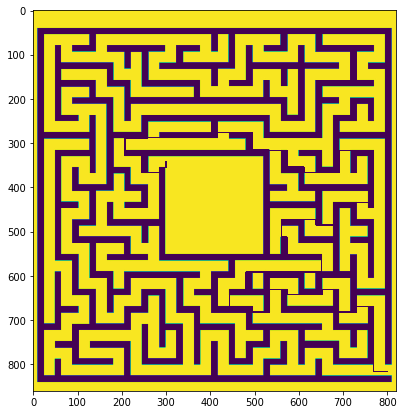

In [28]:
plt.figure(figsize = (7,7))
plt.imshow(hard_maze)
plt.show()